In [2]:
data = snap.pp.import_fragments(
    "/mnt/claw-raid/elliot/P002_mtscATAC-seq/data/raw/brain_epilepsy/data/outs/fragments.tsv.gz",
    chrom_sizes=snap.genome.hg38,  
    sorted_by_barcode=False,
)
data          

AnnData object with n_obs × n_vars = 4824 × 0
    obs: 'n_fragment', 'frac_dup', 'frac_mito'
    uns: 'reference_sequences'
    obsm: 'fragment_paired'

In [2]:


import snapatac2 as snap
import scanpy as sc
import anndata as ad
import numpy as np
import pandas as pd
import umap
import scvi
import nbformat as nbf

In [ ]:
## Bit of extra information:
'''
1. Nucleosome-Free Region (NFR): The majority of fragments are short, typically around 80-300 base pairs (bp) in length. 
These short fragments represent regions of open chromatin where DNA is relatively accessible and not bound to nucleosomes. 
These regions are often referred to as nucleosome-free regions (NFRs) and correspond to regions of active transcriptional 
regulation.

2. Mono-Nucleosome Peaks: There is often a peak in the fragment size distribution at around 147-200 bp, 
which corresponds to the size of a single nucleosome wrapped DNA. These fragments result from the 
cutting of DNA by the transposase enzyme when it encounters a nucleosome, 
causing the DNA to be protected and resulting in fragments of the same size.

3. Di-Nucleosome Peaks: In addition to the mono-nucleosome peak, you may also observe 
a smaller peak at approximately 300-400 bp, corresponding to di-nucleosome fragments. 
These fragments occur when transposase cuts the DNA between two neighboring nucleosomes.

4. Large Fragments: Some larger fragments, greater than 500 bp in size, may be observed. 
These fragments can result from various sources, such as the presence of 
longer stretches of open chromatin or technical artifacts.
'''

#Idk why this isn't wokring something to do with chrome wtf

snap.pl.frag_size_distr(data, interactive=False)

ValueError: 
Image export using the "kaleido" engine requires the Kaleido package,
which can be installed using pip:

    $ pip install --upgrade kaleido


In [3]:
## Same plot with axis to log scale
fig = snap.pl.frag_size_distr(data, show=False)
fig.update_yaxes(type="log")
fig.show()

2026-05-20 13:24:25 - INFO - Computing fragment size distribution...


In [4]:
## TSS enrichment implies there is an increased accessibility or fragmentation of chromatin around the TSS
## Often indicative of promoter regions
snap.metrics.tsse(data, snap.genome.hg38)

In [5]:
## To identify usable/high-quality cells, we can plot TSSe scores against number of unique fragments for each cell.
snap.pl.tsse(data, interactive=True)
data
##The cells in the upper right represent valid or high-quality cells, whereas those in the lower left represent low-quality 
# cells or empty droplets. Based on this plot, 
#we decided to set a minimum TSS enrichment of 10 and a minimum number of fragments of 5,000 to filter the cells.

AnnData object with n_obs × n_vars = 4824 × 0
    obs: 'n_fragment', 'frac_dup', 'frac_mito', 'tsse'
    uns: 'reference_sequences', 'frag_size_distr', 'library_tsse', 'frac_overlap_TSS', 'TSS_profile'
    obsm: 'fragment_paired'

In [6]:
## OprionL - Filtering cells here results in fewer mitochondrial variants deteced
snap.pp.filter_cells(data, min_counts=1000, min_tsse=10, max_counts=100000)
data

AnnData object with n_obs × n_vars = 3507 × 0
    obs: 'n_fragment', 'frac_dup', 'frac_mito', 'tsse'
    uns: 'reference_sequences', 'frag_size_distr', 'library_tsse', 'frac_overlap_TSS', 'TSS_profile'
    obsm: 'fragment_paired'

In [7]:
## Cell by bin matrix containng insertion counts across 500bp bins across the genome
snap.pp.add_tile_matrix(data)

In [8]:
## Feature selection, which will be stored in data.var['selected'] this is particularly relevant for scrublet and spectral
## Selects most accessible features 
## n_features determines number of features, experiment with n_features to find the optimal number for your dataset
snap.pp.select_features(data, n_features=250000)

2026-05-20 13:25:46 - INFO - Selected 250000 features.


In [9]:

## Scrublet is used to remove potential dublets. It will assign probabilities to each cell, and then we can filter
snap.pp.scrublet(data)
#snap.pp.scrublet(data)
snap.pp.filter_doublets(data)
data

2026-05-20 13:25:48 - INFO - Simulating doublets...
2026-05-20 13:25:50 - INFO - Spectral embedding ...
2026-05-20 13:30:38 - INFO - Calculating doublet scores...
2026-05-20 13:30:42 - INFO - Detected doublet rate = 4.591%


AnnData object with n_obs × n_vars = 3346 × 6062095
    obs: 'n_fragment', 'frac_dup', 'frac_mito', 'tsse', 'doublet_probability', 'doublet_score'
    var: 'count', 'selected'
    uns: 'reference_sequences', 'frag_size_distr', 'library_tsse', 'frac_overlap_TSS', 'TSS_profile', 'scrublet_sim_doublet_score', 'doublet_rate'
    obsm: 'fragment_paired'

In [10]:
## Spectral embedding is used for dimensionality reduction
## Stored in data.obsm['X_spectral']
snap.tl.spectral(data)
snap.tl.umap(data)

/home/elliot/miniconda3/envs/atac_env190516/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


In [11]:
## Perform graph based clustering, build k-nearest neighbour graph then use leiden algorithm to identify clusters
snap.pp.knn(data)
snap.tl.leiden(data, resolution=0.8)  # Adjust resolution for more or fewer clusters

In [12]:
snap.pl.umap(data, color='leiden', interactive=True, height=500)

In [18]:
leiden_to_celltype = {
    "0": "Oligos",
    "1": "HomeoMcg",
    "2": "InflamMcg",
    "3": "HomeoMcg",
    "4": "InflamMcg",
    "5": "T_cells",
    "6": "InflamMcg",
    "7" :"PVMs",
    # add more as needed
}

data.obs["cell type"] = data.obs["leiden"].map(leiden_to_celltype)


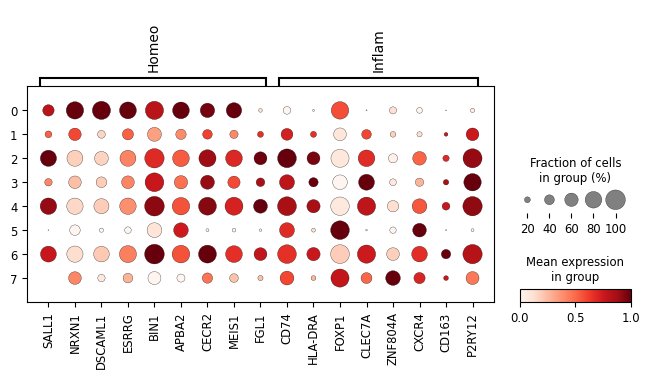

In [127]:
marker_genes = {
    'Homeo': ['SALL1', 'NRXN1', 'DSCAML1', 'ESRRG', 'BIN1', 'APBA2','CECR2', 'MEIS1', 'FGL1'],
    'Inflam': ['CD74', 'HLA-DRA', 'FOXP1', 'CLEC7A', 'ZNF804A', 'CXCR4', 'CD163', 'P2RY12']
}
sc.pl.dotplot(gene_matrix, var_names=marker_genes, groupby='leiden', standard_scale='var')

In [23]:
#write object
data.write_h5ad("/mnt/claw-raid/elliot/P002_mtscATAC-seq/data/processed/atac_surg_Ctx/atac_surg_ctx_anndata.h5ad")

... storing 'cell type' as categorical


In [19]:
data

AnnData object with n_obs × n_vars = 3346 × 6062095
    obs: 'n_fragment', 'frac_dup', 'frac_mito', 'tsse', 'doublet_probability', 'doublet_score', 'leiden', 'cell type'
    var: 'count', 'selected'
    uns: 'reference_sequences', 'frag_size_distr', 'library_tsse', 'frac_overlap_TSS', 'TSS_profile', 'scrublet_sim_doublet_score', 'doublet_rate', 'spectral_eigenvalue'
    obsm: 'fragment_paired', 'X_spectral', 'X_umap'
    obsp: 'distances'

In [2]:
#load anndata object with cell type annotations 
data = snap.read("/mnt/claw-raid/elliot/P002_mtscATAC-seq/data/processed/atac_surg_Ctx/atac_surg_ctx_anndata.h5ad")


In [4]:
(data.obs["leiden"] == "5").sum()


329

In [5]:
#save peak matrix 
peak_mat.write_h5ad("/mnt/claw-raid/elliot/P002_mtscATAC-seq/data/processed/atac_surg_Ctx/atac_surg_ctx_peakmatrix.h5ad")

... storing 'leiden' as categorical
... storing 'cell type' as categorical


In [15]:
peak_mat = ad.read("/mnt/claw-raid/elliot/P002_mtscATAC-seq/data/processed/atac_surg_Ctx/atac_surg_ctx_peakmatrix.h5ad")

/home/elliot/miniconda3/envs/atac_env190516/lib/python3.10/site-packages/anndata/__init__.py:42: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


In [ ]:
#Get peaks using MACS3, which will be stored in data.uns['macs3']
snap.tl.macs3(data, groupby='leiden')
#Create a unified, non-overlapping, and fixed-width peak list 
peaks = snap.tl.merge_peaks(data.uns['macs3'], snap.genome.hg38)
peaks.head()
#Creating a peak matrix
peak_mat = snap.pp.make_peak_matrix(data, use_rep=peaks['Peaks'])
peak_mat

2026-05-20 11:31:47 - INFO - Exporting fragments...
2026-05-20 11:32:26 - INFO - Calling peaks...
100%|██████████| 5/5 [14:18<00:00, 171.72s/it]
/home/elliot/miniconda3/envs/atac_env190516/lib/python3.10/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


AnnData object with n_obs × n_vars = 3346 × 196571
    obs: 'n_fragment', 'frac_dup', 'frac_mito', 'tsse', 'doublet_probability', 'doublet_score', 'leiden', 'cell type'

In [24]:
#Regression-based differeintail test, accounts for variation across cells
#First, select peaks present in two cell types
group1 = "InflamMcg"
group2 = "HomeoMcg"
InflamMcg = data.obs['cell type'] == group1
HomeoMcg = data.obs['cell type'] == group2
peaks_selected = np.logical_or(
    peaks[group1].to_numpy(),
    peaks[group2].to_numpy(),
)
#Then, perform differential test
diff_peaks = snap.tl.diff_test(
    peak_mat,
    cell_group1=InflamMcg,
    cell_group2=HomeoMcg,
    features=peaks_selected,
)
#Filter results based on adjusted P

2026-05-20 14:02:06 - INFO - Input contains 132150 features, now perform filtering with 'min_log_fc = 0.25' and 'min_pct = 0.05' ...
2026-05-20 14:02:31 - INFO - Testing 48680 features ...
100%|██████████| 48680/48680 [19:52<00:00, 40.83it/s]


In [29]:
#save differential peaks 
diff_peaks.write_csv("/mnt/claw-raid/elliot/P002_mtscATAC-seq/data/processed/atac_surg_Ctx/atac_surg_ctx_diff_peaks.csv")

In [3]:
import polars as pl

In [4]:
diff_peaks = pl.read_csv("/mnt/claw-raid/elliot/P002_mtscATAC-seq/data/processed/atac_surg_Ctx/atac_surg_ctx_diff_peaks.csv")

In [4]:
#extract peak information into a dataframe "peaks"
peaks = diff_peaks.with_columns(
    pl.col("feature name").str.extract(r"^(chr[^:]+):(\d+)-(\d+)$", 1).alias("chrom"),
    pl.col("feature name").str.extract(r"^(chr[^:]+):(\d+)-(\d+)$", 2).cast(pl.Int64).alias("start"),
    pl.col("feature name").str.extract(r"^(chr[^:]+):(\d+)-(\d+)$", 3).cast(pl.Int64).alias("end"),
).select([
    pl.col("feature name").alias("peak_id"),
    "chrom", "start", "end",
    pl.col("log2(fold_change)").alias("log2FC"),
    pl.col("p-value").alias("pval"),
    pl.col("adjusted p-value").alias("padj"),
])

In [5]:
#extract annotation data from genome into dataframe "genes"
import pandas as pd

anno = snap.genome.hg38.annotation

ann_df = pd.read_csv(
    anno,
    sep="\t",
    comment="#",
    header=None,
    names=["chrom","source","type","start","end","score","strand","phase","attr"]
)

genes = ann_df[ann_df["type"] == "gene"].copy()
genes["gene_name"] = genes["attr"].str.extract(r"gene_name=([^;]+)")
genes = genes[["chrom", "start", "end", "gene_name"]]
genes

,chrom,start,end,gene_name
0,chr1,11869,14409,DDX11L1
12,chr1,14404,29570,WASH7P
25,chr1,17369,17436,MIR6859-1
28,chr1,29554,31109,MIR1302-2HG
36,chr1,30366,30503,MIR1302-2
...,...,...,...,...
1966610,chrM,14149,14673,MT-ND6
1966615,chrM,14674,14742,MT-TE
1966618,chrM,14747,15887,MT-CYB
1966623,chrM,15888,15953,MT-TT


In [6]:
#checks whether each peak overlaps any gene --> assigns first ovelapping gene name, very rough no TSS stuff, no labelling of truly intergenic peaks, just a simple overlap
#Problem is , two peaks can be mapped to one gene leading to duplicates on the colano plot
peaks_df = peaks.to_pandas()
peaks_df["gene_name"] = None

for chrom in peaks_df["chrom"].unique():
    p = peaks_df["chrom"] == chrom
    g = genes["chrom"] == chrom
    if g.any():
        genes_chr = genes[g]
        for i in peaks_df.loc[p].index:
            hit = genes_chr[
                (genes_chr["start"] <= peaks_df.at[i, "end"]) &
                (genes_chr["end"] >= peaks_df.at[i, "start"])
            ]
            if len(hit):
                peaks_df.at[i, "gene_name"] = hit["gene_name"].iloc[0]

NameError: name 'peaks' is not defined

In [ ]:
#map back to differential peaks dataframe
diff_peaks = diff_peaks.join(pl.from_pandas(peaks_df[["peak_id", "gene_name"]]).rename({"peak_id": "feature name"}), on="feature name", how="left")

In [ ]:
import polars as pl
import numpy as np

# thresholds
fc_thresh_log2 = np.log2(1.5)   # |log2FC| > 1.5
p_thresh       = 0.05

fc_col   = "log2(fold_change)"
p_col    = "adjusted p-value"
gene_col = "gene_name"

# significant peaks with |log2FC| > 1.5
sig = diff_peaks.filter(
    (pl.col(p_col) < p_thresh) &
    (pl.col(fc_col).abs() > fc_thresh_log2)
)

# top 100 upregulated genes (as a list)
top_up_100 = (
    sig
    .filter(pl.col(fc_col) > 0)
    .sort(fc_col, descending=True)
    .select(gene_col)
    .head(200)[gene_col]
    .to_list()
)

# top 100 downregulated genes (as a list)
top_down_100 = (
    sig
    .filter(pl.col(fc_col) < 0)
    .sort(fc_col, descending=False)
    .select(gene_col)
    .head(200)[gene_col]
    .to_list()
)

print("\nTop 100 upregulated genes:")
print(top_up_100)

print("\nTop 100 downregulated genes:")
print(top_down_100)

# --- write CSV of all sig DEGs for pasting ---
up_df = (
    sig
    .filter(pl.col(fc_col) > 0)
    .sort(fc_col, descending=True)
    .with_columns(pl.lit("upregulated_clusterA").alias("direction"))
    .with_row_index("rank", offset=1)
)

down_df = (
    sig
    .filter(pl.col(fc_col) < 0)
    .sort(fc_col, descending=False)
    .with_columns(pl.lit("upregulated_clusterB").alias("direction"))
    .with_row_index("rank", offset=1)
)

degs_csv = pl.concat([up_df, down_df])
degs_csv.write_csv("/mnt/claw-raid/elliot/P002_mtscATAC-seq/MitoDriftMaster/microgliaPM_degs.csv")
print(f"\nCSV written: {len(degs_csv)} significant DEGs ({len(up_df)} up in A, {len(down_df)} up in B)")


Top 100 upregulated genes:
['AGRN', 'SMPD5', 'ANKMY1', 'SPATS2L', 'WRAP73', 'FOXK2', 'MIA3', 'EFEMP2', 'ZBTB46', None, None, 'RHOU', 'AKT1', 'ME3', 'NKD2', 'STAT5B', 'LRP3', 'ENSG00000285708', 'MUC20-OT1', 'DOCK3', 'SETD2', 'AGO2', None, 'FURIN', 'SPEG', 'CKAP4', 'LRP3', 'SSBP2', 'TTC34', 'EGFL7', 'CSGALNACT1', None, 'IQSEC2', 'CSNK2A2', 'EGFL7', 'FJX1', 'VGLL4', 'TRIB3', 'COL2A1', 'MYO1E', 'TSPAN9', 'SLC29A4', 'CERS2', 'TRIM47', 'ZXDA', 'CBFA2T3', 'ENSG00000284776', 'RNF175', 'BASP1', 'MTA3', 'SOBP', 'KDM5B', 'PXK', 'GPR68', 'BCOR', 'NCK2', 'PGAP6', 'SLC22A17', 'TMEM54', 'GNAQ', 'LRP5', None, None, 'CDH23', 'CISD3', 'TXNRD2', 'ADNP2', 'LORICRIN', None, 'ABCA2', 'SCMH1', 'MAZ', 'ZBTB47-AS1', 'SRPK2', 'TPRA1', 'DNAJC25-GNG10', 'CIB2', 'SLC23A2', 'NFIC', 'NOL4L', 'NOTCH2', 'A3GALT2', 'SATB1', 'TULP4', 'TLE5', 'AKIRIN1', 'CTBP2', None, 'BRF1', 'GPRIN1', 'PRDM2', 'GSPT1', 'LRRC20', 'LAMC1', 'TMEM121', None, 'NCOA6', None, 'ENAH', 'ZNF276', 'IRS2', 'CRACD', 'ECHDC2', 'ALDH1A3-AS1', 'ENSG00

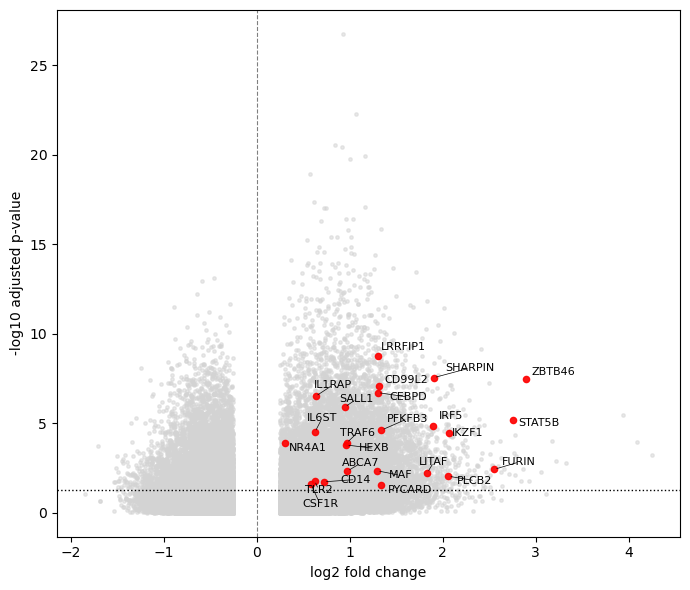

In [15]:
#this tries to get over the problem by picking the most significant peak, but is still bullshit 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from adjustText import adjust_text

genes_to_label = [
    "HLA-DRA","HLA-DRB1", "HLA-DPB1", "CD11b", "CD45", "CD14", "CD16", "CD64", "CCR2", "CX3CR1", "CD68", "CD206", "PU.1", "MYC", "CD11c", "IRF4", "CSF1R", "P2RY12", "TMEM119", "SALL1", "F4/80", "c-kit", "FCRLS",
     "ZBTB46", "IRF5", "CEBPD", "IKZF1", "MAF", "NR4A1", "TLR2", "TRAF6", "PYCARD", "SHARPIN", "LITAF", "IL1RAP", "IL6ST", "STAT5B", "CD99L2", "FURIN", "PLCB2", "HEXB", "ABCA7", "PFKFB3", "LRRFIP1"   
]

df = diff_peaks.to_pandas().copy()
df["gene_name"] = df["gene_name"].astype("string")
df["neglog10padj"] = -np.log10(df["adjusted p-value"].replace(0, np.nextafter(0, 1)))

cutoff = -np.log10(0.05)

lab = df[
    df["gene_name"].isin(genes_to_label) &
    (df["adjusted p-value"] < 0.05)
].copy()

lab = lab.loc[lab.groupby("gene_name")["adjusted p-value"].idxmin()].copy()

fig, ax = plt.subplots(figsize=(7, 6))
ax.scatter(df["log2(fold_change)"], df["neglog10padj"], s=6, c="lightgrey", alpha=0.5)
ax.scatter(lab["log2(fold_change)"], lab["neglog10padj"], s=20, c="red", alpha=0.9)
ax.axhline(cutoff, color="black", linestyle=":", linewidth=1)
ax.axvline(0, color="black", linestyle="--", linewidth=0.8, alpha=0.5)

texts = []
for _, r in lab.iterrows():
    texts.append(
        ax.text(
            r["log2(fold_change)"],
            r["neglog10padj"],
            r["gene_name"],
            fontsize=8
        )
    )

adjust_text(
    texts,
    ax=ax,
    arrowprops=dict(arrowstyle="-", color="black", lw=0.5),
    expand_points=(1.2, 1.2),
    expand_text=(1.2, 1.2)
)

ax.set_xlabel("log2 fold change")
ax.set_ylabel("-log10 adjusted p-value")
plt.tight_layout()
plt.show()

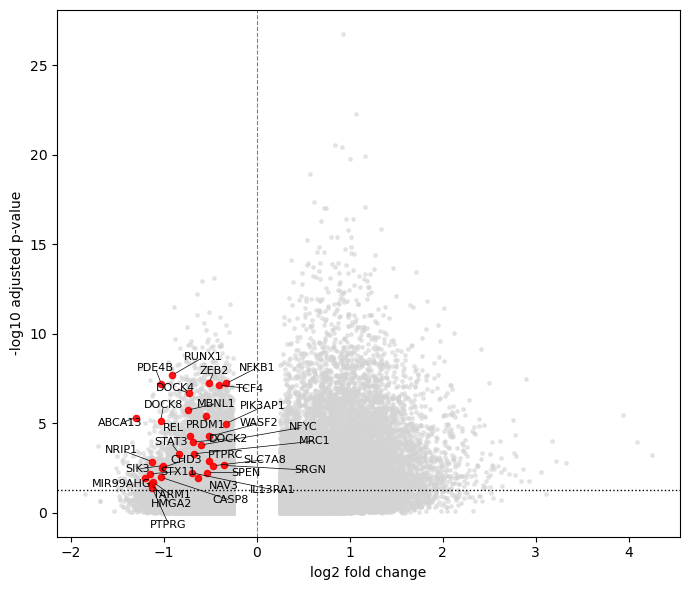

In [20]:
#this tries to get over the problem by picking the most significant peak, but is still bullshit 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from adjustText import adjust_text

genes_to_label = [
 "ABCA13", "MBNL1", "MIR99AHG", "REL", "SRGN", "STX11", "WASF2", "HMGA2", "NRIP1", "PTPRG", "TARM1", "NFYC", "TCF4", "PRDM1", "DOCK8", "CASP8", "PDE4B", "PIK3AP1", "CHD3", "SIK3", "SPEN", "RUNX1", "NAV3", "STAT3", "ZEB2", "DOCK4", "IL13RA1", "DOCK2", "SLC7A8", "MRC1", "NFKB1", "PTPRC"]

df = diff_peaks.to_pandas().copy()
df["gene_name"] = df["gene_name"].astype("string")
df["neglog10padj"] = -np.log10(df["adjusted p-value"].replace(0, np.nextafter(0, 1)))

cutoff = -np.log10(0.05)

lab = df[
    df["gene_name"].isin(genes_to_label) &
    (df["adjusted p-value"] < 0.05)
].copy()

lab = lab.loc[lab.groupby("gene_name")["adjusted p-value"].idxmin()].copy()

fig, ax = plt.subplots(figsize=(7, 6))
ax.scatter(df["log2(fold_change)"], df["neglog10padj"], s=6, c="lightgrey", alpha=0.5)
ax.scatter(lab["log2(fold_change)"], lab["neglog10padj"], s=20, c="red", alpha=0.9)
ax.axhline(cutoff, color="black", linestyle=":", linewidth=1)
ax.axvline(0, color="black", linestyle="--", linewidth=0.8, alpha=0.5)

texts = []
for _, r in lab.iterrows():
    texts.append(
        ax.text(
            r["log2(fold_change)"],
            r["neglog10padj"],
            r["gene_name"],
            fontsize=8
        )
    )

adjust_text(
    texts,
    ax=ax,
    arrowprops=dict(arrowstyle="-", color="black", lw=0.5),
    expand_points=(1.2, 1.2),
    expand_text=(1.2, 1.2)
)

ax.set_xlabel("log2 fold change")
ax.set_ylabel("-log10 adjusted p-value")
plt.tight_layout()
plt.show()

In [35]:
import csv
from pathlib import Path

csv_path = Path("/mnt/claw-raid/elliot/P002_mtscATAC-seq/MitoDrift/CatRun210526_copy/tissue_mitodrift_df_combined.csv")

def norm_barcode(s):
    s = str(s)
    if s.startswith(("H_", "P_")):
        s = s[2:]
    return s

# build the 59-cell cluster 7 target set
cluster7 = {norm_barcode(x) for x, lev in zip(data.obs_names, data.obs["leiden"].to_list()) if str(lev) == "7"}

rows = []
matched = 0
matched_cells = []

with csv_path.open("r", newline="") as f:
    reader = csv.DictReader(f)
    fieldnames = reader.fieldnames
    for row in reader:
        cell = row["cell"]
        if cell.startswith("H_") and norm_barcode(cell) in cluster7:
            row["annot"] = "Mystery?"
            matched += 1
            matched_cells.append(cell)
        rows.append(row)

with csv_path.open("w", newline="") as f:
    writer = csv.DictWriter(f, fieldnames=fieldnames)
    writer.writeheader()
    writer.writerows(rows)

print("cluster7 target =", len(cluster7))
print("matched in csv =", matched)
print("first 10 matched =", matched_cells[:10])


cluster7 target = 59
matched in csv = 10
first 10 matched = ['H_AATACGCTCCGATGCG-1', 'H_TACCTCGGTTAGGAGC-1', 'H_TTGAGTGAGGACCGAT-1', 'H_GAGCGCTGTATCAGCT-1', 'H_GTTACTTCAGATTAAG-1', 'H_GTCACCTAGTTGAATG-1', 'H_AGCTGATGTTCTACCC-1', 'H_CACCACTCACTGATAC-1', 'H_CAACCAACAGGTAGGT-1', 'H_GGGTGTCGTTCACGTA-1']


In [3]:
#ELLIOT - lucas' Clustering done annotation begins 
## Annotate the clusters and assign them to known cell types
## Compute gene activities for each cell using pp.make_gene_matrix
gene_matrix = snap.pp.make_gene_matrix(
    data, 
    gene_anno=snap.genome.hg38,
    gene_name_key='gene_name'  
)
# Remove version numbers from Ensembl IDs
#gene_matrix.var_names = gene_matrix.var_names.str.replace(r'\.\d+$', '', regex=True)

/home/elliot/miniconda3/envs/atac_env190516/lib/python3.10/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [12]:
sc.tl.rank_genes_groups(gene_matrix, 'leiden', method='wilcoxon')

... storing 'leiden' as categorical
... storing 'cell type' as categorical


KeyboardInterrupt: 

In [13]:
gene_matrix.obs['group'] = 'other'
inflam_clusters = ['2', '4', '6']
homeo_clusters = ['1', '3']
gene_matrix.obs.loc[gene_matrix.obs['leiden'].isin(inflam_clusters), 'group'] = 'INFLAM'
gene_matrix.obs.loc[gene_matrix.obs['leiden'].isin(homeo_clusters), 'group'] = 'HOMEO'

In [6]:
#Gene filtering, data normalisation + data transformation using Scanpy 
sc.pp.filter_genes(gene_matrix, min_cells=2)  # Filter genes expressed in fewer than 100 cells
sc.pp.normalize_total(gene_matrix)
sc.pp.log1p(gene_matrix)


SyntaxError: invalid syntax (2377289033.py, line 1)

In [7]:
# Imputation - uses MAGIC algorithm to perform imputation and data smoothing
sc.external.pp.magic(gene_matrix, solver="approximate")

In [ ]:
#DEGs for inflam old way, failed 
#sc.tl.rank_genes_groups(gene_matrix, groupby = 'group', mask_var=None, use_raw=None, groups=['INFLAM'], reference='HOMEO', n_genes=None, rankby_abs=False, pts=True, key_added=None, copy=False, method=None, corr_method='benjamini-hochberg', tie_correct=False, layer=None)
#inflam_df = sc.get.rank_genes_groups_df(gene_matrix, group = 'INFLAM', key='rank_genes_groups')

In [8]:
#copy over uap embedding to gene matrix
gene_matrix.obsm["X_umap"] = data.obsm["X_umap"]


/home/elliot/miniconda3/envs/atac_env190516/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1267: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


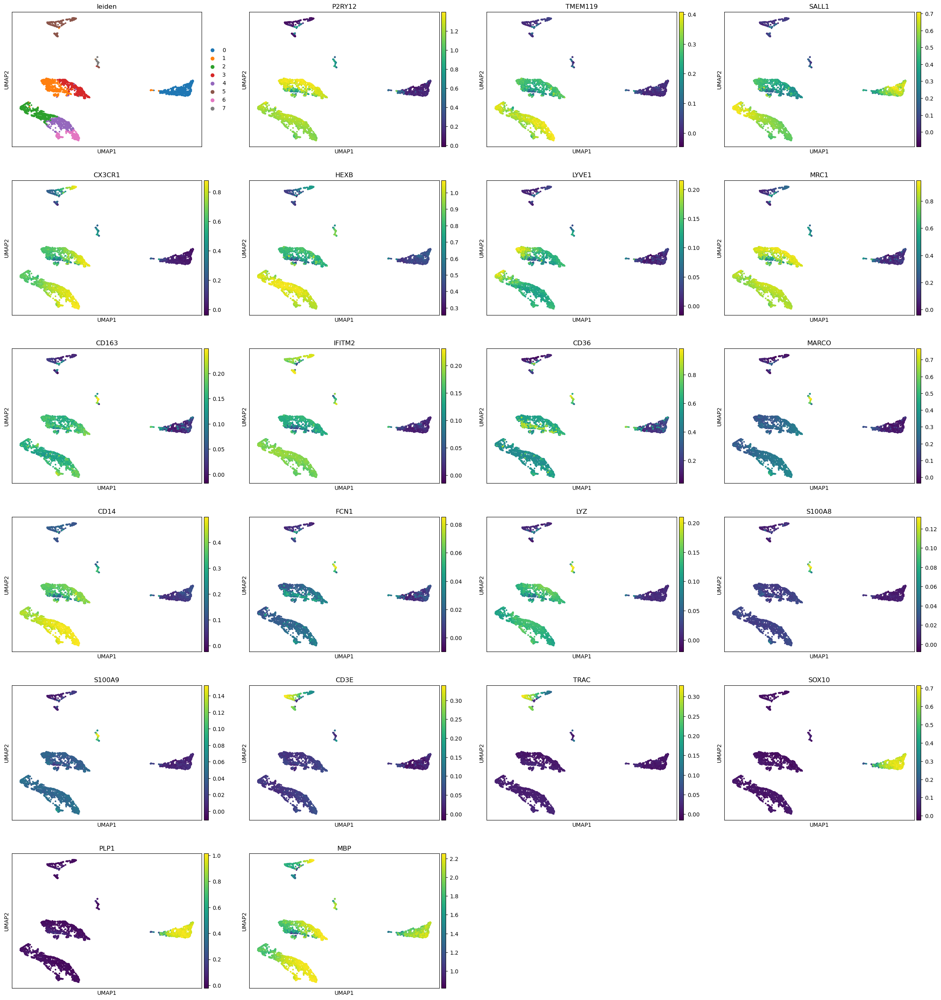

In [10]:
#plot genes on uMap
marker_genes = ['P2RY12', 'TMEM119', 'SALL1', 'CX3CR1', 'HEXB',   # resident microglia
 'LYVE1', 'MRC1', 'CD163', 'IFITM2', 'CD36', 'MARCO',       # PVM / perivascular macrophages
 'CD14', 'FCN1', 'LYZ', 'S100A8', 'S100A9',        # infiltrating monocytes/macrophages
 'CD3E', 'TRAC',                                   # T cells
 'SOX10', 'PLP1', 'MBP']                           # oligodendrocyte lineage 
sc.pl.umap(gene_matrix, use_raw=False, color=["leiden"] + marker_genes)

In [ ]:
#snap.tl.diff_test expects a sparse matrix , not a dense NumpyArray like the one produced by MAGIC imputation, so we need to convert it back to a sparse matrix format before running the differential accessibility test.
import scipy.sparse as sp

gene_matrix = gene_matrix.copy()
gene_matrix.X = sp.csr_matrix(gene_matrix.X)

In [91]:
type(gene_matrix.X)


scipy.sparse._csr.csr_matrix

In [92]:
data.obs['cell_type'].value_counts()


/tmp/ipykernel_310004/1312002513.py:1: DeprecationWarning:

`_import_from_c` is deprecated; use `_import_arrow_from_c` instead. If you are using an extension, please compile it with the latest 'pyo3-polars'



cell_type,count
cat,u32
"""TCells""",329
"""HomeoMcg""",1006
"""Oligos""",666
"""InflamMcg""",1286
"""PVMs""",59


In [ ]:
print(np.__version__)
print(snap.__version__)


2.0.2
2.8.0


NameError: name 'sys' is not defined

In [ ]:
diff_peaks = snap.tl.diff_test(
    gene_matrix,
    cell_group1=data.obs['cell_type'] == 'InflamMcg',
    cell_group2=data.obs['cell_type'] == 'HomeoMcg',
    min_log_fc=0.25,
    min_pct=0.05,
)

AttributeError: module 'snapatac2' has no attribute 'H'

In [80]:
gene_matrix.var_names

Index(['DDX11L1', 'WASH7P', 'MIR1302-2HG', 'MIR1302-2', 'ENSG00000238009',
       'CICP27', 'ENSG00000268903', 'ENSG00000269981', 'DDX11L17', 'WASH9P',
       ...
       'OFD1P15Y', 'PPP1R12BP1', 'RNU6-1314P', 'CYCSP48', 'ANKRD36P1',
       'TPTE2P4', 'CYCSP49', 'SLC25A15P1', 'PARP4P1', 'CTBP2P1'],
      dtype='object', length=57939)

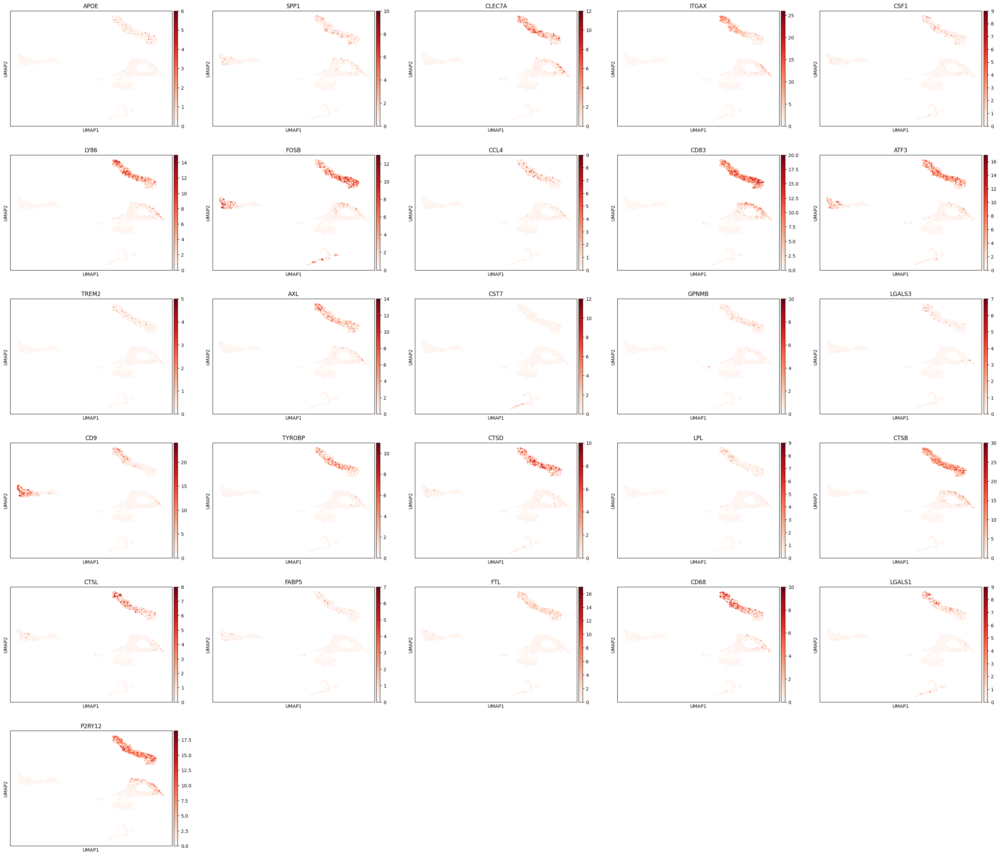

In [14]:
import matplotlib.pyplot as plt

# Copy UMAP coordinates from original data
gene_matrix.obsm['X_umap'] = data.obsm['X_umap']

# Plot all 25 DAM genes (remove cmap and ncols - not supported by snapatac2)
all_dam_genes = ['APOE', 'SPP1', 'CLEC7A', 'ITGAX', 'CSF1', 'LY86', 
                 'FOSB', 'CCL4', 'CD83', 'ATF3', 'TREM2', 'AXL', 'CST7',
                 'GPNMB', 'LGALS3', 'CD9', 'TYROBP', 'CTSD', 'LPL',
                 'CTSB', 'CTSL', 'FABP5', 'FTL', 'CD68', 'LGALS1', 'P2RY12']

# Plot one at a time or use scanpy instead
import scanpy as sc

sc.pl.umap(gene_matrix, color=all_dam_genes, cmap='Reds', ncols=5)

In [ ]:
#ELLIOT - Lucas' annotation method 
#import RNA reference data

reference = sc.read_h5ad('/mnt/claw-raid/elliot/brainvasc_ref.h5ad')
reference = reference.raw.to_adata() #mkaes sure ref is raw data also not nomrlised
reference


# Check the cell type column name in your reference
print(reference.obs.columns)  # Find which column has cell types


Index(['author_cell_type', 'cell_type_ontology_term_id', 'donor_id',
       'development_stage_ontology_term_id', 'sex_ontology_term_id',
       'disease_ontology_term_id', 'is_primary_data', 'suspension_type',
       'tissue_ontology_term_id', 'tissue_type', 'assay_ontology_term_id',
       'self_reported_ethnicity_ontology_term_id', 'cell_type', 'assay',
       'disease', 'sex', 'tissue', 'self_reported_ethnicity',
       'development_stage', 'observation_joinid'],
      dtype='object')


In [ ]:
#ELLIOT - Merge reference data and query data

# CRITICAL: Convert reference to use Ensembl IDs
reference.var_names = reference.var['ensembl_id'].values
reference.var_names_make_unique()

# Now merge
gene_matrix.obs['cell_type'] = 'Unknown'
integrated = ad.concat(  # ← Fixed typo: intergrated → integrated
    [reference, gene_matrix],
    join='inner',
    label='batch',
    keys=["reference", "query"],
    index_unique='_',
)

print(f"Combined shape: {integrated.shape}")

Combined shape: (66691, 30704)


In [16]:
# scanpy finds highly variable genes (batch correction)
#if you ask callum he will say this is shit because this is porabbly just to make it faster
sc.pp.filter_genes(integrated, min_cells=5)
#find hvg
sc.pp.highly_variable_genes(
    integrated,
    n_top_genes = 5000,
    flavor="seurat_v3",
    batch_key="batch",
    subset=True
)

In [17]:
#set up machine learning 
scvi.model.SCVI.setup_anndata(integrated, batch_key="batch")
vae = scvi.model.SCVI(
    integrated,
    n_layers=2,
    n_latent=30,
    gene_likelihood="nb",
    dispersion="gene-batch",
)

2025-11-22 15:52:09 - INFO - Unable to initialize backend 'cuda': 
2025-11-22 15:52:09 - INFO - Unable to initialize backend 'rocm': module 'jaxlib.xla_extension' has no attribute 'GpuAllocatorConfig'
2025-11-22 15:52:09 - INFO - Unable to initialize backend 'tpu': INTERNAL: Failed to open libtpu.so: libtpu.so: cannot open shared object file: No such file or directory


In [18]:
#pretraining model?
vae.train(max_epochs=100, early_stopping=True, enable_progress_bar=True)
#if it's taking forever, maybe subset your ref dataset or uncrease that batch size


/home/elliot/miniconda3/envs/atac_env/lib/python3.9/site-packages/lightning/fabric/plugins/environments/slurm.py:204: PossibleUserWarning:

The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/elliot/miniconda3/envs/atac_env/lib/python3.9/ ...

INFO: GPU available: False, used: False
2025-11-22 15:52:17 - INFO - GPU available: False, used: False
INFO: TPU available: False, using: 0 TPU cores
2025-11-22 15:52:17 - INFO - TPU available: False, using: 0 TPU cores
/home/elliot/miniconda3/envs/atac_env/lib/python3.9/site-packages/lightning/fabric/plugins/environments/slurm.py:204: PossibleUserWarning:

The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/elliot/miniconda3/envs/atac_env/lib/python3.9/ ...

/home/elliot/miniconda3/en

Epoch 100/100: 100%|██████████| 100/100 [17:50<00:00, 10.61s/it, v_num=1, train_loss_step=971, train_loss_epoch=1e+3]     

INFO: `Trainer.fit` stopped: `max_epochs=100` reached.
2025-11-22 16:10:07 - INFO - `Trainer.fit` stopped: `max_epochs=100` reached.


Epoch 100/100: 100%|██████████| 100/100 [17:50<00:00, 10.70s/it, v_num=1, train_loss_step=971, train_loss_epoch=1e+3]


<Axes: xlabel='epoch'>

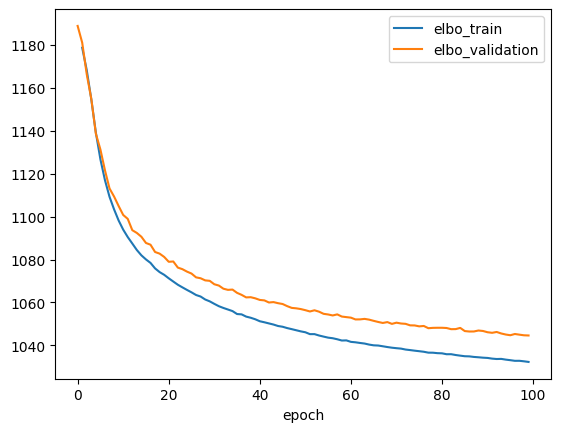

In [19]:
#plot training model to make sure it has converged 
ax = vae.history['elbo_train'][1:].plot()
vae.history['elbo_validation'].plot(ax=ax)


In [20]:
#setting up training model, check the 'class' or quivalent column is presetn in the refernce an merged object 
integrated.obs["celltype_scanvi"] = 'Unknown'
ref_idx = integrated.obs['batch'] == "reference"
integrated.obs.loc[ref_idx, "celltype_scanvi"] = integrated.obs.loc[ref_idx, 'cell_type'].astype(str) 


In [21]:
#who knows what this does maybe callum 
lvae = scvi.model.SCANVI.from_scvi_model(
    vae,
    adata=integrated,
    labels_key="celltype_scanvi",
    unlabeled_category="Unknown",
)

In [22]:
lvae.train(max_epochs=100, n_samples_per_label=100, early_stopping=True)

INFO     Training for 100 epochs.                                                                                  


/home/elliot/miniconda3/envs/atac_env/lib/python3.9/site-packages/lightning/fabric/plugins/environments/slurm.py:204: PossibleUserWarning:

The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/elliot/miniconda3/envs/atac_env/lib/python3.9/ ...

INFO: GPU available: False, used: False
2025-11-22 16:10:43 - INFO - GPU available: False, used: False
INFO: TPU available: False, using: 0 TPU cores
2025-11-22 16:10:43 - INFO - TPU available: False, using: 0 TPU cores
/home/elliot/miniconda3/envs/atac_env/lib/python3.9/site-packages/lightning/fabric/plugins/environments/slurm.py:204: PossibleUserWarning:

The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/elliot/miniconda3/envs/atac_env/lib/python3.9/ ...

/home/elliot/miniconda3/en

Epoch 100/100: 100%|██████████| 100/100 [41:59<00:00, 25.22s/it, v_num=1, train_loss_step=972, train_loss_epoch=999]    

INFO: `Trainer.fit` stopped: `max_epochs=100` reached.
2025-11-22 16:52:43 - INFO - `Trainer.fit` stopped: `max_epochs=100` reached.


Epoch 100/100: 100%|██████████| 100/100 [41:59<00:00, 25.19s/it, v_num=1, train_loss_step=972, train_loss_epoch=999]


<Axes: xlabel='epoch'>

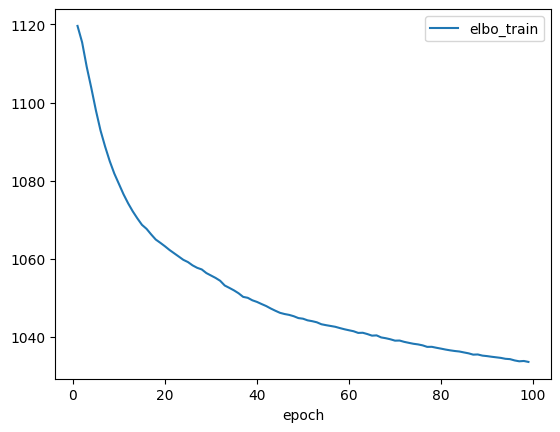

In [23]:
#plotting history as normal (if not saved)
lvae.history['elbo_train'][1:].plot()


In [24]:
# Now you can use the model
integrated.obs["C_scANVI"] = lvae.predict()
integrated.obsm["X_scANVI"] = lvae.get_latent_representation()

In [25]:
#generating uMAP
sc.pp.neighbors(integrated, use_rep="X_scANVI")
sc.tl.umap(integrated)

... storing 'cell_type' as categorical
... storing 'celltype_scanvi' as categorical
... storing 'C_scANVI' as categorical


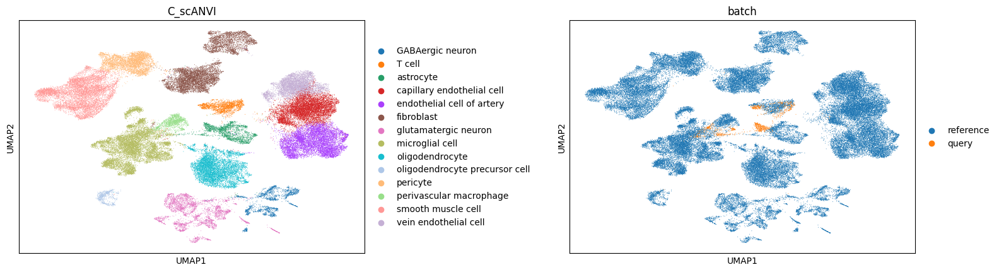

In [26]:
#Plotting uMAP querey and reference
sc.pl.umap(integrated, color=['C_scANVI', "batch"], wspace=0.45)


In [27]:
# Transfer predicted cell types back to original SnapATAC2 object
data.obs['cell_type'] = integrated.obs.loc[data.obs_names + '_query', 'C_scANVI'].to_numpy()

... storing 'leiden' as categorical
... storing 'cell_type' as categorical


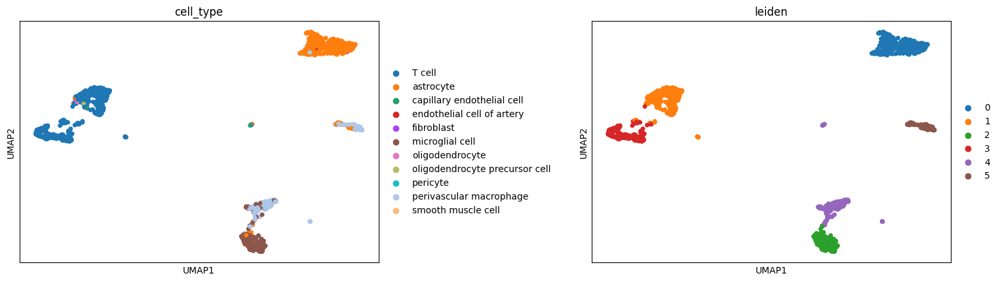

In [28]:
sc.pl.umap(data  , color=['cell_type', "leiden"], wspace=0.45)


In [ ]:
#Elliot - mkaing a DEGs list actually, gene_matrix is an object NOT an acutal matrix 

# Get the number of top genes (should be 20 based on your plot)
n_genes = len(gene_matrix.uns['rank_genes_groups']['names'])

# Create a dictionary with DEG lists for each cluster
deg_lists = {}
for i in range(n_genes):
    for j, cluster in enumerate(gene_matrix.uns['rank_genes_groups']['names'].dtype.names):
        if cluster not in deg_lists:
            deg_lists[cluster] = []
        deg_lists[cluster].append(gene_matrix.uns['rank_genes_groups']['names'][i][j])

# Now deg_lists contains clean lists of top DEGs for each cluster
for cluster, genes in deg_lists.items():
    print(f"Cluster {cluster}: {genes[:20]}...")  # Show first 5 genes

Cluster 0: ['LRP1B', 'GRID2', 'ENSG00000231918', 'CNTN5', 'CNTNAP2', 'DPP10', 'ENSG00000251574', 'EYS', 'ROBO2', 'ERBB4', 'DMD', 'NAALADL2', 'CSMD3', 'ENSG00000254394', 'CDH18', 'RBMS3', 'ROBO1', 'ENSG00000248752', 'SPAG16', 'CADM2']...
Cluster 1: ['PELATON', 'CDH23', 'ENSG00000285565', 'RAD51B', 'PSAP', 'DAPK1', 'SLC24A4', 'PGS1', 'ENSG00000234261', 'PFKFB3', 'ZMIZ1', 'ENSG00000273112', 'HSPD1', 'MGAT1', 'BAG3', 'MBP', 'HSPH1', 'ENSG00000285016', 'DNAJB6', 'XYLT1']...
Cluster 2: ['ENSG00000234261', 'LINC00877', 'SCIRT', 'ENSG00000258137', 'HK2', 'JARID2', 'ZMIZ1', 'ENSG00000258086', 'CUX1', 'PRKAG2', 'RBM47', 'RIN2', 'SLCO3A1', 'GAS7', 'RFX2', 'NCOR2', 'TIMP2', 'ENSG00000289728', 'DMXL2', 'FNDC3B']...
Cluster 3: ['HK2', 'CUX1', 'FNDC3B', 'RUNX1', 'PRKAG2', 'MAML3', 'JARID2', 'ASAP1', 'ENSG00000289728', 'DOCK5', 'ENSG00000259345', 'SLCO3A1', 'RPTOR', 'SLC24A4', 'ENSG00000286022', 'IGF2BP2', 'DOCK2', 'PPARG', 'LUCAT1', 'NIBAN2']...
Cluster 4: ['BCL11B', 'RORA', 'RORA-AS1', 'SCML4', 'ITK

... storing 'leiden' as categorical


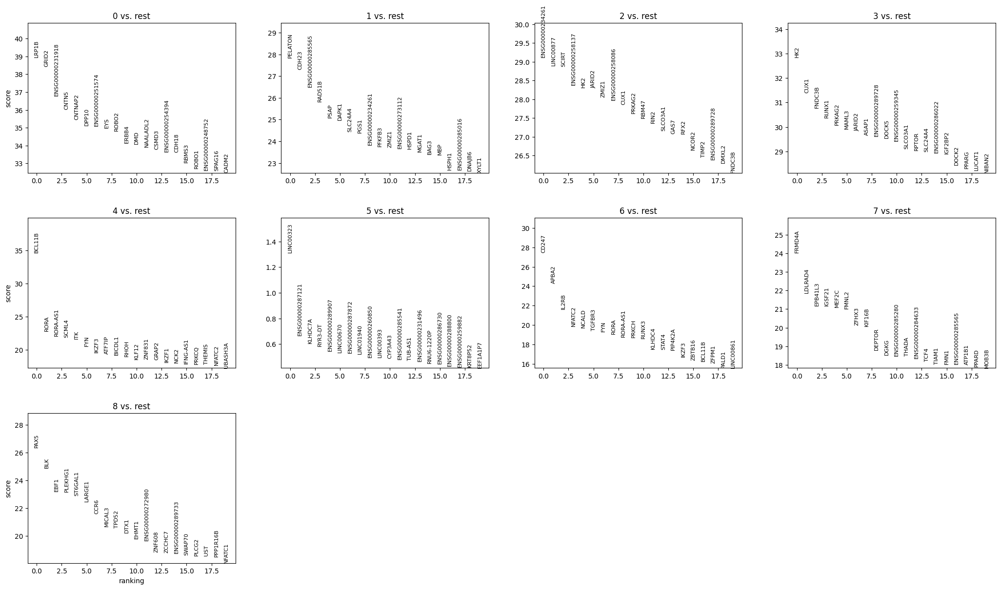

In [ ]:
# Run differential expression analysis between clusters (e.g., 'leiden' clusters)
sc.tl.rank_genes_groups(gene_matrix, groupby='leiden', method='wilcoxon')

# Show the top marker genes for each cluster
sc.pl.rank_genes_groups(gene_matrix, n_genes=20, sharey=False)



In [ ]:
# !!!!!!!!!!!!!!!!!! !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!OK SO NOW THE MT VARIANT CALLING BEGINS STOP HERE !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!

In [3]:
mgatk = ad.read_h5ad("/mnt/claw-raid/elliot/P002_mtscATAC-seq/data/processed/atac_surg_Ctx/atac_surg_ctx_mgatk.h5ad")


In [3]:
#read lastest nsapat2 object, clustered 
data = ad.read_h5ad("/mnt/claw-raid/elliot/P002_mtscATAC-seq/data/processed/atac_surg_Ctx/atac_surg_ctx_anndata.h5ad")

In [6]:
import sys
sys.path.insert(0, '/mnt/claw-raid/elliot/P002_mtscATAC-seq/scripts/Py_mTCall_tools/Py_mTCall_tools')
import variant_calling_fast as vc
mgatk = vc.process_variants_fast("/mnt/claw-raid/elliot/P002_mtscATAC-seq/data/raw/brain_epilepsy/data/mgatk_output/final", data, verbose=True, coverage_threshold=10)



=== Fast Variant Calling Pipeline ===


You'll find variant names in adata.uns['variant_names']

Find coverage PER cell in adata.obsm['coverage_per_cell']

Variant summmary stats similar to Signac are in adata.uns['variant_summary']

Variant matrices are in adata.obsm["variant_vaf"]


=== IMPORTANT NOTE ===

Remember that variant VAFs are only included if they pass the min_strand_count filter

AND the coverage threshold if specified!





Loaded counts data: (131835, 4028)
Loaded coverage data: (63287580, 3)
Identifying variants (memory-optimized chunked method)...
Processing all 98635 variant observations (no artificial limits)
Integrating with AnnData...
=== Pipeline Complete ===
Processed 3848 variants in 3303 matching cells


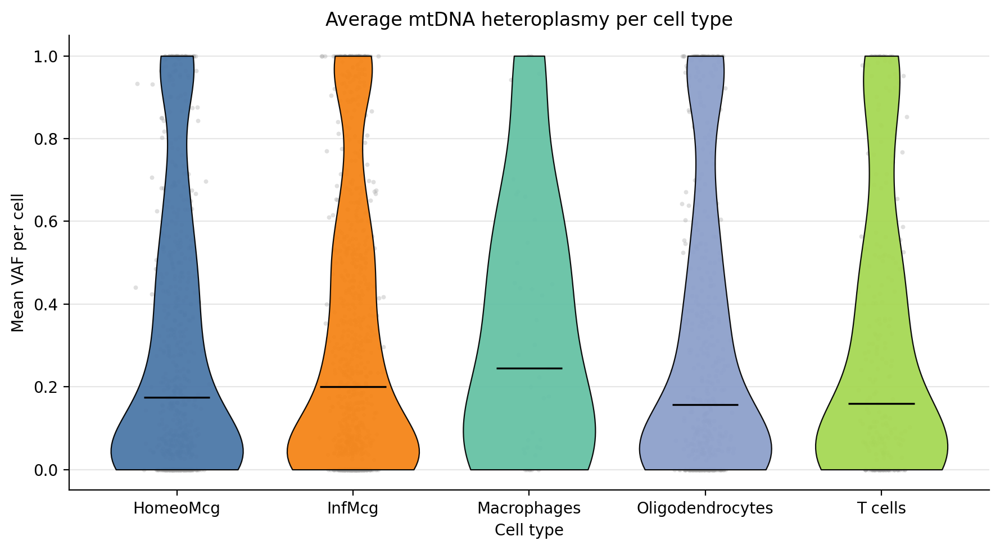

In [49]:
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

adata = mgatk

H_positions = np.array([73, 263, 750, 1438, 2706, 4769, 7028, 8860, 11719, 14766, 15326, 16519, 6776])

vaf = adata.obsm["variant_vaf"]
conf = adata.obsm["variant_confident"].astype(bool)

variant_names = np.array(adata.uns["variant_names"]).astype(str)
variant_pos = np.array([
    int(re.search(r"(\d+)", x).group(1)) if re.search(r"(\d+)", x) else np.nan
    for x in variant_names
])

keep = (~np.isnan(variant_pos)) & (~np.isin(variant_pos, H_positions))

vaf_f = vaf[:, keep]
conf_f = conf[:, keep]

mean_vaf_conf = np.divide(
    (vaf_f * conf_f).sum(axis=1),
    conf_f.sum(axis=1),
    out=np.zeros(vaf_f.shape[0], dtype=float),
    where=conf_f.sum(axis=1) > 0
)

coverage = np.asarray(adata.obsm["coverage_per_cell"])
coverage_per_cell = coverage.mean(axis=1)

leiden = adata.obs["leiden"].astype(str).values
merged = np.where(np.isin(leiden, ["2", "4", "6"]), "246",
          np.where(np.isin(leiden, ["1", "3"]), "13", leiden))

df = pd.DataFrame({
    "leiden": leiden,
    "merged": merged,
    "mean_vaf_conf_noH": mean_vaf_conf
})

df = df[coverage_per_cell >= 20].copy()

label_map = {
    "246": "InfMcg",
    "13": "HomeoMcg",
    "0": "Oligodendrocytes",
    "5": "T cells",
    "7": "Macrophages"
}
df["merged"] = df["merged"].replace(label_map)

order = ["HomeoMcg", "InfMcg"] + [x for x in sorted(df["merged"].unique(), key=lambda z: (z in ["HomeoMcg", "InfMcg"], z)) if x not in ["HomeoMcg", "InfMcg"]]
order = [x for x in order if x in df["merged"].unique()]

colors = {
    "HomeoMcg": "#4C78A8",
    "InfMcg": "#F58518",
}
fallback = plt.cm.Set2(np.linspace(0, 1, max(1, len(order))))
fallback_i = 0
for o in order:
    if o not in colors:
        colors[o] = fallback[fallback_i]
        fallback_i += 1

fig, ax = plt.subplots(figsize=(9, 5), dpi=200)
rng = np.random.default_rng(0)

for i, cl in enumerate(order, start=1):
    y = df.loc[df["merged"] == cl, "mean_vaf_conf_noH"].to_numpy(dtype=float)
    x = rng.normal(i, 0.06, size=len(y))
    ax.scatter(x, y, s=8, c="0.65", alpha=0.35, linewidths=0, zorder=1)

data = [df.loc[df["merged"] == cl, "mean_vaf_conf_noH"].to_numpy(dtype=float) for cl in order]
parts = ax.violinplot(
    data,
    positions=np.arange(1, len(order) + 1),
    widths=0.75,
    showmedians=True,
    showextrema=False
)

for body, cl in zip(parts["bodies"], order):
    body.set_facecolor(colors[cl])
    body.set_edgecolor("black")
    body.set_linewidth(0.8)
    body.set_alpha(0.95)
    body.set_zorder(2)

parts["cmedians"].set_color("black")
parts["cmedians"].set_linewidth(1.2)

ax.set_xticks(np.arange(1, len(order) + 1))
ax.set_xticklabels(order)
ax.set_xlabel("Cell type")
ax.set_ylabel("Mean VAF per cell")
ax.set_title("Average mtDNA heteroplasmy per cell type")

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.grid(axis="y", color="0.9", linewidth=0.8)
ax.set_axisbelow(True)

plt.tight_layout()
plt.show()

In [52]:
import re
import numpy as np
import pandas as pd

adata = mgatk

H_positions = np.array([73, 263, 750, 1438, 2706, 4769, 7028, 8860, 11719, 14766, 15326, 16519, 6776])

vaf = adata.obsm["variant_vaf"]
conf = adata.obsm["variant_confident"].astype(bool)
counts = adata.obsm["variant_counts"]
cov = adata.obsm["variant_coverage"]

variant_names = np.array(adata.uns["variant_names"]).astype(str)
variant_pos = np.array([
    int(re.search(r"(\d+)", x).group(1)) if re.search(r"(\d+)", x) else np.nan
    for x in variant_names
])

keep = (~np.isnan(variant_pos)) & (~np.isin(variant_pos, H_positions))

vaf_f = vaf[:, keep]
conf_f = conf[:, keep]
counts_f = counts[:, keep]
cov_f = cov[:, keep]

mean_vaf_conf = np.divide(
    (vaf_f * conf_f).sum(axis=1),
    conf_f.sum(axis=1),
    out=np.zeros(vaf_f.shape[0], dtype=float),
    where=conf_f.sum(axis=1) > 0
)

summary = pd.DataFrame({
    "n_cells": [adata.n_obs],
    "n_variants_total": [vaf.shape[1]],
    "n_variants_kept": [keep.sum()],
    "mean_vaf_mean": [float(np.nanmean(vaf_f))],
    "mean_vaf_median": [float(np.nanmedian(vaf_f))],
    "mean_vaf_conf_mean": [float(np.nanmean(mean_vaf_conf))],
    "mean_vaf_conf_median": [float(np.nanmedian(mean_vaf_conf))],
    "count_zeros": [int(np.sum(mean_vaf_conf == 0))],
    "count_ones": [int(np.sum(mean_vaf_conf == 1))],
    "coverage_mean": [float(np.nanmean(cov_f))],
    "coverage_median": [float(np.nanmedian(cov_f))]
})

print(summary.to_string(index=False))
print("\ncell_type_counts:")
print(adata.obs["cell_type"].value_counts(dropna=False).to_string())

KeyError: 'variant_coverage'

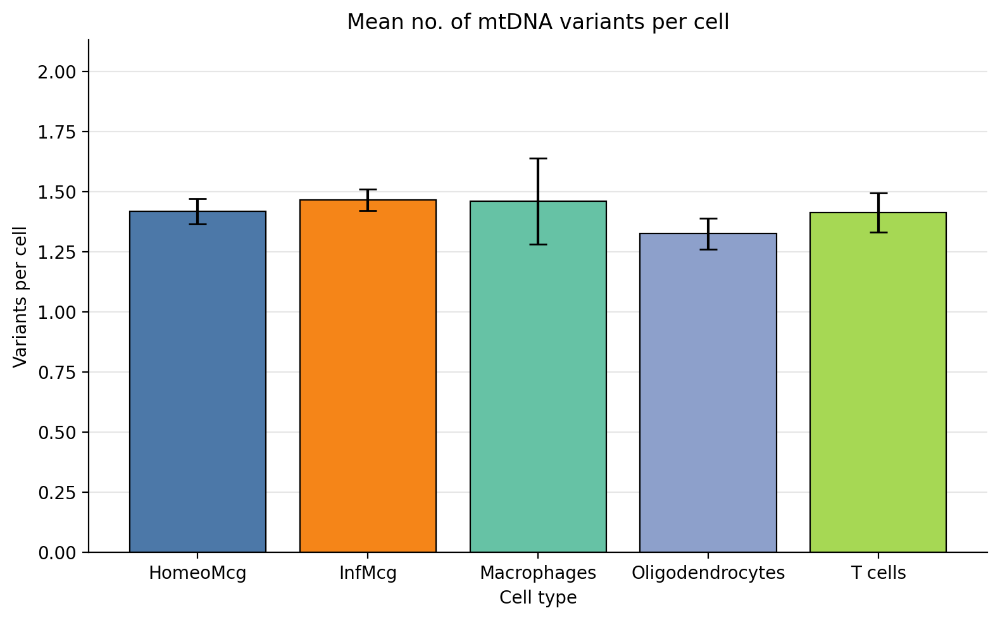

In [51]:
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

adata = mgatk

H_positions = np.array([73, 263, 750, 1438, 2706, 4769, 7028, 8860, 11719, 14766, 15326, 16519, 6776])

vaf = adata.obsm["variant_vaf"]
conf = adata.obsm["variant_confident"].astype(bool)

variant_names = np.array(adata.uns["variant_names"]).astype(str)
variant_pos = np.array([
    int(re.search(r"(\d+)", x).group(1)) if re.search(r"(\d+)", x) else np.nan
    for x in variant_names
])

keep = (~np.isnan(variant_pos)) & (~np.isin(variant_pos, H_positions))

vaf_f = vaf[:, keep]
conf_f = conf[:, keep]

variants_per_cell = ((vaf_f >= 0.05) & conf_f).sum(axis=1)

leiden = adata.obs["leiden"].astype(str).values
merged = np.where(np.isin(leiden, ["1", "3"]), "13",
          np.where(np.isin(leiden, ["2", "4", "6"]), "246", leiden))

coverage = np.asarray(adata.obsm["coverage_per_cell"])
coverage_per_cell = coverage.mean(axis=1)

df = pd.DataFrame({
    "merged": merged,
    "coverage": coverage_per_cell.astype(float),
    "variants_per_cell": variants_per_cell.astype(float)
})

df = df[df["coverage"] >= 20].copy()

label_map = {
    "246": "InfMcg",
    "13": "HomeoMcg",
    "0": "Oligodendrocytes",
    "5": "T cells",
    "7": "Macrophages"
}
df["merged"] = df["merged"].replace(label_map)

order = [g for g in ["HomeoMcg", "InfMcg"] if g in df["merged"].unique()]
rest = [g for g in sorted(df["merged"].unique(), key=str) if g not in order]
order = order + rest

summary = df.groupby("merged")["variants_per_cell"].agg(["mean", "std", "count"]).reindex(order)
summary["sem"] = summary["std"] / np.sqrt(summary["count"])

colors = {"HomeoMcg": "#4C78A8", "InfMcg": "#F58518"}
fallback = plt.cm.Set2(np.linspace(0, 1, max(1, len(order))))
fi = 0
for g in order:
    if g not in colors:
        colors[g] = fallback[fi]
        fi += 1

fig, ax = plt.subplots(figsize=(8, 5), dpi=200)

ax.bar(
    order,
    summary["mean"].values,
    yerr=summary["sem"].values,
    capsize=5,
    color=[colors[g] for g in order],
    edgecolor="black",
    linewidth=0.8,
    ecolor="black"
)

ax.set_xlabel("Cell type")
ax.set_ylabel("Variants per cell")
ax.set_title("Mean no. of mtDNA variants per cell")
ax.set_ylim(0, max(summary["mean"] + summary["sem"]) * 1.3 if len(summary) else 1)
ax.grid(axis="y", color="0.9", linewidth=0.8)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.set_axisbelow(True)

plt.tight_layout()
plt.show()

In [43]:
print(type(adata.obsm["coverage_per_cell"]), np.asarray(adata.obsm["coverage_per_cell"]).shape, np.asarray(adata.obsm["coverage_per_cell"])[:10])

<class 'numpy.ndarray'> (3346, 3848) [[30. 28. 30. ... 37. 44. 34.]
 [33. 14. 26. ... 24. 29. 28.]
 [33. 33. 28. ... 33. 52. 34.]
 ...
 [23. 13. 18. ... 15. 29. 14.]
 [73. 44. 65. ... 89. 99. 55.]
 [ 0.  3.  5. ...  1.  3.  4.]]


In [12]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import json

adata = mgatk

vaf = adata.obsm["variant_vaf"]
conf = adata.obsm["variant_confident"].astype(bool)

mean_vaf_conf = np.divide(
    (vaf * conf).sum(axis=1),
    conf.sum(axis=1),
    out=np.zeros(vaf.shape[0], dtype=float),
    where=conf.sum(axis=1) > 0
)

n_var_5pct_conf = ((vaf >= 0.05) & conf).sum(axis=1)

leiden = adata.obs["leiden"].astype(str).values

cell_type_col = "cell_type" if "cell_type" in adata.obs.columns else "leiden"
cell_type = adata.obs[cell_type_col].astype(str).values

df = pd.DataFrame({
    "leiden": leiden,
    "cell_type": cell_type,
    "mean_vaf_conf": mean_vaf_conf.astype(float),
    "n_var_5pct_conf": n_var_5pct_conf.astype(float),
})

df.to_csv("mgatk_heteroplasmy_summary.csv", index=False)

order = df.groupby("leiden")["mean_vaf_conf"].median().sort_values().index.tolist()
plot_data = [df.loc[df["leiden"] == l, "mean_vaf_conf"].to_numpy(dtype=float) for l in order]

fig, ax = plt.subplots(figsize=(10, 5))
parts = ax.violinplot(plot_data, showmeans=False, showmedians=True, showextrema=False)
for body in parts["bodies"]:
    body.set_alpha(0.8)

ax.set_xticks(np.arange(1, len(order) + 1))
ax.set_xticklabels([str(x) for x in order])
ax.set_title("Mean confident VAF per Leiden cluster")
ax.set_xlabel("Leiden cluster")
ax.set_ylabel("Mean VAF")
fig.tight_layout()
fig.savefig("mean_vaf_per_leiden.png", dpi=200, bbox_inches="tight")
plt.close(fig)

bar = df.groupby("cell_type")["n_var_5pct_conf"].mean().sort_values(ascending=False)

fig, ax = plt.subplots(figsize=(10, 5))
ax.bar(np.arange(len(bar)), bar.values, color="steelblue", edgecolor="black")
ax.set_xticks(np.arange(len(bar)))
ax.set_xticklabels([str(x) for x in bar.index], rotation=45, ha="right")
ax.set_title("Mean heteroplasmic variants per cell type")
ax.set_xlabel("Cell type")
ax.set_ylabel("Mean variant count")
fig.tight_layout()
fig.savefig("variants_per_cell_type.png", dpi=200, bbox_inches="tight")
plt.close(fig)

In [32]:
import pandas as pd
import numpy as np
import re
import itertools
import seaborn as sns
import matplotlib.pyplot as plt

# =========================================================
# SETTINGS
# =========================================================
union_path = "/mnt/claw-raid/elliot/P002_mtscATAC-seq/MitoDrift/Cluser7Cat/union_vars.csv"

USE_MERGED = True
TOP_POOL_SIZES = [30, 50, 80]
MARKER_COUNTS = [6, 8, 10, 12]
MAX_BRAIN_FRACS = [0.01, 0.02, 0.03, 0.05]
MIN_CLUSTER7_FRAC = 0.02
MAX_COMBOS = 5000
BACKGROUND = {
    73,153,195,225,227,263,750,1438,2706,4769,7028,8860,
    11719,12705,14470,14766,15326,16189,16223,16519
}

# =========================================================
# HELPERS
# =========================================================
def pos_from_variant(v):
    m = re.search(r'-(\d+)-', str(v).strip())
    return int(m.group(1)) if m else None

def robust_z(x):
    x = pd.Series(x, dtype=float)
    med = x.median()
    mad = np.median(np.abs(x - med))
    if mad == 0:
        return pd.Series(0.0, index=x.index)
    return (x - med) / (1.4826 * mad)

# =========================================================
# 1. LOAD UNION VARS
# =========================================================
union_df = pd.read_csv(union_path)
print("union_vars columns:", union_df.columns.tolist())
print("rows:", len(union_df))

variant_col = union_df.columns[0]
union_df[variant_col] = union_df[variant_col].astype(str)
union_df["pos"] = union_df[variant_col].map(pos_from_variant)
union_df = union_df.dropna(subset=["pos"]).copy()
union_df["pos"] = union_df["pos"].astype(int)
union_df = union_df.loc[~union_df["pos"].isin(BACKGROUND)].copy()
union_df = union_df.drop_duplicates(subset=["pos"]).copy()

print("\nUnion positions preview:")
print(union_df[[variant_col, "pos"]].head(20).to_string(index=False))

# =========================================================
# 2. MGATK MATRIX
# =========================================================
variant_names = pd.Index(mgatk.uns["variant_names"]).astype(str)

if "variant_counts" in mgatk.obsm:
    mat = mgatk.obsm["variant_counts"]
    threshold = 2
else:
    mat = mgatk.obsm["variant_vaf"]
    threshold = 0.05

X = pd.DataFrame(mat, index=mgatk.obs_names.astype(str), columns=variant_names)
presence = (X >= threshold).astype(int)

# =========================================================
# 3. CLUSTER LABELS
# =========================================================
obs = mgatk.obs.copy()
obs.index = obs.index.astype(str)
obs["leiden"] = obs["leiden"].astype(str)

if USE_MERGED:
    merge_map = {
        "0": "0",
        "1": "1+3",
        "2": "2+4+6",
        "3": "1+3",
        "4": "2+4+6",
        "5": "5",
        "6": "2+4+6",
        "7": "7"
    }
    obs["cluster_plot"] = obs["leiden"].map(merge_map).fillna(obs["leiden"])
    cluster_order = [c for c in ["0", "1+3", "2+4+6", "5", "7"] if c in obs["cluster_plot"].unique()]
else:
    obs["cluster_plot"] = obs["leiden"]
    cluster_order = sorted(obs["cluster_plot"].unique())

target_cluster = "7" if "7" in obs["cluster_plot"].unique() else cluster_order[-1]
print("\nTarget cluster:", target_cluster)

# =========================================================
# 4. BUILD UNION CANDIDATE TABLE FROM BRAIN DATA
# =========================================================
present_variants = [v for v in variant_names if pos_from_variant(v) in set(union_df["pos"])]
cand = pd.DataFrame({"variant": present_variants})
cand["pos"] = cand["variant"].map(pos_from_variant)

tmp = presence[present_variants].copy()
tmp["cluster_plot"] = obs.loc[tmp.index, "cluster_plot"].values

cluster_frac = tmp.groupby("cluster_plot")[present_variants].mean().T
cluster_frac["target_frac"] = cluster_frac.get(target_cluster, 0.0)
other_cols = [c for c in cluster_frac.columns if c != target_cluster]
cluster_frac["other_max"] = cluster_frac[other_cols].max(axis=1) if len(other_cols) else 0.0
cluster_frac["other_mean"] = cluster_frac[other_cols].mean(axis=1) if len(other_cols) else 0.0
cluster_frac["Delta_target"] = cluster_frac["target_frac"] - cluster_frac["other_mean"]
cluster_frac["ratio_target"] = (cluster_frac["target_frac"] + 1e-6) / (cluster_frac["other_max"] + 1e-6)

cand = cand.merge(cluster_frac.reset_index().rename(columns={"index": "variant"}), on="variant", how="left")
cand = cand.drop_duplicates(subset=["variant"]).copy()
cand = cand.loc[
    (cand["target_frac"] >= MIN_CLUSTER7_FRAC) &
    (cand["other_max"] <= max(MAX_BRAIN_FRACS)) &
    (cand["Delta_target"] > 0)
].copy()

cand = cand.sort_values(
    ["Delta_target", "ratio_target", "target_frac"],
    ascending=[False, False, False]
)

print("\nTop candidate variants from union list:")
print(
    cand[["variant", "pos", "target_frac", "other_max", "other_mean", "Delta_target", "ratio_target"]]
    .head(30)
    .round(4)
    .to_string(index=False)
)

if cand.empty:
    raise ValueError("No discriminative candidates remained after filtering union_vars.csv")

# =========================================================
# 5. EVALUATE SIGNATURE
# =========================================================
def evaluate_signature(sel_variants, cand_table):
    sel = cand_table[cand_table["variant"].isin(sel_variants)].copy()
    if sel.empty:
        return None

    sel = sel.drop_duplicates(subset=["variant"]).copy()
    sel["w"] = sel["Delta_target"].clip(lower=0)
    if sel["w"].sum() <= 0:
        return None
    sel["w"] = sel["w"] / sel["w"].sum()

    score = presence[sel["variant"]].mul(sel.set_index("variant")["w"], axis=1).sum(axis=1)

    tmp = obs.copy()
    tmp["score"] = score.reindex(tmp.index).fillna(0).values

    cluster_stats = tmp.groupby("cluster_plot", observed=True)["score"].agg(
        mean="mean",
        median="median",
        count="count",
        nonzero=lambda x: (x > 0).sum(),
        frac_positive=lambda x: (x > 0).mean()
    ).reindex(cluster_order)

    z_median = robust_z(cluster_stats["median"])
    z_mean = robust_z(cluster_stats["mean"])
    z_frac = robust_z(cluster_stats["frac_positive"])

    target_idx = target_cluster
    target_boost = 0.0
    if target_idx in cluster_stats.index:
        target_boost = (
            100 * cluster_stats.loc[target_idx, "mean"] +
            100 * cluster_stats.loc[target_idx, "frac_positive"] +
            20 * z_mean.loc[target_idx] +
            20 * z_frac.loc[target_idx]
        )

    separation = (
        20 * (cluster_stats["mean"].max() - cluster_stats["mean"].min()) +
        20 * (cluster_stats["frac_positive"].max() - cluster_stats["frac_positive"].min()) +
        5 * z_mean.abs().sum() +
        5 * z_frac.abs().sum()
    )

    objective = target_boost + separation

    return {
        "selected_table": sel.sort_values("w", ascending=False).copy(),
        "score": score,
        "cluster_stats": cluster_stats,
        "z_median": z_median,
        "z_mean": z_mean,
        "z_frac": z_frac,
        "objective": objective
    }

# =========================================================
# 6. SEARCH SIGNATURES
# =========================================================
best = None
best_meta = None
best_obj = -np.inf

for brain_cutoff in MAX_BRAIN_FRACS:
    sub = cand[cand["other_max"] <= brain_cutoff].copy()
    if sub.empty:
        continue

    print(f"\nbrain cutoff {brain_cutoff}: {len(sub)} candidates")

    for pool_size in TOP_POOL_SIZES:
        pool = sub.head(pool_size).copy()
        pool_vars = pool["variant"].tolist()

        for k in MARKER_COUNTS:
            if k > len(pool_vars):
                continue

            combos = itertools.combinations(pool_vars, k)
            checked = 0

            for combo in combos:
                res = evaluate_signature(combo, sub)
                checked += 1
                if res is None:
                    continue

                if res["objective"] > best_obj:
                    best_obj = res["objective"]
                    best = res
                    best_meta = {
                        "brain_cutoff": brain_cutoff,
                        "pool_size": pool_size,
                        "marker_count": k,
                        "selected_variants": list(combo)
                    }

                if checked >= MAX_COMBOS:
                    break

if best is None:
    raise ValueError("No valid signature found from union_vars.csv")

# =========================================================
# 7. REPORT
# =========================================================
print("\nBest search parameters:")
print(best_meta)

print(f"\nBest objective: {best_obj:.6f}")

print("\nBest selected marker table:")
print(
    best["selected_table"][["variant", "pos", "target_frac", "other_max", "other_mean", "Delta_target", "ratio_target", "w"]]
    .round(4)
    .to_string(index=False)
)

print("\nCluster summary:")
print(best["cluster_stats"].round(4).to_string())

print("\nRobust z summary (median):")
print(best["z_median"].round(4).to_string())

print("\nRobust z summary (mean):")
print(best["z_mean"].round(4).to_string())

print("\nRobust z summary (frac_positive):")
print(best["z_frac"].round(4).to_string())

# =========================================================
# 8. FINAL SCORE
# =========================================================
mgatk.obs["blood_weighted_score"] = best["score"].reindex(mgatk.obs.index.astype(str)).fillna(0).values

# choose best readable heatmap:
# median if non-flat, else mean, else frac_positive
if best["z_median"].abs().sum() > 0:
    heat_vec = best["z_median"]
    heat_label = "weighted_signal_z_median"
    heat_title = "Leiden heatmap: trimmed union signature (robust z of cluster medians)"
elif best["z_mean"].abs().sum() > 0:
    heat_vec = best["z_mean"]
    heat_label = "weighted_signal_z_mean"
    heat_title = "Leiden heatmap: trimmed union signature (robust z of cluster means)"
else:
    heat_vec = best["z_frac"]
    heat_label = "weighted_signal_z_frac_positive"
    heat_title = "Leiden heatmap: trimmed union signature (robust z of fraction positive)"

heat = pd.DataFrame([heat_vec.values], index=[heat_label], columns=best["cluster_stats"].index)

print("\nHeatmap matrix:")
print(heat.round(3).to_string())

plt.figure(figsize=(max(6, 1.2 * heat.shape[1]), 2.4))
sns.heatmap(
    heat,
    cmap="RdBu_r",
    center=0,
    annot=True,
    fmt=".2f",
    linewidths=0.5,
    cbar=True
)
plt.title(
    f"{heat_title}\n"
    f"k={best_meta['marker_count']}, pool={best_meta['pool_size']}, cutoff={best_meta['brain_cutoff']}"
)
plt.xlabel("Leiden cluster")
plt.ylabel("")
plt.tight_layout()
plt.show()

union_vars columns: ['A-10161-G']
rows: 1740

Union positions preview:
A-10161-G   pos
A-10183-G 10183
A-10372-G 10372
 A-1046-G  1046
A-10611-G 10611
A-10678-G 10678
 A-1069-G  1069
 A-1082-G  1082
A-10935-G 10935
A-10972-G 10972
A-10978-G 10978
A-11002-G 11002
A-11038-C 11038
 A-1104-G  1104
A-11167-G 11167
A-11172-G 11172
A-11216-G 11216
A-11392-G 11392
A-11404-G 11404
A-11432-G 11432
 A-1148-G  1148

Target cluster: 7

Top candidate variants from union list:
Empty DataFrame
Columns: [variant, pos, target_frac, other_max, other_mean, Delta_target, ratio_target]
Index: []


ValueError: No discriminative candidates remained after filtering union_vars.csv

In [9]:
mgatk.write_h5ad("/mnt/claw-raid/elliot/P002_mtscATAC-seq/data/processed/atac_surg_Ctx/atac_surg_ctx_mgatk.h5ad")

In [86]:
mgatk = ad.read_h5ad("/mnt/claw-raid/elliot/P002_mtscATAC-seq/data/processed/atac_surg_Ctx/atac_surg_ctx_mgatk.h5ad")

In [19]:
import pandas as pd

base = "/mnt/claw-raid/elliot/P002_mtscATAC-seq/MitoDrift/CatRun040526"

tissue = pd.read_csv(f"{base}/tissue_mitodrift_df.csv")
clusters = pd.read_csv(f"{base}/cortex_leiden_clusters.csv")

tissue["cell_clean"] = tissue["cell"].astype(str).str.replace(r"^H_", "", regex=True)
clusters["cell_clean"] = clusters["cell"].astype(str).str.replace(r"^H_", "", regex=True)

leiden_map = clusters.drop_duplicates("cell_clean").set_index("cell_clean")["leiden"]

label_map = {
    1: "HOMEO",
    3: "HOMEO",
    2: "INFLAM",
    4: "INFLAM",
    6: "INFLAM",
    5: "T cell",
    0: "Oligos"
}

out = tissue.copy()
out["leiden"] = out["cell_clean"].map(leiden_map)
out["annot"] = out["leiden"].map(label_map)

out = out.drop(columns=["cell_clean"])
out.to_csv(f"{base}/tissue_mitodrift_df_H_annot.csv", index=False)

In [59]:
#Filter vars per tissue BEFORE making long matrix with untion list 
import pandas as pd

vaf_matrix = mgatk.obsm['variant_vaf']
cell_names = mgatk.obs.index
variant_names = pd.Index(mgatk.uns['variant_names'])

# Leiden cell filter
leiden_clusters_to_keep = ['0','1','2','3','4','5','6','7']  # Adjust based on your clusters of interest
keep_cells_mask = mgatk.obs['leiden'].isin(leiden_clusters_to_keep)
keep_cells = mgatk.obs.index[keep_cells_mask]

print(f"Cells BEFORE leiden filter: {len(cell_names)}")
print(f"Cells AFTER leiden filter:  {len(keep_cells)}")

# Filter matrices to leiden cells
vaf_leiden = vaf_matrix[keep_cells_mask]
cov_leiden = mgatk.obsm['coverage_per_cell'][keep_cells_mask]

# *** FIXED: Combined mask - leiden signal AND high confidence ***
conf_stats = mgatk.uns['variant_summary']
high_conf_mask = conf_stats['n_cells_conf_detected'] >= 3

# Leiden-specific signal in high-conf vars only
leiden_signal_in_conf = (vaf_leiden[:, high_conf_mask] > 0).any(axis=0)
leiden_high_conf_vars = variant_names[high_conf_mask][leiden_signal_in_conf]

print(f"High-conf variants total:     {high_conf_mask.sum()}")
print(f"High-conf + leiden signal:   {len(leiden_high_conf_vars)}")



Cells BEFORE leiden filter: 3346
Cells AFTER leiden filter:  3346
High-conf variants total:     365
High-conf + leiden signal:   364


In [62]:
#load blood_vars and brain_vars
BloodVars = pd.read_csv("/mnt/claw-raid/elliot/P002_mtscATAC-seq/data/processed/blood_vars.csv", header=None)[0].astype(str).tolist()
BrainVars = leiden_high_conf_vars
#Make the union 
union_vars = sorted(set(BloodVars).union(set(BrainVars)))
len(BloodVars), len(BrainVars), len(union_vars)
#export union to csv to load in other notebook 
pd.Series(union_vars).to_csv("/mnt/claw-raid/elliot/P002_mtscATAC-seq/MitoDrift/CatRun210526_copy/union_vars.csv",
                             index=False, header=False)

In [69]:
blood_no_H_mask = np.isin(variant_names, blood_vars_no_H)
blood_no_H_counts = (vaf_leiden[:, blood_no_H_mask] > 0).sum(axis=1)

In [ ]:
import numpy as np
import pandas as pd
from scipy.stats import fisher_exact
import os

leiden = mgatk.obs.loc[keep_cells, "leiden"].astype(str).to_numpy()
cl5 = leiden == "5"

H_positions = ['73', '263', '750', '1438', '2706', '4769', '7028', '8860',
               '11719', '14766', '15326', '16519', '6776']

blood_vars_no_H = [v for v in BloodVars if not any(pos in str(v) for pos in H_positions)]

mask = np.isin(variant_names, blood_vars_no_H)
vars_shared = np.array(variant_names)[mask]
vaf_shared = vaf_leiden[:, mask]
present = vaf_shared > 0

rows = []
n_cl5 = int(cl5.sum())
n_other = int((~cl5).sum())

for j, var in enumerate(vars_shared):
    a = int(present[cl5, j].sum())
    b = int(present[~cl5, j].sum())
    c = n_cl5 - a
    d = n_other - b
    total = a + b
    frac_among_pos = a / total if total > 0 else np.nan
    orr, p = fisher_exact([[a, b], [c, d]], alternative="greater")
    rows.append({
        "variant": var,
        "cluster5_pos": a,
        "other_pos": b,
        "total_pos": total,
        "cluster5_frac_among_pos": frac_among_pos,
        "oddsratio": orr,
        "p": p
    })

df = pd.DataFrame(rows)

strict = df[(df["cluster5_pos"] >= 2) & (df["other_pos"] == 0)].copy()
strict = strict.sort_values(["cluster5_pos", "total_pos"], ascending=False)

enriched = df[(df["cluster5_pos"] >= 2) & (df["cluster5_pos"] > df["other_pos"])].copy()
enriched = enriched.sort_values(["cluster5_pos", "cluster5_frac_among_pos"], ascending=False)

permissive = df[df["cluster5_pos"] >= 1].copy()
permissive = permissive.sort_values(["cluster5_frac_among_pos", "cluster5_pos"], ascending=False)

if len(strict) > 0:
    candidate_vars = strict["variant"].tolist()
elif len(enriched) > 0:
    candidate_vars = enriched["variant"].tolist()
else:
    candidate_vars = permissive.head(5)["variant"].tolist()

cand_mask = np.isin(vars_shared, candidate_vars)
cand_present = present[:, cand_mask]
candidate_score = cand_present.sum(axis=1)

cell_df = pd.DataFrame({
    "cell": mgatk.obs.loc[keep_cells].index.astype(str),
    "leiden": leiden,
    "cluster5": cl5,
    "candidate_score": candidate_score
})

if cand_present.shape[1] > 0:
    carried = []
    cand_vars = vars_shared[cand_mask]
    for i in range(cand_present.shape[0]):
        carried_vars = cand_vars[cand_present[i]]
        carried.append(";".join(carried_vars) if len(carried_vars) else "")
    cell_df["candidate_variants"] = carried
else:
    cell_df["candidate_variants"] = ""

score_rows = []
max_score = int(candidate_score.max())

for k in range(1, max_score + 1):
    x = candidate_score >= k
    a = int(np.sum(cl5 & x))
    b = int(np.sum(cl5 & ~x))
    c = int(np.sum((~cl5) & x))
    d = int(np.sum((~cl5) & ~x))
    orr, p = fisher_exact([[a, b], [c, d]], alternative="greater")
    score_rows.append({
        "k": k,
        "cluster5_n_ge_k": a,
        "cluster5_total": n_cl5,
        "cluster5_frac_ge_k": a / n_cl5,
        "other_n_ge_k": c,
        "other_total": n_other,
        "other_frac_ge_k": c / n_other,
        "oddsratio": orr,
        "p": p
    })

score_df = pd.DataFrame(score_rows)

co_rows = []
cand_vars = vars_shared[cand_mask]

for i in range(len(cand_vars)):
    for j in range(i + 1, len(cand_vars)):
        v1 = cand_vars[i]
        v2 = cand_vars[j]
        co_cl5 = int(np.logical_and(cand_present[cl5, i], cand_present[cl5, j]).sum())
        co_other = int(np.logical_and(cand_present[~cl5, i], cand_present[~cl5, j]).sum())
        co_rows.append({
            "variant1": v1,
            "variant2": v2,
            "cooccur_cluster5": co_cl5,
            "cooccur_other": co_other
        })

if len(co_rows) > 0:
    co_df = pd.DataFrame(co_rows).sort_values(
        ["cooccur_cluster5", "cooccur_other"],
        ascending=[False, True]
    )
else:
    co_df = pd.DataFrame(columns=["variant1", "variant2", "cooccur_cluster5", "cooccur_other"])

os.makedirs("output", exist_ok=True)
df.to_csv("output/blood_shared_variants_cluster5_summary.csv", index=False)
strict.to_csv("output/blood_shared_variants_cluster5_strict.csv", index=False)
enriched.to_csv("output/blood_shared_variants_cluster5_enriched.csv", index=False)
permissive.to_csv("output/blood_shared_variants_cluster5_permissive.csv", index=False)
cell_df.to_csv("output/blood_shared_variantset_cells.csv", index=False)
score_df.to_csv("output/blood_shared_variantset_thresholds.csv", index=False)
co_df.to_csv("output/blood_shared_variantset_cooccurrence.csv", index=False)

print("Candidate blood-shared cluster-5 variants:")
print(candidate_vars)

print("\nSTRICT set:")
print(strict[["variant", "cluster5_pos", "other_pos", "total_pos", "cluster5_frac_among_pos", "oddsratio", "p"]].to_string(index=False) if len(strict) else "None")

print("\nENRICHED set:")
print(enriched[["variant", "cluster5_pos", "other_pos", "total_pos", "cluster5_frac_among_pos", "oddsratio", "p"]].head(20).to_string(index=False) if len(enriched) else "None")

print("\nTop positive cells:")
print(cell_df[cell_df["candidate_score"] > 0].sort_values(["candidate_score", "cluster5"], ascending=False).head(50).to_string(index=False))

print("\nThreshold test:")
print(score_df.to_string(index=False) if len(score_df) else "No positive scores")

KeyError: 'cooccur_cluster5'

In [54]:
#combine tow long matrices that have been made wiht union varinat lists 
blood = pd.read_csv("/mnt/claw-raid/elliot/P002_mtscATAC-seq/MitoDrift/CatRun210526/blood_long_union.csv")
brain = pd.read_csv("/mnt/claw-raid/elliot/P002_mtscATAC-seq/MitoDrift/CatRun210526/brain_long_union.csv")

blood['cell'] = 'P_' + blood['cell'].astype(str)
brain['cell'] = 'H_' + brain['cell'].astype(str)

blood['tissue'] = 'blood'
brain['tissue'] = 'brain'

combined_mut_dat = pd.concat([blood, brain], ignore_index=True)
combined_mut_dat.to_csv("/mnt/claw-raid/elliot/P002_mtscATAC-seq/MitoDrift/CatRun210526/combined_mut_dat.csv", index=False)

In [52]:
(combined_mut_dat['a'] <= combined_mut_dat['d']).all()
combined_mut_dat['d'].min()
combined_mut_dat['a'].max()

np.int64(222)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

variant = "T-6756-C"

variant_names = np.array(mgatk.uns["variant_names"])
vaf = mgatk.obsm["variant_vaf"]

j = np.where(variant_names == variant)[0][0]
present = vaf[:, j] > 0

coords = mgatk.obsm["X_umap"]
leiden = mgatk.obs["leiden"].astype(str).to_numpy()
cl5 = leiden == "5"

# background
plt.figure(figsize=(8, 6))
plt.scatter(coords[:, 0], coords[:, 1], s=3, c="lightgrey", alpha=0.15, linewidths=0)

# cluster 5 background tint
plt.scatter(coords[cl5, 0], coords[cl5, 1], s=5, c="steelblue", alpha=0.12, linewidths=0)

# positive cells
plt.scatter(coords[present, 0], coords[present, 1], s=90, c="red", alpha=1.0, edgecolors="black", linewidths=0.7)

# labels
for i in np.where(present)[0]:
    plt.text(coords[i, 0], coords[i, 1], mgatk.obs_names[i], fontsize=6, ha="left", va="bottom")

plt.xticks([])
plt.yticks([])
plt.tight_layout()
plt.savefig("output/T6756C_umap_binary.png", dpi=300)
plt.show()

STRICT candidates:
None

ENRICHED candidates:
 variant  cluster5_pos  other_pos  total_pos  cluster5_frac_among_pos  oddsratio        p
T-6756-C             2          0          2                      1.0        inf 0.009642

Cells carrying candidate variants:
              cell leiden  cluster5  candidate_score candidate_variants
ACCAAACTCTCCTTAA-1      5      True                1           T-6756-C
CCAGATACACGCGATC-1      5      True                1           T-6756-C


In [2]:
combined_matrix_long = pd.read_csv("/mnt/claw-raid/elliot/P002_mtscATAC-seq/MitoDrift/CatRun150526/Combined_Surgical_Lineage_Matrix.csv")

In [6]:
combined_matrix_long.shape
combined_matrix_long.head()



,cell,variant,a,d
0,H_AAACGAAAGGACTAGC-1,G-1045-A,0,37
1,H_AAACGAAAGGTTAGTA-1,G-1045-A,0,34
2,H_AAACGAACAACGAGGT-1,G-1045-A,0,32
3,H_AAACGAACAATTCGTG-1,G-1045-A,0,93
4,H_AAACGAAGTCTGCACG-1,G-1045-A,0,81


In [4]:
import pandas as pd
# Load and inspect columns
clones = pd.read_csv("/mnt/claw-raid/elliot/P002_mtscATAC-seq/MitoDrift/SurgicalCortex0.05/clone_assignments_nosingletons.csv")
print("Columns:", clones.columns.tolist())
print("\nFirst 5 rows:")
print(clones.head())

# Column is probably 'clade' (MitoDrift standard), not 'clone'
print("\nClone counts:")
print(clones['clade'].value_counts().head(10))  # Use 'clade'

Columns: ['cell', 'clade', 'clade_node', 'annot', 'size', 'frac']

First 5 rows:
                 cell  clade  clade_node  annot  size      frac
0  ACAATCGAGCGTGTTT-1      1        3043      1    51  0.019304
1  GGTAGGAGTATACGCT-1      1        3043      1    51  0.019304
2  AAGGAGCAGATGTTGA-1      1        3043      1    51  0.019304
3  CTGCGTTCACGCTAAT-1      1        3043      1    51  0.019304
4  TTCGCGTTCCGCCTAT-1      1        3043      1    51  0.019304

Clone counts:
clade
1     51
2     43
3     35
4     32
5     31
6     25
7     22
8     21
9     21
10    20
Name: count, dtype: int64


In [12]:
# What proportion of cells sit in multi-cell clones (size ≥ 2)?
df["is_multicell"] = df["clade"].map(
    df.groupby("clade")["cell"].count() >= 2
)

multicell_prop = (df.groupby("cell_type")["is_multicell"]
    .mean()
    .reset_index()
    .sort_values("is_multicell", ascending=False))

print(multicell_prop)

      cell_type  is_multicell
2     Cluster_7      0.340909
0     Cluster_0      0.338889
3   Homeostatic      0.333333
4  Inflammatory      0.324536
1     Cluster_5      0.322222


In [4]:
clones_map = clones.set_index("cell")["clade"]
mgatk.obs["clone"] = mgatk.obs_names.map(clones_map)

NameError: name 'clones' is not defined

In [38]:
count_table = pd.crosstab(df_filtered["clone_top"], df_filtered["leiden_grouped_str"])
frac_table = count_table.div(count_table.sum(axis=1), axis=0)

clone_summary = pd.DataFrame({
    "n_cells": count_table.sum(axis=1),
    "best_group": frac_table.idxmax(axis=1),
    "purity": frac_table.max(axis=1),
    "cells_in_best_group": count_table.max(axis=1),
    "cells_outside_best_group": count_table.sum(axis=1) - count_table.max(axis=1)
})

good_clones = clone_summary[
    (clone_summary["cells_in_best_group"] >= 10) &
    (clone_summary["purity"] <= 0.8)
].sort_values(
    ["cells_in_best_group", "purity", "n_cells"],
    ascending=[False, False, False]
)

good_clones

,n_cells,best_group,purity,cells_in_best_group,cells_outside_best_group
clone_top,,,,,
1,51,13,0.431373,22,29
2,43,13,0.418605,18,25
6,25,246,0.560000,14,11
4,32,246,0.437500,14,18
3,35,246,0.371429,13,22
10,20,246,0.600000,12,8
7,22,246,0.545455,12,10


In [12]:
# Your mapping (fix index name if needed)
clones_map = clones.set_index("cell")["clade"]  # Make sure "cell" column exists
mgatk.obs["clone"] = mgatk.obs_names.map(clones_map)  # Now works on mgatk

# Set sub = mgatk or copy it
sub = mgatk.copy()  # or sub = mgatk

# Check it worked
print(sub.obs["clone"].value_counts().head())

clone
1.0    51
2.0    43
3.0    35
4.0    32
5.0    31
Name: count, dtype: int64


Shape: (137, 5) (clones x 5 groups)
Using vmin=0, vmax=1.0 (full 0-1 scale)


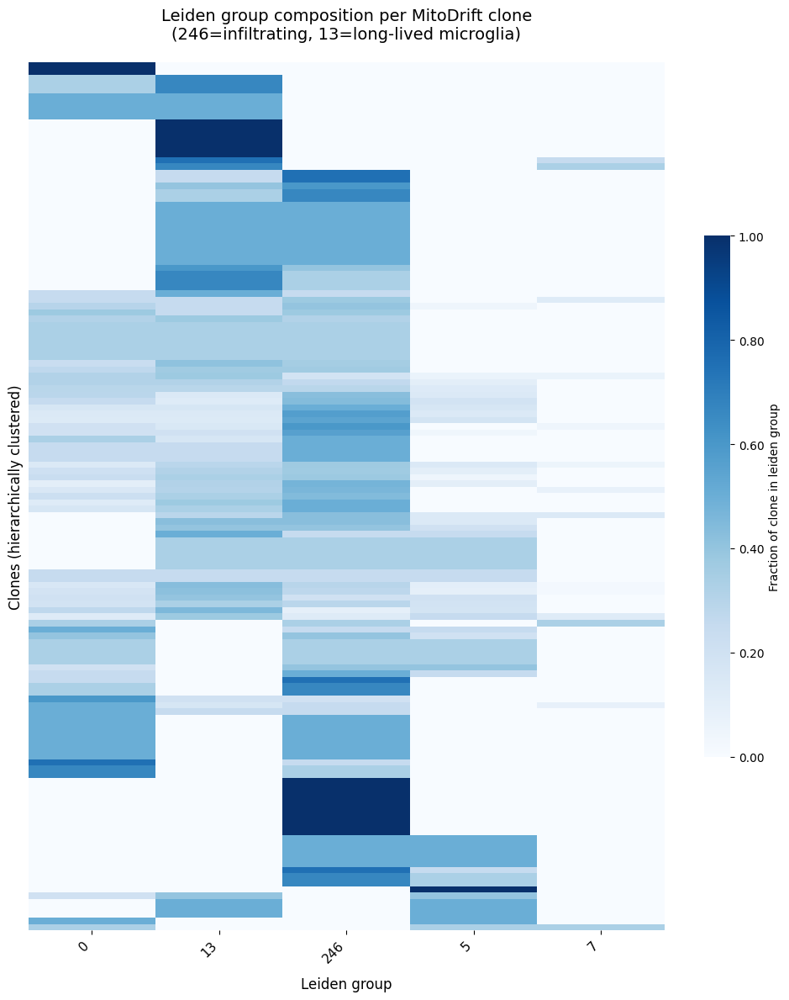

leiden_grouped_str,clone_top,0,13,246,5,7
0,122,1.0000,0.0000,0.0000,0.0000,0.0000
1,75,1.0000,0.0000,0.0000,0.0000,0.0000
2,84,0.3333,0.6667,0.0000,0.0000,0.0000
3,76,0.3333,0.6667,0.0000,0.0000,0.0000
4,80,0.3333,0.6667,0.0000,0.0000,0.0000
5,95,0.5000,0.5000,0.0000,0.0000,0.0000
6,131,0.5000,0.5000,0.0000,0.0000,0.0000
7,112,0.5000,0.5000,0.0000,0.0000,0.0000
8,124,0.5000,0.5000,0.0000,0.0000,0.0000
9,135,0.0000,1.0000,0.0000,0.0000,0.0000


In [14]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.cluster.hierarchy import linkage, leaves_list
from scipy.spatial.distance import pdist

# Your leiden_grouped mapping (from earlier)
cluster_map = {"0": "0", "1": "13", "2": "246", "3": "13", "4": "246", "5": "5", "6": "246", "7": "7"}
mgatk.obs["leiden_grouped"] = mgatk.obs["leiden"].astype(str).map(cluster_map)

# Your data pipeline (updated for leiden_grouped)
clones_map = clones.set_index("cell")["clade"]
mgatk.obs["clone"] = mgatk.obs_names.map(clones_map)

df_filtered = mgatk.obs.dropna(subset=['leiden_grouped', 'clone']).copy()
df_filtered['clone_top'] = df_filtered['clone'].astype(str).str.split('.').str[0]
df_filtered['leiden_grouped_str'] = df_filtered['leiden_grouped'].astype(str)

# Use leiden_grouped instead of leiden
frac_table = (
    df_filtered.groupby(['clone_top', 'leiden_grouped_str'])
    .size()
    .unstack(fill_value=0)
    .astype(float)
)
frac_table = frac_table.div(frac_table.sum(axis=1), axis=0).fillna(0)

print(f"Shape: {frac_table.shape} (clones x {len(df_filtered['leiden_grouped_str'].unique())} groups)")

# CLUSTER (unchanged - perfect!)
row_dist = pdist(frac_table.values, metric='euclidean')
row_linkage = linkage(row_dist, method='average')
row_order = leaves_list(row_linkage)
frac_table_ordered = frac_table.iloc[row_order]



# 0-1 SCALE (unchanged)
data = frac_table_ordered.values
vmin = 0
vmax = 1.0
print(f"Using vmin={vmin}, vmax={vmax} (full 0-1 scale)")

fig, ax = plt.subplots(figsize=(10, 12))  # Narrower for 5 groups
sns.heatmap(
    frac_table_ordered,
    cmap='Blues',
    vmin=vmin, vmax=vmax,
    linewidths=0,
    linecolor='white',
    yticklabels=False,
    xticklabels=True,
    annot=False,
    cbar_kws={
        'label': 'Fraction of clone in leiden group',
        'shrink': 0.6,
        'format': '%.2f'
    },
    ax=ax,
    square=False,
    rasterized=True
)

ax.set_title('Leiden group composition per MitoDrift clone\n(246=infiltrating, 13=long-lived microglia)', 
             fontsize=14, pad=20)
ax.set_xlabel('Leiden group', fontsize=12, labelpad=10)
ax.set_ylabel('Clones (hierarchically clustered)', fontsize=12)
plt.xticks(rotation=45, ha='right', fontsize=11)
plt.tight_layout()
plt.savefig('mitodrift_leiden_grouped.png', dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

pd.options.display.max_rows = None
pd.options.display.max_columns = None
pd.set_option('display.width', None)
frac_table_ordered.round(4).reset_index()


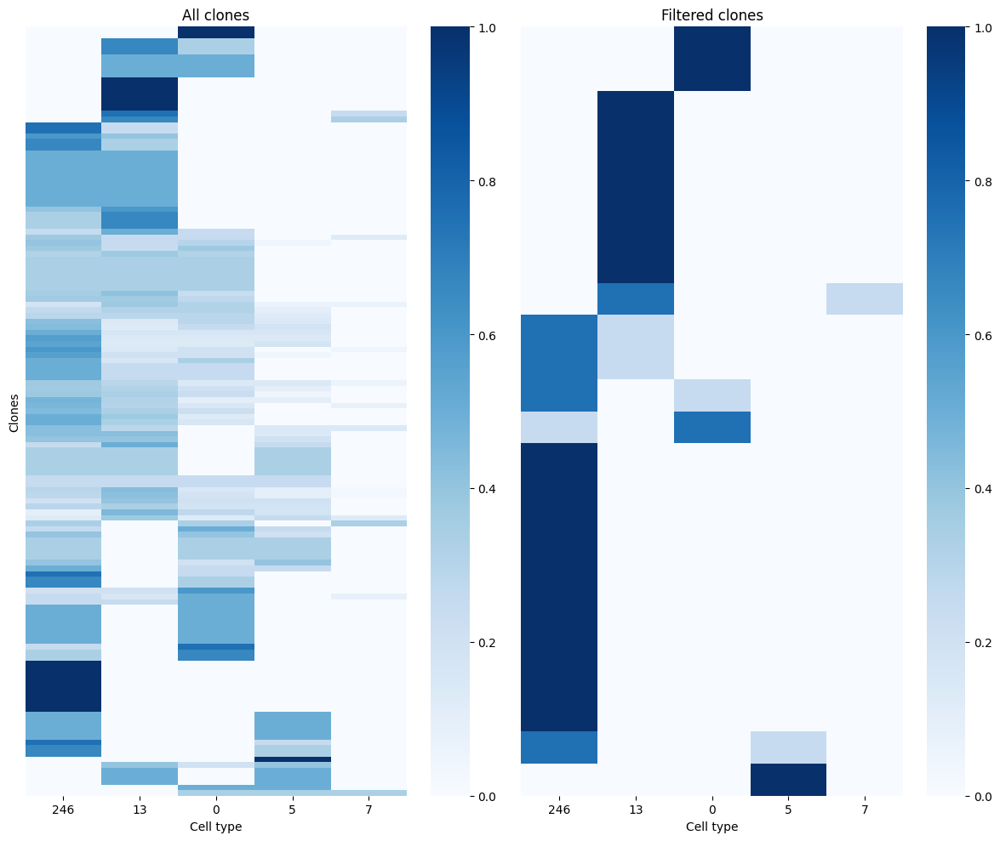

In [20]:
col_order = ['246', '13', '0', '5', '7']
frac_table_ordered = frac_table_ordered.reindex(columns=col_order, fill_value=0)

specific = frac_table_ordered.max(axis=1) >= 0.75

fig, axes = plt.subplots(1, 2, figsize=(12, 10))

sns.heatmap(
    frac_table_ordered,
    ax=axes[0],
    cmap='Blues',
    vmin=0, vmax=1,
    yticklabels=False
)

sns.heatmap(
    frac_table_ordered[specific],
    ax=axes[1],
    cmap='Blues',
    vmin=0, vmax=1,
    yticklabels=False
)

axes[0].set_title("All clones")
axes[1].set_title("Filtered clones")
axes[0].set_xlabel("Cell type")
axes[1].set_xlabel("Cell type")
axes[0].set_ylabel("Clones")
axes[1].set_ylabel("")

plt.tight_layout()
plt.show()

In [28]:
# --- % of each Leiden cluster retained after median_d cutoff ---
leiden_col = mgatk.obs.loc[keep_cells_final, 'leiden']

cluster_counts_before = mgatk.obs.loc[keep_cells, 'leiden'].value_counts(sort=False)
cluster_counts_after  = leiden_col.value_counts(sort=False)

# Align indices so missing clusters show up as 0
clusters = cluster_counts_before.index
before = cluster_counts_before.reindex(clusters, fill_value=0)
after  = cluster_counts_after.reindex(clusters, fill_value=0)
pct_retained = (after / before * 100).round(1)

retention_df = pd.DataFrame({
    "cluster": clusters,
    "before": before.values,
    "after": after.values,
    "% retained": pct_retained.values
})

print("\nRetention per Leiden cluster (median_d >= 10):")
print(retention_df.to_string(index=False))


Retention per Leiden cluster (median_d >= 10):
cluster  before  after  % retained
      0     666    540        81.1
      1     564    413        73.2
      2     554    450        81.2
      3     442    352        79.6
      4     430    340        79.1
      5     329    270        82.1
      6     302    233        77.2
      7      59     44        74.6


In [12]:
import pandas as pd

# Load final file
df_final = pd.read_csv("/mnt/claw-raid/elliot/P002_mtscATAC-seq/MitoDriftMaster/Cortex_surgical_long_variant_matrix.csv")

# Final structure check
print("FINAL STRUCTURE CHECK:")
print(f"Shape: {df_final.shape}")
print(f"Cells: {df_final['cell'].nunique()} unique")
print(f"Variants: {df_final['variant'].nunique()} unique")
print(f"a range: {df_final['a'].min()} - {df_final['a'].max()}")
print(f"d range: {df_final['d'].min()} - {df_final['d'].max()} (median {df_final['d'].median():.1f})")
print("\nColumn types:")
print(df_final.dtypes)
print("\nFirst 5 rows:")
print(df_final.head())
print("\nLast 5 rows:")
print(df_final.tail())
print("\nSample variants:")
print(df_final['variant'].unique()[:10])
print("\nAny haplogroup positions remaining?")
haplogroup_pos = ['73', '263', '750', '1438', '2706', '4769', '7028', '8860', '11719', '14766', '15326', '16519', '6776']
remaining_hg = df_final['variant'].str.contains('|'.join(haplogroup_pos)).sum()
print(f"Haplogroup markers left: {remaining_hg}")

print("\n" + "="*60)
print("✅ MitoDrift READY!")
print("Run: ./mitodrift.sh --mut_dat PBMC_PM_mitodrift_ready.csv")

FINAL STRUCTURE CHECK:
Shape: (895638, 4)
Cells: 2642 unique
Variants: 339 unique
a range: 0 - 222
d range: 0 - 423 (median 44.0)

Column types:
cell       object
variant    object
a           int64
d           int64
dtype: object

First 5 rows:
                 cell   variant  a   d
0  AAACGAAAGGACTAGC-1  G-1045-A  0  37
1  AAACGAAAGGTTAGTA-1  G-1045-A  0  34
2  AAACGAACAACGAGGT-1  G-1045-A  0  32
3  AAACGAACAATTCGTG-1  G-1045-A  0  93
4  AAACGAAGTCTGCACG-1  G-1045-A  0  81

Last 5 rows:
                      cell variant  a   d
895633  TTTGTGTAGTAACACA-1  A-93-G  0  66
895634  TTTGTGTGTCAGCAAG-1  A-93-G  0  58
895635  TTTGTGTTCCCGCAAG-1  A-93-G  0  47
895636  TTTGTGTTCGACGGAA-1  A-93-G  0  29
895637  TTTGTGTTCGGTGATT-1  A-93-G  0  18

Sample variants:
['G-1045-A' 'G-11682-A' 'G-16048-A' 'G-3016-A' 'G-9575-A' 'G-972-A'
 'T-10663-C' 'T-14952-C' 'T-15288-C' 'T-2515-C']

Any haplogroup positions remaining?
Haplogroup markers left: 0

✅ MitoDrift READY!
Run: ./mitodrift.sh --mut_dat PBMC_

In [15]:
import pandas as pd
import numpy as np

df = pd.read_csv("/mnt/claw-raid/elliot/P002_mtscATAC-seq/MitoDriftMaster/Cortex_surgical_long_variant_matrix.csv")
median_d = df.groupby('cell')['d'].median()
mean_d = df.groupby('cell')['d'].mean()

print(f"Total cells: {len(median_d)}")
print(f"Median of median_d: {median_d.median():.1f}")
print(f"Median of mean_d: {mean_d.median():.1f}")

# QUANTILES for threshold selection
for q in [0.01, 0.05, 0.10, 0.25, 0.50, 0.75, 0.90, 0.95, 0.99]:
    print(f"{q*100:5.1f}% quantile: {median_d.quantile(q):6.1f}")

# CUMULATIVE COUNTS at common thresholds
for thresh in [0, 1, 3, 5, 8, 10, 15, 20, 30]:
    n_keep = (median_d >= thresh).sum()
    pct_keep = n_keep / len(median_d) * 100
    print(f">={thresh:2.0f}x keeps {n_keep:4.0f} cells ({pct_keep:5.1f}%)")

print("\nTop 10 cells by median_d:")
print(median_d.nlargest(10))
print("\nBottom 10 cells by median_d:")
print(median_d.nsmallest(10))

# DENSITY around valley region
print("\nCells in valley region (5-10x):")
print(f"5-6x:  {(5 <= median_d) & (median_d < 6)}.sum(): {((5 <= median_d) & (median_d < 6)).sum()}")
print(f"6-7x:  {((6 <= median_d) & (median_d < 7)).sum()}")
print(f"7-8x:  {((7 <= median_d) & (median_d < 8)).sum()}")
print(f"8-9x:  {((8 <= median_d) & (median_d < 9)).sum()}")
print(f"9-10x: {((9 <= median_d) & (median_d < 10)).sum()}")

print(f"\nBimodality check - cells with median_d == 0.0: {(median_d == 0).sum()}")

Total cells: 2642
Median of median_d: 45.0
Median of mean_d: 44.9
  1.0% quantile:   10.0
  5.0% quantile:   13.0
 10.0% quantile:   16.0
 25.0% quantile:   27.0
 50.0% quantile:   45.0
 75.0% quantile:   67.0
 90.0% quantile:   94.0
 95.0% quantile:  114.0
 99.0% quantile:  152.0
>= 0x keeps 2642 cells (100.0%)
>= 1x keeps 2642 cells (100.0%)
>= 3x keeps 2642 cells (100.0%)
>= 5x keeps 2642 cells (100.0%)
>= 8x keeps 2642 cells (100.0%)
>=10x keeps 2642 cells (100.0%)
>=15x keeps 2444 cells ( 92.5%)
>=20x keeps 2249 cells ( 85.1%)
>=30x keeps 1872 cells ( 70.9%)

Top 10 cells by median_d:
cell
AAAGGGCCAAACCGAG-1    307.0
AATGGAATCTCTGCGT-1    248.0
CACAACATCACTAGCA-1    237.0
GGATAGGGTTAACCGT-1    236.0
TGAATCGTCCTCTCTT-1    200.0
CACTGAAAGTATAGTG-1    193.0
GAAAGTACACCACGAC-1    190.0
TCAGCTCTCCGATGCG-1    187.0
ATGGATCCATGTAGAA-1    181.0
GTCACAAGTGCTGTGC-1    180.0
Name: d, dtype: float64

Bottom 10 cells by median_d:
cell
AAATGAGAGTGCAACG-1    10.0
AACCTGACAAGTTGCT-1    10.0
ACTAC

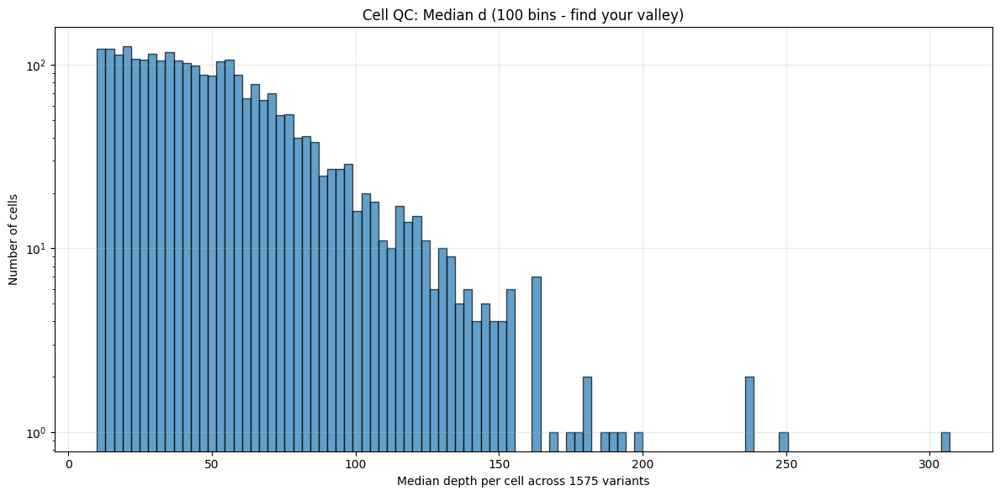

In [16]:
import matplotlib.pyplot as plt

median_d.hist(bins=100, figsize=(12,6), alpha=0.7, edgecolor='black')
plt.xlabel('Median depth per cell across 1575 variants')
plt.ylabel('Number of cells')
plt.yscale('log')
plt.title('Cell QC: Median d (100 bins - find your valley)')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

In [2]:
import anndata as ad

data = ad.read_h5ad("/mnt/claw-raid/elliot/P002_mtscATAC-seq/data/processed/atac_surg_Ctx/atac_surg_ctx.h5ad")
mgatk = mgatk = ad.read_h5ad('/mnt/claw-raid/elliot/P002_mtscATAC-seq/data/mgatk_with_pathogenicity.h5ad')



In [7]:
print("obs keys:", mgatk.obs.columns.tolist())
print("obsm keys:", list(mgatk.obsm.keys()))
print("var keys:", mgatk.var.columns.tolist() if hasattr(mgatk.var, 'columns') else "No var df")
print("uns keys:", list(mgatk.uns.keys()))

obs keys: ['n_fragment', 'frac_dup', 'frac_mito', 'tsse', 'doublet_probability', 'doublet_score', 'leiden', 'total_variant_count', 'total_confident_variants', 'temp_vaf_17425', 'temp_vaf_6748', 'temp_vaf_22679', 'temp_vaf_16752', 'temp_vaf_24537', 'temp_vaf_14831', 'temp_vaf_17417', 'temp_vaf_387', 'temp_vaf_3246', 'temp_vaf_17452', 'temp_vaf_16286', 'temp_vaf_11354', 'temp_vaf_3677', 'temp_vaf_31089', 'temp_vaf_16973', 'temp_vaf_23118', 'vaf_C-16189-T', 'C-16189-T_alpha', 'vaf_C-980-T', 'vaf_C-1189-T', 'vaf_A-2209-G', 'vaf_A-1252-G', 'vaf_C-4954-T', 'vaf_C-15726-T', 'vaf_A-2174-G', 'vaf_A-3239-g', 'vaf_C-2075-T', 'vaf_A-10197-G', 'vaf_A-2333-G', 'vaf_C-10809-T', 'vaf_G-13434-A', 'vaf_A-6182-G', 'vaf_C-8317-T', 'vaf_C-302-A', 'vaf_C-14488-T', 'vaf_C-4248-T', 'vaf_A-11711-G', 'vaf_G-2633-a', 'vaf_G-3572-T', 'vaf_G-13768-T', 'vaf_C-13903-T', 'vaf_T-16353-C', 'vaf_C-5338-T', 'vaf_C-3583-A', 'vaf_C-3577-A', 'combined_clusters', 'vaf_A-513-G', 'vaf_A-11838-T', 'vaf_C-13780-A', 'vaf_G-3578-T

In [ ]:
#create gene matrix from mgatk object, used to comapre DEGs between inflam vs homeo microglia 
import snapatac2 as snap

gene_matrix = snap.pp.make_gene_matrix(
    mgatk,
    gene_anno=snap.genome.hg38,
    gene_name_key='gene_id'
)

# Strip Ensembl version numbers
gene_matrix.var_names = gene_matrix.var_names.str.replace(r'\.\d+$', '', regex=True)

# Save it
gene_matrix.write_h5ad(
    '/mnt/claw-raid/elliot/P002_mtscATAC-seq/data/processed/gene_matrix_mgatk.h5ad'
)

print(gene_matrix)
print(gene_matrix.var_names[:10])


AnnData object with n_obs × n_vars = 3346 × 61806
    obs: 'n_fragment', 'frac_dup', 'frac_mito', 'tsse', 'doublet_probability', 'doublet_score', 'leiden', 'total_variant_count', 'total_confident_variants', 'temp_vaf_17425', 'temp_vaf_6748', 'temp_vaf_22679', 'temp_vaf_16752', 'temp_vaf_24537', 'temp_vaf_14831', 'temp_vaf_17417', 'temp_vaf_387', 'temp_vaf_3246', 'temp_vaf_17452', 'temp_vaf_16286', 'temp_vaf_11354', 'temp_vaf_3677', 'temp_vaf_31089', 'temp_vaf_16973', 'temp_vaf_23118', 'vaf_C-16189-T', 'C-16189-T_alpha', 'vaf_C-980-T', 'vaf_C-1189-T', 'vaf_A-2209-G', 'vaf_A-1252-G', 'vaf_C-4954-T', 'vaf_C-15726-T', 'vaf_A-2174-G', 'vaf_A-3239-g', 'vaf_C-2075-T', 'vaf_A-10197-G', 'vaf_A-2333-G', 'vaf_C-10809-T', 'vaf_G-13434-A', 'vaf_A-6182-G', 'vaf_C-8317-T', 'vaf_C-302-A', 'vaf_C-14488-T', 'vaf_C-4248-T', 'vaf_A-11711-G', 'vaf_G-2633-a', 'vaf_G-3572-T', 'vaf_G-13768-T', 'vaf_C-13903-T', 'vaf_T-16353-C', 'vaf_C-5338-T', 'vaf_C-3583-A', 'vaf_C-3577-A', 'combined_clusters', 'vaf_A-513-G',

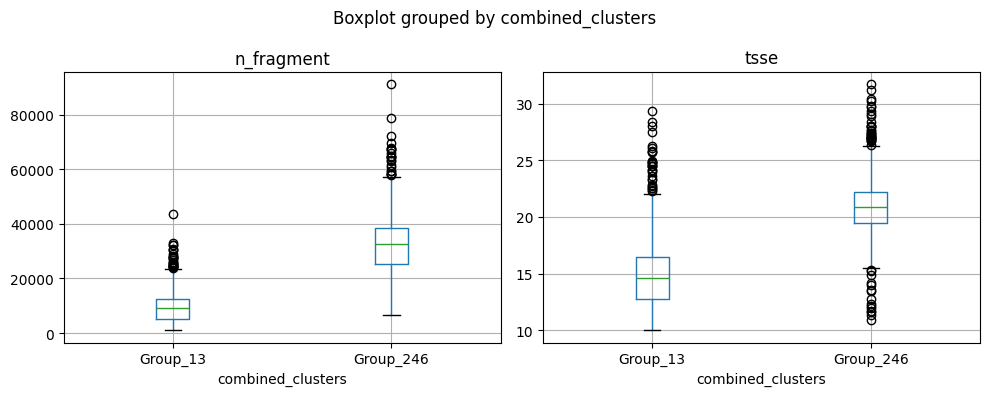

In [51]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 2, figsize=(10, 4))
subset.obs.boxplot(column='n_fragment', by='combined_clusters', ax=axes[0])
subset.obs.boxplot(column='tsse', by='combined_clusters', ax=axes[1])
plt.tight_layout()
plt.show()


In [4]:
import numpy as np
from scipy.stats import fisher_exact
from statsmodels.stats.multitest import multipletests
import pandas as pd

# Setup data
variant_names = mgatk.uns['variant_names']
vaf_matrix = mgatk.obsm['variant_vaf']

group_246_mask = mgatk.obs['combined_clusters'] == 'Group_246'
group_13_mask = mgatk.obs['combined_clusters'] == 'Group_13'
n_246_total = group_246_mask.sum()
n_13_total = group_13_mask.sum()

print(f"Group_246: {n_246_total} cells")
print(f"Group_13: {n_13_total} cells")

# Settings
vaf_cutoff = 0.03
min_cells_total = 10
max_prev = 0.8

def is_artifact(variant_str):
    if 'N' in variant_str:
        return True
    try:
        pos = int(variant_str.split('-')[1])
        if pos == 3107 or (300 <= pos <= 320) or (16180 <= pos <= 16195):
            return True
    except:
        pass
    return False

results = []
print(f"Scanning {len(variant_names)} variants...")

for i, variant in enumerate(variant_names):
    if is_artifact(variant):
        continue
    
    vaf = vaf_matrix[:, i]
    n_246 = (vaf[group_246_mask] > vaf_cutoff).sum()
    n_13 = (vaf[group_13_mask] > vaf_cutoff).sum()
    
    if (n_246 + n_13) < min_cells_total:
        continue
    
    prev_246 = n_246 / n_246_total
    prev_13 = n_13 / n_13_total
    
    if prev_246 > max_prev and prev_13 > max_prev:
        continue
    
    table = [[n_246, n_246_total - n_246], [n_13, n_13_total - n_13]]
    odds, pval = fisher_exact(table)
    log2fc = np.log2((n_246 + 0.5) / (n_13 + 0.5))
    
    results.append({
        'variant': variant,
        'n_246': n_246,
        'n_13': n_13,
        'prev_246': prev_246,
        'prev_13': prev_13,
        'log2fc': log2fc,
        'pval': pval
    })

df = pd.DataFrame(results)

if not df.empty:
    df['fdr'] = multipletests(df['pval'], method='fdr_bh')[1]
    df['abs_log2fc'] = np.abs(df['log2fc'])
    df = df.sort_values('abs_log2fc', ascending=False)
    
    print(f"\nTotal candidates: {len(df)}")
    print(f"p < 0.05: {(df['pval'] < 0.05).sum()}")
    print(f"q < 0.05: {(df['fdr'] < 0.05).sum()}")
    
    print("\nTOP 20 ENRICHED IN GROUP_246:")
    top_246 = df[df['log2fc'] > 0].head(20)
    print(top_246[['variant', 'n_246', 'n_13', 'prev_246', 'prev_13', 'log2fc', 'pval', 'fdr']])
    
    print("\nTOP 20 ENRICHED IN GROUP_13:")
    top_13 = df[df['log2fc'] < 0].head(20)
    print(top_13[['variant', 'n_246', 'n_13', 'prev_246', 'prev_13', 'log2fc', 'pval', 'fdr']])
else:
    print("No variants passed filters.")


Group_246: 1286 cells
Group_13: 1006 cells
Scanning 44436 variants...

Total candidates: 1619
p < 0.05: 76
q < 0.05: 0

TOP 20 ENRICHED IN GROUP_246:
        variant  n_246  n_13  prev_246   prev_13    log2fc      pval       fdr
1048  C-10891-A     10     0  0.007776  0.000000  4.392317  0.003304  0.865872
442   C-10242-T     10     0  0.007776  0.000000  4.392317  0.003304  0.865872
1474  G-16226-a     13     1  0.010109  0.000994  3.169925  0.005188  0.865872
391    C-5338-T     13     1  0.010109  0.000994  3.169925  0.005188  0.865872
982   G-12499-A     13     1  0.010109  0.000994  3.169925  0.005188  0.865872
95    A-15216-G     11     1  0.008554  0.000994  2.938599  0.016197  1.000000
115   C-13955-T     10     1  0.007776  0.000994  2.807355  0.028521  1.000000
439    A-8387-G     10     1  0.007776  0.000994  2.807355  0.028521  1.000000
803   C-11921-T     10     1  0.007776  0.000994  2.807355  0.028521  1.000000
1186   C-6432-A     10     1  0.007776  0.000994  2.807355  

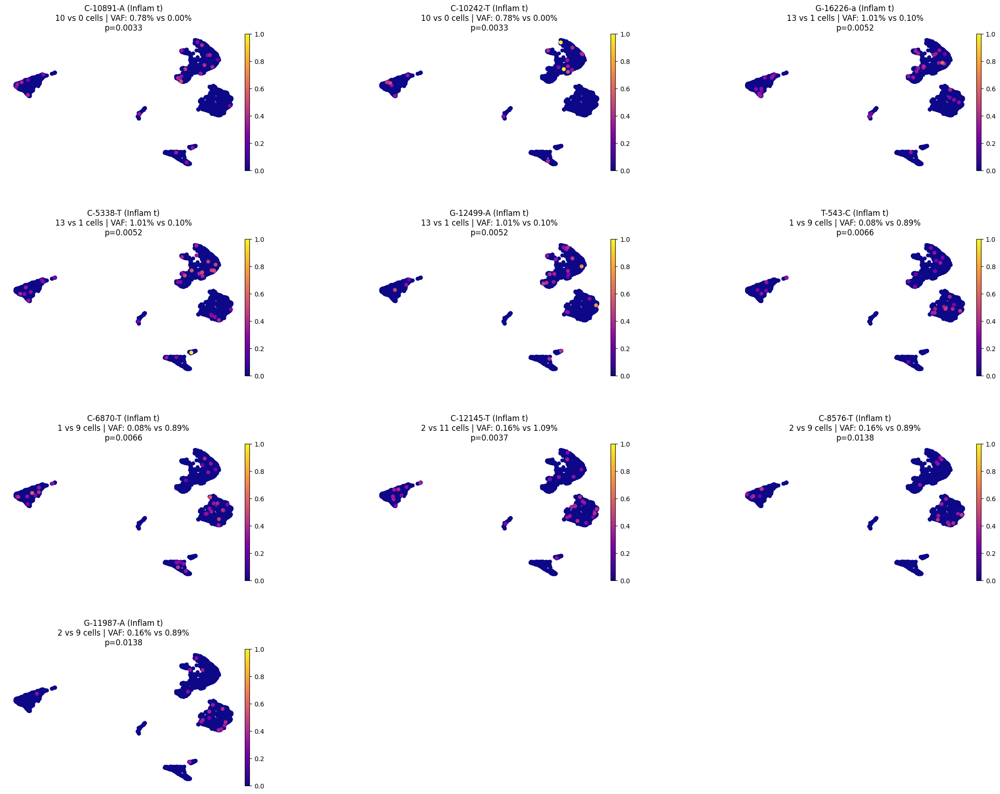

In [34]:
import scanpy as sc
import numpy as np

# Get top variants
top_246 = df[df['log2fc'] > 0].head(5)
top_13 = df[df['log2fc'] < 0].head(5)
top_variants = list(top_246['variant']) + list(top_13['variant'])

# Add VAF with cube root
vmax_global = 0
for variant in top_variants:
    idx = list(variant_names).index(variant)
    vaf = vaf_matrix[:, idx]
    transformed = np.cbrt(vaf)
    mgatk.obs[variant] = transformed
    vmax_global = max(vmax_global, transformed.max())

# Create titles matching your format
titles = []
for v in top_variants:
    row = df[df['variant'] == v].iloc[0]
    n_246 = int(row['n_246'])
    n_13 = int(row['n_13'])
    pval = row['pval']
    prev_246 = row['prev_246']
    prev_13 = row['prev_13']
    titles.append(f"{v} (Inflam t)\n{n_246} vs {n_13} cells | VAF: {prev_246:.2%} vs {prev_13:.2%}\np={pval:.4f}")

# Plot with shared scale
sc.pl.umap(mgatk, color=top_variants, ncols=3, cmap='plasma', 
           frameon=False, size=150, title=titles,
           vmin=0, vmax=vmax_global,
           wspace=0.4, hspace=0.5,
           save='_top_enriched_variants.pdf')


In [5]:
#volcano plot of all variants 
import plotly.graph_objects as go
import numpy as np

pval_threshold = 0.05
log2fc_threshold = 1.0

# Determine colors and significance
colors = []
significant = []
for idx, row in df.iterrows():
    sig = row['pval'] < pval_threshold and abs(row['log2fc']) > log2fc_threshold
    significant.append(sig)
    if sig:
        colors.append('red' if row['log2fc'] > 0 else 'blue')
    else:
        colors.append('lightgrey')

# Create hover text
hover_text = []
for idx, row in df.iterrows():
    text = f"<b>{row['variant']}</b><br>Group_246: {int(row['n_246'])} cells<br>Group_13: {int(row['n_13'])} cells<br>log2fc: {row['log2fc']:.2f}<br>p-value: {row['pval']:.4f}"
    hover_text.append(text)

# Add jitter
jitter_x = np.random.normal(0, 0.05, len(df))
jitter_y = np.random.normal(0, 0.02, len(df))

# Create figure
fig = go.Figure()

fig.add_trace(go.Scatter(
    x=df['log2fc'] + jitter_x,
    y=-np.log10(df['pval']) + jitter_y,
    mode='markers',
    marker=dict(
        color=colors,
        size=8,
        opacity=0.6
    ),
    text=hover_text,
    hoverinfo='text',
    name='Variants'
))

# Add threshold lines
fig.add_vline(x=-log2fc_threshold, line_dash="dash", line_color="black", opacity=0.5)
fig.add_vline(x=log2fc_threshold, line_dash="dash", line_color="black", opacity=0.5)
fig.add_hline(y=-np.log10(pval_threshold), line_dash="dash", line_color="black", opacity=0.5)

fig.update_layout(
    title='Volcano Plot: Group_246 vs Group_13',
    xaxis_title='log2(Fold Change)',
    yaxis_title='-log10(p-value)',
    hovermode='closest',
    height=800,
    width=1000
)

fig.write_html('volcano_plot_interactive.html')
fig.show()

print(f"Interactive plot saved to: volcano_plot_interactive.html")


/home/elliot/miniconda3/envs/atac_env/lib/python3.9/site-packages/kaleido/_sync_server.py:11: UserWarning:




This means that static image generation (e.g. `fig.write_image()`) will not work.

Please upgrade Plotly to version 6.1.1 or greater, or downgrade Kaleido to version 0.2.1.




Interactive plot saved to: volcano_plot_interactive.html


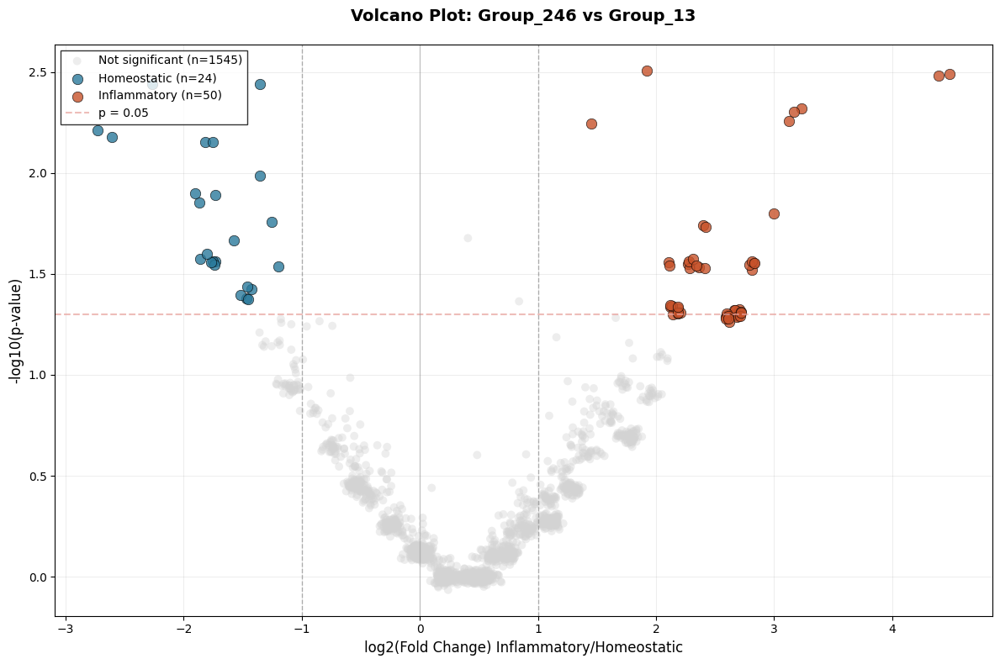

Static plot saved to: volcano_plot.png


In [7]:
# Volcano plot of all variants 
import matplotlib.pyplot as plt
import numpy as np

pval_threshold = 0.05
log2fc_threshold = 1.0

# Determine colors and significance
colors = []
labels = []
for idx, row in df.iterrows():
    sig = row['pval'] < pval_threshold and abs(row['log2fc']) > log2fc_threshold
    if sig:
        if row['log2fc'] > 0:
            colors.append('#C7522A')  # Inflammatory - reddish brown
            labels.append('Inflammatory')
        else:
            colors.append('#2B7A9B')  # Homeostatic - teal blue
            labels.append('Homeostatic')
    else:
        colors.append('#D3D3D3')  # Not significant - light grey
        labels.append('Not significant')

# Add jitter
jitter_x = np.random.normal(0, 0.05, len(df))
jitter_y = np.random.normal(0, 0.02, len(df))

# Create figure with white background
fig, ax = plt.subplots(figsize=(12, 8), facecolor='white')
ax.set_facecolor('white')

# Plot non-significant points first (background)
mask_ns = np.array(labels) == 'Not significant'
ax.scatter(
    df['log2fc'][mask_ns] + jitter_x[mask_ns],
    -np.log10(df['pval'][mask_ns]) + jitter_y[mask_ns],
    c='#D3D3D3',
    s=50,
    alpha=0.4,
    edgecolors='none',
    label=f'Not significant (n={mask_ns.sum()})'
)

# Plot homeostatic points
mask_homeo = np.array(labels) == 'Homeostatic'
if mask_homeo.sum() > 0:
    ax.scatter(
        df['log2fc'][mask_homeo] + jitter_x[mask_homeo],
        -np.log10(df['pval'][mask_homeo]) + jitter_y[mask_homeo],
        c='#2B7A9B',
        s=80,
        alpha=0.8,
        edgecolors='black',
        linewidths=0.5,
        label=f'Homeostatic (n={mask_homeo.sum()})'
    )

# Plot inflammatory points
mask_inflam = np.array(labels) == 'Inflammatory'
if mask_inflam.sum() > 0:
    ax.scatter(
        df['log2fc'][mask_inflam] + jitter_x[mask_inflam],
        -np.log10(df['pval'][mask_inflam]) + jitter_y[mask_inflam],
        c='#C7522A',
        s=80,
        alpha=0.8,
        edgecolors='black',
        linewidths=0.5,
        label=f'Inflammatory (n={mask_inflam.sum()})'
    )

# Add threshold lines
ax.axvline(x=-log2fc_threshold, linestyle='--', color='grey', alpha=0.6, linewidth=1)
ax.axvline(x=log2fc_threshold, linestyle='--', color='grey', alpha=0.6, linewidth=1)
ax.axhline(y=-np.log10(pval_threshold), linestyle='--', color='#E8A19C', alpha=0.7, linewidth=1.5, label=f'p = {pval_threshold}')

# Add vertical line at x=0
ax.axvline(x=0, linestyle='-', color='grey', alpha=0.4, linewidth=1)

# Labels and title
ax.set_xlabel('log2(Fold Change) Inflammatory/Homeostatic', fontsize=12, fontweight='normal')
ax.set_ylabel('-log10(p-value)', fontsize=12, fontweight='normal')
ax.set_title('Volcano Plot: Group_246 vs Group_13', fontsize=14, fontweight='bold', pad=20)

# Grid
ax.grid(True, alpha=0.2, linestyle='-', linewidth=0.5, color='grey')
ax.set_axisbelow(True)

# Legend
ax.legend(loc='upper left', frameon=True, fancybox=False, shadow=False, 
          edgecolor='black', fontsize=10)

# Spines
ax.spines['top'].set_visible(True)
ax.spines['right'].set_visible(True)
ax.spines['top'].set_color('black')
ax.spines['right'].set_color('black')
ax.spines['bottom'].set_color('black')
ax.spines['left'].set_color('black')

plt.tight_layout()
plt.savefig('volcano_plot.png', dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

print(f"Static plot saved to: volcano_plot.png")


PATHOGENIC VARIANT ENRICHMENT ANALYSIS

Settings:
  VAF threshold: 3.0%
  APOGEE2 threshold: ≥0
  Min cells: 10
  Max prevalence: 50.0%
  Significance: p < 0.05

TESTING PATHOGENIC VARIANTS
Progress: 0/44436
Progress: 5000/44436
Progress: 10000/44436
Progress: 15000/44436
Progress: 20000/44436
Progress: 25000/44436
Progress: 30000/44436
Progress: 35000/44436
Progress: 40000/44436

RESULTS
Pathogenic variants tested: 5794
Significant (p < 0.05): 170
  - Inflammatory-enriched: 88
  - Homeostatic-enriched: 82

Top 10 inflammatory-enriched pathogenic variants:
  variant  apogee2_score  n_inflammatory  n_homeostatic   log2FC  p_value
C-10242-T       0.782163              10              0 3.133572 0.003304
C-10891-A       0.100158              10              0 3.133572 0.003304
C-13780-A       0.012174              29              7 1.565237 0.003407
 C-5338-T       0.758460              13              1 2.477948 0.005188
G-12499-A       0.019820              13              1 2.477948 0.

/home/elliot/miniconda3/envs/atac_env/lib/python3.9/site-packages/matplotlib/collections.py:996: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor
/home/elliot/miniconda3/envs/atac_env/lib/python3.9/site-packages/matplotlib/collections.py:996: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor
/home/elliot/miniconda3/envs/atac_env/lib/python3.9/site-packages/matplotlib/collections.py:996: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


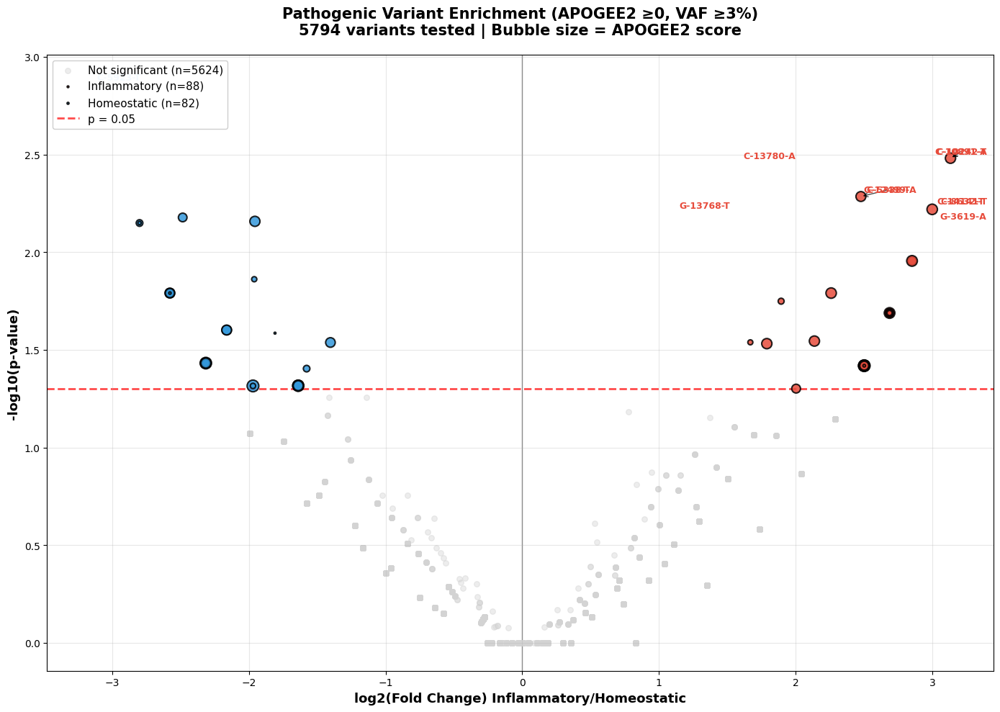


✓ Volcano plot saved to pathogenic_variants_volcano.pdf/png
✓ Results saved:
  - pathogenic_variants_enrichment_results.csv (all 5794 variants)
  - pathogenic_variants_enrichment_significant.csv (170 significant)

SUMMARY
Tested 5794 pathogenic variants
Expected false positives at p<0.05: 289.7
Observed significant variants: 170
⚠ No enrichment over background (weak signal)


In [ ]:
#voclano plot for pathogenic variants
import numpy as np
from scipy.stats import fisher_exact, mannwhitneyu
import pandas as pd
import matplotlib.pyplot as plt
from adjustText import adjust_text

print("=" * 70)
print("PATHOGENIC VARIANT ENRICHMENT ANALYSIS")
print("=" * 70)

# Settings
vaf_threshold = 0.03  # 3% VAF for detection
min_cells_total = 10
max_prevalence = 0.5
pathogenicity_threshold = 0.716  # APOGEE2 cutoff for pathogenic
p_threshold = 0.05  # Nominal p-value threshold

print(f"\nSettings:")
print(f"  VAF threshold: {vaf_threshold*100}%")
print(f"  APOGEE2 threshold: ≥{pathogenicity_threshold}")
print(f"  Min cells: {min_cells_total}")
print(f"  Max prevalence: {max_prevalence*100}%")
print(f"  Significance: p < {p_threshold}")

# ============================================================================
# TECHNICAL CONTROL: Check for Sequencing Depth Bias
# ============================================================================
# print("\n" + "=" * 70)
# print("TECHNICAL CONTROL: Sequencing Depth Check")
# print("=" * 70)

# # Calculate total VAF per cell (proxy for mtDNA coverage/depth)
# total_vaf_per_cell = vaf_matrix.sum(axis=1)
# total_vaf_inflam = total_vaf_per_cell[group_2_4_6_mask]
# total_vaf_homeo = total_vaf_per_cell[group_1_3_mask]

# # Test if depth differs between groups
# stat_depth, p_depth = mannwhitneyu(total_vaf_inflam, total_vaf_homeo)

# print(f"Total VAF (Inflammatory): {total_vaf_inflam.mean():.3f} ± {total_vaf_inflam.std():.3f}")
# print(f"Total VAF (Homeostatic):  {total_vaf_homeo.mean():.3f} ± {total_vaf_homeo.std():.3f}")
# print(f"Fold Change: {total_vaf_inflam.mean() / total_vaf_homeo.mean():.3f}x")
# print(f"Mann-Whitney U p-value: {p_depth:.4e}")

# if p_depth < 0.05:
#     fc_depth = total_vaf_inflam.mean() / total_vaf_homeo.mean()
#     print(f"\n⚠️  WARNING: Sequencing depth differs significantly!")
#     print(f"   Inflammatory cells have {fc_depth:.2f}x coverage")
#     print(f"   This may confound variant detection rates.")
#     print(f"   → Using proportion-based Fisher's test (partially robust)")
# else:
#     print("\n✓ No significant depth difference detected - analysis is unbiased")

# Set p_depth to 1.0 (non-significant) since we're not checking
p_depth = 1.0

# ============================================================================
# VARIANT ENRICHMENT TESTING
# ============================================================================
print("\n" + "=" * 70)
print("TESTING PATHOGENIC VARIANTS")
print("=" * 70)

# Get APOGEE2 scores from variant_summary
variant_summary = mgatk.uns['variant_summary']

results = []

# Convert variant_names to list if needed
if not isinstance(variant_names, list):
    variant_names_list = list(variant_names)
else:
    variant_names_list = variant_names

# Test all pathogenic variants
for i, variant in enumerate(variant_names_list):
    if i % 5000 == 0:
        print(f"Progress: {i}/{len(variant_names_list)}")
    
    # Filter: Only pathogenic variants
    apogee_score = variant_summary.iloc[i]['APOGEE2_score']
    
    # Skip if no APOGEE2 score or not pathogenic
    if pd.isna(apogee_score) or apogee_score < pathogenicity_threshold:
        continue
    
    # Get VAFs for each group
    variant_vaf = vaf_matrix[:, i]
    g246_vaf = variant_vaf[group_2_4_6_mask]  # Inflammatory
    g13_vaf = variant_vaf[group_1_3_mask]      # Homeostatic
    
    # Count cells above VAF threshold
    g246_with = (g246_vaf > vaf_threshold).sum()
    g13_with = (g13_vaf > vaf_threshold).sum()
    
    # Quality filters
    total_with = (variant_vaf > 0.01).sum()
    prevalence = total_with / len(variant_vaf)
    
    if total_with < min_cells_total or prevalence > max_prevalence:
        continue
    
    # Fisher's exact test (two-sided)
    table = [[g246_with, len(g246_vaf) - g246_with], 
             [g13_with, len(g13_vaf) - g13_with]]
    odds_ratio, p_value = fisher_exact(table, alternative='two-sided')
    
    # Calculate log2 fold change
    prop_246 = g246_with / len(g246_vaf)
    prop_13 = g13_with / len(g13_vaf)
    log2fc = np.log2((prop_246 + 0.001) / (prop_13 + 0.001))
    
    results.append({
        'variant': variant,
        'apogee2_score': apogee_score,
        'n_inflammatory': g246_with,
        'n_homeostatic': g13_with,
        'prop_inflammatory': prop_246,
        'prop_homeostatic': prop_13,
        'log2FC': log2fc,
        'odds_ratio': odds_ratio,
        'p_value': p_value,
        'total_cells': total_with
    })

# Create dataframe
df = pd.DataFrame(results)

if len(df) == 0:
    print("\n⚠️ No pathogenic variants passed filters!")
    print("Check your APOGEE2 threshold and min_cells_total settings")
else:
    # Identify significant variants
    df['significant'] = df['p_value'] < p_threshold
    df['direction'] = df['log2FC'].apply(lambda x: 'Inflammatory' if x > 0 else 'Homeostatic')
    
    df_sig = df[df['significant'] == True]
    df_inflam = df_sig[df_sig['log2FC'] > 0]
    df_homeo = df_sig[df_sig['log2FC'] < 0]
    
    print(f"\n" + "=" * 70)
    print("RESULTS")
    print("=" * 70)
    print(f"Pathogenic variants tested: {len(df)}")
    print(f"Significant (p < {p_threshold}): {len(df_sig)}")
    print(f"  - Inflammatory-enriched: {len(df_inflam)}")
    print(f"  - Homeostatic-enriched: {len(df_homeo)}")
    
    # Print top results
    print(f"\nTop 10 inflammatory-enriched pathogenic variants:")
    if len(df_inflam) > 0:
        print(df_inflam.nsmallest(10, 'p_value')[['variant', 'apogee2_score', 'n_inflammatory', 
                                                    'n_homeostatic', 'log2FC', 'p_value']].to_string(index=False))
    else:
        print("  None found")
    
    print(f"\nTop 10 homeostatic-enriched pathogenic variants:")
    if len(df_homeo) > 0:
        print(df_homeo.nsmallest(10, 'p_value')[['variant', 'apogee2_score', 'n_inflammatory', 
                                                   'n_homeostatic', 'log2FC', 'p_value']].to_string(index=False))
    else:
        print("  None found")
    
    # ============================================================================
    # VISUALIZATION
    # ============================================================================
    
    fig, ax = plt.subplots(figsize=(14, 10))
    
    # Non-significant variants (gray)
    df_ns = df[~df['significant']]
    ax.scatter(df_ns['log2FC'], -np.log10(df_ns['p_value']), 
              c='lightgray', s=30, alpha=0.4, label=f'Not significant (n={len(df_ns)})', zorder=1)
    
    # Significant variants (colored by direction)
    if len(df_inflam) > 0:
        sizes_inflam = 80 + (df_inflam['apogee2_score'] - 0.7) * 300
        ax.scatter(df_inflam['log2FC'], -np.log10(df_inflam['p_value']), 
                  c='#e74c3c', s=sizes_inflam, alpha=0.85, edgecolor='black', linewidth=1.5,
                  label=f'Inflammatory (n={len(df_inflam)})', zorder=3)
    
    if len(df_homeo) > 0:
        sizes_homeo = 80 + (df_homeo['apogee2_score'] - 0.7) * 300
        ax.scatter(df_homeo['log2FC'], -np.log10(df_homeo['p_value']), 
                  c='#3498db', s=sizes_homeo, alpha=0.85, edgecolor='black', linewidth=1.5,
                  label=f'Homeostatic (n={len(df_homeo)})', zorder=3)
    
    # Add significance threshold line
    ax.axhline(-np.log10(p_threshold), color='red', linestyle='--', linewidth=2, 
              alpha=0.7, label=f'p = {p_threshold}', zorder=0)
    ax.axvline(0, color='black', linestyle='-', linewidth=1, alpha=0.5, zorder=0)
    
    # Label top 10 significant variants
    top_variants = df_sig.nsmallest(10, 'p_value')
    texts = []
    
    for _, row in top_variants.iterrows():
        color = '#e74c3c' if row['log2FC'] > 0 else '#3498db'
        text = ax.text(row['log2FC'], -np.log10(row['p_value']), 
                       row['variant'],
                       fontsize=9, fontweight='bold', color=color, zorder=4)
        texts.append(text)
    
    # Adjust text to avoid overlap
    if len(texts) > 0:
        adjust_text(texts, ax=ax,
                   arrowprops=dict(arrowstyle='->', color='black', lw=1, alpha=0.7),
                   force_text=(0.3, 0.5),
                   force_points=(0.2, 0.3),
                   expand_points=(1.5, 1.5),
                   lim=300)
    
    ax.set_xlabel('log2(Fold Change) Inflammatory/Homeostatic', fontsize=13, fontweight='bold')
    ax.set_ylabel('-log10(p-value)', fontsize=13, fontweight='bold')
    
    # Title without depth warning
    title = f'Pathogenic Variant Enrichment (APOGEE2 ≥{pathogenicity_threshold}, VAF ≥{vaf_threshold*100:.0f}%)\n'
    title += f'{len(df)} variants tested | Bubble size = APOGEE2 score'
    
    ax.set_title(title, fontsize=15, fontweight='bold', pad=20)
    ax.legend(loc='upper left', fontsize=11, framealpha=0.95)
    ax.grid(alpha=0.3, zorder=0)
    
    plt.tight_layout()
    plt.savefig('pathogenic_variants_volcano.pdf', dpi=300, bbox_inches='tight')
    plt.savefig('pathogenic_variants_volcano.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    print("\n✓ Volcano plot saved to pathogenic_variants_volcano.pdf/png")
    
    # Save results
    df.to_csv('pathogenic_variants_enrichment_results.csv', index=False)
    df_sig.to_csv('pathogenic_variants_enrichment_significant.csv', index=False)
    
    print(f"✓ Results saved:")
    print(f"  - pathogenic_variants_enrichment_results.csv (all {len(df)} variants)")
    print(f"  - pathogenic_variants_enrichment_significant.csv ({len(df_sig)} significant)")
    
    # ============================================================================
    # SUMMARY
    # ============================================================================
    print("\n" + "=" * 70)
    print("SUMMARY")
    print("=" * 70)
    print(f"Tested {len(df)} pathogenic variants")
    print(f"Expected false positives at p<0.05: {len(df)*0.05:.1f}")
    print(f"Observed significant variants: {len(df_sig)}")
    
    if len(df_sig) > len(df)*0.05:
        print(f"✓ {len(df_sig) - len(df)*0.05:.1f} excess hits over background")
    else:
        print(f"⚠ No enrichment over background (weak signal)")
    
    print("=" * 70)


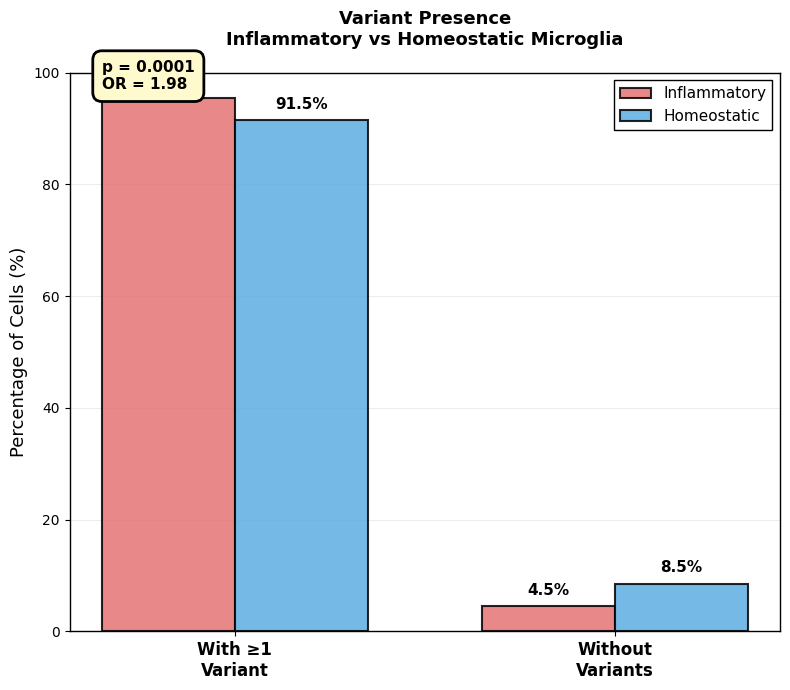


Group_246 (Inflammatory): 1228/1286 cells (95.5%) with ≥1 variant
Group_13 (Homeostatic): 920/1006 cells (91.5%) with ≥1 variant
Fisher's exact test: p = 0.0001, OR = 1.98


In [10]:
# Is an inflammatory cell more likely to carry 1 or more variant than a homeostatic cell
import matplotlib.pyplot as plt
from scipy.stats import fisher_exact

# Count cells with at least one variant (above VAF cutoff)
vaf_cutoff = 0.03

# For each cell, check if it has ANY variant above threshold
has_variant_246 = (vaf_matrix[group_246_mask, :] > vaf_cutoff).any(axis=1).sum()
no_variant_246 = n_246_total - has_variant_246

has_variant_13 = (vaf_matrix[group_13_mask, :] > vaf_cutoff).any(axis=1).sum()
no_variant_13 = n_13_total - has_variant_13

# Calculate proportions
prop_246 = has_variant_246 / n_246_total
prop_13 = has_variant_13 / n_13_total

# Statistical test
table = [[has_variant_246, no_variant_246], [has_variant_13, no_variant_13]]
odds, pval = fisher_exact(table)

# Bar plot with matching aesthetic
fig, ax = plt.subplots(figsize=(8, 7), facecolor='white')
ax.set_facecolor('white')

# Bar setup
x_positions = [0, 1]
groups = ['With ≥1\nVariant', 'Without\nVariants']

bar_width = 0.35

# Create grouped bars
bars_246 = ax.bar([x - bar_width/2 for x in x_positions], 
                   [prop_246 * 100, (1 - prop_246) * 100],
                   bar_width, 
                   color='#E57373',
                   alpha=0.85,
                   edgecolor='black',
                   linewidth=1.5,
                   label='Inflammatory')

bars_13 = ax.bar([x + bar_width/2 for x in x_positions], 
                  [prop_13 * 100, (1 - prop_13) * 100],
                  bar_width,
                  color='#5DADE2',
                  alpha=0.85,
                  edgecolor='black',
                  linewidth=1.5,
                  label='Homeostatic')

# Labels and formatting
ax.set_ylabel('Percentage of Cells (%)', fontsize=13, fontweight='normal')
ax.set_ylim(0, 100)
ax.set_xticks(x_positions)
ax.set_xticklabels(groups, fontsize=12, fontweight='bold')
ax.set_title('Variant Presence\nInflammatory vs Homeostatic Microglia', 
             fontsize=13, fontweight='bold', pad=20)

# Add percentage labels on bars
for bar in bars_246:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2, height + 1.5,
            f'{height:.1f}%',
            ha='center', va='bottom', fontsize=11, fontweight='bold')

for bar in bars_13:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2, height + 1.5,
            f'{height:.1f}%',
            ha='center', va='bottom', fontsize=11, fontweight='bold')

# Add pale yellow box with test results (positioned on left side, clear of bars)
textstr = f"p = {pval:.4f}\nOR = {odds:.2f}"
props = dict(boxstyle='round,pad=0.6', facecolor='#FFFACD', edgecolor='black', linewidth=2)
ax.text(-0.35, 97, textstr, fontsize=11, bbox=props, fontweight='bold')

# Legend
ax.legend(loc='upper right', frameon=True, fancybox=False, shadow=False,
          edgecolor='black', fontsize=11, framealpha=1)

# Grid
ax.grid(True, axis='y', alpha=0.2, linestyle='-', linewidth=0.5, color='grey')
ax.set_axisbelow(True)

# Spines
for spine in ax.spines.values():
    spine.set_visible(True)
    spine.set_color('black')
    spine.set_linewidth(1)

plt.tight_layout()
plt.savefig('variant_burden_barplot.pdf', dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

print(f"\nGroup_246 (Inflammatory): {has_variant_246}/{n_246_total} cells ({prop_246:.1%}) with ≥1 variant")
print(f"Group_13 (Homeostatic): {has_variant_13}/{n_13_total} cells ({prop_13:.1%}) with ≥1 variant")
print(f"Fisher's exact test: p = {pval:.4f}, OR = {odds:.2f}")


In [49]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import numpy as np
from scipy.stats import fisher_exact
import pandas as pd

print("="*70)
print("GENE-LEVEL VARIANT ENRICHMENT AT MULTIPLE VAF THRESHOLDS")
print("="*70)

# mtDNA gene coordinates
MT_GENES = {
    'MT-TF': (577, 647), 'MT-RNR1': (648, 1601), 'MT-TV': (1602, 1670),
    'MT-RNR2': (1671, 3229), 'MT-TL1': (3230, 3304), 'MT-ND1': (3307, 4262),
    'MT-TI': (4263, 4331), 'MT-TQ': (4329, 4400), 'MT-TM': (4402, 4469),
    'MT-ND2': (4470, 5511), 'MT-TW': (5512, 5579), 'MT-TA': (5587, 5655),
    'MT-TN': (5657, 5729), 'MT-TC': (5761, 5826), 'MT-TY': (5826, 5891),
    'MT-CO1': (5904, 7445), 'MT-TS1': (7446, 7514), 'MT-TD': (7518, 7585),
    'MT-CO2': (7586, 8269), 'MT-TK': (8295, 8364), 'MT-ATP8': (8366, 8572),
    'MT-ATP6': (8527, 9207), 'MT-CO3': (9207, 9990), 'MT-TG': (9991, 10058),
    'MT-ND3': (10059, 10404), 'MT-TR': (10405, 10469), 'MT-ND4L': (10470, 10766),
    'MT-ND4': (10760, 12137), 'MT-TH': (12138, 12206), 'MT-TS2': (12207, 12265),
    'MT-TL2': (12266, 12336), 'MT-ND5': (12337, 14148), 'MT-ND6': (14149, 14673),
    'MT-TE': (14674, 14742), 'MT-CYTB': (14747, 15887), 'MT-TT': (15888, 15953),
    'MT-TP': (15956, 16023), 'MT-DLOOP': (16024, 576)
}

def map_variant_to_gene(variant_name):
    try:
        pos = int(variant_name.split('-')[1])
        for gene, (start, end) in MT_GENES.items():
            if gene == 'MT-DLOOP':
                if pos >= start or pos <= end:
                    return gene
            else:
                if start <= pos <= end:
                    return gene
        return 'intergenic'
    except:
        return 'intergenic'

VAF_THRESHOLDS = [0.01, 0.03, 0.05]
min_cells_total = 10
max_prev = 0.8

results_by_vaf = {}
variant_details_by_vaf = {}

for vaf_cutoff in VAF_THRESHOLDS:
    print(f"\nAnalyzing VAF ≥ {vaf_cutoff*100:.0f}%...")
    
    variant_results = []
    
    for i, variant in enumerate(variant_names):
        vaf = vaf_matrix[:, i]
        n_246 = (vaf[group_246_mask] > vaf_cutoff).sum()
        n_13 = (vaf[group_13_mask] > vaf_cutoff).sum()
        
        if (n_246 + n_13) < min_cells_total:
            continue
        
        prev_246 = n_246 / n_246_total
        prev_13 = n_13 / n_13_total
        
        if prev_246 > max_prev and prev_13 > max_prev:
            continue
        
        table = [[n_246, n_246_total - n_246], [n_13, n_13_total - n_13]]
        odds, pval = fisher_exact(table)
        log2fc = np.log2((n_246 + 0.5) / (n_13 + 0.5))
        
        if pval < 0.05:
            gene = map_variant_to_gene(variant)
            if gene != 'intergenic':
                variant_results.append({
                    'variant': variant,
                    'gene': gene,
                    'log2fc': log2fc,
                    'pval': pval,
                    'n_246': n_246,
                    'n_13': n_13
                })
    
    df_vars = pd.DataFrame(variant_results)
    variant_details_by_vaf[vaf_cutoff] = df_vars
    
    if len(df_vars) > 0:
        gene_results = []
        for gene in df_vars['gene'].unique():
            gene_vars = df_vars[df_vars['gene'] == gene]
            n_inflammatory = (gene_vars['log2fc'] > 0).sum()
            n_homeostatic = (gene_vars['log2fc'] < 0).sum()
            
            variant_list = gene_vars['variant'].tolist()
            cell_counts = [f"{row['variant']}: {row['n_246']} vs {row['n_13']}" 
                          for _, row in gene_vars.iterrows()]
            
            gene_results.append({
                'gene': gene,
                'n_variants': len(gene_vars),
                'n_inflammatory': n_inflammatory,
                'n_homeostatic': n_homeostatic,
                'mean_log2fc': gene_vars['log2fc'].mean(),
                'min_pval': gene_vars['pval'].min(),
                'variants': '<br>'.join(variant_list[:5]) + ('<br>...' if len(variant_list) > 5 else ''),
                'cell_counts': '<br>'.join(cell_counts[:5]) + ('<br>...' if len(cell_counts) > 5 else '')
            })
        
        results_by_vaf[vaf_cutoff] = pd.DataFrame(gene_results).sort_values('min_pval')
        print(f"  Found {len(results_by_vaf[vaf_cutoff])} genes with significant variants")
    else:
        results_by_vaf[vaf_cutoff] = pd.DataFrame()
        print(f"  No significant variants")

# Interactive 3-panel plot
fig = make_subplots(rows=1, cols=3, 
                    subplot_titles=[f'VAF ≥ {v*100:.0f}%' for v in VAF_THRESHOLDS])

for idx, vaf_cutoff in enumerate(VAF_THRESHOLDS):
    df_genes = results_by_vaf[vaf_cutoff]
    col = idx + 1
    
    if len(df_genes) == 0:
        continue
    
    colors = ['red' if fc > 0 else 'blue' for fc in df_genes['mean_log2fc']]
    
    hover_text = []
    for _, row in df_genes.iterrows():
        text = (f"<b>{row['gene']}</b><br>"
                f"Variants: {row['n_variants']}<br>"
                f"Inflammatory: {row['n_inflammatory']}<br>"
                f"Homeostatic: {row['n_homeostatic']}<br>"
                f"Mean log2fc: {row['mean_log2fc']:.2f}<br>"
                f"Min p-value: {row['min_pval']:.4f}<br><br>"
                f"<b>Top variants:</b><br>{row['cell_counts']}")
        hover_text.append(text)
    
    fig.add_trace(go.Scatter(
        x=df_genes['mean_log2fc'],
        y=-np.log10(df_genes['min_pval']),
        mode='markers+text',
        marker=dict(color=colors, size=12, opacity=0.7, line=dict(color='black', width=1)),
        text=df_genes['gene'],
        textposition='top center',
        textfont=dict(size=9),
        hovertext=hover_text,
        hoverinfo='text',
        name=f'{vaf_cutoff*100:.0f}%',
        showlegend=False
    ), row=1, col=col)
    
    fig.add_hline(y=-np.log10(0.05), line_dash="dash", line_color="black", 
                  opacity=0.5, row=1, col=col)
    fig.add_vline(x=0, line_dash="dash", line_color="black", 
                  opacity=0.5, row=1, col=col)

fig.update_xaxes(title_text='Mean log2(FC)', row=1, col=2)
fig.update_yaxes(title_text='-log10(min p-value)', row=1, col=1)

fig.update_layout(
    title_text='Gene-Level Variant Enrichment: Group_246 vs Group_13',
    height=600,
    width=1400,
    hovermode='closest'
)

fig.write_html('gene_enrichment_interactive.html')
fig.show()

print("\nInteractive plot saved to gene_enrichment_interactive.html")


GENE-LEVEL VARIANT ENRICHMENT AT MULTIPLE VAF THRESHOLDS

Analyzing VAF ≥ 1%...
  Found 28 genes with significant variants

Analyzing VAF ≥ 3%...
  Found 20 genes with significant variants

Analyzing VAF ≥ 5%...
  Found 7 genes with significant variants



Interactive plot saved to gene_enrichment_interactive.html


In [54]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import numpy as np
from scipy.stats import fisher_exact
import pandas as pd

print("="*70)
print("MITOCHONDRIAL COMPLEX GENE ENRICHMENT ANALYSIS")
print("="*70)

# mtDNA gene coordinates WITH COMPLEX ANNOTATIONS
MT_GENES = {
    'MT-ND1': (3307, 4262, 'Complex I'),
    'MT-ND2': (4470, 5511, 'Complex I'),
    'MT-ND3': (10059, 10404, 'Complex I'),
    'MT-ND4': (10760, 12137, 'Complex I'),
    'MT-ND4L': (10470, 10766, 'Complex I'),
    'MT-ND5': (12337, 14148, 'Complex I'),
    'MT-ND6': (14149, 14673, 'Complex I'),
    'MT-CO1': (5904, 7445, 'Complex IV'),
    'MT-CO2': (7586, 8269, 'Complex IV'),
    'MT-CO3': (9207, 9990, 'Complex IV'),
    'MT-ATP6': (8527, 9207, 'Complex V'),
    'MT-ATP8': (8366, 8572, 'Complex V'),
    'MT-CYTB': (14747, 15887, 'Complex III'),
    'MT-RNR1': (648, 1601, 'rRNA'),
    'MT-RNR2': (1671, 3229, 'rRNA'),
    'MT-DLOOP': (16024, 576, 'D-loop'),
    'MT-TF': (577, 647, 'tRNA'), 'MT-TV': (1602, 1670, 'tRNA'),
    'MT-TL1': (3230, 3304, 'tRNA'), 'MT-TI': (4263, 4331, 'tRNA'),
    'MT-TQ': (4329, 4400, 'tRNA'), 'MT-TM': (4402, 4469, 'tRNA'),
    'MT-TW': (5512, 5579, 'tRNA'), 'MT-TA': (5587, 5655, 'tRNA'),
    'MT-TN': (5657, 5729, 'tRNA'), 'MT-TC': (5761, 5826, 'tRNA'),
    'MT-TY': (5826, 5891, 'tRNA'), 'MT-TS1': (7446, 7514, 'tRNA'),
    'MT-TD': (7518, 7585, 'tRNA'), 'MT-TK': (8295, 8364, 'tRNA'),
    'MT-TG': (9991, 10058, 'tRNA'), 'MT-TR': (10405, 10469, 'tRNA'),
    'MT-TH': (12138, 12206, 'tRNA'), 'MT-TS2': (12207, 12265, 'tRNA'),
    'MT-TL2': (12266, 12336, 'tRNA'), 'MT-TE': (14674, 14742, 'tRNA'),
    'MT-TT': (15888, 15953, 'tRNA'), 'MT-TP': (15956, 16023, 'tRNA')
}

def map_variant_to_gene_and_complex(variant_name):
    try:
        pos = int(variant_name.split('-')[1])
        for gene, coords in MT_GENES.items():
            if gene == 'MT-DLOOP':
                start, end, complex_name = coords
                if pos >= start or pos <= end:
                    return gene, complex_name
            else:
                start, end, complex_name = coords
                if start <= pos <= end:
                    return gene, complex_name
        return 'intergenic', 'None'
    except:
        return 'intergenic', 'None'

VAF_THRESHOLDS = [0.01, 0.03, 0.05]
min_cells_total = 10
max_prev = 0.8

results_by_vaf_complex = {}

for vaf_cutoff in VAF_THRESHOLDS:
    print(f"\nAnalyzing VAF ≥ {vaf_cutoff*100:.0f}%...")
    
    variant_results = []
    
    for i, variant in enumerate(variant_names):
        vaf = vaf_matrix[:, i]
        n_246 = (vaf[group_246_mask] > vaf_cutoff).sum()
        n_13 = (vaf[group_13_mask] > vaf_cutoff).sum()
        
        if (n_246 + n_13) < min_cells_total:
            continue
        
        prev_246 = n_246 / n_246_total
        prev_13 = n_13 / n_13_total
        
        if prev_246 > max_prev and prev_13 > max_prev:
            continue
        
        table = [[n_246, n_246_total - n_246], [n_13, n_13_total - n_13]]
        odds, pval = fisher_exact(table)
        log2fc = np.log2((n_246 + 0.5) / (n_13 + 0.5))
        
        if pval < 0.05:
            gene, complex_name = map_variant_to_gene_and_complex(variant)
            if gene != 'intergenic':
                variant_results.append({
                    'variant': variant,
                    'gene': gene,
                    'complex': complex_name,
                    'log2fc': log2fc,
                    'pval': pval,
                    'n_246': n_246,
                    'n_13': n_13
                })
    
    df_vars = pd.DataFrame(variant_results)
    
    if len(df_vars) > 0:
        # Aggregate by complex
        complex_results = []
        for complex_name in ['Complex I', 'Complex III', 'Complex IV', 'Complex V', 'rRNA', 'tRNA', 'D-loop']:
            complex_vars = df_vars[df_vars['complex'] == complex_name]
            
            if len(complex_vars) == 0:
                continue
            
            n_inflammatory = (complex_vars['log2fc'] > 0).sum()
            n_homeostatic = (complex_vars['log2fc'] < 0).sum()
            
            genes_in_complex = complex_vars['gene'].unique()
            variant_details = [f"{row['variant']} ({row['gene']}): {row['n_246']} vs {row['n_13']}" 
                              for _, row in complex_vars.iterrows()]
            
            complex_results.append({
                'complex': complex_name,
                'n_variants': len(complex_vars),
                'n_genes': len(genes_in_complex),
                'n_inflammatory': n_inflammatory,
                'n_homeostatic': n_homeostatic,
                'mean_log2fc': complex_vars['log2fc'].mean(),
                'min_pval': complex_vars['pval'].min(),
                'genes': ', '.join(genes_in_complex),
                'variant_details': variant_details
            })
        
        results_by_vaf_complex[vaf_cutoff] = pd.DataFrame(complex_results).sort_values('min_pval')
        print(f"  Found {len(results_by_vaf_complex[vaf_cutoff])} complexes with significant variants")
    else:
        results_by_vaf_complex[vaf_cutoff] = pd.DataFrame()
        print(f"  No significant variants")

# Interactive 3-panel plot
fig = make_subplots(rows=1, cols=3, 
                    subplot_titles=[f'VAF ≥ {v*100:.0f}%' for v in VAF_THRESHOLDS])

# Color map for complexes
complex_colors = {
    'Complex I': '#e74c3c',
    'Complex III': '#3498db',
    'Complex IV': '#2ecc71',
    'Complex V': '#f39c12',
    'rRNA': '#9b59b6',
    'tRNA': '#95a5a6',
    'D-loop': '#34495e'
}

for idx, vaf_cutoff in enumerate(VAF_THRESHOLDS):
    df_complex = results_by_vaf_complex[vaf_cutoff]
    col = idx + 1
    
    if len(df_complex) == 0:
        continue
    
    colors = [complex_colors.get(c, 'gray') for c in df_complex['complex']]
    
    hover_text = []
    for _, row in df_complex.iterrows():
        details = '<br>'.join(row['variant_details'][:10])
        if len(row['variant_details']) > 10:
            details += '<br>...'
        text = (f"<b>{row['complex']}</b><br>"
                f"Variants: {row['n_variants']}<br>"
                f"Genes: {row['n_genes']} ({row['genes']})<br>"
                f"Inflammatory: {row['n_inflammatory']}<br>"
                f"Homeostatic: {row['n_homeostatic']}<br>"
                f"Mean log2fc: {row['mean_log2fc']:.2f}<br>"
                f"Min p-value: {row['min_pval']:.4f}<br><br>"
                f"<b>Top variants:</b><br>{details}")
        hover_text.append(text)
    
    fig.add_trace(go.Scatter(
        x=df_complex['mean_log2fc'],
        y=-np.log10(df_complex['min_pval']),
        mode='markers+text',
        marker=dict(color=colors, size=15, opacity=0.8, line=dict(color='black', width=1)),
        text=df_complex['complex'],
        textposition='top center',
        textfont=dict(size=10, color='black'),
        hovertext=hover_text,
        hoverinfo='text',
        name=f'{vaf_cutoff*100:.0f}%',
        showlegend=False
    ), row=1, col=col)
    
    fig.add_hline(y=-np.log10(0.05), line_dash="dash", line_color="black", 
                  opacity=0.5, row=1, col=col)
    fig.add_vline(x=0, line_dash="dash", line_color="black", 
                  opacity=0.5, row=1, col=col)

fig.update_xaxes(title_text='Mean log2(FC)', row=1, col=2)
fig.update_yaxes(title_text='-log10(min p-value)', row=1, col=1)

fig.update_layout(
    title_text='Mitochondrial Complex Enrichment: Group_246 vs Group_13',
    height=600,
    width=1400,
    hovermode='closest'
)

fig.write_html('complex_enrichment_interactive.html')
fig.show()

print("\nInteractive plot saved to complex_enrichment_interactive.html")


MITOCHONDRIAL COMPLEX GENE ENRICHMENT ANALYSIS

Analyzing VAF ≥ 1%...
  Found 7 complexes with significant variants

Analyzing VAF ≥ 3%...
  Found 7 complexes with significant variants

Analyzing VAF ≥ 5%...
  Found 5 complexes with significant variants



Interactive plot saved to complex_enrichment_interactive.html


In [56]:
print("="*70)
print("VARIANT CONSEQUENCE SANITY CHECKS")
print("="*70)

# First, check what dataframes we have
print("\nChecking available data...")
try:
    print(f"df exists: {len(df)} rows")
    print(f"df columns: {df.columns.tolist()}")
except:
    print("df does not exist - need to run variant enrichment analysis first")
    
# Let's create the analysis from scratch using the correct data
print("\nRunning fresh variant analysis for sanity checks...")

from scipy.stats import fisher_exact
import numpy as np

# Re-run basic enrichment to get all variants
vaf_cutoff = 0.03
min_cells_total = 10
max_prev = 0.8

results = []
for i, variant in enumerate(variant_names):
    if is_artifact(variant):
        continue
    
    vaf = vaf_matrix[:, i]
    n_246 = (vaf[group_246_mask] > vaf_cutoff).sum()
    n_13 = (vaf[group_13_mask] > vaf_cutoff).sum()
    
    if (n_246 + n_13) < min_cells_total:
        continue
    
    prev_246 = n_246 / n_246_total
    prev_13 = n_13 / n_13_total
    
    if prev_246 > max_prev and prev_13 > max_prev:
        continue
    
    table = [[n_246, n_246_total - n_246], [n_13, n_13_total - n_13]]
    odds, pval = fisher_exact(table)
    log2fc = np.log2((n_246 + 0.5) / (n_13 + 0.5))
    
    # Get APOGEE2 score
    apogee_score = variant_summary.iloc[i]['APOGEE2_score']
    
    results.append({
        'variant': variant,
        'n_246': n_246,
        'n_13': n_13,
        'log2fc': log2fc,
        'pval': pval,
        'apogee2': apogee_score
    })

df_all = pd.DataFrame(results)

# Now filter to significant
df_sig = df_all[df_all['pval'] < 0.05].copy()

print(f"\nAnalyzed {len(df_all)} variants")
print(f"Significant (p < 0.05): {len(df_sig)}")

# Map to genes and complexes
protein_coding_genes = ['MT-ND1', 'MT-ND2', 'MT-ND3', 'MT-ND4', 'MT-ND4L', 'MT-ND5', 'MT-ND6',
                        'MT-CO1', 'MT-CO2', 'MT-CO3', 'MT-ATP6', 'MT-ATP8', 'MT-CYTB']

def map_variant_to_gene(variant_name):
    try:
        pos = int(variant_name.split('-')[1])
        MT_GENES_SIMPLE = {
            'MT-TF': (577, 647), 'MT-RNR1': (648, 1601), 'MT-TV': (1602, 1670),
            'MT-RNR2': (1671, 3229), 'MT-TL1': (3230, 3304), 'MT-ND1': (3307, 4262),
            'MT-TI': (4263, 4331), 'MT-TQ': (4329, 4400), 'MT-TM': (4402, 4469),
            'MT-ND2': (4470, 5511), 'MT-TW': (5512, 5579), 'MT-TA': (5587, 5655),
            'MT-TN': (5657, 5729), 'MT-TC': (5761, 5826), 'MT-TY': (5826, 5891),
            'MT-CO1': (5904, 7445), 'MT-TS1': (7446, 7514), 'MT-TD': (7518, 7585),
            'MT-CO2': (7586, 8269), 'MT-TK': (8295, 8364), 'MT-ATP8': (8366, 8572),
            'MT-ATP6': (8527, 9207), 'MT-CO3': (9207, 9990), 'MT-TG': (9991, 10058),
            'MT-ND3': (10059, 10404), 'MT-TR': (10405, 10469), 'MT-ND4L': (10470, 10766),
            'MT-ND4': (10760, 12137), 'MT-TH': (12138, 12206), 'MT-TS2': (12207, 12265),
            'MT-TL2': (12266, 12336), 'MT-ND5': (12337, 14148), 'MT-ND6': (14149, 14673),
            'MT-TE': (14674, 14742), 'MT-CYTB': (14747, 15887), 'MT-TT': (15888, 15953),
            'MT-TP': (15956, 16023), 'MT-DLOOP': (16024, 576)
        }
        for gene, (start, end) in MT_GENES_SIMPLE.items():
            if gene == 'MT-DLOOP':
                if pos >= start or pos <= end:
                    return gene
            else:
                if start <= pos <= end:
                    return gene
        return 'intergenic'
    except:
        return 'intergenic'

df_sig['gene'] = df_sig['variant'].apply(map_variant_to_gene)
df_sig['is_protein_coding'] = df_sig['gene'].isin(protein_coding_genes)

print("\n" + "="*70)
print("SANITY CHECK RESULTS")
print("="*70)

print(f"\nSignificant variants (p < 0.05): {len(df_sig)}")
print(f"  Protein-coding genes: {df_sig['is_protein_coding'].sum()}")
print(f"  Non-coding (tRNA/rRNA/D-loop): {(~df_sig['is_protein_coding']).sum()}")

print(f"\nAPOGEE2 score distribution:")
print(f"  Missing scores: {df_sig['apogee2'].isna().sum()}")
print(f"  Benign (< 0.5): {(df_sig['apogee2'] < 0.5).sum()}")
print(f"  Uncertain (0.5-0.716): {((df_sig['apogee2'] >= 0.5) & (df_sig['apogee2'] < 0.716)).sum()}")
print(f"  Pathogenic (≥ 0.716): {(df_sig['apogee2'] >= 0.716).sum()}")

df_sig['has_lowercase'] = df_sig['variant'].str.contains(r'[a-z]$', regex=True)
print(f"\nVariants with lowercase alt allele (possible synonymous): {df_sig['has_lowercase'].sum()}")

print("\n" + "="*70)
print("TOP 20 SIGNIFICANT VARIANTS BY APOGEE2 SCORE")
print("="*70)
print(df_sig.nlargest(20, 'apogee2')[['variant', 'gene', 'n_246', 'n_13', 'log2fc', 'pval', 'apogee2']])

print("\n" + "="*70)
print("VARIANTS WITH LOW APOGEE2 BUT SIGNIFICANT P-VALUE")
print("="*70)
low_apogee = df_sig[df_sig['apogee2'] < 0.5].sort_values('pval')
if len(low_apogee) > 0:
    print(low_apogee.head(20)[['variant', 'gene', 'n_246', 'n_13', 'log2fc', 'pval', 'apogee2']])
else:
    print("None found")


VARIANT CONSEQUENCE SANITY CHECKS

Checking available data...
df exists: 7 rows
df columns: ['gene', 'n_variants', 'n_inflammatory', 'n_homeostatic', 'mean_log2fc', 'min_pval']

Running fresh variant analysis for sanity checks...

Analyzed 1619 variants
Significant (p < 0.05): 76

SANITY CHECK RESULTS

Significant variants (p < 0.05): 76
  Protein-coding genes: 54
  Non-coding (tRNA/rRNA/D-loop): 22

APOGEE2 score distribution:
  Missing scores: 41
  Benign (< 0.5): 22
  Uncertain (0.5-0.716): 6
  Pathogenic (≥ 0.716): 7

Variants with lowercase alt allele (possible synonymous): 2

TOP 20 SIGNIFICANT VARIANTS BY APOGEE2 SCORE
        variant     gene  n_246  n_13    log2fc      pval   apogee2
95    A-15216-G  MT-CYTB     11     1  2.938599  0.016197  0.794414
442   C-10242-T   MT-ND3     10     0  4.392317  0.003304  0.782163
233    C-7701-T   MT-CO2     12     2  2.321928  0.029398  0.781212
803   C-11921-T   MT-ND4     10     1  2.807355  0.028521  0.781141
269    A-3937-T   MT-ND1  

In [53]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import numpy as np
from scipy.stats import fisher_exact
import pandas as pd

print("="*70)
print("PATHOGENIC VARIANT ENRICHMENT BY GENE (INTERACTIVE)")
print("="*70)

# mtDNA gene coordinates
MT_GENES = {
    'MT-TF': (577, 647), 'MT-RNR1': (648, 1601), 'MT-TV': (1602, 1670),
    'MT-RNR2': (1671, 3229), 'MT-TL1': (3230, 3304), 'MT-ND1': (3307, 4262),
    'MT-TI': (4263, 4331), 'MT-TQ': (4329, 4400), 'MT-TM': (4402, 4469),
    'MT-ND2': (4470, 5511), 'MT-TW': (5512, 5579), 'MT-TA': (5587, 5655),
    'MT-TN': (5657, 5729), 'MT-TC': (5761, 5826), 'MT-TY': (5826, 5891),
    'MT-CO1': (5904, 7445), 'MT-TS1': (7446, 7514), 'MT-TD': (7518, 7585),
    'MT-CO2': (7586, 8269), 'MT-TK': (8295, 8364), 'MT-ATP8': (8366, 8572),
    'MT-ATP6': (8527, 9207), 'MT-CO3': (9207, 9990), 'MT-TG': (9991, 10058),
    'MT-ND3': (10059, 10404), 'MT-TR': (10405, 10469), 'MT-ND4L': (10470, 10766),
    'MT-ND4': (10760, 12137), 'MT-TH': (12138, 12206), 'MT-TS2': (12207, 12265),
    'MT-TL2': (12266, 12336), 'MT-ND5': (12337, 14148), 'MT-ND6': (14149, 14673),
    'MT-TE': (14674, 14742), 'MT-CYTB': (14747, 15887), 'MT-TT': (15888, 15953),
    'MT-TP': (15956, 16023), 'MT-DLOOP': (16024, 576)
}

variant_summary = mgatk.uns['variant_summary']

if not isinstance(variant_names, list):
    variant_names_list = list(variant_names)
else:
    variant_names_list = variant_names

# Map variants to genes
variant_to_gene = {}
for variant_name in variant_names_list:
    try:
        parts = variant_name.split('-')
        if len(parts) >= 2:
            pos = int(parts[1])
        else:
            variant_to_gene[variant_name] = 'intergenic'
            continue
        
        assigned_gene = 'intergenic'
        for gene, (start, end) in MT_GENES.items():
            if gene == 'MT-DLOOP':
                if pos >= start or pos <= end:
                    assigned_gene = gene
                    break
            else:
                if start <= pos <= end:
                    assigned_gene = gene
                    break
        variant_to_gene[variant_name] = assigned_gene
    except Exception:
        variant_to_gene[variant_name] = 'intergenic'

gene_annotations = np.array([variant_to_gene.get(v, 'intergenic') for v in variant_names_list])
unique_genes = sorted(set(gene_annotations))

VAF_THRESHOLDS = [0.01, 0.03, 0.05]
min_cells_total = 10
max_prevalence = 0.5
pathogenic_threshold = 0.716

def analyze_gene_enrichment(vaf_matrix, vaf_threshold):
    variant_results = []
    
    for i, variant in enumerate(variant_names_list):
        apogee_score = variant_summary.iloc[i]['APOGEE2_score']
        
        if pd.isna(apogee_score) or apogee_score < pathogenic_threshold:
            continue
        
        gene = variant_to_gene.get(variant, 'intergenic')
        if gene == 'intergenic':
            continue
        
        variant_vaf = vaf_matrix[:, i]
        g246_vaf = variant_vaf[group_246_mask]
        g13_vaf = variant_vaf[group_13_mask]
        
        g246_with = (g246_vaf > vaf_threshold).sum()
        g13_with = (g13_vaf > vaf_threshold).sum()
        
        total_with = (variant_vaf > 0.01).sum()
        prevalence = total_with / len(variant_vaf)
        
        if total_with < min_cells_total or prevalence > max_prevalence:
            continue
        
        table = [[g246_with, len(g246_vaf) - g246_with], 
                 [g13_with, len(g13_vaf) - g13_with]]
        odds_ratio, p_value = fisher_exact(table)
        
        prop_g246 = g246_with / len(g246_vaf)
        prop_g13 = g13_with / len(g13_vaf)
        log2fc = np.log2((prop_g246 + 0.001) / (prop_g13 + 0.001))
        
        variant_results.append({
            'variant': variant,
            'gene': gene,
            'n_246': g246_with,
            'n_13': g13_with,
            'log2FC': log2fc,
            'p_value': p_value,
            'apogee2_score': apogee_score
        })
    
    df_variants = pd.DataFrame(variant_results)
    
    if len(df_variants) == 0:
        return pd.DataFrame(), pd.DataFrame()
    
    df_sig = df_variants[df_variants['p_value'] < 0.05]
    
    gene_results = []
    
    for gene in unique_genes:
        if gene == 'intergenic':
            continue
        
        gene_all = df_variants[df_variants['gene'] == gene]
        gene_sig = df_sig[df_sig['gene'] == gene]
        
        if len(gene_all) == 0:
            continue
        
        n_tested = len(gene_all)
        n_sig = len(gene_sig)
        
        if n_sig == 0:
            gene_results.append({
                'gene': gene,
                'n_variants_tested': n_tested,
                'n_sig_variants': 0,
                'n_inflammatory': 0,
                'n_homeostatic': 0,
                'mean_log2fc': 0,
                'min_p_value': 1.0,
                'variant_details': []
            })
            continue
        
        n_inflammatory = (gene_sig['log2FC'] > 0).sum()
        n_homeostatic = (gene_sig['log2FC'] < 0).sum()
        mean_log2fc = gene_sig['log2FC'].mean()
        min_p = gene_sig['p_value'].min()
        
        variant_details = [f"{row['variant']}: {row['n_246']} vs {row['n_13']} (APOGEE2={row['apogee2_score']:.3f}, p={row['p_value']:.4f})" 
                          for _, row in gene_sig.iterrows()]
        
        gene_results.append({
            'gene': gene,
            'n_variants_tested': n_tested,
            'n_sig_variants': n_sig,
            'n_inflammatory': n_inflammatory,
            'n_homeostatic': n_homeostatic,
            'mean_log2fc': mean_log2fc,
            'min_p_value': min_p,
            'variant_details': variant_details
        })
    
    df_genes = pd.DataFrame(gene_results)
    df_genes['neg_log10_p'] = -np.log10(df_genes['min_p_value'] + 1e-300)
    
    return df_genes, df_variants

# Run analysis
results_by_threshold = {}
for vaf_thresh in VAF_THRESHOLDS:
    print(f"\nAnalyzing VAF ≥ {vaf_thresh*100:.0f}%...")
    results_by_threshold[vaf_thresh] = analyze_gene_enrichment(vaf_matrix, vaf_thresh)

# Interactive 3-panel plot
fig = make_subplots(rows=1, cols=3, 
                    subplot_titles=[f'VAF ≥ {v*100:.0f}%' for v in VAF_THRESHOLDS],
                    horizontal_spacing=0.08)

for idx, vaf_thresh in enumerate(VAF_THRESHOLDS):
    df_genes, df_variants = results_by_threshold[vaf_thresh]
    col = idx + 1
    
    if len(df_genes) == 0:
        continue
    
    df_sig = df_genes[df_genes['n_sig_variants'] > 0]
    df_nonsig = df_genes[df_genes['n_sig_variants'] == 0]
    
    # Plot non-significant genes
    if len(df_nonsig) > 0:
        hover_nonsig = [f"<b>{row['gene']}</b><br>Tested: {row['n_variants_tested']} variants<br>Significant: 0" 
                       for _, row in df_nonsig.iterrows()]
        fig.add_trace(go.Scatter(
            x=df_nonsig['mean_log2fc'],
            y=df_nonsig['neg_log10_p'],
            mode='markers+text',
            marker=dict(color='lightgray', size=8, opacity=0.6, line=dict(color='gray', width=0.5)),
            text=df_nonsig['gene'],
            textposition='top center',
            textfont=dict(size=7, color='gray'),
            hovertext=hover_nonsig,
            hoverinfo='text',
            name='Non-sig',
            showlegend=False
        ), row=1, col=col)
    
    # Plot significant genes
    if len(df_sig) > 0:
        hover_sig = []
        for _, row in df_sig.iterrows():
            details = '<br>'.join(row['variant_details'][:5])
            if len(row['variant_details']) > 5:
                details += '<br>...'
            hover_text = (f"<b>{row['gene']}</b><br>"
                         f"Tested: {row['n_variants_tested']} variants<br>"
                         f"Significant: {row['n_sig_variants']}<br>"
                         f"Inflammatory: {row['n_inflammatory']}<br>"
                         f"Homeostatic: {row['n_homeostatic']}<br>"
                         f"Mean log2FC: {row['mean_log2fc']:.2f}<br>"
                         f"Min p-value: {row['min_p_value']:.4f}<br><br>"
                         f"<b>Top variants:</b><br>{details}")
            hover_sig.append(hover_text)
        
        fig.add_trace(go.Scatter(
            x=df_sig['mean_log2fc'],
            y=df_sig['neg_log10_p'],
            mode='markers+text',
            marker=dict(color='steelblue', size=12, opacity=0.8, line=dict(color='black', width=0.8)),
            text=df_sig['gene'],
            textposition='top center',
            textfont=dict(size=9),
            hovertext=hover_sig,
            hoverinfo='text',
            name='Significant',
            showlegend=False
        ), row=1, col=col)
    
    # Add threshold lines
    fig.add_hline(y=-np.log10(0.05), line_dash="dash", line_color="red", 
                  opacity=0.7, row=1, col=col)
    fig.add_vline(x=0, line_dash="dash", line_color="black", 
                  opacity=0.5, row=1, col=col)

fig.update_xaxes(title_text='Mean log2(FC) Inflammatory/Homeostatic', row=1, col=2)
fig.update_yaxes(title_text='-log10(min p-value)', row=1, col=1)

fig.update_layout(
    title_text='Gene-Level Pathogenic Variant Enrichment (APOGEE2 ≥ 0.716)<br>Inflammatory vs Homeostatic Microglia',
    height=600,
    width=1500,
    hovermode='closest'
)

fig.write_html('pathogenic_gene_enrichment_interactive.html')
fig.show()

print("\nInteractive plot saved to pathogenic_gene_enrichment_interactive.html")


PATHOGENIC VARIANT ENRICHMENT BY GENE (INTERACTIVE)

Analyzing VAF ≥ 1%...

Analyzing VAF ≥ 3%...

Analyzing VAF ≥ 5%...



Interactive plot saved to pathogenic_gene_enrichment_interactive.html


Do inflammatory microglia carry pathogenic variants more frequently
than homeostatic microglia?

Settings:
  - Pathogenic threshold: APOGEE2 ≥ 0.716
  - VAF threshold: ≥ 3.0%
  - Test: Fisher's exact test (two-sided)

Found 3521 pathogenic variants (APOGEE2 ≥0.716)

RESULTS

Inflammatory microglia (Groups 2,4,6):
  Total cells: 1286
  With ≥1 pathogenic variant: 1046 (81.3%)
  Without pathogenic variants: 240 (18.7%)

Homeostatic microglia (Groups 1,3):
  Total cells: 1006
  With ≥1 pathogenic variant: 778 (77.3%)
  Without pathogenic variants: 228 (22.7%)

--------------------------------------------------------------------------------
Fisher's Exact Test:
  Odds Ratio: 1.277
  P-value: 0.0189
  Significance: YES (α = 0.05)
--------------------------------------------------------------------------------


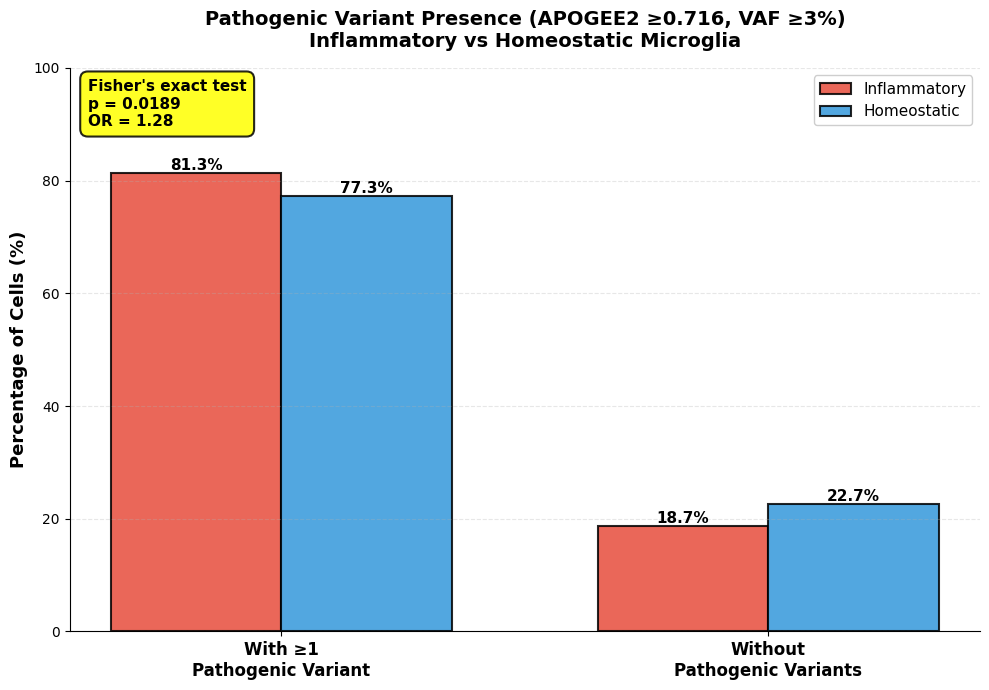


✓ Figure saved to pathogenic_presence_grouped_bars.pdf/png


In [ ]:
#is an inflammatory cell more likely to carry 1 or more pathogenic varinats thnan a homeostatic cell, at 5% the significance dissapears
import numpy as np
from scipy.stats import fisher_exact
import pandas as pd
import matplotlib.pyplot as plt

print("="*80)
print("Do inflammatory microglia carry pathogenic variants more frequently")
print("than homeostatic microglia?")
print("="*80)

# Settings
pathogenic_threshold = 0.716  # APOGEE2 cutoff
vaf_threshold = 0.03  # 3% VAF for calling a variant "present"

print(f"\nSettings:")
print(f"  - Pathogenic threshold: APOGEE2 ≥ {pathogenic_threshold}")
print(f"  - VAF threshold: ≥ {vaf_threshold*100}%")
print(f"  - Test: Fisher's exact test (two-sided)")

# Get variant_summary with APOGEE2 scores
variant_summary = mgatk.uns['variant_summary']

# Identify pathogenic variants
pathogenic_indices = []
if not isinstance(variant_names, list):
    variant_names_list = list(variant_names)
else:
    variant_names_list = variant_names

for i in range(len(variant_names_list)):
    apogee_score = variant_summary.iloc[i]['APOGEE2_score']
    if pd.notna(apogee_score) and apogee_score >= pathogenic_threshold:
        pathogenic_indices.append(i)

pathogenic_indices = np.array(pathogenic_indices)
print(f"\nFound {len(pathogenic_indices)} pathogenic variants (APOGEE2 ≥{pathogenic_threshold})")

# Extract VAF matrix for pathogenic variants only
vaf_pathogenic = vaf_matrix[:, pathogenic_indices]

# For each cell, does it have ≥1 pathogenic variant above threshold?
cells_with_pathogenic = (vaf_pathogenic > vaf_threshold).any(axis=1)

# Split by group
inflammatory_cells = cells_with_pathogenic[group_2_4_6_mask]
homeostatic_cells = cells_with_pathogenic[group_1_3_mask]

# Count cells with/without pathogenic variants
inflammatory_with = inflammatory_cells.sum()
inflammatory_without = len(inflammatory_cells) - inflammatory_with

homeostatic_with = homeostatic_cells.sum()
homeostatic_without = len(homeostatic_cells) - homeostatic_with

# Construct 2x2 contingency table
contingency_table = [
    [inflammatory_with, inflammatory_without],
    [homeostatic_with, homeostatic_without]
]

# Fisher's exact test (two-sided)
odds_ratio, p_value = fisher_exact(contingency_table, alternative='two-sided')

# Calculate proportions
prop_inflammatory = inflammatory_with / len(inflammatory_cells)
prop_homeostatic = homeostatic_with / len(homeostatic_cells)

# Report results
print("\n" + "="*80)
print("RESULTS")
print("="*80)

print(f"\nInflammatory microglia (Groups 2,4,6):")
print(f"  Total cells: {len(inflammatory_cells)}")
print(f"  With ≥1 pathogenic variant: {inflammatory_with} ({prop_inflammatory*100:.1f}%)")
print(f"  Without pathogenic variants: {inflammatory_without} ({(1-prop_inflammatory)*100:.1f}%)")

print(f"\nHomeostatic microglia (Groups 1,3):")
print(f"  Total cells: {len(homeostatic_cells)}")
print(f"  With ≥1 pathogenic variant: {homeostatic_with} ({prop_homeostatic*100:.1f}%)")
print(f"  Without pathogenic variants: {homeostatic_without} ({(1-prop_homeostatic)*100:.1f}%)")

print(f"\n" + "-"*80)
print(f"Fisher's Exact Test:")
print(f"  Odds Ratio: {odds_ratio:.3f}")
print(f"  P-value: {p_value:.4f}")
print(f"  Significance: {'YES' if p_value < 0.05 else 'NO'} (α = 0.05)")
print("-"*80)

# ============================================================================
# GROUPED BAR PLOT
# ============================================================================

fig, ax = plt.subplots(figsize=(10, 7))

# Categories on x-axis
categories = ['With ≥1\nPathogenic Variant', 'Without\nPathogenic Variants']

# Data for each group (as percentages)
inflammatory_data = [prop_inflammatory * 100, (1-prop_inflammatory) * 100]
homeostatic_data = [prop_homeostatic * 100, (1-prop_homeostatic) * 100]

x = np.arange(len(categories))
width = 0.35

# Create grouped bars
bars1 = ax.bar(x - width/2, inflammatory_data, width, label='Inflammatory',
              color='#e74c3c', edgecolor='black', linewidth=1.5, alpha=0.85)
bars2 = ax.bar(x + width/2, homeostatic_data, width, label='Homeostatic',
              color='#3498db', edgecolor='black', linewidth=1.5, alpha=0.85)

# Add value labels on bars
for bars in [bars1, bars2]:
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height,
               f'{height:.1f}%',
               ha='center', va='bottom', fontsize=11, fontweight='bold')

# Axis labels and title
ax.set_ylabel('Percentage of Cells (%)', fontsize=13, fontweight='bold')
ax.set_title(f'Pathogenic Variant Presence (APOGEE2 ≥{pathogenic_threshold}, VAF ≥{vaf_threshold*100:.0f}%)\nInflammatory vs Homeostatic Microglia',
            fontsize=14, fontweight='bold', pad=15)
ax.set_xticks(x)
ax.set_xticklabels(categories, fontsize=12, fontweight='bold')
ax.legend(fontsize=11, loc='upper right', framealpha=0.95)
ax.set_ylim(0, 100)

# Clean up spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.grid(axis='y', alpha=0.3, linestyle='--')

# Add statistics box
stats_text = (f"Fisher's exact test\n"
             f"p = {p_value:.4f}\n"
             f"OR = {odds_ratio:.2f}")
ax.text(0.02, 0.98, stats_text,
       transform=ax.transAxes, fontsize=11, fontweight='bold',
       verticalalignment='top', horizontalalignment='left',
       bbox=dict(boxstyle='round,pad=0.5', 
                facecolor='yellow' if p_value < 0.05 else 'white',
                alpha=0.85, edgecolor='black', linewidth=1.5))

plt.tight_layout()
plt.savefig('pathogenic_presence_grouped_bars.pdf', dpi=300, bbox_inches='tight')
plt.savefig('pathogenic_presence_grouped_bars.png', dpi=300, bbox_inches='tight')
plt.show()

print("\n✓ Figure saved to pathogenic_presence_grouped_bars.pdf/png")

# Final


Do inflammatory microglia carry higher AGGREGATE pathogenic burden?

Filtering to pathogenic variants (APOGEE2 ≥ 0.716)
  Total variants: 44436
  Pathogenic variants: 3521

RESULTS

PATHOGENIC BURDEN:
  Inflammatory: 0.3062 ± 0.2355
  Homeostatic: 0.2810 ± 0.2201
  Mann-Whitney U p = 0.0108
  Fold Change = 1.090x
  Cohen's d = 0.111


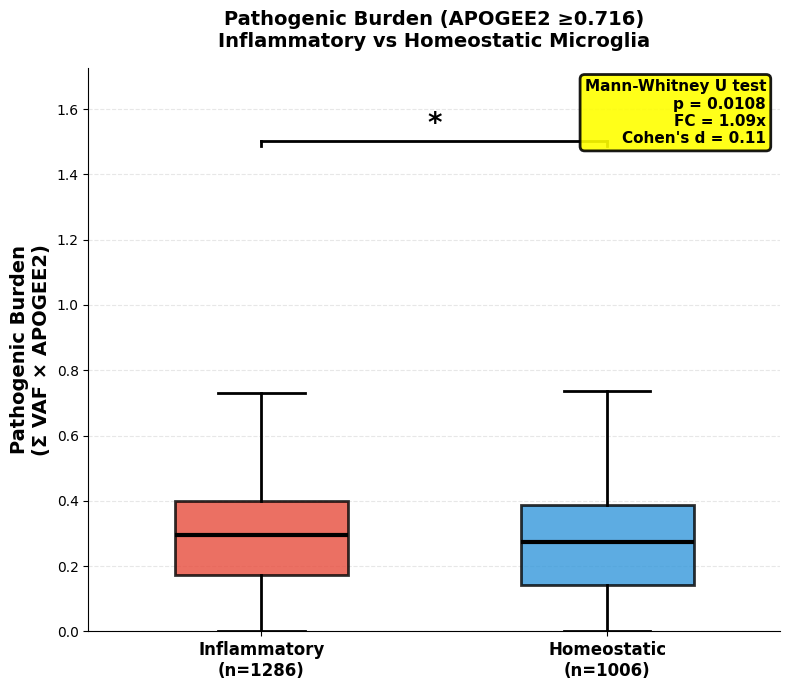


✓ Figure saved to pathogenic_burden_boxplot.pdf/png

FINAL ANSWER

✓ YES - Inflammatory microglia carry significantly higher pathogenic burden

  - Fold change: 1.090x (9.0% higher)
  - Cohen's d: 0.111 (small effect)
  - P-value: 0.0108

  Inflammatory microglia have elevated aggregate burden of
  pathogenic mitochondrial variants.


In [36]:
import numpy as np
import pandas as pd
from scipy.stats import mannwhitneyu
import matplotlib.pyplot as plt

print("="*80)
print("Do inflammatory microglia carry higher AGGREGATE pathogenic burden?")
print("="*80)

# Settings
pathogenic_threshold = 0.716

# Get variant_summary with APOGEE2 scores
variant_summary = mgatk.uns['variant_summary']

# Identify pathogenic variants
pathogenic_mask = []
if not isinstance(variant_names, list):
    variant_names_list = list(variant_names)
else:
    variant_names_list = variant_names

for i in range(len(variant_names_list)):
    apogee_score = variant_summary.iloc[i]['APOGEE2_score']
    if pd.notna(apogee_score) and apogee_score >= pathogenic_threshold:
        pathogenic_mask.append(True)
    else:
        pathogenic_mask.append(False)

pathogenic_mask = np.array(pathogenic_mask)

print(f"\nFiltering to pathogenic variants (APOGEE2 ≥ {pathogenic_threshold})")
print(f"  Total variants: {len(variant_names_list)}")
print(f"  Pathogenic variants: {pathogenic_mask.sum()}")

# Extract pathogenic variants only
vaf_pathogenic = vaf_matrix[:, pathogenic_mask]
scores_pathogenic = variant_summary.loc[pathogenic_mask, 'APOGEE2_score'].values

# Calculate raw pathogenic burden
cell_pathogenic_burden_raw = np.dot(vaf_pathogenic, scores_pathogenic)

# # ============================================================================
# # TECHNICAL CONTROL: Sequencing depth check (COMMENTED OUT)
# # ============================================================================
# total_vaf_per_cell = vaf_matrix.sum(axis=1)
# total_vaf_inflam = total_vaf_per_cell[group_2_4_6_mask]
# total_vaf_homeo = total_vaf_per_cell[group_1_3_mask]

# print(f"\n" + "="*80)
# print("TECHNICAL CONTROL: Total mtDNA variant load")
# print("="*80)
# print(f"Inflammatory: {total_vaf_inflam.mean():.2f} ± {total_vaf_inflam.std():.2f}")
# print(f"Homeostatic: {total_vaf_homeo.mean():.2f} ± {total_vaf_homeo.std():.2f}")

# stat_tech, p_tech = mannwhitneyu(total_vaf_inflam, total_vaf_homeo)
# print(f"Mann-Whitney p = {p_tech:.4f}")

# if p_tech < 0.05:
#     print(f"\n⚠️  WARNING: Sequencing depth differs - normalization REQUIRED")
# else:
#     print(f"\n✓ No technical confound detected")

# # Normalize burden by total VAF
# cell_pathogenic_burden_normalized = cell_pathogenic_burden_raw / (total_vaf_per_cell + 1e-10)

# Split by group (raw burden only)
burden_inflam_raw = cell_pathogenic_burden_raw[group_2_4_6_mask]
burden_homeo_raw = cell_pathogenic_burden_raw[group_1_3_mask]

# Statistics on raw burden
stat_raw, p_raw = mannwhitneyu(burden_inflam_raw, burden_homeo_raw, alternative='two-sided')
fc_raw = burden_inflam_raw.mean() / burden_homeo_raw.mean()
cohen_d_raw = (burden_inflam_raw.mean() - burden_homeo_raw.mean()) / np.sqrt(
    (burden_inflam_raw.std()**2 + burden_homeo_raw.std()**2) / 2
)

# Print results
print("\n" + "="*80)
print("RESULTS")
print("="*80)

print(f"\nPATHOGENIC BURDEN:")
print(f"  Inflammatory: {burden_inflam_raw.mean():.4f} ± {burden_inflam_raw.std():.4f}")
print(f"  Homeostatic: {burden_homeo_raw.mean():.4f} ± {burden_homeo_raw.std():.4f}")
print(f"  Mann-Whitney U p = {p_raw:.4f}")
print(f"  Fold Change = {fc_raw:.3f}x")
print(f"  Cohen's d = {cohen_d_raw:.3f}")

# ============================================================================
# VISUALIZATION
# ============================================================================

fig, ax = plt.subplots(figsize=(8, 7))

# Create boxplot
bp = ax.boxplot([burden_inflam_raw, burden_homeo_raw], 
                positions=[1, 2], widths=0.5,
                patch_artist=True, 
                showfliers=False,
                notch=False,
                boxprops=dict(linewidth=2),
                medianprops=dict(color='black', linewidth=3),
                whiskerprops=dict(linewidth=2),
                capprops=dict(linewidth=2))

bp['boxes'][0].set_facecolor('#e74c3c')
bp['boxes'][0].set_alpha(0.8)
bp['boxes'][1].set_facecolor('#3498db')
bp['boxes'][1].set_alpha(0.8)

ax.set_ylabel('Pathogenic Burden\n(Σ VAF × APOGEE2)', fontsize=14, fontweight='bold')
ax.set_title(f'Pathogenic Burden (APOGEE2 ≥{pathogenic_threshold})\nInflammatory vs Homeostatic Microglia', 
            fontsize=14, fontweight='bold', pad=15)
ax.set_xticks([1, 2])
ax.set_xticklabels(['Inflammatory\n(n={})'.format(len(burden_inflam_raw)), 
                    'Homeostatic\n(n={})'.format(len(burden_homeo_raw))], 
                   fontsize=12, fontweight='bold')
ax.grid(axis='y', alpha=0.3, linestyle='--')

# Add significance bracket
y_max_whisker = np.percentile(burden_inflam_raw, 99.5)
y_bracket = y_max_whisker * 1.08
h = y_bracket * 0.01

ax.plot([1, 2], [y_bracket, y_bracket], 'k-', linewidth=2)
ax.plot([1, 1], [y_bracket-h, y_bracket], 'k-', linewidth=2)
ax.plot([2, 2], [y_bracket-h, y_bracket], 'k-', linewidth=2)

# Significance annotation
if p_raw < 0.001:
    sig_text = '***'
elif p_raw < 0.01:
    sig_text = '**'
elif p_raw < 0.05:
    sig_text = '*'
else:
    sig_text = 'ns'

ax.text(1.5, y_bracket + h*2, sig_text, ha='center', fontsize=20, fontweight='bold')

# Set y-limit
ax.set_ylim(0, y_bracket * 1.15)

# Clean up spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Stats box
stats_text = f"Mann-Whitney U test\np = {p_raw:.4f}\nFC = {fc_raw:.2f}x\nCohen's d = {cohen_d_raw:.2f}"
color = 'yellow' if p_raw < 0.05 else 'lightgray'
ax.text(0.98, 0.98, stats_text, transform=ax.transAxes,
       fontsize=11, fontweight='bold', verticalalignment='top', horizontalalignment='right',
       bbox=dict(boxstyle='round', facecolor=color, alpha=0.9, edgecolor='black', linewidth=2))

plt.tight_layout()

plt.savefig('pathogenic_burden_boxplot.pdf', dpi=300, bbox_inches='tight')
plt.savefig('pathogenic_burden_boxplot.png', dpi=300, bbox_inches='tight')
plt.show()

print("\n✓ Figure saved to pathogenic_burden_boxplot.pdf/png")

# Save to AnnData
mgatk.obs['pathogenic_burden'] = cell_pathogenic_burden_raw

# ============================================================================
# FINAL ANSWER
# ============================================================================

print("\n" + "="*80)
print("FINAL ANSWER")
print("="*80)

if p_raw < 0.05:
    effect_size = 'small' if abs(cohen_d_raw) < 0.5 else ('medium' if abs(cohen_d_raw) < 0.8 else 'large')
    print(f"\n✓ YES - Inflammatory microglia carry significantly higher pathogenic burden")
    print(f"\n  - Fold change: {fc_raw:.3f}x ({(fc_raw-1)*100:.1f}% higher)")
    print(f"  - Cohen's d: {cohen_d_raw:.3f} ({effect_size} effect)")
    print(f"  - P-value: {p_raw:.4f}")
    print(f"\n  Inflammatory microglia have elevated aggregate burden of")
    print(f"  pathogenic mitochondrial variants.")
else:
    print(f"\n✗ NO - No significant difference in pathogenic burden")
    print(f"  - P-value: {p_raw:.4f} (not significant at α=0.05)")
    print(f"  - Fold change: {fc_raw:.3f}x")

print("="*80)


PATHOGENIC VARIANT ENRICHMENT BY GENE (Q3 METHOD)

Mapping variants to genes...
Found 39 unique genes/regions

Analyzing VAF threshold: 1%...

  Testing individual variants at VAF ≥ 1%...

Analyzing VAF threshold: 3%...

  Testing individual variants at VAF ≥ 3%...

Analyzing VAF threshold: 5%...

  Testing individual variants at VAF ≥ 5%...
  VAF 1%: 13 genes tested, 10 with ≥1 sig. variant
  VAF 3%: 13 genes tested, 12 with ≥1 sig. variant
0 [0.1740888  0.70353422]
1 [ 0.2602819  -0.46627608]
  VAF 5%: 13 genes tested, 7 with ≥1 sig. variant


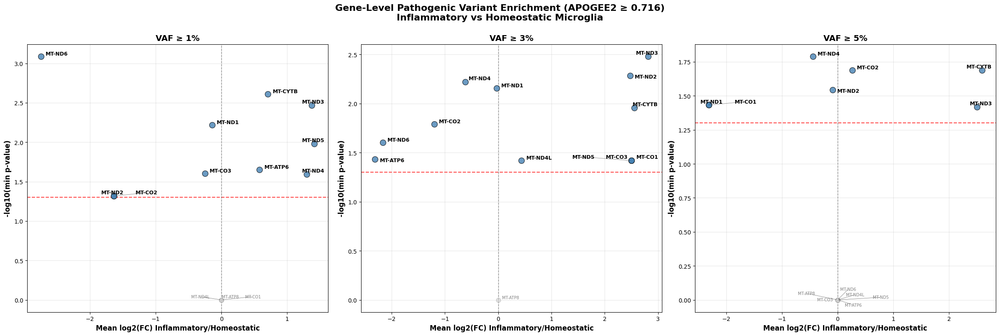


DETAILED RESULTS FOR VAF ≥ 3%

Genes with significant pathogenic variant enrichment:
   gene  n_variants_tested  n_sig_variants  n_inflammatory  n_homeostatic  mean_log2fc  min_p_value
 MT-ND3                 45               2               2              0     2.817904     0.003304
 MT-ND2                 85               1               1              0     2.477948     0.005188
 MT-ND4                163               6               2              4    -0.618207     0.006036
 MT-ND1                186               7               3              4    -0.026791     0.006953
MT-CYTB                 90               2               2              0     2.556264     0.011085
 MT-CO2                 66               5               1              4    -1.198559     0.016199
 MT-ND6                 39               1               0              1    -2.162517     0.025049
MT-ATP6                 44               1               0              1    -2.315028     0.036989
 MT-CO1       

In [37]:
# Import required libraries
import numpy as np
from scipy.stats import fisher_exact
import pandas as pd
import matplotlib.pyplot as plt
from adjustText import adjust_text

print("=" * 70)
print("PATHOGENIC VARIANT ENRICHMENT BY GENE (Q3 METHOD)")
print("=" * 70)

# mtDNA gene coordinates (rCRS)
MT_GENES = {
    'MT-TF': (577, 647), 'MT-RNR1': (648, 1601), 'MT-TV': (1602, 1670),
    'MT-RNR2': (1671, 3229), 'MT-TL1': (3230, 3304), 'MT-ND1': (3307, 4262),
    'MT-TI': (4263, 4331), 'MT-TQ': (4329, 4400), 'MT-TM': (4402, 4469),
    'MT-ND2': (4470, 5511), 'MT-TW': (5512, 5579), 'MT-TA': (5587, 5655),
    'MT-TN': (5657, 5729), 'MT-TC': (5761, 5826), 'MT-TY': (5826, 5891),
    'MT-CO1': (5904, 7445), 'MT-TS1': (7446, 7514), 'MT-TD': (7518, 7585),
    'MT-CO2': (7586, 8269), 'MT-TK': (8295, 8364), 'MT-ATP8': (8366, 8572),
    'MT-ATP6': (8527, 9207), 'MT-CO3': (9207, 9990), 'MT-TG': (9991, 10058),
    'MT-ND3': (10059, 10404), 'MT-TR': (10405, 10469), 'MT-ND4L': (10470, 10766),
    'MT-ND4': (10760, 12137), 'MT-TH': (12138, 12206), 'MT-TS2': (12207, 12265),
    'MT-TL2': (12266, 12336), 'MT-ND5': (12337, 14148), 'MT-ND6': (14149, 14673),
    'MT-TE': (14674, 14742), 'MT-CYTB': (14747, 15887), 'MT-TT': (15888, 15953),
    'MT-TP': (15956, 16023), 'MT-DLOOP': (16024, 576)
}

# Get variant_summary with APOGEE2 scores
variant_summary = mgatk.uns['variant_summary']

# Convert variant_names to list if needed
if not isinstance(variant_names, list):
    variant_names_list = list(variant_names)
else:
    variant_names_list = variant_names

# Map variants to genes
print("\nMapping variants to genes...")
variant_to_gene = {}
for variant_name in variant_names_list:
    try:
        parts = variant_name.split('-')
        if len(parts) >= 2:
            pos = int(parts[1])
        else:
            variant_to_gene[variant_name] = 'intergenic'
            continue
        
        assigned_gene = 'intergenic'
        for gene, (start, end) in MT_GENES.items():
            if gene == 'MT-DLOOP':
                if pos >= start or pos <= end:
                    assigned_gene = gene
                    break
            else:
                if start <= pos <= end:
                    assigned_gene = gene
                    break
        variant_to_gene[variant_name] = assigned_gene
    except Exception:
        variant_to_gene[variant_name] = 'intergenic'

gene_annotations = np.array([variant_to_gene.get(v, 'intergenic') for v in variant_names_list])
unique_genes = sorted(set(gene_annotations))
print(f"Found {len(unique_genes)} unique genes/regions")

# Settings
VAF_THRESHOLDS = [0.01, 0.03, 0.05]
min_cells_total = 10
max_prevalence = 0.5
pathogenic_threshold = 0.716

# Q3 Analysis function
def analyze_gene_enrichment_q3(vaf_matrix, gene_annotations, vaf_threshold):
    print(f"\n  Testing individual variants at VAF ≥ {vaf_threshold*100:.0f}%...")
    
    variant_results = []
    
    for i, variant in enumerate(variant_names_list):
        # Get APOGEE2 score from variant_summary
        apogee_score = variant_summary.iloc[i]['APOGEE2_score']
        
        # Skip if no score or not pathogenic
        if pd.isna(apogee_score) or apogee_score < pathogenic_threshold:
            continue
        
        gene = variant_to_gene.get(variant, 'intergenic')
        if gene == 'intergenic':
            continue
        
        variant_vaf = vaf_matrix[:, i]
        g246_vaf = variant_vaf[group_2_4_6_mask]
        g13_vaf = variant_vaf[group_1_3_mask]
        
        g246_with = (g246_vaf > vaf_threshold).sum()
        g13_with = (g13_vaf > vaf_threshold).sum()
        
        total_with = (variant_vaf > 0.01).sum()
        prevalence = total_with / len(variant_vaf)
        
        if total_with < min_cells_total or prevalence > max_prevalence:
            continue
        
        table = [[g246_with, len(g246_vaf) - g246_with], 
                 [g13_with, len(g13_vaf) - g13_with]]
        odds_ratio, p_value = fisher_exact(table)
        
        prop_g246 = g246_with / len(g246_vaf)
        prop_g13 = g13_with / len(g13_vaf)
        log2fc = np.log2((prop_g246 + 0.001) / (prop_g13 + 0.001))
        
        variant_results.append({
            'variant': variant,
            'gene': gene,
            'n_246': g246_with,
            'n_13': g13_with,
            'log2FC': log2fc,
            'odds_ratio': odds_ratio,
            'p_value': p_value,
            'apogee2_score': apogee_score
        })
    
    df_variants = pd.DataFrame(variant_results)
    
    if len(df_variants) == 0:
        return pd.DataFrame()
    
    df_sig = df_variants[df_variants['p_value'] < 0.05]
    
    gene_results = []
    
    for gene in unique_genes:
        if gene == 'intergenic':
            continue
        
        gene_all = df_variants[df_variants['gene'] == gene]
        gene_sig = df_sig[df_sig['gene'] == gene]
        
        if len(gene_all) == 0:
            continue
        
        n_tested = len(gene_all)
        n_sig = len(gene_sig)
        
        if n_sig == 0:
            gene_results.append({
                'gene': gene,
                'n_variants_tested': n_tested,
                'n_sig_variants': 0,
                'n_inflammatory': 0,
                'n_homeostatic': 0,
                'mean_log2fc': 0,
                'min_p_value': 1.0
            })
            continue
        
        n_inflammatory = (gene_sig['log2FC'] > 0).sum()
        n_homeostatic = (gene_sig['log2FC'] < 0).sum()
        
        mean_log2fc = gene_sig['log2FC'].mean()
        min_p = gene_sig['p_value'].min()
        
        gene_results.append({
            'gene': gene,
            'n_variants_tested': n_tested,
            'n_sig_variants': n_sig,
            'n_inflammatory': n_inflammatory,
            'n_homeostatic': n_homeostatic,
            'mean_log2fc': mean_log2fc,
            'min_p_value': min_p
        })
    
    df_genes = pd.DataFrame(gene_results)
    df_genes['net_enrichment'] = df_genes['n_inflammatory'] - df_genes['n_homeostatic']
    df_genes['neg_log10_p'] = -np.log10(df_genes['min_p_value'] + 1e-300)
    
    return df_genes

# Run analysis
results_by_threshold = {}
for vaf_thresh in VAF_THRESHOLDS:
    print(f"\nAnalyzing VAF threshold: {vaf_thresh*100:.0f}%...")
    results_by_threshold[vaf_thresh] = analyze_gene_enrichment_q3(vaf_matrix, gene_annotations, vaf_thresh)

# Volcano plots with connecting lines/arrows for displaced labels
fig, axes = plt.subplots(1, 3, figsize=(24, 8))
alpha = 0.05
neg_log10_alpha = -np.log10(alpha)

for idx, vaf_thresh in enumerate(VAF_THRESHOLDS):
    ax = axes[idx]
    df_genes = results_by_threshold[vaf_thresh]
    
    if len(df_genes) == 0:
        ax.text(0.5, 0.5, 'No data', ha='center', va='center', transform=ax.transAxes)
        ax.set_title(f'VAF ≥ {vaf_thresh*100:.0f}%')
        continue
    
    # Separate significant and non-significant for different coloring
    df_sig = df_genes[df_genes['n_sig_variants'] > 0]
    df_nonsig = df_genes[df_genes['n_sig_variants'] == 0]
    
    # Plot non-significant genes in gray
    if len(df_nonsig) > 0:
        ax.scatter(df_nonsig['mean_log2fc'],
                   df_nonsig['neg_log10_p'],
                   s=60, c='lightgray', edgecolor='gray', linewidth=0.5, alpha=0.6, zorder=1)
    
    # Plot significant genes in blue
    if len(df_sig) > 0:
        ax.scatter(df_sig['mean_log2fc'],
                   df_sig['neg_log10_p'],
                   s=100, c='steelblue', edgecolor='black', linewidth=0.8, alpha=0.8, zorder=2)
    
    ax.axhline(neg_log10_alpha, color='red', linestyle='--', linewidth=1.5, alpha=0.7, zorder=0)
    ax.axvline(0, color='black', linestyle='--', linewidth=1, alpha=0.5, zorder=0)
    
    # Annotate ALL genes
    texts = []
    for _, row in df_genes.iterrows():
        # Make significant genes bold and slightly larger
        if row['n_sig_variants'] > 0:
            text = ax.text(row['mean_log2fc'], row['neg_log10_p'], 
                          row['gene'], fontsize=9, fontweight='bold', zorder=3)
        else:
            text = ax.text(row['mean_log2fc'], row['neg_log10_p'], 
                          row['gene'], fontsize=7, color='gray', zorder=3)
        texts.append(text)
    
    # Adjust text positions with visible arrows/connecting lines
    adjust_text(texts, ax=ax,
                arrowprops=dict(arrowstyle='-', color='black', lw=0.5, alpha=0.6),
                force_text=(0.5, 0.5),
                force_points=(0.2, 0.2),
                expand_points=(2, 2),
                expand_text=(1.5, 1.5),
                only_move={'points': 'xy', 'text': 'xy'},
                lim=500)
    
    ax.set_xlabel('Mean log2(FC) Inflammatory/Homeostatic', fontsize=12, fontweight='bold')
    ax.set_ylabel('-log10(min p-value)', fontsize=12, fontweight='bold')
    ax.set_title(f'VAF ≥ {vaf_thresh*100:.0f}%', fontsize=14, fontweight='bold')
    ax.grid(alpha=0.3, zorder=0)
    
    n_sig_genes = (df_genes['n_sig_variants'] > 0).sum()
    print(f"  VAF {vaf_thresh*100:.0f}%: {len(df_genes)} genes tested, {n_sig_genes} with ≥1 sig. variant")

plt.suptitle('Gene-Level Pathogenic Variant Enrichment (APOGEE2 ≥ 0.716)\nInflammatory vs Homeostatic Microglia',
             fontsize=16, fontweight='bold', y=1.00)
plt.tight_layout()
plt.savefig('gene_enrichment_volcano_3panel.pdf', dpi=300, bbox_inches='tight')
plt.savefig('gene_enrichment_volcano_3panel.png', dpi=300, bbox_inches='tight')
plt.show()

# Print results
print("\n" + "=" * 70)
print("DETAILED RESULTS FOR VAF ≥ 3%")
print("=" * 70)
df_3pct = results_by_threshold[0.03]
sig_genes_3pct = df_3pct[df_3pct['n_sig_variants'] > 0].sort_values('min_p_value')

print("\nGenes with significant pathogenic variant enrichment:")
if len(sig_genes_3pct) > 0:
    print(sig_genes_3pct[['gene', 'n_variants_tested', 'n_sig_variants', 
                           'n_inflammatory', 'n_homeostatic', 'mean_log2fc', 
                           'min_p_value']].to_string(index=False))
else:
    print("  None found")

print(f"\n{len(sig_genes_3pct)} genes have at least one significantly enriched pathogenic variant")
print(f"Tested {len(df_3pct)} genes total")

print("\n✓ Figures saved to gene_enrichment_volcano_3panel.pdf/png")


PATHOGENIC VARIANT ENRICHMENT BY GENE (LOLLIPOP PLOTS)

Mapping variants to genes...
Found 39 unique genes/regions

Analyzing VAF ≥ 1%...

Analyzing VAF ≥ 3%...

Analyzing VAF ≥ 5%...
  VAF 1%: 10 genes with ≥1 significant variant
  VAF 3%: 12 genes with ≥1 significant variant
  VAF 5%: 7 genes with ≥1 significant variant


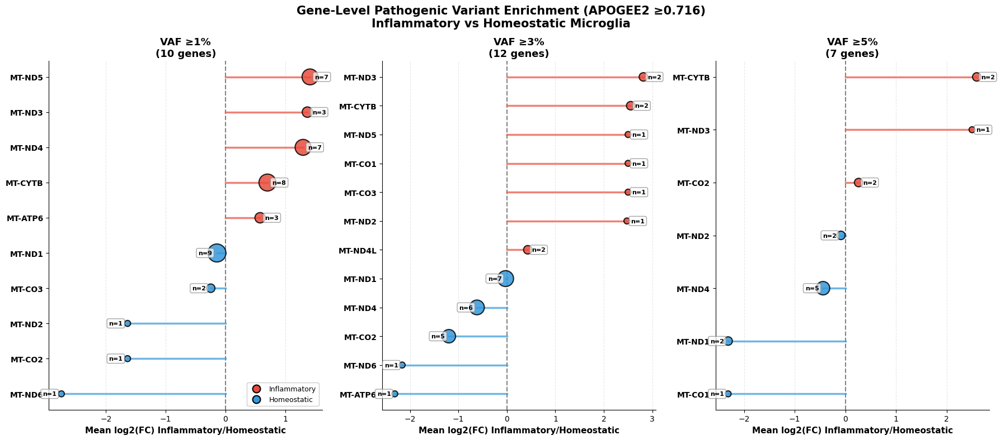


✓ Lollipop plots saved to gene_pathogenic_enrichment_lollipop_3panels.pdf/png

DETAILED RESULTS FOR VAF ≥ 3%
   gene  n_variants_tested  n_sig_variants  n_inflammatory  n_homeostatic  mean_log2fc  min_p_value
 MT-ND3                 45               2               2              0     2.817904     0.003304
MT-CYTB                 90               2               2              0     2.556264     0.011085
 MT-CO1                 44               1               1              0     2.502236     0.038131
 MT-CO3                 25               1               1              0     2.502236     0.038131
 MT-ND5                234               1               1              0     2.502236     0.038131
 MT-ND2                 85               1               1              0     2.477948     0.005188
MT-ND4L                 32               2               1              1     0.431613     0.038131
 MT-ND1                186               7               3              4    -0.026791    

In [39]:
import numpy as np
from scipy.stats import fisher_exact
import pandas as pd
import matplotlib.pyplot as plt

print("=" * 70)
print("PATHOGENIC VARIANT ENRICHMENT BY GENE (LOLLIPOP PLOTS)")
print("=" * 70)

# mtDNA gene coordinates (rCRS)
MT_GENES = {
    'MT-TF': (577, 647), 'MT-RNR1': (648, 1601), 'MT-TV': (1602, 1670),
    'MT-RNR2': (1671, 3229), 'MT-TL1': (3230, 3304), 'MT-ND1': (3307, 4262),
    'MT-TI': (4263, 4331), 'MT-TQ': (4329, 4400), 'MT-TM': (4402, 4469),
    'MT-ND2': (4470, 5511), 'MT-TW': (5512, 5579), 'MT-TA': (5587, 5655),
    'MT-TN': (5657, 5729), 'MT-TC': (5761, 5826), 'MT-TY': (5826, 5891),
    'MT-CO1': (5904, 7445), 'MT-TS1': (7446, 7514), 'MT-TD': (7518, 7585),
    'MT-CO2': (7586, 8269), 'MT-TK': (8295, 8364), 'MT-ATP8': (8366, 8572),
    'MT-ATP6': (8527, 9207), 'MT-CO3': (9207, 9990), 'MT-TG': (9991, 10058),
    'MT-ND3': (10059, 10404), 'MT-TR': (10405, 10469), 'MT-ND4L': (10470, 10766),
    'MT-ND4': (10760, 12137), 'MT-TH': (12138, 12206), 'MT-TS2': (12207, 12265),
    'MT-TL2': (12266, 12336), 'MT-ND5': (12337, 14148), 'MT-ND6': (14149, 14673),
    'MT-TE': (14674, 14742), 'MT-CYTB': (14747, 15887), 'MT-TT': (15888, 15953),
    'MT-TP': (15956, 16023), 'MT-DLOOP': (16024, 576)
}

# Get variant_summary with APOGEE2 scores
variant_summary = mgatk.uns['variant_summary']

# Convert variant_names to list
if not isinstance(variant_names, list):
    variant_names_list = list(variant_names)
else:
    variant_names_list = variant_names

# Map variants to genes
print("\nMapping variants to genes...")
variant_to_gene = {}
for variant_name in variant_names_list:
    try:
        parts = variant_name.split('-')
        if len(parts) >= 2:
            pos = int(parts[1])
        else:
            variant_to_gene[variant_name] = 'intergenic'
            continue
        
        assigned_gene = 'intergenic'
        for gene, (start, end) in MT_GENES.items():
            if gene == 'MT-DLOOP':
                if pos >= start or pos <= end:
                    assigned_gene = gene
                    break
            else:
                if start <= pos <= end:
                    assigned_gene = gene
                    break
        variant_to_gene[variant_name] = assigned_gene
    except Exception:
        variant_to_gene[variant_name] = 'intergenic'

gene_annotations = np.array([variant_to_gene.get(v, 'intergenic') for v in variant_names_list])
unique_genes = sorted(set(gene_annotations))
print(f"Found {len(unique_genes)} unique genes/regions")

# Settings
VAF_THRESHOLDS = [0.01, 0.03, 0.05]
min_cells_total = 10
max_prevalence = 0.5
pathogenic_threshold = 0.716

# Analysis function
def analyze_gene_enrichment(vaf_threshold):
    print(f"\nAnalyzing VAF ≥ {vaf_threshold*100:.0f}%...")
    
    variant_results = []
    
    for i, variant in enumerate(variant_names_list):
        # Get APOGEE2 score from variant_summary
        apogee_score = variant_summary.iloc[i]['APOGEE2_score']
        
        # Skip if no score or not pathogenic
        if pd.isna(apogee_score) or apogee_score < pathogenic_threshold:
            continue
        
        gene = variant_to_gene.get(variant, 'intergenic')
        if gene == 'intergenic':
            continue
        
        variant_vaf = vaf_matrix[:, i]
        g246_vaf = variant_vaf[group_2_4_6_mask]
        g13_vaf = variant_vaf[group_1_3_mask]
        
        g246_with = (g246_vaf > vaf_threshold).sum()
        g13_with = (g13_vaf > vaf_threshold).sum()
        
        total_with = (variant_vaf > 0.01).sum()
        prevalence = total_with / len(variant_vaf)
        
        if total_with < min_cells_total or prevalence > max_prevalence:
            continue
        
        table = [[g246_with, len(g246_vaf) - g246_with], 
                 [g13_with, len(g13_vaf) - g13_with]]
        odds_ratio, p_value = fisher_exact(table)
        
        prop_g246 = g246_with / len(g246_vaf)
        prop_g13 = g13_with / len(g13_vaf)
        log2fc = np.log2((prop_g246 + 0.001) / (prop_g13 + 0.001))
        
        variant_results.append({
            'variant': variant,
            'gene': gene,
            'n_246': g246_with,
            'n_13': g13_with,
            'log2FC': log2fc,
            'odds_ratio': odds_ratio,
            'p_value': p_value,
            'apogee2_score': apogee_score
        })
    
    df_variants = pd.DataFrame(variant_results)
    
    if len(df_variants) == 0:
        return pd.DataFrame()
    
    df_sig = df_variants[df_variants['p_value'] < 0.05]
    
    # Gene-level aggregation
    gene_results = []
    
    for gene in unique_genes:
        if gene == 'intergenic':
            continue
        
        gene_all = df_variants[df_variants['gene'] == gene]
        gene_sig = df_sig[df_sig['gene'] == gene]
        
        if len(gene_all) == 0:
            continue
        
        n_tested = len(gene_all)
        n_sig = len(gene_sig)
        
        if n_sig == 0:
            continue  # Skip genes with no significant variants
        
        n_inflammatory = (gene_sig['log2FC'] > 0).sum()
        n_homeostatic = (gene_sig['log2FC'] < 0).sum()
        
        mean_log2fc = gene_sig['log2FC'].mean()
        min_p = gene_sig['p_value'].min()
        
        gene_results.append({
            'gene': gene,
            'n_variants_tested': n_tested,
            'n_sig_variants': n_sig,
            'n_inflammatory': n_inflammatory,
            'n_homeostatic': n_homeostatic,
            'mean_log2fc': mean_log2fc,
            'min_p_value': min_p
        })
    
    df_genes = pd.DataFrame(gene_results)
    return df_genes

# Run analysis for all thresholds
results_by_threshold = {}
for vaf_thresh in VAF_THRESHOLDS:
    results_by_threshold[vaf_thresh] = analyze_gene_enrichment(vaf_thresh)

# ============================================================================
# LOLLIPOP PLOTS (3 PANELS)
# ============================================================================

fig, axes = plt.subplots(1, 3, figsize=(18, 8))

for idx, vaf_thresh in enumerate(VAF_THRESHOLDS):
    ax = axes[idx]
    df_genes = results_by_threshold[vaf_thresh]
    
    if len(df_genes) == 0:
        ax.text(0.5, 0.5, 'No significant genes', ha='center', va='center',
               transform=ax.transAxes, fontsize=12)
        ax.set_title(f'VAF ≥{vaf_thresh*100:.0f}%', fontsize=13, fontweight='bold')
        ax.set_xlabel('Mean log2(FC)')
        continue
    
    # Sort by mean log2FC
    df_genes = df_genes.sort_values('mean_log2fc', ascending=True).reset_index(drop=True)
    
    y_positions = np.arange(len(df_genes))
    
    # Color by direction
    colors = ['#e74c3c' if fc > 0 else '#3498db' for fc in df_genes['mean_log2fc']]
    
    # Draw stems (lollipop sticks)
    for i, (idx_row, row) in enumerate(df_genes.iterrows()):
        ax.plot([0, row['mean_log2fc']], [i, i], 
               color=colors[i], linewidth=2.5, alpha=0.7, zorder=1)
    
    # Draw lollipop heads
    sizes = df_genes['n_sig_variants'] * 60
    ax.scatter(df_genes['mean_log2fc'], y_positions,
              s=sizes, c=colors, edgecolor='black', linewidth=1.5,
              alpha=0.85, zorder=2)
    
    # Vertical reference line at x=0
    ax.axvline(0, color='black', linestyle='--', linewidth=1.5, alpha=0.5, zorder=0)
    
    # Y-axis labels
    ax.set_yticks(y_positions)
    ax.set_yticklabels(df_genes['gene'], fontsize=10, fontweight='bold')
    
    # Axis labels
    ax.set_xlabel('Mean log2(FC) Inflammatory/Homeostatic', fontsize=11, fontweight='bold')
    ax.set_title(f'VAF ≥{vaf_thresh*100:.0f}%\n({len(df_genes)} genes)', 
                fontsize=13, fontweight='bold')
    
    # Add n= annotations
    for i, (idx_row, row) in enumerate(df_genes.iterrows()):
        x_pos = row['mean_log2fc']
        offset = 0.08 if x_pos > 0 else -0.08
        ha = 'left' if x_pos > 0 else 'right'
        ax.text(x_pos + offset, i, f"n={int(row['n_sig_variants'])}", 
               ha=ha, va='center', fontsize=8, fontweight='bold',
               bbox=dict(boxstyle='round,pad=0.3', facecolor='white', 
                        edgecolor='gray', alpha=0.7))
    
    # Grid and spines
    ax.grid(axis='x', alpha=0.3, linestyle='--')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    # Only show legend on first panel
    if idx == 0:
        from matplotlib.lines import Line2D
        legend_elements = [
            Line2D([0], [0], marker='o', color='w', markerfacecolor='#e74c3c', 
                   markersize=10, label='Inflammatory', markeredgecolor='black', markeredgewidth=1.5),
            Line2D([0], [0], marker='o', color='w', markerfacecolor='#3498db',
                   markersize=10, label='Homeostatic', markeredgecolor='black', markeredgewidth=1.5)
        ]
        ax.legend(handles=legend_elements, loc='lower right', framealpha=0.95, fontsize=9)
    
    print(f"  VAF {vaf_thresh*100:.0f}%: {len(df_genes)} genes with ≥1 significant variant")

plt.suptitle(f'Gene-Level Pathogenic Variant Enrichment (APOGEE2 ≥{pathogenic_threshold})\n' +
            'Inflammatory vs Homeostatic Microglia',
            fontsize=15, fontweight='bold', y=0.98)
plt.tight_layout()

plt.savefig('gene_pathogenic_enrichment_lollipop_3panels.pdf', dpi=300, bbox_inches='tight')
plt.savefig('gene_pathogenic_enrichment_lollipop_3panels.png', dpi=300, bbox_inches='tight')
plt.show()

print("\n✓ Lollipop plots saved to gene_pathogenic_enrichment_lollipop_3panels.pdf/png")

# Print detailed results for VAF 3%
print("\n" + "=" * 70)
print("DETAILED RESULTS FOR VAF ≥ 3%")
print("=" * 70)
df_3pct = results_by_threshold[0.03]
if len(df_3pct) > 0:
    print(df_3pct.sort_values('mean_log2fc', ascending=False)[
        ['gene', 'n_variants_tested', 'n_sig_variants', 
         'n_inflammatory', 'n_homeostatic', 'mean_log2fc', 
         'min_p_value']].to_string(index=False))
else:
    print("No genes with significant enrichment at 3% VAF")


Comparing 12 genes across all three thresholds

Found 12 genes with ≥1 significant variant at any threshold


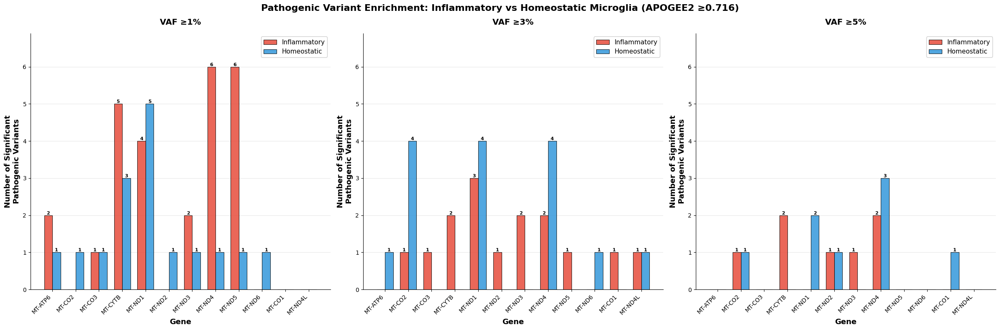


✓ Bar plots saved to gene_variant_enrichment_barplot.pdf/png

SUMMARY TABLE: SIGNIFICANT VARIANTS BY GENE AND THRESHOLD
   Gene  Inflam 1%  Homeo 1%  Inflam 3%  Homeo 3%  Inflam 5%  Homeo 5%
MT-ATP6          2         1          0         1          0         0
 MT-CO2          0         1          1         4          1         1
 MT-CO3          1         1          1         0          0         0
MT-CYTB          5         3          2         0          2         0
 MT-ND1          4         5          3         4          0         2
 MT-ND2          0         1          1         0          1         1
 MT-ND3          2         1          2         0          1         0
 MT-ND4          6         1          2         4          2         3
 MT-ND5          6         1          1         0          0         0
 MT-ND6          0         1          0         1          0         0
 MT-CO1          0         0          1         0          0         1
MT-ND4L          0         

In [40]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Get results at all three thresholds
df_1pct = results_by_threshold[0.01]
df_3pct = results_by_threshold[0.03]
df_5pct = results_by_threshold[0.05]

# Check if any dataframes are empty
if len(df_1pct) == 0 or len(df_3pct) == 0 or len(df_5pct) == 0:
    print("⚠️ One or more threshold results are empty!")
    print(f"1% VAF: {len(df_1pct)} genes")
    print(f"3% VAF: {len(df_3pct)} genes")
    print(f"5% VAF: {len(df_5pct)} genes")
else:
    # Merge all three on gene name
    df_compare = df_1pct.merge(df_3pct, on='gene', suffixes=('_1pct', '_3pct'), how='outer')
    df_compare = df_compare.merge(df_5pct, on='gene', how='outer', suffixes=('', '_5pct'))
    
    # Rename 5pct columns (they don't get suffix automatically in outer merge)
    df_compare.rename(columns={
        'n_variants_tested': 'n_variants_tested_5pct',
        'n_sig_variants': 'n_sig_variants_5pct',
        'n_inflammatory': 'n_inflammatory_5pct',
        'n_homeostatic': 'n_homeostatic_5pct',
        'mean_log2fc': 'mean_log2fc_5pct',
        'min_p_value': 'min_p_value_5pct'
    }, inplace=True)
    
    # Fill NaN values with 0 for missing genes at certain thresholds
    fill_cols = ['n_sig_variants_1pct', 'n_inflammatory_1pct', 'n_homeostatic_1pct',
                 'n_sig_variants_3pct', 'n_inflammatory_3pct', 'n_homeostatic_3pct',
                 'n_sig_variants_5pct', 'n_inflammatory_5pct', 'n_homeostatic_5pct']
    
    for col in fill_cols:
        if col in df_compare.columns:
            df_compare[col] = df_compare[col].fillna(0).astype(int)
    
    print(f"Comparing {len(df_compare)} genes across all three thresholds")
    
    # Filter to genes with at least one significant variant at any threshold
    df_sig_genes = df_compare[
        (df_compare['n_sig_variants_1pct'] > 0) | 
        (df_compare['n_sig_variants_3pct'] > 0) | 
        (df_compare['n_sig_variants_5pct'] > 0)
    ].copy()
    
    print(f"\nFound {len(df_sig_genes)} genes with ≥1 significant variant at any threshold")
    
    if len(df_sig_genes) == 0:
        print("⚠️ No genes with significant variants found!")
    else:
        # Create 3-panel figure (one per VAF threshold)
        fig, axes = plt.subplots(1, 3, figsize=(24, 8))
        
        genes = df_sig_genes['gene'].tolist()
        x = np.arange(len(genes))
        width = 0.35
        
        # Define threshold data
        thresholds = [
            ('1%', 0, df_sig_genes['n_inflammatory_1pct'].values, df_sig_genes['n_homeostatic_1pct'].values),
            ('3%', 1, df_sig_genes['n_inflammatory_3pct'].values, df_sig_genes['n_homeostatic_3pct'].values),
            ('5%', 2, df_sig_genes['n_inflammatory_5pct'].values, df_sig_genes['n_homeostatic_5pct'].values)
        ]
        
        # Calculate global max for consistent y-axis
        max_y = 0
        for thresh_data in thresholds:
            max_y = max(max_y, thresh_data[2].max(), thresh_data[3].max())
        global_max_y = max_y * 1.15  # Add 15% headroom for labels
        
        for thresh_name, idx, inflam_counts, homeo_counts in thresholds:
            ax = axes[idx]
            
            # Create bars
            bars1 = ax.bar(x - width/2, inflam_counts, width, label='Inflammatory', 
                           color='#e74c3c', edgecolor='black', linewidth=0.8, alpha=0.85)
            bars2 = ax.bar(x + width/2, homeo_counts, width, label='Homeostatic',
                           color='#3498db', edgecolor='black', linewidth=0.8, alpha=0.85)
            
            # Add value labels on bars
            for bars in [bars1, bars2]:
                for bar in bars:
                    height = bar.get_height()
                    if height > 0:
                        ax.text(bar.get_x() + bar.get_width()/2., height,
                               f'{int(height)}',
                               ha='center', va='bottom', fontsize=8, fontweight='bold')
            
            ax.set_xlabel('Gene', fontsize=13, fontweight='bold')
            ax.set_ylabel('Number of Significant\nPathogenic Variants', fontsize=13, fontweight='bold')
            ax.set_title(f'VAF ≥{thresh_name}', fontsize=14, fontweight='bold', pad=15)
            ax.set_xticks(x)
            ax.set_xticklabels(genes, rotation=45, ha='right', fontsize=10)
            ax.legend(loc='upper right', fontsize=11, framealpha=0.95)
            ax.grid(axis='y', alpha=0.3, zorder=0)
            ax.set_axisbelow(True)
            ax.set_ylim(0, global_max_y)
            
            # Clean up spines
            ax.spines['top'].set_visible(False)
            ax.spines['right'].set_visible(False)
        
        plt.suptitle('Pathogenic Variant Enrichment: Inflammatory vs Homeostatic Microglia (APOGEE2 ≥0.716)',
                     fontsize=16, fontweight='bold', y=0.98)
        plt.tight_layout()
        
        plt.savefig('gene_variant_enrichment_barplot.pdf', dpi=300, bbox_inches='tight')
        plt.savefig('gene_variant_enrichment_barplot.png', dpi=300, bbox_inches='tight')
        plt.show()
        
        print("\n✓ Bar plots saved to gene_variant_enrichment_barplot.pdf/png")
        
        # Print summary table
        print("\n" + "="*70)
        print("SUMMARY TABLE: SIGNIFICANT VARIANTS BY GENE AND THRESHOLD")
        print("="*70)
        summary_table = df_sig_genes[['gene', 
                                       'n_inflammatory_1pct', 'n_homeostatic_1pct',
                                       'n_inflammatory_3pct', 'n_homeostatic_3pct',
                                       'n_inflammatory_5pct', 'n_homeostatic_5pct']].copy()
        summary_table.columns = ['Gene', 
                                 'Inflam 1%', 'Homeo 1%',
                                 'Inflam 3%', 'Homeo 3%',
                                 'Inflam 5%', 'Homeo 5%']
        print(summary_table.to_string(index=False))


VARIANT-LEVEL ANALYSIS FOR ALL GENES

Analyzing 12 genes total

  12 genes with ≥1 significant variant
  0 genes with NO significant variants


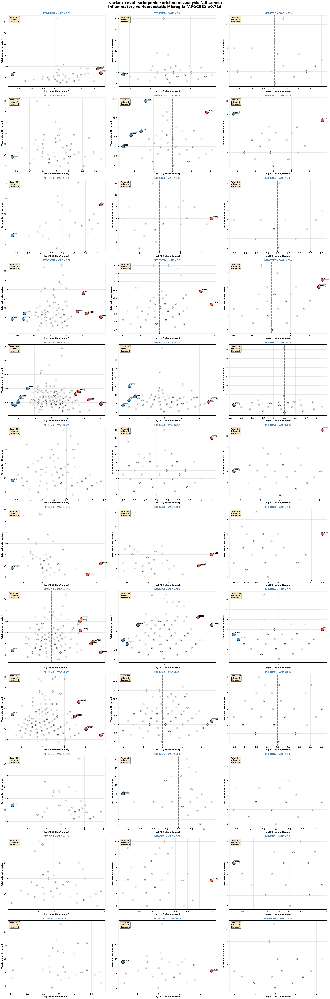


✓ Saved all_genes_variant_details.pdf/png

VARIANT MATRIX: WHICH VARIANTS ARE TESTED AT EACH THRESHOLD

✓ Saved variant_enrichment_matrix_all_genes.csv

Variant Enrichment Summary (first 50 rows):
   gene  position   VAF1%  VAF3%  VAF5%
MT-ATP6      8647  Inflam Inflam Inflam
MT-ATP6      8741  Inflam Inflam Inflam
MT-ATP6      8741  Inflam  Homeo  Homeo
MT-ATP6      8786  Inflam Inflam Inflam
MT-ATP6      8786  Inflam Inflam Inflam
MT-ATP6      8789  Inflam Inflam Inflam
MT-ATP6      8792  Inflam  Homeo  Homeo
MT-ATP6      8831   Homeo Inflam Inflam
MT-ATP6      8840   Homeo  Homeo  Homeo
MT-ATP6      8851  Inflam Inflam Inflam
MT-ATP6      8873  Inflam Inflam Inflam
MT-ATP6      8890   Homeo Homeo*  Homeo
MT-ATP6      8900  Inflam Inflam Inflam
MT-ATP6      8915  Inflam Inflam Inflam
MT-ATP6      8915  Inflam Inflam  Homeo
MT-ATP6      8927   Homeo  Homeo Inflam
MT-ATP6      8927  Inflam Inflam Inflam
MT-ATP6      8936   Homeo  Homeo  Homeo
MT-ATP6      8948  Inflam Inflam Inflam
MT

In [41]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy.stats import fisher_exact

print("="*70)
print("VARIANT-LEVEL ANALYSIS FOR ALL GENES")
print("="*70)

# Get variant_summary with APOGEE2 scores
variant_summary = mgatk.uns['variant_summary']

# Convert variant_names to list
if not isinstance(variant_names, list):
    variant_names_list = list(variant_names)
else:
    variant_names_list = variant_names

def get_variant_details_for_gene(gene, vaf_threshold):
    """Get detailed info about ALL variants in a gene at a given VAF threshold (sig and non-sig)"""
    
    variant_details = []
    
    for i, variant in enumerate(variant_names_list):
        if variant_to_gene.get(variant, 'intergenic') != gene:
            continue
        
        # Get APOGEE2 score from variant_summary
        apogee_score = variant_summary.iloc[i]['APOGEE2_score']
        
        # Skip if no score or not pathogenic
        if pd.isna(apogee_score) or apogee_score < pathogenic_threshold:
            continue
        
        variant_vaf = vaf_matrix[:, i]
        g246_vaf = variant_vaf[group_2_4_6_mask]
        g13_vaf = variant_vaf[group_1_3_mask]
        
        g246_with = (g246_vaf > vaf_threshold).sum()
        g13_with = (g13_vaf > vaf_threshold).sum()
        
        total_with = (variant_vaf > 0.01).sum()
        prevalence = total_with / len(variant_vaf)
        
        if total_with < min_cells_total or prevalence > max_prevalence:
            continue
        
        table = [[g246_with, len(g246_vaf) - g246_with], 
                 [g13_with, len(g13_vaf) - g13_with]]
        odds_ratio, p_value = fisher_exact(table)
        
        prop_g246 = g246_with / len(g246_vaf)
        prop_g13 = g13_with / len(g13_vaf)
        log2fc = np.log2((prop_g246 + 0.001) / (prop_g13 + 0.001))
        
        variant_details.append({
            'variant': variant,
            'position': int(variant.split('-')[1]) if '-' in variant else 0,
            'n_inflam': g246_with,
            'n_homeo': g13_with,
            'prop_inflam': prop_g246,
            'prop_homeo': prop_g13,
            'log2FC': log2fc,
            'p_value': p_value,
            'odds_ratio': odds_ratio,
            'apogee2': apogee_score,
            'significant': p_value < 0.05
        })
    
    return pd.DataFrame(variant_details)

# Get ALL genes from df_compare (includes those with and without sig variants)
all_genes = df_compare['gene'].tolist()
print(f"\nAnalyzing {len(all_genes)} genes total\n")

# Categorize genes
genes_with_sig = df_sig_genes['gene'].tolist()
genes_without_sig = [g for g in all_genes if g not in genes_with_sig]

print(f"  {len(genes_with_sig)} genes with ≥1 significant variant")
print(f"  {len(genes_without_sig)} genes with NO significant variants")

# PLOT 1: Variant scatter plots (log2FC vs cell count)
fig = plt.figure(figsize=(24, 6*len(all_genes)))

for gene_idx, gene in enumerate(all_genes):
    # Get variant data at all three thresholds
    df_1 = get_variant_details_for_gene(gene, 0.01)
    df_3 = get_variant_details_for_gene(gene, 0.03)
    df_5 = get_variant_details_for_gene(gene, 0.05)
    
    # Check if gene has any significant variants
    has_sig = gene in genes_with_sig
    
    # Create 3 subplots for this gene
    ax1 = plt.subplot(len(all_genes), 3, gene_idx*3 + 1)
    ax2 = plt.subplot(len(all_genes), 3, gene_idx*3 + 2)
    ax3 = plt.subplot(len(all_genes), 3, gene_idx*3 + 3)
    
    axes = [ax1, ax2, ax3]
    dfs = [df_1, df_3, df_5]
    thresholds = ['1%', '3%', '5%']
    
    for ax, df, thresh in zip(axes, dfs, thresholds):
        if len(df) == 0:
            ax.text(0.5, 0.5, 'No variants\ntested', ha='center', va='center', 
                   transform=ax.transAxes, fontsize=11, color='gray')
            title_color = 'steelblue' if has_sig else 'gray'
            ax.set_title(f'{gene} - VAF ≥{thresh}', fontsize=13, fontweight='bold',
                        color=title_color)
            ax.set_xlabel('log2FC (Inflam/Homeo)', fontsize=10, fontweight='bold')
            ax.set_ylabel('Total cells', fontsize=10, fontweight='bold')
            ax.axvline(0, color='black', linestyle='--', linewidth=1, alpha=0.3)
            ax.grid(alpha=0.2)
            continue
        
        # Plot each variant
        for idx, row in df.iterrows():
            if row['significant']:
                color = '#e74c3c' if row['log2FC'] > 0 else '#3498db'  # Red or blue
                size = 250
                alpha = 0.9
                edgewidth = 2
                zorder = 3
            else:
                color = 'lightgray'
                size = 100
                alpha = 0.5
                edgewidth = 0.5
                zorder = 1
            
            total_cells = row['n_inflam'] + row['n_homeo']
            
            ax.scatter(row['log2FC'], total_cells, 
                      c=color, s=size, alpha=alpha,
                      edgecolor='black', linewidth=edgewidth, zorder=zorder)
            
            # Label significant variants with position
            if row['significant']:
                ax.annotate(f"{row['position']}", 
                          (row['log2FC'], total_cells),
                          fontsize=8, fontweight='bold',
                          xytext=(5, 5), textcoords='offset points',
                          bbox=dict(boxstyle='round,pad=0.3', 
                                   facecolor='white', alpha=0.7,
                                   edgecolor='black', linewidth=0.5))
        
        ax.axvline(0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
        ax.set_xlabel('log2FC (Inflam/Homeo)', fontsize=10, fontweight='bold')
        ax.set_ylabel('Total cells with variant', fontsize=10, fontweight='bold')
        
        # Color code title by whether gene has sig variants
        title_color = 'steelblue' if has_sig else 'gray'
        ax.set_title(f'{gene} - VAF ≥{thresh}', fontsize=13, fontweight='bold',
                    color=title_color)
        ax.grid(alpha=0.3)
        
        # Add text summary
        n_sig_inflam = ((df['log2FC'] > 0) & (df['p_value'] < 0.05)).sum()
        n_sig_homeo = ((df['log2FC'] < 0) & (df['p_value'] < 0.05)).sum()
        n_total = len(df)
        
        summary_text = f'Total: {n_total}\nInflam: {n_sig_inflam}\nHomeo: {n_sig_homeo}'
        ax.text(0.02, 0.98, summary_text,
               transform=ax.transAxes, fontsize=9, fontweight='bold',
               verticalalignment='top',
               bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.7))

plt.suptitle('Variant-Level Pathogenic Enrichment Analysis (All Genes)\nInflammatory vs Homeostatic Microglia (APOGEE2 ≥0.716)',
            fontsize=18, fontweight='bold', y=0.9995)
plt.tight_layout()
plt.savefig('all_genes_variant_details.pdf', dpi=300, bbox_inches='tight')
plt.savefig('all_genes_variant_details.png', dpi=300, bbox_inches='tight')
plt.show()
print("\n✓ Saved all_genes_variant_details.pdf/png")

# PLOT 2: Variant presence/absence matrix for all genes
print("\n" + "="*70)
print("VARIANT MATRIX: WHICH VARIANTS ARE TESTED AT EACH THRESHOLD")
print("="*70)

variant_matrix_data = []

for gene in all_genes:
    # Collect all variants for this gene across all thresholds
    all_variants = set()
    variant_data = {0.01: {}, 0.03: {}, 0.05: {}}
    
    for vaf_thresh in [0.01, 0.03, 0.05]:
        df = get_variant_details_for_gene(gene, vaf_thresh)
        for _, row in df.iterrows():
            var = row['variant']
            all_variants.add(var)
            variant_data[vaf_thresh][var] = {
                'log2FC': row['log2FC'],
                'significant': row['significant'],
                'n_cells': row['n_inflam'] + row['n_homeo'],
                'p_value': row['p_value']
            }
    
    if len(all_variants) == 0:
        continue
    
    # Create summary for this gene
    for var in sorted(all_variants, key=lambda x: int(x.split('-')[1]) if '-' in x else 0):
        pos = int(var.split('-')[1]) if '-' in var else 0
        row_data = {
            'gene': gene,
            'variant': var,
            'position': pos
        }
        
        for thresh in [0.01, 0.03, 0.05]:
            thresh_pct = int(thresh*100)
            if var in variant_data[thresh]:
                vd = variant_data[thresh][var]
                direction = 'Inflam' if vd['log2FC'] > 0 else 'Homeo'
                sig = '***' if vd['p_value'] < 0.001 else ('**' if vd['p_value'] < 0.01 else ('*' if vd['significant'] else ''))
                row_data[f'VAF{thresh_pct}%'] = f"{direction}{sig}"
                row_data[f'VAF{thresh_pct}%_cells'] = vd['n_cells']
                row_data[f'VAF{thresh_pct}%_log2FC'] = f"{vd['log2FC']:.2f}"
            else:
                row_data[f'VAF{thresh_pct}%'] = '-'
                row_data[f'VAF{thresh_pct}%_cells'] = 0
                row_data[f'VAF{thresh_pct}%_log2FC'] = '-'
        
        variant_matrix_data.append(row_data)

df_variant_matrix = pd.DataFrame(variant_matrix_data)

# Save full matrix to CSV
df_variant_matrix.to_csv('variant_enrichment_matrix_all_genes.csv', index=False)
print("\n✓ Saved variant_enrichment_matrix_all_genes.csv")

# Print summary table (simplified version)
print("\nVariant Enrichment Summary (first 50 rows):")
summary_cols = ['gene', 'position', 'VAF1%', 'VAF3%', 'VAF5%']
print(df_variant_matrix[summary_cols].head(50).to_string(index=False))

print(f"\n✓ Full matrix with {len(df_variant_matrix)} variant-threshold combinations saved")
print("  Legend: Inflam/Homeo followed by * (p<0.05), ** (p<0.01), *** (p<0.001)")


PLOTTING ALL SIGNIFICANT VARIANTS BY GENE (VAF ≥3%)

Significant genes at VAF ≥3%:
   gene  n_sig_variants  n_inflammatory  n_homeostatic  mean_log2fc
 MT-ND3               2               2              0     2.817904
MT-CYTB               2               2              0     2.556264
 MT-CO1               1               1              0     2.502236
 MT-CO3               1               1              0     2.502236
 MT-ND5               1               1              0     2.502236
 MT-ND2               1               1              0     2.477948
MT-ND4L               2               1              1     0.431613
 MT-ND1               7               3              4    -0.026791
 MT-ND4               6               2              4    -0.618207
 MT-CO2               5               1              4    -1.198559
 MT-ND6               1               0              1    -2.162517
MT-ATP6               1               0              1    -2.315028

30 TOTAL significant variants fr

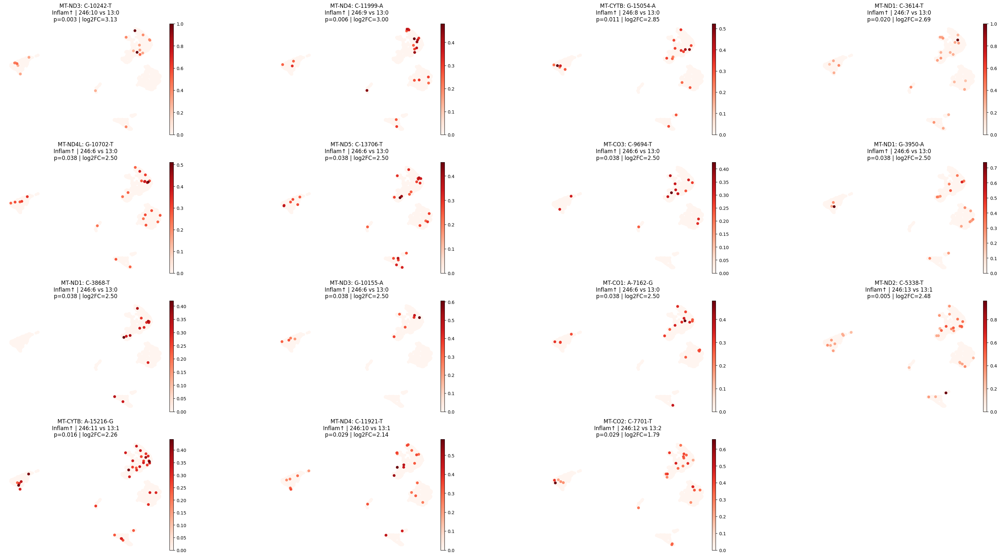

✓ Plotted 15 inflammatory-enriched variants

Plotting homeostatic-enriched variants...


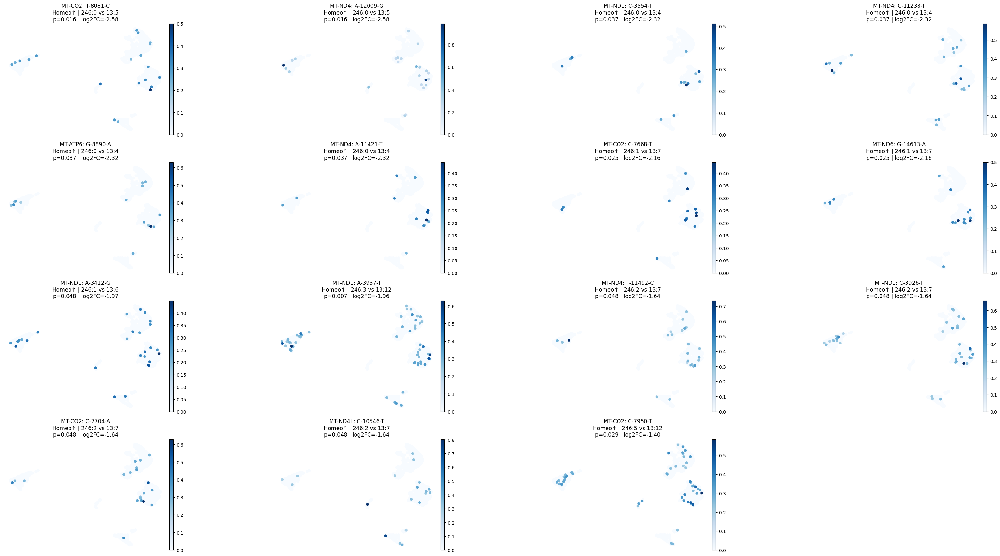

✓ Plotted 15 homeostatic-enriched variants

COMPLETE

✓ Total variants plotted: 30
✓ Figures saved to:
  - figures/umap_inflammatory_enriched_3pct_ALL.pdf (15 variants)
  - figures/umap_homeostatic_enriched_3pct_ALL.pdf (15 variants)
✓ Variant list saved to: significant_variants_3pct_all.csv


In [43]:
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy.stats import fisher_exact

print("=" * 70)
print("PLOTTING ALL SIGNIFICANT VARIANTS BY GENE (VAF ≥3%)")
print("=" * 70)

# Get variant_summary with APOGEE2 scores
variant_summary = mgatk.uns['variant_summary']

# Convert variant_names to list
if not isinstance(variant_names, list):
    variant_names_list = list(variant_names)
else:
    variant_names_list = variant_names

# Get the 3% VAF results
df_3pct = results_by_threshold[0.03]

# Get genes with significant variants
sig_genes_3pct = df_3pct[df_3pct['n_sig_variants'] > 0].sort_values('mean_log2fc', ascending=False)

print(f"\nSignificant genes at VAF ≥3%:")
print(sig_genes_3pct[['gene', 'n_sig_variants', 'n_inflammatory', 
                       'n_homeostatic', 'mean_log2fc']].to_string(index=False))

# Now extract ALL individual significant variants from these genes
vaf_threshold = 0.03
variant_results = []

for i, variant in enumerate(variant_names_list):
    # Get APOGEE2 score from variant_summary
    apogee_score = variant_summary.iloc[i]['APOGEE2_score']
    
    # Skip if no score or not pathogenic
    if pd.isna(apogee_score) or apogee_score < pathogenic_threshold:
        continue
    
    gene = variant_to_gene.get(variant, 'intergenic')
    if gene == 'intergenic':
        continue
    
    # Only keep variants from significant genes
    if gene not in sig_genes_3pct['gene'].values:
        continue
    
    variant_vaf = vaf_matrix[:, i]
    g246_vaf = variant_vaf[group_2_4_6_mask]
    g13_vaf = variant_vaf[group_1_3_mask]
    
    g246_with = (g246_vaf > vaf_threshold).sum()
    g13_with = (g13_vaf > vaf_threshold).sum()
    
    total_with = (variant_vaf > 0.01).sum()
    prevalence = total_with / len(variant_vaf)
    
    if total_with < min_cells_total or prevalence > max_prevalence:
        continue
    
    table = [[g246_with, len(g246_vaf) - g246_with], 
             [g13_with, len(g13_vaf) - g13_with]]
    odds_ratio, p_value = fisher_exact(table)
    
    prop_g246 = g246_with / len(g246_vaf)
    prop_g13 = g13_with / len(g13_vaf)
    log2fc = np.log2((prop_g246 + 0.001) / (prop_g13 + 0.001))
    
    # Only keep significant variants
    if p_value < 0.05:
        variant_results.append({
            'variant': variant,
            'gene': gene,
            'n_246': g246_with,
            'n_13': g13_with,
            'log2FC': log2fc,
            'odds_ratio': odds_ratio,
            'p_value': p_value,
            'apogee2_score': apogee_score
        })

df_variants_3pct = pd.DataFrame(variant_results)

print(f"\n{len(df_variants_3pct)} TOTAL significant variants from {len(sig_genes_3pct)} genes")
print("\nBreakdown by gene:")
for gene in sig_genes_3pct['gene']:
    gene_vars = df_variants_3pct[df_variants_3pct['gene'] == gene]
    n_inflam = (gene_vars['log2FC'] > 0).sum()
    n_homeo = (gene_vars['log2FC'] < 0).sum()
    print(f"  {gene}: {len(gene_vars)} total ({n_inflam} inflam, {n_homeo} homeo)")

# PLOT ALL SIGNIFICANT VARIANTS (GROUPED BY DIRECTION)
print("\n" + "=" * 70)
print("CREATING UMAP PLOTS")
print("=" * 70)

# Separate by direction
df_inflammatory = df_variants_3pct[df_variants_3pct['log2FC'] > 0].sort_values('log2FC', ascending=False)
df_homeostatic = df_variants_3pct[df_variants_3pct['log2FC'] < 0].sort_values('log2FC', ascending=True)

print(f"\n{len(df_inflammatory)} inflammatory-enriched variants")
print(f"{len(df_homeostatic)} homeostatic-enriched variants")

# PLOT INFLAMMATORY-ENRICHED VARIANTS
if len(df_inflammatory) > 0:
    print("\nPlotting inflammatory-enriched variants...")
    
    variants_to_plot = df_inflammatory['variant'].tolist()
    ncols = 4
    
    titles = []
    for _, row in df_inflammatory.iterrows():
        titles.append(f"{row['gene']}: {row['variant']}\nInflam↑ | 246:{int(row['n_246'])} vs 13:{int(row['n_13'])}\np={row['p_value']:.3f} | log2FC={row['log2FC']:.2f}")
    
    # Add VAF to mgatk object for plotting
    for variant in variants_to_plot:
        try:
            variant_idx = variant_names_list.index(variant)
            vaf_values = vaf_matrix[:, variant_idx]
            mgatk.obs[f'vaf_{variant}'] = np.power(vaf_values, 1/3)  # Cube root transform
        except ValueError:
            print(f"Warning: {variant} not found")
            continue
    
    sc.pl.umap(mgatk,
               color=[f'vaf_{v}' for v in variants_to_plot],
               cmap='Reds',
               size=150,
               frameon=False,
               ncols=ncols,
               wspace=0.5,
               title=titles,
               vmin=0,
               save='_inflammatory_enriched_3pct_ALL.pdf')
    
    print(f"✓ Plotted {len(df_inflammatory)} inflammatory-enriched variants")

# PLOT HOMEOSTATIC-ENRICHED VARIANTS
if len(df_homeostatic) > 0:
    print("\nPlotting homeostatic-enriched variants...")
    
    variants_to_plot = df_homeostatic['variant'].tolist()
    ncols = 4
    
    titles = []
    for _, row in df_homeostatic.iterrows():
        titles.append(f"{row['gene']}: {row['variant']}\nHomeo↑ | 246:{int(row['n_246'])} vs 13:{int(row['n_13'])}\np={row['p_value']:.3f} | log2FC={row['log2FC']:.2f}")
    
    # Add VAF to mgatk object for plotting
    for variant in variants_to_plot:
        try:
            variant_idx = variant_names_list.index(variant)
            vaf_values = vaf_matrix[:, variant_idx]
            mgatk.obs[f'vaf_{variant}'] = np.power(vaf_values, 1/3)  # Cube root transform
        except ValueError:
            print(f"Warning: {variant} not found")
            continue
    
    sc.pl.umap(mgatk,
               color=[f'vaf_{v}' for v in variants_to_plot],
               cmap='Blues',
               size=150,
               frameon=False,
               ncols=ncols,
               wspace=0.5,
               title=titles,
               vmin=0,
               save='_homeostatic_enriched_3pct_ALL.pdf')
    
    print(f"✓ Plotted {len(df_homeostatic)} homeostatic-enriched variants")

# Save variant list to CSV
df_variants_3pct.to_csv('significant_variants_3pct_all.csv', index=False)

print("\n" + "=" * 70)
print("COMPLETE")
print("=" * 70)
print(f"\n✓ Total variants plotted: {len(df_variants_3pct)}")
print(f"✓ Figures saved to:")
print(f"  - figures/umap_inflammatory_enriched_3pct_ALL.pdf ({len(df_inflammatory)} variants)")
print(f"  - figures/umap_homeostatic_enriched_3pct_ALL.pdf ({len(df_homeostatic)} variants)")
print(f"✓ Variant list saved to: significant_variants_3pct_all.csv")


PATHOGENIC VARIANT ENRICHMENT BY COMPLEX (Q3 METHOD)

Mapping variants to genes and complexes...
Found 8 unique complexes/regions
Complexes: ['Complex I', 'Complex III', 'Complex IV', 'Complex V', 'D-loop', 'Ribosomal RNA', 'intergenic', 'tRNA']

Analyzing VAF threshold: 1%...

  Testing individual variants at VAF ≥ 1%...

Analyzing VAF threshold: 3%...

  Testing individual variants at VAF ≥ 3%...

Analyzing VAF threshold: 5%...

  Testing individual variants at VAF ≥ 5%...
  VAF 1%: 4 complexes tested, 4 with ≥1 sig. variant
  VAF 3%: 4 complexes tested, 4 with ≥1 sig. variant
  VAF 5%: 4 complexes tested, 3 with ≥1 sig. variant


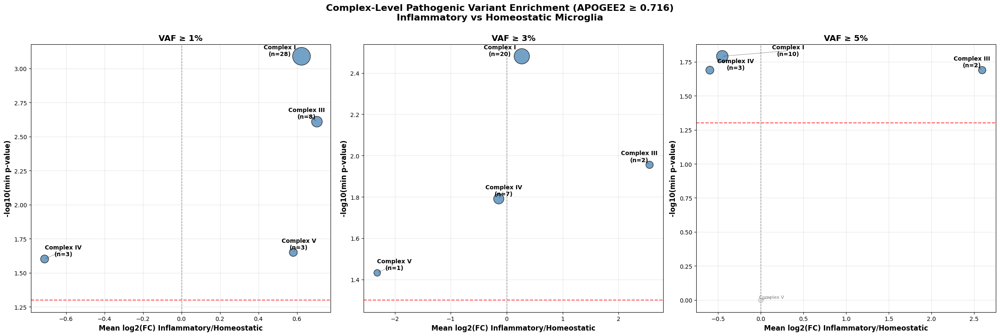


DETAILED RESULTS FOR VAF ≥ 3%

Complexes with significant pathogenic variant enrichment:
    complex  n_genes_tested  n_genes_with_sig_variants  n_variants_tested  n_sig_variants  n_inflammatory  n_homeostatic  mean_log2fc  min_p_value
  Complex I               7                          7                784              20              10             10     0.270996     0.003304
Complex III               1                          1                 90               2               2              0     2.556264     0.011085
 Complex IV               3                          3                135               7               3              4    -0.141189     0.016199
  Complex V               2                          1                 47               1               0              1    -2.315028     0.036989

4 complexes have at least one significantly enriched pathogenic variant
Tested 4 complexes total

✓ Figures saved to complex_enrichment_volcano.pdf/png


In [44]:
# Import required libraries
import numpy as np
from scipy.stats import fisher_exact
import pandas as pd
import matplotlib.pyplot as plt
from adjustText import adjust_text

print("=" * 70)
print("PATHOGENIC VARIANT ENRICHMENT BY COMPLEX (Q3 METHOD)")
print("=" * 70)

# Get variant_summary with APOGEE2 scores
variant_summary = mgatk.uns['variant_summary']

# Convert variant_names to list
if not isinstance(variant_names, list):
    variant_names_list = list(variant_names)
else:
    variant_names_list = variant_names

# mtDNA gene coordinates (rCRS)
MT_GENES = {
    'MT-TF': (577, 647), 'MT-RNR1': (648, 1601), 'MT-TV': (1602, 1670),
    'MT-RNR2': (1671, 3229), 'MT-TL1': (3230, 3304), 'MT-ND1': (3307, 4262),
    'MT-TI': (4263, 4331), 'MT-TQ': (4329, 4400), 'MT-TM': (4402, 4469),
    'MT-ND2': (4470, 5511), 'MT-TW': (5512, 5579), 'MT-TA': (5587, 5655),
    'MT-TN': (5657, 5729), 'MT-TC': (5761, 5826), 'MT-TY': (5826, 5891),
    'MT-CO1': (5904, 7445), 'MT-TS1': (7446, 7514), 'MT-TD': (7518, 7585),
    'MT-CO2': (7586, 8269), 'MT-TK': (8295, 8364), 'MT-ATP8': (8366, 8572),
    'MT-ATP6': (8527, 9207), 'MT-CO3': (9207, 9990), 'MT-TG': (9991, 10058),
    'MT-ND3': (10059, 10404), 'MT-TR': (10405, 10469), 'MT-ND4L': (10470, 10766),
    'MT-ND4': (10760, 12137), 'MT-TH': (12138, 12206), 'MT-TS2': (12207, 12265),
    'MT-TL2': (12266, 12336), 'MT-ND5': (12337, 14148), 'MT-ND6': (14149, 14673),
    'MT-TE': (14674, 14742), 'MT-CYTB': (14747, 15887), 'MT-TT': (15888, 15953),
    'MT-TP': (15956, 16023), 'MT-DLOOP': (16024, 576)
}

# Define mitochondrial complexes
GENE_TO_COMPLEX = {
    # Complex I (NADH dehydrogenase)
    'MT-ND1': 'Complex I', 'MT-ND2': 'Complex I', 'MT-ND3': 'Complex I',
    'MT-ND4': 'Complex I', 'MT-ND4L': 'Complex I', 'MT-ND5': 'Complex I',
    'MT-ND6': 'Complex I',
    
    # Complex III (Cytochrome bc1)
    'MT-CYTB': 'Complex III',
    
    # Complex IV (Cytochrome c oxidase)
    'MT-CO1': 'Complex IV', 'MT-CO2': 'Complex IV', 'MT-CO3': 'Complex IV',
    
    # Complex V (ATP synthase)
    'MT-ATP6': 'Complex V', 'MT-ATP8': 'Complex V',
    
    # Ribosomal RNA
    'MT-RNR1': 'Ribosomal RNA', 'MT-RNR2': 'Ribosomal RNA',
    
    # tRNAs
    'MT-TF': 'tRNA', 'MT-TV': 'tRNA', 'MT-TL1': 'tRNA', 'MT-TI': 'tRNA',
    'MT-TQ': 'tRNA', 'MT-TM': 'tRNA', 'MT-TW': 'tRNA', 'MT-TA': 'tRNA',
    'MT-TN': 'tRNA', 'MT-TC': 'tRNA', 'MT-TY': 'tRNA', 'MT-TS1': 'tRNA',
    'MT-TD': 'tRNA', 'MT-TK': 'tRNA', 'MT-TG': 'tRNA', 'MT-TR': 'tRNA',
    'MT-TH': 'tRNA', 'MT-TS2': 'tRNA', 'MT-TL2': 'tRNA', 'MT-TE': 'tRNA',
    'MT-TT': 'tRNA', 'MT-TP': 'tRNA',
    
    # D-loop
    'MT-DLOOP': 'D-loop'
}

# Map variants to genes and complexes
print("\nMapping variants to genes and complexes...")
variant_to_gene = {}
variant_to_complex = {}

for variant_name in variant_names_list:
    try:
        parts = variant_name.split('-')
        if len(parts) >= 2:
            pos = int(parts[1])
        else:
            variant_to_gene[variant_name] = 'intergenic'
            variant_to_complex[variant_name] = 'intergenic'
            continue
        
        assigned_gene = 'intergenic'
        for gene, (start, end) in MT_GENES.items():
            if gene == 'MT-DLOOP':
                if pos >= start or pos <= end:
                    assigned_gene = gene
                    break
            else:
                if start <= pos <= end:
                    assigned_gene = gene
                    break
        
        variant_to_gene[variant_name] = assigned_gene
        variant_to_complex[variant_name] = GENE_TO_COMPLEX.get(assigned_gene, 'intergenic')
    except Exception:
        variant_to_gene[variant_name] = 'intergenic'
        variant_to_complex[variant_name] = 'intergenic'

complex_annotations = np.array([variant_to_complex.get(v, 'intergenic') for v in variant_names_list])
unique_complexes = sorted(set(complex_annotations))
print(f"Found {len(unique_complexes)} unique complexes/regions")
print(f"Complexes: {unique_complexes}")

# Settings
VAF_THRESHOLDS = [0.01, 0.03, 0.05]
min_cells_total = 10
max_prevalence = 0.5
pathogenic_threshold = 0.716

# Q3 Analysis function - FOR COMPLEXES
def analyze_complex_enrichment_q3(vaf_matrix, vaf_threshold):
    print(f"\n  Testing individual variants at VAF ≥ {vaf_threshold*100:.0f}%...")
    
    variant_results = []
    
    for i, variant in enumerate(variant_names_list):
        # Get APOGEE2 score from variant_summary
        apogee_score = variant_summary.iloc[i]['APOGEE2_score']
        
        # Skip if no score or not pathogenic
        if pd.isna(apogee_score) or apogee_score < pathogenic_threshold:
            continue
        
        gene = variant_to_gene.get(variant, 'intergenic')
        complex_name = variant_to_complex.get(variant, 'intergenic')
        
        if complex_name == 'intergenic':
            continue
        
        variant_vaf = vaf_matrix[:, i]
        g246_vaf = variant_vaf[group_2_4_6_mask]
        g13_vaf = variant_vaf[group_1_3_mask]
        
        g246_with = (g246_vaf > vaf_threshold).sum()
        g13_with = (g13_vaf > vaf_threshold).sum()
        
        total_with = (variant_vaf > 0.01).sum()
        prevalence = total_with / len(variant_vaf)
        
        if total_with < min_cells_total or prevalence > max_prevalence:
            continue
        
        table = [[g246_with, len(g246_vaf) - g246_with], 
                 [g13_with, len(g13_vaf) - g13_with]]
        odds_ratio, p_value = fisher_exact(table)
        
        prop_g246 = g246_with / len(g246_vaf)
        prop_g13 = g13_with / len(g13_vaf)
        log2fc = np.log2((prop_g246 + 0.001) / (prop_g13 + 0.001))
        
        variant_results.append({
            'variant': variant,
            'gene': gene,
            'complex': complex_name,
            'n_246': g246_with,
            'n_13': g13_with,
            'log2FC': log2fc,
            'odds_ratio': odds_ratio,
            'p_value': p_value,
            'apogee2_score': apogee_score
        })
    
    df_variants = pd.DataFrame(variant_results)
    
    if len(df_variants) == 0:
        return pd.DataFrame()
    
    df_sig = df_variants[df_variants['p_value'] < 0.05]
    
    complex_results = []
    
    for complex_name in unique_complexes:
        if complex_name == 'intergenic':
            continue
        
        complex_all = df_variants[df_variants['complex'] == complex_name]
        complex_sig = df_sig[df_sig['complex'] == complex_name]
        
        if len(complex_all) == 0:
            continue
        
        n_tested = len(complex_all)
        n_sig = len(complex_sig)
        
        # Count unique genes in this complex
        n_genes_tested = complex_all['gene'].nunique()
        n_genes_with_sig = complex_sig['gene'].nunique() if n_sig > 0 else 0
        
        if n_sig == 0:
            complex_results.append({
                'complex': complex_name,
                'n_genes_tested': n_genes_tested,
                'n_genes_with_sig_variants': 0,
                'n_variants_tested': n_tested,
                'n_sig_variants': 0,
                'n_inflammatory': 0,
                'n_homeostatic': 0,
                'mean_log2fc': 0,
                'min_p_value': 1.0
            })
            continue
        
        n_inflammatory = (complex_sig['log2FC'] > 0).sum()
        n_homeostatic = (complex_sig['log2FC'] < 0).sum()
        
        mean_log2fc = complex_sig['log2FC'].mean()
        min_p = complex_sig['p_value'].min()
        
        complex_results.append({
            'complex': complex_name,
            'n_genes_tested': n_genes_tested,
            'n_genes_with_sig_variants': n_genes_with_sig,
            'n_variants_tested': n_tested,
            'n_sig_variants': n_sig,
            'n_inflammatory': n_inflammatory,
            'n_homeostatic': n_homeostatic,
            'mean_log2fc': mean_log2fc,
            'min_p_value': min_p
        })
    
    df_complexes = pd.DataFrame(complex_results)
    df_complexes['net_enrichment'] = df_complexes['n_inflammatory'] - df_complexes['n_homeostatic']
    df_complexes['neg_log10_p'] = -np.log10(df_complexes['min_p_value'] + 1e-300)
    
    return df_complexes

# Run analysis
results_by_threshold_complex = {}
for vaf_thresh in VAF_THRESHOLDS:
    print(f"\nAnalyzing VAF threshold: {vaf_thresh*100:.0f}%...")
    results_by_threshold_complex[vaf_thresh] = analyze_complex_enrichment_q3(vaf_matrix, vaf_thresh)

# Volcano plots
fig, axes = plt.subplots(1, 3, figsize=(24, 8))
alpha = 0.05
neg_log10_alpha = -np.log10(alpha)

for idx, vaf_thresh in enumerate(VAF_THRESHOLDS):
    ax = axes[idx]
    df_complexes = results_by_threshold_complex[vaf_thresh]
    
    if len(df_complexes) == 0:
        ax.text(0.5, 0.5, 'No data', ha='center', va='center', transform=ax.transAxes)
        ax.set_title(f'VAF ≥ {vaf_thresh*100:.0f}%')
        continue
    
    # Separate significant and non-significant
    df_sig = df_complexes[df_complexes['n_sig_variants'] > 0]
    df_nonsig = df_complexes[df_complexes['n_sig_variants'] == 0]
    
    # Plot non-significant complexes in gray
    if len(df_nonsig) > 0:
        ax.scatter(df_nonsig['mean_log2fc'],
                   df_nonsig['neg_log10_p'],
                   s=80, c='lightgray', edgecolor='gray', linewidth=0.5, alpha=0.6, zorder=1)
    
    # Plot significant complexes - size by number of significant variants
    if len(df_sig) > 0:
        sizes = 100 + df_sig['n_sig_variants'] * 30  # Scale size by variant count
        ax.scatter(df_sig['mean_log2fc'],
                   df_sig['neg_log10_p'],
                   s=sizes, c='steelblue', edgecolor='black', linewidth=1, alpha=0.75, zorder=2)
    
    ax.axhline(neg_log10_alpha, color='red', linestyle='--', linewidth=1.5, alpha=0.7, zorder=0)
    ax.axvline(0, color='black', linestyle='--', linewidth=1, alpha=0.5, zorder=0)
    
    # Annotate complexes
    texts = []
    for _, row in df_complexes.iterrows():
        if row['n_sig_variants'] > 0:
            # Include variant count in label
            label = f"{row['complex']}\n(n={int(row['n_sig_variants'])})"
            text = ax.text(row['mean_log2fc'], row['neg_log10_p'], 
                          label, fontsize=10, fontweight='bold', 
                          ha='center', zorder=3)
        else:
            text = ax.text(row['mean_log2fc'], row['neg_log10_p'], 
                          row['complex'], fontsize=8, color='gray', 
                          ha='center', zorder=3)
        texts.append(text)
    
    # Adjust text positions
    adjust_text(texts, ax=ax,
                arrowprops=dict(arrowstyle='-', color='black', lw=0.5, alpha=0.6),
                force_text=(0.5, 0.5),
                force_points=(0.2, 0.2),
                expand_points=(2, 2),
                expand_text=(1.5, 1.5),
                only_move={'points': 'xy', 'text': 'xy'},
                lim=500)
    
    ax.set_xlabel('Mean log2(FC) Inflammatory/Homeostatic', fontsize=12, fontweight='bold')
    ax.set_ylabel('-log10(min p-value)', fontsize=12, fontweight='bold')
    ax.set_title(f'VAF ≥ {vaf_thresh*100:.0f}%', fontsize=14, fontweight='bold')
    ax.grid(alpha=0.3, zorder=0)
    
    n_sig_complexes = (df_complexes['n_sig_variants'] > 0).sum()
    print(f"  VAF {vaf_thresh*100:.0f}%: {len(df_complexes)} complexes tested, {n_sig_complexes} with ≥1 sig. variant")

plt.suptitle('Complex-Level Pathogenic Variant Enrichment (APOGEE2 ≥ 0.716)\nInflammatory vs Homeostatic Microglia',
             fontsize=16, fontweight='bold', y=1.00)
plt.tight_layout()
plt.savefig('complex_enrichment_volcano.pdf', dpi=300, bbox_inches='tight')
plt.savefig('complex_enrichment_volcano.png', dpi=300, bbox_inches='tight')
plt.show()

# Print results
print("\n" + "=" * 70)
print("DETAILED RESULTS FOR VAF ≥ 3%")
print("=" * 70)
df_3pct = results_by_threshold_complex[0.03]
sig_complexes_3pct = df_3pct[df_3pct['n_sig_variants'] > 0].sort_values('min_p_value')

print("\nComplexes with significant pathogenic variant enrichment:")
if len(sig_complexes_3pct) > 0:
    print(sig_complexes_3pct[['complex', 'n_genes_tested', 'n_genes_with_sig_variants',
                              'n_variants_tested', 'n_sig_variants', 
                              'n_inflammatory', 'n_homeostatic', 'mean_log2fc', 
                              'min_p_value']].to_string(index=False))
else:
    print("  None found")

print(f"\n{len(sig_complexes_3pct)} complexes have at least one significantly enriched pathogenic variant")
print(f"Tested {len(df_3pct)} complexes total")

print("\n✓ Figures saved to complex_enrichment_volcano.pdf/png")


C→T VARIANT ENRICHMENT ANALYSIS

Identifying C→T variants...
Found 4094 C→T variants (all, regardless of pathogenicity)

Example C→T variants identified:
  C-10031-T
  C-10105-T
  C-10329-T
  C-10339-T
  C-10416-T
  C-10451-T
  C-10462-T
  C-10519-T
  C-10630-T
  C-10652-T
  C-10663-T
  C-10707-T
  C-10713-T
  C-10734-T
  C-10786-T
  C-10791-T
  C-10915-T
  C-10928-T
  C-10956-T
  C-10962-T

C→T ENRICHMENT RESULTS

Inflammatory (Groups 2,4,6): 1204/1286 (93.6%)
Homeostatic (Groups 1,3):    894/1006 (88.9%)

Odds Ratio: 1.84
P-value: 0.0001
Difference: 4.8 percentage points

✓ SIGNIFICANT: Inflammatory microglia have higher C→T prevalence


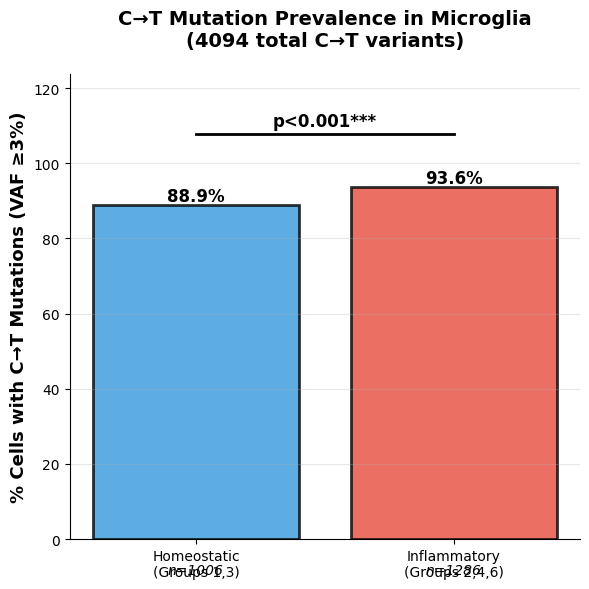


✓ Figures saved to ct_prevalence_all.png/pdf

ANALYSIS COMPLETE


In [50]:
from scipy.stats import fisher_exact
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

print("=" * 70)
print("C→T VARIANT ENRICHMENT ANALYSIS")
print("=" * 70)

# Convert variant_names to list
if not isinstance(variant_names, list):
    variant_names_list = list(variant_names)
else:
    variant_names_list = variant_names

vaf_threshold = 0.03

# Identify ALL C→T variants
# Format: REF-position-ALT (e.g., C-1234-T means C→T)
print("\nIdentifying C→T variants...")
ct_indices = []

for i, variant in enumerate(variant_names_list):
    parts = variant.split('-')
    
    if len(parts) >= 3:
        ref_allele = parts[0].upper()
        alt_allele = parts[2].upper()
        
        # C→T transition
        if ref_allele == 'C' and alt_allele == 'T':
            ct_indices.append(i)

print(f"Found {len(ct_indices)} C→T variants (all, regardless of pathogenicity)")

if len(ct_indices) == 0:
    print("\n⚠️ No C→T variants found!")
else:
    # Show some examples
    print("\nExample C→T variants identified:")
    for idx in ct_indices[:20]:
        print(f"  {variant_names_list[idx]}")
    
    # Count cells with ANY C→T variant
    has_ct = np.zeros(vaf_matrix.shape[0], dtype=bool)
    for idx in ct_indices:
        has_ct |= (vaf_matrix[:, idx] > vaf_threshold)
    
    # Simple comparison
    inf_with = has_ct[group_2_4_6_mask].sum()
    inf_without = group_2_4_6_mask.sum() - inf_with
    hom_with = has_ct[group_1_3_mask].sum()
    hom_without = group_1_3_mask.sum() - hom_with
    
    # Fisher's exact test
    table = [[inf_with, inf_without], [hom_with, hom_without]]
    odds_ratio, p_value = fisher_exact(table)
    
    # Calculate percentages
    inf_pct = (inf_with / group_2_4_6_mask.sum()) * 100
    hom_pct = (hom_with / group_1_3_mask.sum()) * 100
    
    print("\n" + "=" * 70)
    print("C→T ENRICHMENT RESULTS")
    print("=" * 70)
    print(f"\nInflammatory (Groups 2,4,6): {inf_with}/{group_2_4_6_mask.sum()} ({inf_pct:.1f}%)")
    print(f"Homeostatic (Groups 1,3):    {hom_with}/{group_1_3_mask.sum()} ({hom_pct:.1f}%)")
    print(f"\nOdds Ratio: {odds_ratio:.2f}")
    print(f"P-value: {p_value:.4f}")
    print(f"Difference: {inf_pct - hom_pct:.1f} percentage points")
    
    if p_value < 0.05:
        direction = "higher" if inf_pct > hom_pct else "lower"
        print(f"\n✓ SIGNIFICANT: Inflammatory microglia have {direction} C→T prevalence")
    else:
        print("\n✗ NOT SIGNIFICANT: No difference in C→T prevalence")
    
    # Plot
    fig, ax = plt.subplots(figsize=(6, 6))
    
    groups = ['Homeostatic\n(Groups 1,3)', 'Inflammatory\n(Groups 2,4,6)']
    percentages = [hom_pct, inf_pct]
    colors = ['#3498db', '#e74c3c']
    
    bars = ax.bar(groups, percentages, color=colors, 
                  alpha=0.8, edgecolor='black', linewidth=2)
    
    ax.set_ylabel('% Cells with C→T Mutations (VAF ≥3%)', fontsize=13, fontweight='bold')
    ax.set_title(f'C→T Mutation Prevalence in Microglia\n({len(ct_indices)} total C→T variants)', 
                 fontsize=14, fontweight='bold', pad=20)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    # Add significance bracket
    y_max = max(percentages) * 1.15
    ax.plot([0, 1], [y_max, y_max], 'k-', linewidth=2)
    
    # Format p-value display
    if p_value < 0.001:
        p_text = 'p<0.001***'
    elif p_value < 0.01:
        p_text = f'p={p_value:.3f}**'
    elif p_value < 0.05:
        p_text = f'p={p_value:.3f}*'
    else:
        p_text = f'p={p_value:.3f} ns'
    
    ax.text(0.5, y_max * 1.02, p_text, ha='center', 
            fontsize=12, fontweight='bold')
    
    # Add values on bars
    for bar, pct in zip(bars, percentages):
        ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1,
                f'{pct:.1f}%', ha='center', fontsize=12, fontweight='bold')
    
    # Add sample sizes
    ax.text(0, -max(percentages)*0.1, f'n={group_1_3_mask.sum()}', 
            ha='center', fontsize=10, style='italic')
    ax.text(1, -max(percentages)*0.1, f'n={group_2_4_6_mask.sum()}', 
            ha='center', fontsize=10, style='italic')
    
    ax.set_ylim(0, y_max * 1.15)
    ax.grid(axis='y', alpha=0.3, zorder=0)
    
    plt.tight_layout()
    plt.savefig('ct_prevalence_all.png', dpi=300, bbox_inches='tight')
    plt.savefig('ct_prevalence_all.pdf', dpi=300, bbox_inches='tight')
    plt.show()
    
    print("\n✓ Figures saved to ct_prevalence_all.png/pdf")

print("\n" + "=" * 70)
print("ANALYSIS COMPLETE")
print("=" * 70)


C→T vs OTHER MUTATION TYPE ENRICHMENT

Inflammatory: 1204 C→T, 1220 other (49.7% are C→T)
Homeostatic: 894 C→T, 915 other (49.4% are C→T)

OR=1.01, p=0.8766


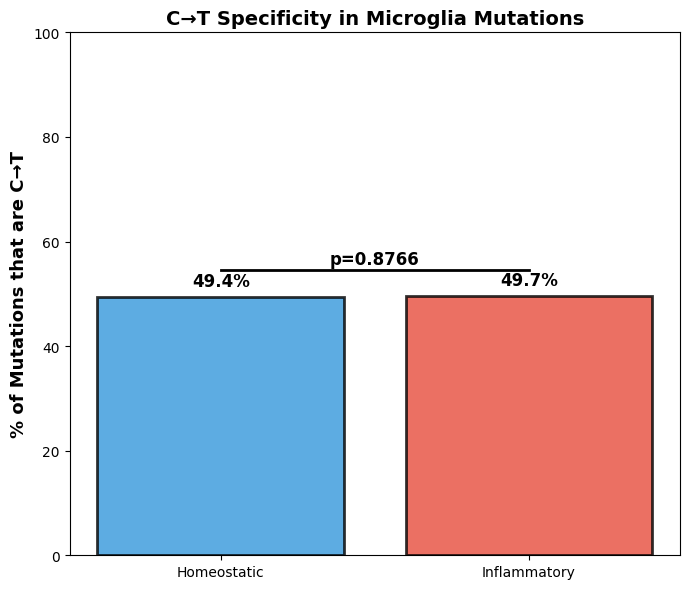

In [51]:
from scipy.stats import fisher_exact
import matplotlib.pyplot as plt
import numpy as np

print("=" * 70)
print("C→T vs OTHER MUTATION TYPE ENRICHMENT")
print("=" * 70)

# Get all mutation types
mutation_type_counts = {'C→T': 0, 'G→A': 0, 'A→G': 0, 'T→C': 0, 'Transversions': 0}

# Count each type
for i, variant in enumerate(variant_names_list):
    parts = variant.split('-')
    if len(parts) >= 3:
        ref = parts[0].upper()
        alt = parts[2].upper()
        
        if ref == 'C' and alt == 'T':
            mutation_type_counts['C→T'] += 1
        elif ref == 'G' and alt == 'A':
            mutation_type_counts['G→A'] += 1
        elif ref == 'A' and alt == 'G':
            mutation_type_counts['A→G'] += 1
        elif ref == 'T' and alt == 'C':
            mutation_type_counts['T→C'] += 1
        else:
            mutation_type_counts['Transversions'] += 1

# Test if C→T is SPECIFICALLY enriched vs all other types combined
# Create masks for C→T vs non-C→T
has_ct = np.zeros(vaf_matrix.shape[0], dtype=bool)
has_other = np.zeros(vaf_matrix.shape[0], dtype=bool)

for i, variant in enumerate(variant_names_list):
    parts = variant.split('-')
    if len(parts) >= 3:
        ref = parts[0].upper()
        alt = parts[2].upper()
        
        if (vaf_matrix[:, i] > vaf_threshold).any():
            if ref == 'C' and alt == 'T':
                has_ct |= (vaf_matrix[:, i] > vaf_threshold)
            else:
                has_other |= (vaf_matrix[:, i] > vaf_threshold)

# Calculate enrichment of C→T RELATIVE to other mutations
inf_ct = has_ct[group_2_4_6_mask].sum()
inf_other = has_other[group_2_4_6_mask].sum()
hom_ct = has_ct[group_1_3_mask].sum()
hom_other = has_other[group_1_3_mask].sum()

# Fisher's test: C→T enrichment vs other mutations
table = [[inf_ct, inf_other], [hom_ct, hom_other]]
odds_ratio, p_value = fisher_exact(table)

# Calculate proportion of mutations that are C→T
inf_pct_ct = (inf_ct / (inf_ct + inf_other)) * 100
hom_pct_ct = (hom_ct / (hom_ct + hom_other)) * 100

print(f"\nInflammatory: {inf_ct} C→T, {inf_other} other ({inf_pct_ct:.1f}% are C→T)")
print(f"Homeostatic: {hom_ct} C→T, {hom_other} other ({hom_pct_ct:.1f}% are C→T)")
print(f"\nOR={odds_ratio:.2f}, p={p_value:.4f}")

# Plot
fig, ax = plt.subplots(figsize=(7, 6))
groups = ['Homeostatic', 'Inflammatory']
percentages = [hom_pct_ct, inf_pct_ct]
colors = ['#3498db', '#e74c3c']

bars = ax.bar(groups, percentages, color=colors, alpha=0.8, 
              edgecolor='black', linewidth=2)

ax.set_ylabel('% of Mutations that are C→T', fontsize=13, fontweight='bold')
ax.set_title('C→T Specificity in Microglia Mutations', fontsize=14, fontweight='bold')
ax.set_ylim(0, 100)

# Add p-value
y_max = max(percentages) * 1.1
ax.plot([0, 1], [y_max, y_max], 'k-', linewidth=2)
ax.text(0.5, y_max * 1.02, f'p={p_value:.4f}', ha='center', fontsize=12, fontweight='bold')

for bar, pct in zip(bars, percentages):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 2,
            f'{pct:.1f}%', ha='center', fontsize=12, fontweight='bold')

plt.tight_layout()
plt.savefig('ct_specificity.png', dpi=300, bbox_inches='tight')
plt.show()


In [58]:
import numpy as np
import pandas as pd
from scipy.stats import fisher_exact, mannwhitneyu, kstest, chi2_contingency
from scipy.stats import spearmanr, pearsonr
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.stats.multitest import multipletests
import scanpy as sc

print("=" * 80)
print("COMPREHENSIVE MITOCHONDRIAL ANALYSIS: INFLAMMATORY VS HOMEOSTATIC MICROGLIA")
print("=" * 80)

# Get variant_summary with APOGEE2 scores
variant_summary = mgatk.uns['variant_summary']

# Convert variant_names to list
if not isinstance(variant_names, list):
    variant_names_list = list(variant_names)
else:
    variant_names_list = variant_names

# DIAGNOSTIC: Check the masks
print("\n" + "=" * 80)
print("DIAGNOSTIC: Checking group masks")
print("=" * 80)
print(f"Total cells in dataset: {len(group_1_3_mask)}")
print(f"group_1_3_mask type: {type(group_1_3_mask)}")
print(f"group_2_4_6_mask type: {type(group_2_4_6_mask)}")

# Convert to numpy arrays if they're pandas Series
if isinstance(group_1_3_mask, pd.Series):
    group_1_3_mask = group_1_3_mask.values
if isinstance(group_2_4_6_mask, pd.Series):
    group_2_4_6_mask = group_2_4_6_mask.values

print(f"group_1_3_mask sum: {group_1_3_mask.sum()}")
print(f"group_2_4_6_mask sum: {group_2_4_6_mask.sum()}")
print(f"vaf_matrix shape: {vaf_matrix.shape}")

# Define groups
n_homeostatic = group_1_3_mask.sum()
n_inflammatory = group_2_4_6_mask.sum()

print(f"\nSample sizes:")
print(f"  Homeostatic (clusters 1,3): {n_homeostatic}")
print(f"  Inflammatory (clusters 2,4,6): {n_inflammatory}")

# ============================================================================
# SECTION 1: MUTATION BURDEN METRICS
# ============================================================================
print("\n" + "=" * 80)
print("SECTION 1: OVERALL MUTATION BURDEN")
print("=" * 80)

vaf_threshold = 0.03
pathogenic_threshold = 0.716

# 1.1 Total variant count per cell
total_variants = (vaf_matrix > vaf_threshold).sum(axis=1)

# 1.2 Pathogenic variant count per cell
pathogenic_indices = []
for i in range(len(variant_names_list)):
    apogee = variant_summary.iloc[i]['APOGEE2_score']
    if pd.notna(apogee) and apogee >= pathogenic_threshold:
        pathogenic_indices.append(i)

print(f"Found {len(pathogenic_indices)} pathogenic variants")

pathogenic_count = (vaf_matrix[:, pathogenic_indices] > vaf_threshold).sum(axis=1)

# 1.3 Mean VAF across all variants
mean_vaf_all = vaf_matrix.mean(axis=1)

# 1.4 Max VAF (highest clonality)
max_vaf = vaf_matrix.max(axis=1)

# 1.5 Variant diversity (Shannon entropy)
def calculate_entropy(vaf_row, threshold=0.01):
    vafs = vaf_row[vaf_row > threshold]
    if len(vafs) == 0:
        return 0
    proportions = vafs / vafs.sum()
    return -np.sum(proportions * np.log2(proportions + 1e-10))

print("Calculating entropy...")
variant_entropy = np.array([calculate_entropy(vaf_matrix[i, :]) for i in range(vaf_matrix.shape[0])])

# Create group labels as numpy array
group_labels = np.array(['Other'] * len(group_1_3_mask), dtype=object)
group_labels[group_1_3_mask] = 'Homeostatic'
group_labels[group_2_4_6_mask] = 'Inflammatory'

print(f"\nGroup label distribution:")
unique, counts = np.unique(group_labels, return_counts=True)
for u, c in zip(unique, counts):
    print(f"  {u}: {c}")

# Create burden dataframe
burden_metrics = pd.DataFrame({
    'total_variants': total_variants,
    'pathogenic_variants': pathogenic_count,
    'mean_vaf': mean_vaf_all,
    'max_vaf': max_vaf,
    'variant_entropy': variant_entropy,
    'group': group_labels
})

print(f"\nBurden metrics dataframe shape: {burden_metrics.shape}")
print(f"Group distribution in burden_metrics:")
print(burden_metrics['group'].value_counts())

# Filter to only analyzed groups
burden_metrics_filtered = burden_metrics[burden_metrics['group'] != 'Other'].copy()

print(f"\nFiltered burden_metrics size: {len(burden_metrics_filtered)}")
print(f"Homeostatic cells: {(burden_metrics_filtered['group'] == 'Homeostatic').sum()}")
print(f"Inflammatory cells: {(burden_metrics_filtered['group'] == 'Inflammatory').sum()}")

# Statistical tests
burden_results = []
for metric in ['total_variants', 'pathogenic_variants', 'mean_vaf', 'max_vaf', 'variant_entropy']:
    hom_vals = burden_metrics_filtered[burden_metrics_filtered['group'] == 'Homeostatic'][metric].values
    inf_vals = burden_metrics_filtered[burden_metrics_filtered['group'] == 'Inflammatory'][metric].values
    
    print(f"\nTesting {metric}:")
    print(f"  Homeostatic n={len(hom_vals)}, mean={hom_vals.mean():.3f}")
    print(f"  Inflammatory n={len(inf_vals)}, mean={inf_vals.mean():.3f}")
    
    stat, p_val = mannwhitneyu(inf_vals, hom_vals, alternative='two-sided')
    
    burden_results.append({
        'metric': metric,
        'homeostatic_mean': hom_vals.mean(),
        'inflammatory_mean': inf_vals.mean(),
        'fold_change': inf_vals.mean() / (hom_vals.mean() + 1e-10),
        'p_value': p_val,
        'effect_size': (inf_vals.mean() - hom_vals.mean()) / np.sqrt((hom_vals.std()**2 + inf_vals.std()**2) / 2)
    })

df_burden = pd.DataFrame(burden_results)
df_burden['p_adj'] = multipletests(df_burden['p_value'], method='fdr_bh')[1]

print("\n" + "=" * 80)
print("MUTATION BURDEN RESULTS")
print("=" * 80)
print(df_burden.to_string(index=False))

# ============================================================================
# SECTION 2: MUTATION SPECTRA
# ============================================================================
print("\n" + "=" * 80)
print("SECTION 2: MUTATION SPECTRA ANALYSIS")
print("=" * 80)

mutation_types = {
    'C→T': [], 'T→C': [], 'A→G': [], 'G→A': [],
    'C→A': [], 'C→G': [], 'T→A': [], 'T→G': [],
    'A→C': [], 'A→T': [], 'G→C': [], 'G→T': []
}

for i, variant in enumerate(variant_names_list):
    parts = variant.split('-')
    if len(parts) >= 3:
        ref = parts[0].upper()
        alt = parts[2].upper()
        mut_type = f"{ref}→{alt}"
        if mut_type in mutation_types:
            mutation_types[mut_type].append(i)

mutation_spectra = {}
for mut_type, indices in mutation_types.items():
    if len(indices) > 0:
        mutation_spectra[f'{mut_type}_count'] = (vaf_matrix[:, indices] > vaf_threshold).sum(axis=1)

df_spectra = pd.DataFrame(mutation_spectra)
df_spectra['group'] = group_labels

transitions = ['C→T', 'T→C', 'A→G', 'G→A']
transversions = ['C→A', 'C→G', 'T→A', 'T→G', 'A→C', 'A→T', 'G→C', 'G→T']

df_spectra['transition_count'] = df_spectra[[f'{t}_count' for t in transitions if f'{t}_count' in df_spectra.columns]].sum(axis=1)
df_spectra['transversion_count'] = df_spectra[[f'{t}_count' for t in transversions if f'{t}_count' in df_spectra.columns]].sum(axis=1)
df_spectra['ti_tv_ratio'] = df_spectra['transition_count'] / (df_spectra['transversion_count'] + 1)

df_spectra_filtered = df_spectra[df_spectra['group'] != 'Other'].copy()

spectra_results = []
for mut_type in mutation_types.keys():
    col_name = f'{mut_type}_count'
    if col_name not in df_spectra_filtered.columns:
        continue
    
    hom_vals = df_spectra_filtered[df_spectra_filtered['group'] == 'Homeostatic'][col_name].values
    inf_vals = df_spectra_filtered[df_spectra_filtered['group'] == 'Inflammatory'][col_name].values
    
    stat, p_val = mannwhitneyu(inf_vals, hom_vals, alternative='two-sided')
    
    spectra_results.append({
        'mutation_type': mut_type,
        'homeostatic_mean': hom_vals.mean(),
        'inflammatory_mean': inf_vals.mean(),
        'fold_change': inf_vals.mean() / (hom_vals.mean() + 1e-10),
        'p_value': p_val
    })

hom_titv = df_spectra_filtered[df_spectra_filtered['group'] == 'Homeostatic']['ti_tv_ratio'].values
inf_titv = df_spectra_filtered[df_spectra_filtered['group'] == 'Inflammatory']['ti_tv_ratio'].values
stat, p_val = mannwhitneyu(inf_titv, hom_titv, alternative='two-sided')

spectra_results.append({
    'mutation_type': 'Ti/Tv ratio',
    'homeostatic_mean': hom_titv.mean(),
    'inflammatory_mean': inf_titv.mean(),
    'fold_change': inf_titv.mean() / (hom_titv.mean() + 1e-10),
    'p_value': p_val
})

df_spectra_results = pd.DataFrame(spectra_results)
df_spectra_results['p_adj'] = multipletests(df_spectra_results['p_value'], method='fdr_bh')[1]
df_spectra_results = df_spectra_results.sort_values('p_value')

print("\nMutation Spectra Results (Top 10):")
print(df_spectra_results.head(10).to_string(index=False))

# ============================================================================
# SECTION 3: HETEROPLASMY DISTRIBUTION
# ============================================================================
print("\n" + "=" * 80)
print("SECTION 3: HETEROPLASMY DISTRIBUTION")
print("=" * 80)

vaf_bins = [0.01, 0.03, 0.05, 0.10, 0.20, 0.50, 1.0]
bin_labels = ['1-3%', '3-5%', '5-10%', '10-20%', '20-50%', '50-100%']

heteroplasmy_dist = []
for i in range(vaf_matrix.shape[0]):
    if group_labels[i] == 'Other':
        continue
    
    vafs = vaf_matrix[i, :]
    
    for j in range(len(vaf_bins) - 1):
        count = ((vafs >= vaf_bins[j]) & (vafs < vaf_bins[j+1])).sum()
        heteroplasmy_dist.append({
            'cell': i,
            'group': group_labels[i],
            'vaf_bin': bin_labels[j],
            'count': count
        })

df_heteroplasmy = pd.DataFrame(heteroplasmy_dist)

heteroplasmy_results = []
for bin_label in bin_labels:
    hom_vals = df_heteroplasmy[(df_heteroplasmy['group'] == 'Homeostatic') & 
                               (df_heteroplasmy['vaf_bin'] == bin_label)]['count'].values
    inf_vals = df_heteroplasmy[(df_heteroplasmy['group'] == 'Inflammatory') & 
                               (df_heteroplasmy['vaf_bin'] == bin_label)]['count'].values
    
    stat, p_val = mannwhitneyu(inf_vals, hom_vals, alternative='two-sided')
    
    heteroplasmy_results.append({
        'vaf_bin': bin_label,
        'homeostatic_mean': hom_vals.mean(),
        'inflammatory_mean': inf_vals.mean(),
        'fold_change': inf_vals.mean() / (hom_vals.mean() + 1e-10),
        'p_value': p_val
    })

df_heteroplasmy_results = pd.DataFrame(heteroplasmy_results)
df_heteroplasmy_results['p_adj'] = multipletests(df_heteroplasmy_results['p_value'], method='fdr_bh')[1]

print("\nHeteroplasmy Distribution Results:")
print(df_heteroplasmy_results.to_string(index=False))

# ============================================================================
# SAVE INITIAL RESULTS
# ============================================================================
print("\n" + "=" * 80)
print("SAVING RESULTS")
print("=" * 80)

df_burden.to_csv('results_burden_metrics.csv', index=False)
df_spectra_results.to_csv('results_mutation_spectra.csv', index=False)
df_heteroplasmy_results.to_csv('results_heteroplasmy_distribution.csv', index=False)

print("✓ Results saved to CSV files")

# Export key dataframes for further analysis
print("\n" + "=" * 80)
print("KEY FINDINGS SUMMARY")
print("=" * 80)

print("\nSIGNIFICANT BURDEN METRICS (p_adj < 0.05):")
sig_burden = df_burden[df_burden['p_adj'] < 0.05]
if len(sig_burden) > 0:
    for _, row in sig_burden.iterrows():
        print(f"  • {row['metric']}: {row['fold_change']:.2f}x, p={row['p_adj']:.3e}")
else:
    print("  None")

print("\nSIGNIFICANT MUTATION SPECTRA (p_adj < 0.05):")
sig_spectra = df_spectra_results[df_spectra_results['p_adj'] < 0.05].head(5)
if len(sig_spectra) > 0:
    for _, row in sig_spectra.iterrows():
        print(f"  • {row['mutation_type']}: {row['fold_change']:.2f}x, p={row['p_adj']:.3e}")
else:
    print("  None")

print("\nSIGNIFICANT HETEROPLASMY BINS (p_adj < 0.05):")
sig_hetero = df_heteroplasmy_results[df_heteroplasmy_results['p_adj'] < 0.05]
if len(sig_hetero) > 0:
    for _, row in sig_hetero.iterrows():
        print(f"  • {row['vaf_bin']}: {row['fold_change']:.2f}x, p={row['p_adj']:.3e}")
else:
    print("  None")

print("\n" + "=" * 80)
print("ANALYSIS COMPLETE - FIRST 3 SECTIONS")
print("=" * 80)
print("\nReady to continue with complex-specific, clonality, and pathogenicity analyses!")


COMPREHENSIVE MITOCHONDRIAL ANALYSIS: INFLAMMATORY VS HOMEOSTATIC MICROGLIA

DIAGNOSTIC: Checking group masks
Total cells in dataset: 3346
group_1_3_mask type: <class 'pandas.core.series.Series'>
group_2_4_6_mask type: <class 'pandas.core.series.Series'>
group_1_3_mask sum: 1006
group_2_4_6_mask sum: 1286
vaf_matrix shape: (3346, 44436)

Sample sizes:
  Homeostatic (clusters 1,3): 1006
  Inflammatory (clusters 2,4,6): 1286

SECTION 1: OVERALL MUTATION BURDEN
Found 3521 pathogenic variants
Calculating entropy...

Group label distribution:
  Homeostatic: 1006
  Inflammatory: 1286
  Other: 1054

Burden metrics dataframe shape: (3346, 6)
Group distribution in burden_metrics:
group
Inflammatory    1286
Other           1054
Homeostatic     1006
Name: count, dtype: int64

Filtered burden_metrics size: 2292
Homeostatic cells: 1006
Inflammatory cells: 1286

Testing total_variants:
  Homeostatic n=1006, mean=56.251
  Inflammatory n=1286, mean=61.363

Testing pathogenic_variants:
  Homeostatic n=

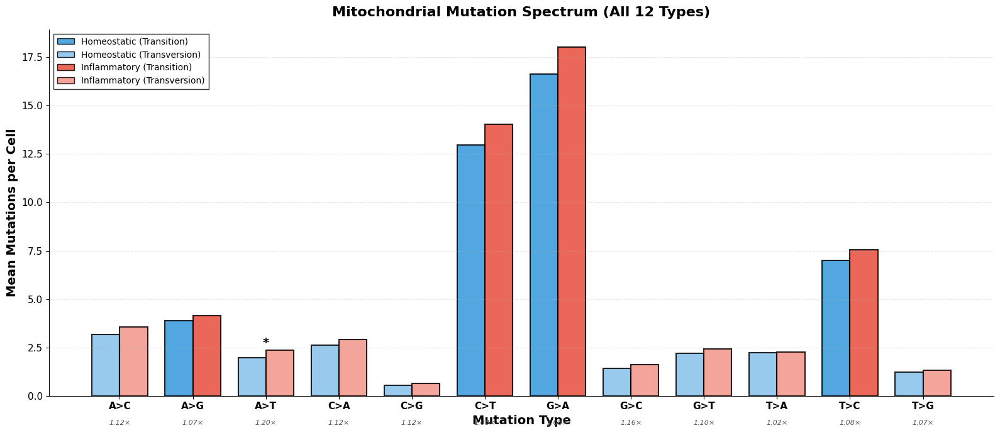


MUTATION SPECTRUM SUMMARY (ALL 12 TYPES)
A>C    Transversion    3.2 →   3.5  FC=1.12  p=6.064e-01 ns 
A>G    Transition      3.9 →   4.1  FC=1.07  p=6.064e-01 ns 
A>T    Transversion    2.0 →   2.4  FC=1.20  p=1.294e-02 *  
C>A    Transversion    2.6 →   2.9  FC=1.12  p=6.064e-01 ns 
C>G    Transversion    0.6 →   0.6  FC=1.12  p=7.527e-01 ns 
C>T    Transition     13.0 →  14.0  FC=1.08  p=7.527e-01 ns 
G>A    Transition     16.6 →  18.0  FC=1.08  p=7.527e-01 ns 
G>C    Transversion    1.4 →   1.6  FC=1.16  p=2.751e-01 ns 
G>T    Transversion    2.2 →   2.4  FC=1.10  p=7.782e-01 ns 
T>A    Transversion    2.2 →   2.3  FC=1.02  p=1.052e-01 ns 
T>C    Transition      7.0 →   7.5  FC=1.08  p=7.527e-01 ns 
T>G    Transversion    1.2 →   1.3  FC=1.07  p=7.527e-01 ns 


In [64]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import chi2_contingency
from statsmodels.stats.multitest import multipletests

# ============================================================================
# ALL 12 MUTATION TYPES (NO COMPLEMENTING)
# ============================================================================

# All 12 possible substitutions
mutation_order = ['A>C', 'A>G', 'A>T', 'C>A', 'C>G', 'C>T', 
                  'G>A', 'G>C', 'G>T', 'T>A', 'T>C', 'T>G']

# Get mutation counts per group
def get_mutation_counts(vaf_matrix, variant_names, mask, vaf_threshold=0.03):
    mutation_counts = {mut: 0 for mut in mutation_order}
    group_matrix = vaf_matrix[mask, :]
    
    for i, variant in enumerate(variant_names):
        parts = variant.split('-')
        if len(parts) < 3:
            continue
        
        ref = parts[0].upper()
        alt = parts[2].upper()
        
        # Skip if either base is N or not ACGT
        if ref not in 'ACGT' or alt not in 'ACGT':
            continue
        
        mut_type = f'{ref}>{alt}'
        n_cells = (group_matrix[:, i] > vaf_threshold).sum()
        
        if mut_type in mutation_counts:
            mutation_counts[mut_type] += n_cells
    
    return mutation_counts

# Calculate counts
homeostatic_counts = get_mutation_counts(vaf_matrix, variant_names_list, 
                                         group_1_3_mask, vaf_threshold=0.03)
inflammatory_counts = get_mutation_counts(vaf_matrix, variant_names_list, 
                                          group_2_4_6_mask, vaf_threshold=0.03)

# Normalize per cell
n_hom = group_1_3_mask.sum()
n_inf = group_2_4_6_mask.sum()

hom_norm = {k: v/n_hom for k, v in homeostatic_counts.items()}
inf_norm = {k: v/n_inf for k, v in inflammatory_counts.items()}

# Statistical tests
p_values = []
for mut_type in mutation_order:
    obs = np.array([[homeostatic_counts[mut_type], inflammatory_counts[mut_type]],
                    [sum(homeostatic_counts.values()) - homeostatic_counts[mut_type],
                     sum(inflammatory_counts.values()) - inflammatory_counts[mut_type]]])
    chi2, p, dof, expected = chi2_contingency(obs)
    p_values.append(p)

_, p_adj, _, _ = multipletests(p_values, method='fdr_bh')

# ============================================================================
# CREATE THE PLOT
# ============================================================================

fig, ax = plt.subplots(figsize=(16, 7))

x = np.arange(len(mutation_order))
width = 0.38

# Color by type
colors_hom = []
colors_inf = []
for mut in mutation_order:
    if mut in ['C>T', 'T>C', 'A>G', 'G>A']:  # Transitions
        colors_hom.append('#3498db')
        colors_inf.append('#e74c3c')
    else:  # Transversions
        colors_hom.append('#85c1e9')
        colors_inf.append('#f1948a')

# Create bars
bars1 = ax.bar(x - width/2, [hom_norm[m] for m in mutation_order], 
               width, label='Homeostatic', color=colors_hom, 
               alpha=0.85, edgecolor='black', linewidth=1.5)
bars2 = ax.bar(x + width/2, [inf_norm[m] for m in mutation_order], 
               width, label='Inflammatory', color=colors_inf, 
               alpha=0.85, edgecolor='black', linewidth=1.5)

# Formatting
ax.set_ylabel('Mean Mutations per Cell', fontsize=14, fontweight='bold')
ax.set_xlabel('Mutation Type', fontsize=14, fontweight='bold')
ax.set_title('Mitochondrial Mutation Spectrum (All 12 Types)', fontsize=16, fontweight='bold', pad=15)
ax.set_xticks(x)
ax.set_xticklabels(mutation_order, fontsize=11, fontweight='bold', rotation=0)
ax.legend(fontsize=12, frameon=True, loc='upper left', edgecolor='black', fancybox=False)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.tick_params(axis='both', labelsize=11)
ax.grid(axis='y', alpha=0.3, linestyle='--', linewidth=0.8)

# Add significance stars
for i, p in enumerate(p_adj):
    max_height = max(hom_norm[mutation_order[i]], inf_norm[mutation_order[i]])
    y_pos = max_height * 1.08
    
    if p < 0.001:
        ax.text(i, y_pos, '***', ha='center', fontsize=14, fontweight='bold')
    elif p < 0.01:
        ax.text(i, y_pos, '**', ha='center', fontsize=14, fontweight='bold')
    elif p < 0.05:
        ax.text(i, y_pos, '*', ha='center', fontsize=14, fontweight='bold')

# Add fold change annotations
for i, mut_type in enumerate(mutation_order):
    fc = inf_norm[mut_type] / (hom_norm[mut_type] + 1e-10)
    ax.text(i, -ax.get_ylim()[1] * 0.08, f'{fc:.2f}×', 
           ha='center', fontsize=8, style='italic', color='#555555')

# Add legend for transitions vs transversions
from matplotlib.patches import Patch
legend_elements = [
    Patch(facecolor='#3498db', edgecolor='black', label='Homeostatic (Transition)', alpha=0.85),
    Patch(facecolor='#85c1e9', edgecolor='black', label='Homeostatic (Transversion)', alpha=0.85),
    Patch(facecolor='#e74c3c', edgecolor='black', label='Inflammatory (Transition)', alpha=0.85),
    Patch(facecolor='#f1948a', edgecolor='black', label='Inflammatory (Transversion)', alpha=0.85)
]
ax.legend(handles=legend_elements, fontsize=10, frameon=True, loc='upper left', 
         edgecolor='black', fancybox=False)

plt.tight_layout()
plt.savefig('mutation_spectrum_12types.pdf', dpi=300, bbox_inches='tight')
plt.savefig('mutation_spectrum_12types.png', dpi=300, bbox_inches='tight')
plt.show()

# Print summary
print("\n" + "="*70)
print("MUTATION SPECTRUM SUMMARY (ALL 12 TYPES)")
print("="*70)
for mut_type, p in zip(mutation_order, p_adj):
    fc = inf_norm[mut_type] / (hom_norm[mut_type] + 1e-10)
    sig = '***' if p < 0.001 else '**' if p < 0.01 else '*' if p < 0.05 else 'ns'
    mut_class = 'Transition  ' if mut_type in ['C>T', 'T>C', 'A>G', 'G>A'] else 'Transversion'
    print(f"{mut_type:6s} {mut_class:12s}  {hom_norm[mut_type]:5.1f} → {inf_norm[mut_type]:5.1f}  "
          f"FC={fc:4.2f}  p={p:.3e} {sig:3s}")


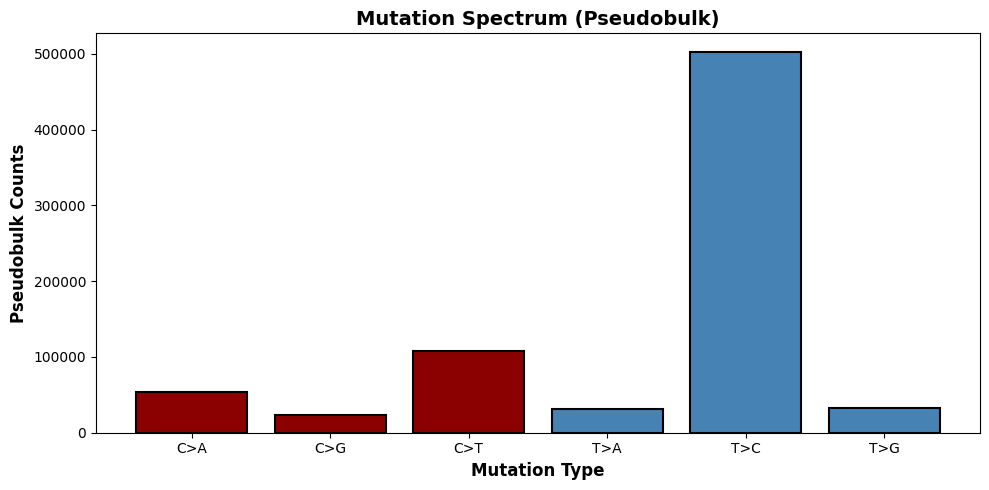

C>A:    54058 (  7.2%)
C>G:    22917 (  3.1%)
C>T:   107658 ( 14.3%)
T>A:    31652 (  4.2%)
T>C:   501845 ( 66.8%)
T>G:    32918 (  4.4%)


In [76]:
# Simpler approach - just show COUNTS by mutation type (pseudobulk)
pseudo_bulk_counts = mgatk.obsm['variant_counts'].sum(axis=0)

mutation_spectrum = {}
for mutation_type in ['C>A', 'C>G', 'C>T', 'T>A', 'T>C', 'T>G']:
    ref, alt = mutation_type.split('>')
    mask = (variant_summary['ref'].str.upper() == ref) & \
           (variant_summary['allele'].str.upper() == alt)
    
    total_counts = pseudo_bulk_counts[mask].sum()
    mutation_spectrum[mutation_type] = total_counts

# Plot
fig, ax = plt.subplots(figsize=(10, 5))
colors = ['darkred' if i < 3 else 'steelblue' for i in range(6)]
ax.bar(mutation_spectrum.keys(), mutation_spectrum.values(), 
       color=colors, edgecolor='black', linewidth=1.5)
ax.set_xlabel('Mutation Type', fontweight='bold', fontsize=12)
ax.set_ylabel('Pseudobulk Counts', fontweight='bold', fontsize=12)
ax.set_title('Mutation Spectrum (Pseudobulk)', fontweight='bold', fontsize=14)
plt.tight_layout()
plt.show()

# Check if C>T is dominant
total = sum(mutation_spectrum.values())
for mut, count in mutation_spectrum.items():
    print(f"{mut}: {count:8.0f} ({100*count/total:5.1f}%)")


Number of cells:
  Inflammatory: 1286
  Homeostatic: 1006
  Other: 1054

Mean coverage per cell at variant positions:
  Inflammatory: 41.3x (range: 3.4 - 60.6)
  Homeostatic: 38.7x (range: 3.2 - 56.0)
  Other: 42.4x (range: 3.6 - 61.8)


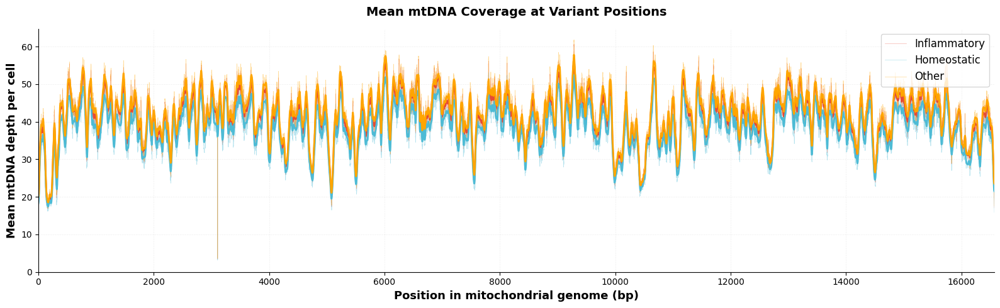


Max y-axis value should be around: 61.8x


In [84]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Step 1: Get cell subsets
inflammatory_cells = mgatk.obs[
    mgatk.obs['microglial_state'] == 'Inflammatory'
].index

homeostatic_cells = mgatk.obs[
    mgatk.obs['microglial_state'] == 'Homeostatic'
].index

other_cells = mgatk.obs[
    mgatk.obs['microglial_state'] == 'Other'
].index

inflam_idx = [mgatk.obs.index.get_loc(c) for c in inflammatory_cells]
homeo_idx = [mgatk.obs.index.get_loc(c) for c in homeostatic_cells]
other_idx = [mgatk.obs.index.get_loc(c) for c in other_cells]

print(f"Number of cells:")
print(f"  Inflammatory: {len(inflam_idx)}")
print(f"  Homeostatic: {len(homeo_idx)}")
print(f"  Other: {len(other_idx)}")

# Step 2: Calculate MEAN coverage per position (not sum!)
var_coverage = mgatk.obsm['variant_coverage']

# MEAN across cells (not sum!)
inflam_var_cov = var_coverage[inflam_idx, :].mean(axis=0)
homeo_var_cov = var_coverage[homeo_idx, :].mean(axis=0)
other_var_cov = var_coverage[other_idx, :].mean(axis=0)

# Get positions from variant names
variant_names = mgatk.uns['variant_names']
positions = []
for v in variant_names:
    parts = v.split('-')
    if len(parts) == 3:
        try:
            positions.append(int(parts[1]))
        except:
            positions.append(0)
    else:
        positions.append(0)

positions = np.array(positions)

# Step 3: Create DataFrame
coverage_df = pd.DataFrame({
    'position': positions,
    'Inflammatory': inflam_var_cov,
    'Homeostatic': homeo_var_cov,
    'Other': other_var_cov
})

# Sort and filter
coverage_df = coverage_df.sort_values('position')
coverage_df = coverage_df[coverage_df['position'] > 0]

print(f"\nMean coverage per cell at variant positions:")
print(f"  Inflammatory: {coverage_df['Inflammatory'].mean():.1f}x (range: {coverage_df['Inflammatory'].min():.1f} - {coverage_df['Inflammatory'].max():.1f})")
print(f"  Homeostatic: {coverage_df['Homeostatic'].mean():.1f}x (range: {coverage_df['Homeostatic'].min():.1f} - {coverage_df['Homeostatic'].max():.1f})")
print(f"  Other: {coverage_df['Other'].mean():.1f}x (range: {coverage_df['Other'].min():.1f} - {coverage_df['Other'].max():.1f})")

# Step 4: Plot
fig, ax = plt.subplots(figsize=(16, 5))

# Plot raw data (thin lines)
ax.plot(coverage_df['position'], coverage_df['Inflammatory'], 
        linewidth=0.5, label='Inflammatory', color='#E64B35', alpha=0.4)
ax.plot(coverage_df['position'], coverage_df['Homeostatic'], 
        linewidth=0.5, label='Homeostatic', color='#4DBBD5', alpha=0.4)
ax.plot(coverage_df['position'], coverage_df['Other'], 
        linewidth=0.5, label='Other', color='#FFA500', alpha=0.4)

# Add smoothed version
from scipy.ndimage import gaussian_filter1d

window = 20
ax.plot(coverage_df['position'], 
        gaussian_filter1d(coverage_df['Inflammatory'], sigma=window),
        linewidth=2, color='#E64B35', alpha=1.0, label='_nolegend_')
ax.plot(coverage_df['position'], 
        gaussian_filter1d(coverage_df['Homeostatic'], sigma=window),
        linewidth=2, color='#4DBBD5', alpha=1.0, label='_nolegend_')
ax.plot(coverage_df['position'], 
        gaussian_filter1d(coverage_df['Other'], sigma=window),
        linewidth=2, color='#FFA500', alpha=1.0, label='_nolegend_')

ax.set_xlabel('Position in mitochondrial genome (bp)', fontweight='bold', fontsize=13)
ax.set_ylabel('Mean mtDNA depth per cell', fontweight='bold', fontsize=13)
ax.set_xlim(0, 16569)
ax.set_ylim(bottom=0)
ax.legend(loc='upper right', frameon=True, fontsize=12)
ax.grid(alpha=0.2, linestyle='--', linewidth=0.5)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.title('Mean mtDNA Coverage at Variant Positions', 
          fontweight='bold', fontsize=14, pad=15)
plt.tight_layout()
plt.show()

print(f"\nMax y-axis value should be around: {max(coverage_df['Inflammatory'].max(), coverage_df['Homeostatic'].max(), coverage_df['Other'].max()):.1f}x")


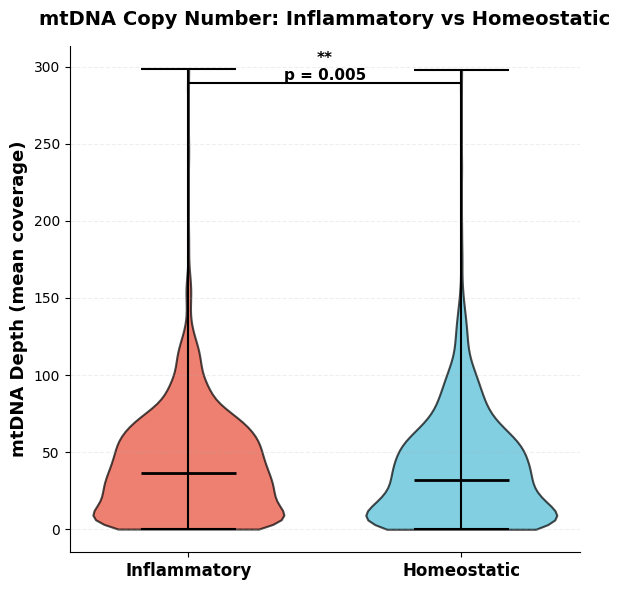


STATISTICAL COMPARISON

Inflammatory (n=1286):
  Mean: 41.32x
  Median: 36.60x

Homeostatic (n=1006):
  Mean: 38.69x
  Median: 32.20x

Mann-Whitney U test:
  P-value: 4.67e-03
  Significant: YES ✓

Fold change (Inflammatory/Homeostatic): 1.14x


In [92]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import mannwhitneyu

# Filter to just Inflammatory and Homeostatic
subset = mgatk.obs[mgatk.obs['microglial_state'].isin(['Inflammatory', 'Homeostatic'])].copy()
subset['microglial_state'] = subset['microglial_state'].astype(str)

# Statistical test
inflam_depth = subset[subset['microglial_state'] == 'Inflammatory']['mtdna_depth']
homeo_depth = subset[subset['microglial_state'] == 'Homeostatic']['mtdna_depth']
stat, p = mannwhitneyu(inflam_depth, homeo_depth)

# Create clean violin plot
fig, ax = plt.subplots(figsize=(6, 6))

# Violin plot with inner quartiles
parts = ax.violinplot([inflam_depth, homeo_depth], 
                       positions=[0, 1],
                       showmeans=False, 
                       showmedians=True,
                       widths=0.7)

# Color the violins
colors = ['#E64B35', '#4DBBD5']
for pc, color in zip(parts['bodies'], colors):
    pc.set_facecolor(color)
    pc.set_alpha(0.7)
    pc.set_edgecolor('black')
    pc.set_linewidth(1.5)

# Style the median lines
parts['cmedians'].set_edgecolor('black')
parts['cmedians'].set_linewidth(2)

# Style other elements
for partname in ('cbars', 'cmins', 'cmaxes'):
    parts[partname].set_edgecolor('black')
    parts[partname].set_linewidth(1.5)

# Add significance bar
y_max = max(inflam_depth.max(), homeo_depth.max()) * 0.95
h = y_max * 0.02

ax.plot([0, 0, 1, 1], [y_max, y_max + h, y_max + h, y_max], 
        lw=1.5, c='black')

if p < 0.001:
    sig_text = '***\np < 0.001'
elif p < 0.01:
    sig_text = f'**\np = {p:.3f}'
elif p < 0.05:
    sig_text = f'*\np = {p:.3f}'
else:
    sig_text = f'n.s.\np = {p:.3f}'

ax.text(0.5, y_max + h, sig_text, ha='center', va='bottom', 
        fontsize=11, fontweight='bold')

# Formatting
ax.set_xticks([0, 1])
ax.set_xticklabels(['Inflammatory', 'Homeostatic'], fontsize=12, fontweight='bold')
ax.set_ylabel('mtDNA Depth (mean coverage)', fontweight='bold', fontsize=13)
ax.set_title('mtDNA Copy Number: Inflammatory vs Homeostatic', 
             fontweight='bold', fontsize=14, pad=15)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.grid(alpha=0.2, axis='y', linestyle='--')

plt.tight_layout()
plt.show()

# Print stats
print("\n" + "=" * 60)
print("STATISTICAL COMPARISON")
print("=" * 60)
print(f"\nInflammatory (n={len(inflam_depth)}):")
print(f"  Mean: {inflam_depth.mean():.2f}x")
print(f"  Median: {inflam_depth.median():.2f}x")

print(f"\nHomeostatic (n={len(homeo_depth)}):")
print(f"  Mean: {homeo_depth.mean():.2f}x")
print(f"  Median: {homeo_depth.median():.2f}x")

print(f"\nMann-Whitney U test:")
print(f"  P-value: {p:.2e}")
print(f"  Significant: {'YES ✓' if p < 0.05 else 'NO'}")

fold_change = inflam_depth.median() / homeo_depth.median()
print(f"\nFold change (Inflammatory/Homeostatic): {fold_change:.2f}x")


In [ ]:
#chrooamtin accebility stuff 
import snapatac2 as snap

def differential_expression_by_cell_type(WBC048, mgatk, peak_mat, variant_name, 
                                        upper_VAF=0.1, lower_VAF=0.0):
    variant_names = list(mgatk.uns['variant_names'])
    variant_idx = variant_names.index(variant_name)
    vaf_values = mgatk.obsm['variant_vaf_high_quality'][:, variant_idx]

    WBC048.obs['vaf'+ variant_name] = vaf_values

    cell_types = WBC048.obs['leiden'].unique().tolist()

    for cell in range(len(cell_types)):
        cell_status = str(cell_types[cell]) +'_' + variant_name + '_status'
        positive_cells = str(cell_types[cell]) + variant_name + '+'
        negative_cells = str(cell_types[cell]) + variant_name + '-'
        WBC048.obs[cell_status] = 'Other'
        WBC048.obs.loc[
            (WBC048.obs['leiden'] == cell_types[cell]) & (WBC048.obs['vaf'+ variant_name] >= upper_VAF),
            cell_status
        ] = positive_cells
        WBC048.obs.loc[
            (WBC048.obs['leiden'] == cell_types[cell]) & (WBC048.obs['vaf'+ variant_name] <= lower_VAF),
            cell_status
        ] = negative_cells
        
        group1 = positive_cells
        group2 = negative_cells
        pos_variant = WBC048.obs[cell_status] == group1
        neg_variant = WBC048.obs[cell_status] == group2
        
        print(f"\nCluster {cell_types[cell]}: {pos_variant.sum()} positive, {neg_variant.sum()} negative cells")
        
        try:
            print(f"  Running differential test...")
            diff_peaks = snap.tl.diff_test(
                peak_mat,
                cell_group1=pos_variant,
                cell_group2=neg_variant,
                min_log_fc = 0.15,     # ← CHANGED from 0.25 to 0.15
                min_pct=0.01,
            )
            diff_peaks_filtered = diff_peaks.filter(pl.col('p-value') < 0.05)  # ← CHANGED from 0.001 to 0.05
            df_filtered = diff_peaks_filtered.to_pandas()
            
            print(f"  Found {len(df_filtered)} significant peaks (p < 0.05)")
            
            df_filtered["gene_annotation"] = df_filtered["feature name"].apply(region_to_gene)
            
            gene_list = []
            for annotation in df_filtered["gene_annotation"]:
                if annotation != "intergenic":
                    for gene_entry in annotation.split(";"):
                        gene_name = gene_entry.split(",")[0]
                        if gene_name:
                            gene_list.append(gene_name)

            unique_genes = list(set(gene_list))
            print(f"  Total unique genes: {len(unique_genes)}")

            with open(f"differential_peaks_genes_{cell_types[cell]}_{variant_name}.txt", "w") as f:
                for gene in unique_genes:
                    f.write(f"{gene}\n")

            print(f"  Gene list saved")
            df_peaks = diff_peaks.to_pandas()
            df_peaks["gene_annotation"] = df_peaks["feature name"].apply(region_to_gene)
            df_peaks["gene_label"] = df_peaks["gene_annotation"].apply(get_first_gene)
            df_peaks['neg_log10_pval'] = -np.log10(df_peaks['p-value'])

            produce_volcano_plot(df_peaks, f"volcano_plot_{cell_types[cell]}_{variant_name}.png", cell_status)
            print(f"  Volcano plot saved")
            go_enrichment_plot(gene_list, f"go_enrichment_{cell_types[cell]}_{variant_name}.png")
            
        except Exception as e:
            print(f"  ❌ Error: {e}")


# Run with C-310-T
differential_expression_by_cell_type(
    WBC048=mgatk,
    mgatk=mgatk,
    peak_mat=data,
    variant_name='C-310-T',
    upper_VAF=0.1,
    lower_VAF=0.0
)


2025-12-16 14:03:39 - INFO - Input contains 6062095 features, now perform filtering with 'min_log_fc = 0.15' and 'min_pct = 0.01' ...



Cluster 1: 395 positive, 169 negative cells
  Running differential test...


2025-12-16 14:13:13 - INFO - Testing 181610 features ...
 18%|█▊        | 32426/181610 [04:46<21:56, 113.29it/s]


KeyboardInterrupt: 

In [73]:
# Check which variants have enough cells for statistical power
import pandas as pd
import numpy as np

# Parameters
min_cells_per_group = 15
upper_VAF = 0.1
lower_VAF = 0.0

# Get variant data
vaf_matrix = mgatk.obsm['variant_vaf_high_quality']
variant_names_list = list(mgatk.uns['variant_names'])
clusters = mgatk.obs['leiden'].unique()

print("=" * 80)
print(f"CHECKING VARIANTS FOR STATISTICAL POWER (≥{min_cells_per_group} cells per group)")
print("=" * 80)

# Store results
variant_power_check = []

for variant_idx, variant_name in enumerate(variant_names_list):
    vaf_values = vaf_matrix[:, variant_idx]
    
    # Count cells with high/low VAF overall
    n_high_overall = (vaf_values >= upper_VAF).sum()
    n_low_overall = (vaf_values <= lower_VAF).sum()
    
    # Check if variant passes overall threshold
    if n_high_overall < min_cells_per_group or n_low_overall < min_cells_per_group:
        continue  # Skip variants that don't have enough cells overall
    
    # Count how many clusters this variant would work in
    valid_clusters = []
    
    for cluster in clusters:
        cluster_mask = mgatk.obs['leiden'] == cluster
        cluster_vaf = vaf_values[cluster_mask]
        
        n_high = (cluster_vaf >= upper_VAF).sum()
        n_low = (cluster_vaf <= lower_VAF).sum()
        
        if n_high >= min_cells_per_group and n_low >= min_cells_per_group:
            valid_clusters.append(cluster)
    
    if len(valid_clusters) > 0:
        variant_power_check.append({
            'variant': variant_name,
            'n_high_total': n_high_overall,
            'n_low_total': n_low_overall,
            'n_valid_clusters': len(valid_clusters),
            'valid_clusters': ','.join([str(c) for c in valid_clusters])
        })

# Create DataFrame
df_power = pd.DataFrame(variant_power_check)

if len(df_power) > 0:
    df_power = df_power.sort_values('n_valid_clusters', ascending=False)
    
    print(f"\n✓ Found {len(df_power)} variants with ≥{min_cells_per_group} cells per group\n")
    print("Top 20 variants by number of valid clusters:")
    print("=" * 80)
    print(df_power.head(20).to_string(index=False))
    
    print("\n" + "=" * 80)
    print("SUMMARY")
    print("=" * 80)
    print(f"Total variants tested: {len(variant_names_list)}")
    print(f"Variants with sufficient power: {len(df_power)}")
    print(f"Best variant: {df_power.iloc[0]['variant']}")
    print(f"  - {df_power.iloc[0]['n_high_total']} high VAF cells")
    print(f"  - {df_power.iloc[0]['n_low_total']} low VAF cells")
    print(f"  - Works in {df_power.iloc[0]['n_valid_clusters']} clusters: {df_power.iloc[0]['valid_clusters']}")
    
    # Save results
    df_power.to_csv('variants_with_statistical_power.csv', index=False)
    print(f"\n✓ Full results saved to: variants_with_statistical_power.csv")
    
else:
    print(f"\n❌ NO variants found with ≥{min_cells_per_group} cells in both high and low VAF groups")
    print(f"\nTry lowering the threshold or adjusting VAF cutoffs:")
    print(f"  - Current: upper_VAF={upper_VAF}, lower_VAF={lower_VAF}, min_cells={min_cells_per_group}")
    print(f"  - Suggested: upper_VAF=0.05, lower_VAF=0.01, min_cells=10")


CHECKING VARIANTS FOR STATISTICAL POWER (≥15 cells per group)

✓ Found 10 variants with ≥15 cells per group

Top 20 variants by number of valid clusters:
  variant  n_high_total  n_low_total  n_valid_clusters  valid_clusters
  C-310-T          2469          877                 8 1,2,3,0,4,5,6,7
C-16519-T          2853          493                 7   1,2,3,0,4,5,6
 C-3109-T           230         2094                 7   1,2,3,0,4,5,6
 C-6776-T          2916          430                 7   1,2,3,0,4,5,6
G-15326-A          2903          443                 7   1,2,3,0,4,5,6
 G-4769-A          2799          547                 7   1,2,3,0,4,5,6
  G-750-A          2911          435                 7   1,2,3,0,4,5,6
 G-1438-A          2862          484                 7   1,2,3,0,4,5,6
  G-263-A          2715          631                 7   1,2,3,0,4,5,6
 G-8860-A          2898          448                 7   1,2,3,0,4,5,6

SUMMARY
Total variants tested: 44436
Variants with sufficient po

In [ ]:
xxxxxxxxxxxxxxxxxxxxx



Before filtering:
  Unique genes in annotation: 39
  Genes with variants: 38

After creating DataFrame:
  Genes in df_genes: 38
  Genes with both medians = 0: 23
  Genes dropped by dropna: 0

Checking low-count genes: ['MT-TE', 'MT-TI', 'MT-TM', 'MT-TQ', 'MT-TT']
  MT-TE: 188 variants
  MT-TI: 168 variants
  MT-TM: 174 variants
  MT-TQ: 185 variants
  MT-TT: 171 variants


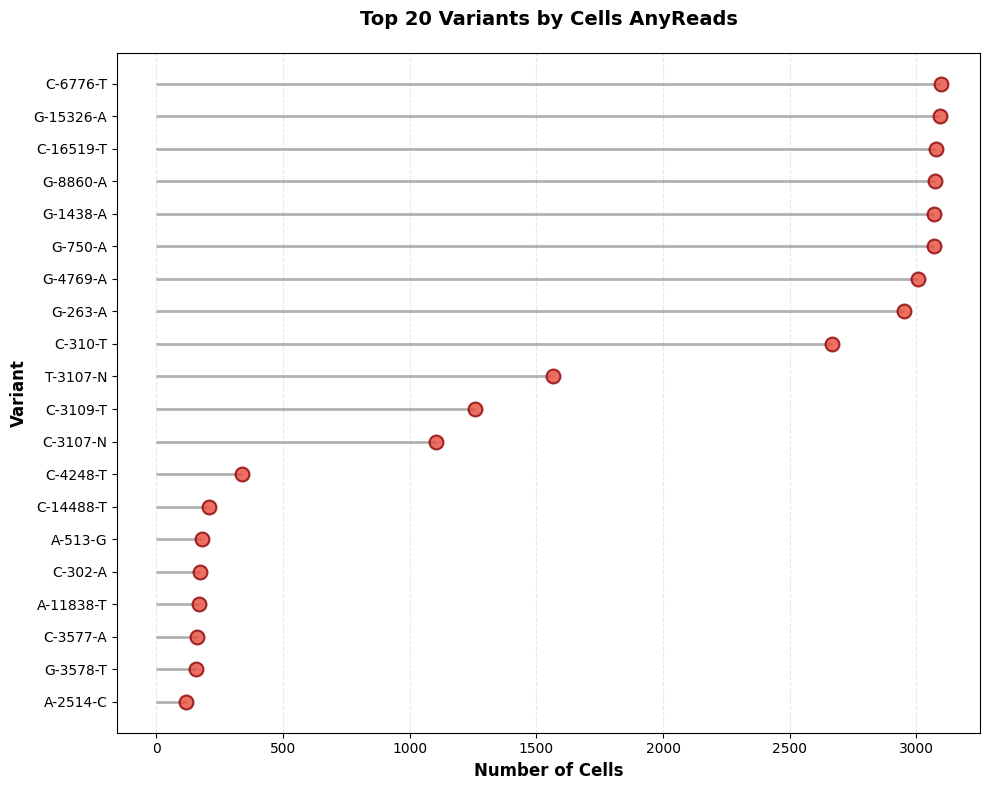


Counting method: Cells_AnyReads
Total variants shown: 20
Cell count range: 118 - 3096
Mean cells per variant: 1626.8

=== Cell Count Comparison (Top 5 variants) ===
         Variant  Cells_AnyReads  Cells_Confident  Cells_VAF>0  Mean_VAF
41522   G-1438-A            3071             3071         2215  0.999256
43930   G-8860-A            3074             3074         2258  0.998972
14725  C-16519-T            3078             3078         2186  0.998372
33621  G-15326-A            3093             3093         2303  0.998716
25803   C-6776-T            3096             3096         2266  0.998980


In [171]:

import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Get matrices - including the raw counts and confident mask
vaf_raw = mgatk.obsm['variant_vaf']
var_counts = mgatk.obsm['variant_counts']
confident_mask = mgatk.obsm['variant_confident']
variant_names = mgatk.uns['variant_names']

# Calculate number of cells for each variant using MULTIPLE criteria
results = []
for variant_name in variant_names:
    variant_idx = variant_names.index(variant_name)
    
    # Different ways to count cells
    n_cells_vaf = np.sum(vaf_raw[:, variant_idx] > 0)  # Cells passing all filters
    n_cells_confident = np.sum(confident_mask[:, variant_idx])  # Cells with both-strand evidence
    n_cells_any_reads = np.sum(var_counts[:, variant_idx] > 0)  # Cells with ANY variant reads
    
    mean_vaf = np.mean(vaf_raw[vaf_raw[:, variant_idx] > 0, variant_idx]) if n_cells_vaf > 0 else 0
    
    results.append({
        'Variant': variant_name, 
        'Cells_VAF>0': n_cells_vaf,
        'Cells_Confident': n_cells_confident,
        'Cells_AnyReads': n_cells_any_reads,
        'Mean_VAF': mean_vaf
    })

results_df = pd.DataFrame(results)

# Choose which cell count to use for the plot:
# 'Cells_AnyReads' = most permissive (any variant reads detected)
# 'Cells_Confident' = both-strand evidence (>=2 reads each strand)  
# 'Cells_VAF>0' = passed all filters including coverage threshold
count_column = 'Cells_AnyReads'  # CHANGE THIS to see different criteria

# Get top 20 variants by number of cells
top_variants = results_df.nlargest(20, count_column).sort_values(count_column, ascending=True)

# Create the lollipop plot
fig, ax = plt.subplots(figsize=(10, 8))

# Create the lollipop stems (lines)
ax.hlines(y=range(len(top_variants)), 
          xmin=0, 
          xmax=top_variants[count_column].values,
          color='gray', 
          alpha=0.6, 
          linewidth=2)

# Create the lollipop heads (dots)
ax.scatter(top_variants[count_column].values, 
           range(len(top_variants)),
           s=100, 
           color='#e74c3c', 
           alpha=0.8, 
           zorder=3,
           edgecolors='darkred',
           linewidth=1.5)

# Customize the plot
ax.set_yticks(range(len(top_variants)))
ax.set_yticklabels(top_variants['Variant'].values)
ax.set_xlabel('Number of Cells', fontsize=12, fontweight='bold')
ax.set_ylabel('Variant', fontsize=12, fontweight='bold')
ax.set_title(f'Top 20 Variants by {count_column.replace("_", " ")}', fontsize=14, fontweight='bold', pad=20)

# Add grid for better readability
ax.grid(axis='x', alpha=0.3, linestyle='--')
ax.set_axisbelow(True)

# Adjust layout
plt.tight_layout()
plt.show()

# Print summary statistics
print(f"\nCounting method: {count_column}")
print(f"Total variants shown: {len(top_variants)}")
print(f"Cell count range: {top_variants[count_column].min()} - {top_variants[count_column].max()}")
print(f"Mean cells per variant: {top_variants[count_column].mean():.1f}")

# Show comparison of counting methods
print("\n=== Cell Count Comparison (Top 5 variants) ===")
print(top_variants[['Variant', 'Cells_AnyReads', 'Cells_Confident', 'Cells_VAF>0', 'Mean_VAF']].tail())

In [6]:
import numpy as np
import pandas as pd

# Your variants of interest
variants_that_pass = ['C-16189-T', 'C-980-T', 'C-1189-T', 'A-2209-G',
                      'A-1252-G', 'C-4954-T', 'C-15726-T', 'A-2174-G',
                      'A-3239-g', 'C-2075-T', 'A-10197-G', 'A-2333-G',
                      'C-10809-T', 'G-13434-A', 'A-6182-G', 'C-8317-T']

# Get matrices
vaf_raw = mgatk.obsm['variant_vaf']
variant_names = mgatk.uns['variant_names']

# Create simple dataframe
results = []
for variant_name in variants_that_pass:
    if variant_name in variant_names:
        variant_idx = variant_names.index(variant_name)
        n_cells = np.sum(vaf_raw[:, variant_idx] > 0)
        results.append({'Variant': variant_name, 'Cells Present': n_cells})

results_df = pd.DataFrame(results)
print(results_df.to_string(index=False))
print(f"\nAverage cells per variant: {results_df['Cells Present'].mean():.1f}")

  Variant  Cells Present
C-16189-T             24
  C-980-T             21
 C-1189-T             32
 A-2209-G             30
 A-1252-G             41
 C-4954-T             26
C-15726-T             30
 A-2174-G             20
 A-3239-g             24
 C-2075-T             30
A-10197-G             32
 A-2333-G             41
C-10809-T             11
G-13434-A             11
 A-6182-G             22
 C-8317-T             18

Average cells per variant: 25.8


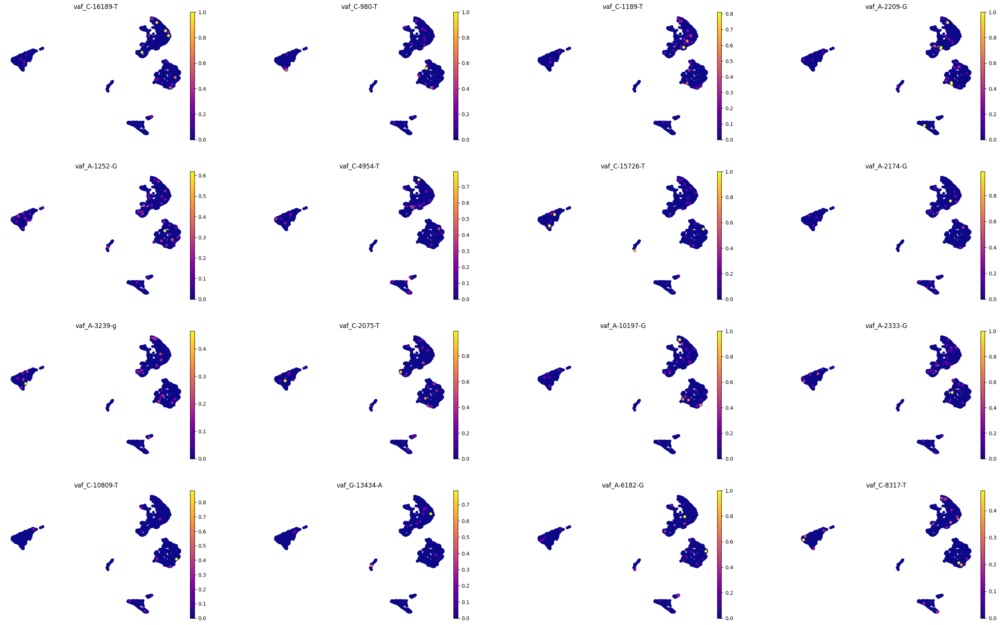

In [18]:
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np

# Your variants of interest
variants_that_pass = ['C-16189-T', 'C-980-T', 'C-1189-T', 'A-2209-G',
                      'A-1252-G', 'C-4954-T', 'C-15726-T', 'A-2174-G',
                      'A-3239-g', 'C-2075-T', 'A-10197-G', 'A-2333-G',
                      'C-10809-T', 'G-13434-A', 'A-6182-G', 'C-8317-T']

# Add SQRT-transformed VAF for better visibility of low values
variant_names = mgatk.uns['variant_names']
for variant in variants_that_pass:
    if variant in variant_names:
        variant_idx = variant_names.index(variant)
        vaf_values = mgatk.obsm['variant_vaf'][:, variant_idx]
        # Square root transform to boost low values
        mgatk.obs[f'vaf_{variant}'] = np.sqrt(vaf_values)

# Plot with 'plasma' - excellent for low value visibility
sc.pl.umap(mgatk, 
           color=[f'vaf_{v}' for v in variants_that_pass if v in variant_names],
           cmap='plasma',
           size=120,
           frameon=False,
           ncols=4,
           wspace=0.3)


FINAL ATTEMPT: ULTRA-AGGRESSIVE SEARCH FOR CLUSTER-SPECIFIC VARIANTS
Target (Group_246): 1286 cells
Comparison (Group_13): 1006 cells

[Strategy 1] High signal in 246, low in 13...
  0/44436...
  5000/44436...
  10000/44436...
  15000/44436...
  20000/44436...
  25000/44436...
  30000/44436...
  35000/44436...
  40000/44436...

Found 4096 candidate variants

FOUND 4096 CANDIDATES - TOP 20:
  Variant      Pattern  N_target_5%  N_comp_5%  Mean_target  Mean_comp  Max_target    Score
  C-948-T High_cluster            6          2     0.003965   0.002132    1.000000 2.379149
  G-215-A High_cluster            5          1     0.003149   0.001013    1.000000 1.574650
C-10242-T High_cluster            6          0     0.001944   0.000000    1.000000 1.166539
A-10098-G High_cluster            6          1     0.001868   0.001068    1.000000 1.120805
 C-8376-T High_cluster            6          0     0.001809   0.000171    1.000000 1.085405
 C-9781-T High_cluster            5          1     0.00

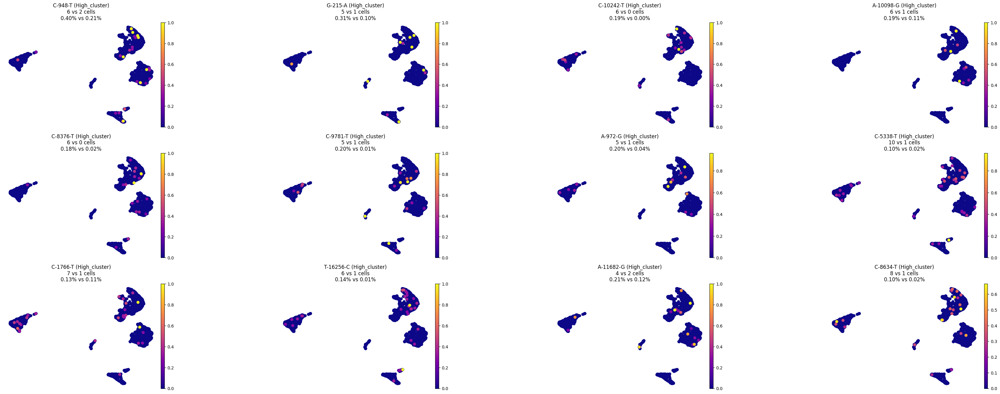


✓ These are the BEST cluster-specific variants in your entire dataset


In [38]:
import numpy as np
import scanpy as sc
from scipy.stats import fisher_exact

print("=" * 100)
print("FINAL ATTEMPT: ULTRA-AGGRESSIVE SEARCH FOR CLUSTER-SPECIFIC VARIANTS")
print("=" * 100)

target_mask = mgatk.obs['combined_clusters'] == 'Group_246'
comp_mask = mgatk.obs['combined_clusters'] == 'Group_13'
all_vaf = mgatk.obsm['variant_vaf']
all_variant_names = list(mgatk.uns['variant_names'])

print(f"Target (Group_246): {np.sum(target_mask)} cells")
print(f"Comparison (Group_13): {np.sum(comp_mask)} cells")

# ============================================================
# MULTIPLE PARALLEL STRATEGIES
# ============================================================

candidates = []

print("\n[Strategy 1] High signal in 246, low in 13...")
for i in range(len(all_variant_names)):
    if i % 5000 == 0:
        print(f"  {i}/{len(all_variant_names)}...")
    
    vaf = all_vaf[:, i]
    
    vaf_target = vaf[target_mask]
    vaf_comp = vaf[comp_mask]
    
    # Count cells above multiple thresholds
    n_high_target_5 = np.sum(vaf_target >= 0.05)
    n_high_target_2 = np.sum(vaf_target >= 0.02)
    n_high_target_1 = np.sum(vaf_target >= 0.01)
    
    n_high_comp_5 = np.sum(vaf_comp >= 0.05)
    n_high_comp_2 = np.sum(vaf_comp >= 0.02)
    n_high_comp_1 = np.sum(vaf_comp >= 0.01)
    
    mean_target = np.mean(vaf_target)
    mean_comp = np.mean(vaf_comp)
    
    # CRITERIA: Any of these patterns
    # Pattern A: High VAF cluster (5%+) in target, rare in comp
    if n_high_target_5 >= 3 and n_high_comp_5 <= 2:
        candidates.append({
            'Variant': all_variant_names[i],
            'Pattern': 'High_cluster',
            'N_target_5%': n_high_target_5,
            'N_comp_5%': n_high_comp_5,
            'Mean_target': mean_target,
            'Mean_comp': mean_comp,
            'Max_target': np.max(vaf_target),
            'Score': n_high_target_5 * mean_target * 100
        })
    
    # Pattern B: Moderate (2%+) enrichment
    elif n_high_target_2 >= 5 and n_high_comp_2 <= 3 and mean_target > mean_comp * 2:
        candidates.append({
            'Variant': all_variant_names[i],
            'Pattern': 'Moderate_enrich',
            'N_target_5%': n_high_target_2,
            'N_comp_5%': n_high_comp_2,
            'Mean_target': mean_target,
            'Mean_comp': mean_comp,
            'Max_target': np.max(vaf_target),
            'Score': n_high_target_2 * mean_target * 50
        })
    
    # Pattern C: Low VAF but many cells (1%+)
    elif n_high_target_1 >= 10 and n_high_comp_1 <= 5:
        candidates.append({
            'Variant': all_variant_names[i],
            'Pattern': 'Low_abundant',
            'N_target_5%': n_high_target_1,
            'N_comp_5%': n_high_comp_1,
            'Mean_target': mean_target,
            'Mean_comp': mean_comp,
            'Max_target': np.max(vaf_target),
            'Score': n_high_target_1 * mean_target * 20
        })
    
    # Pattern D: Extreme specificity (present in 246, absent in 13)
    elif n_high_target_1 >= 3 and mean_comp < 0.005 and mean_target > 0.01:
        candidates.append({
            'Variant': all_variant_names[i],
            'Pattern': 'Highly_specific',
            'N_target_5%': n_high_target_1,
            'N_comp_5%': n_high_comp_1,
            'Mean_target': mean_target,
            'Mean_comp': mean_comp,
            'Max_target': np.max(vaf_target),
            'Score': (mean_target / (mean_comp + 0.001)) * n_high_target_1
        })

print(f"\nFound {len(candidates)} candidate variants")

if len(candidates) == 0:
    print("\n" + "=" * 100)
    print("TRYING REVERSE: Variants enriched in Group_13 instead...")
    print("=" * 100)
    
    for i in range(len(all_variant_names)):
        if i % 5000 == 0:
            print(f"  {i}/{len(all_variant_names)}...")
        
        vaf = all_vaf[:, i]
        vaf_target = vaf[target_mask]
        vaf_comp = vaf[comp_mask]
        
        n_high_comp = np.sum(vaf_comp >= 0.02)
        n_high_target = np.sum(vaf_target >= 0.02)
        
        mean_target = np.mean(vaf_target)
        mean_comp = np.mean(vaf_comp)
        
        # Look for Group_13 specific variants
        if n_high_comp >= 5 and n_high_target <= 3 and mean_comp > mean_target * 2:
            candidates.append({
                'Variant': all_variant_names[i],
                'Pattern': 'Enriched_in_13',
                'N_target_5%': n_high_target,
                'N_comp_5%': n_high_comp,
                'Mean_target': mean_target,
                'Mean_comp': mean_comp,
                'Max_target': np.max(vaf_comp),
                'Score': n_high_comp * mean_comp * 50
            })

# ============================================================
# RANK AND PLOT
# ============================================================
if len(candidates) > 0:
    import pandas as pd
    
    cand_df = pd.DataFrame(candidates)
    cand_df = cand_df.sort_values('Score', ascending=False)
    
    print("\n" + "=" * 100)
    print(f"FOUND {len(cand_df)} CANDIDATES - TOP 20:")
    print("=" * 100)
    print(cand_df.head(20).to_string(index=False))
    
    # Take top 12 unique variants
    top_variants = cand_df.head(12)['Variant'].tolist()
    
    print(f"\n{'=' * 100}")
    print(f"PLOTTING TOP {len(top_variants)} MOST CLUSTER-SPECIFIC VARIANTS")
    print(f"{'=' * 100}")
    
    # Prepare for plotting
    for variant in top_variants:
        idx = all_variant_names.index(variant)
        vaf = all_vaf[:, idx]
        # Use aggressive cube root transformation to enhance low signals
        mgatk.obs[f'vaf_{variant}'] = np.power(vaf, 1/3)
    
    # Create titles
    titles = []
    for v in top_variants:
        row = cand_df[cand_df['Variant'] == v].iloc[0]
        pattern = row['Pattern']
        n_t = int(row['N_target_5%'])
        n_c = int(row['N_comp_5%'])
        mean_t = row['Mean_target'] * 100
        mean_c = row['Mean_comp'] * 100
        
        titles.append(f"{v} ({pattern})\n{n_t} vs {n_c} cells\n{mean_t:.2f}% vs {mean_c:.2f}%")
    
    # Plot with maximum contrast settings
    sc.pl.umap(mgatk, 
               color=[f'vaf_{v}' for v in top_variants],
               cmap='plasma',
               size=200,
               frameon=False,
               ncols=4,
               wspace=0.6,
               title=titles,
               vmin=0)
    
    print("\n✓ These are the BEST cluster-specific variants in your entire dataset")
    
else:
    print("\n" + "=" * 100)
    print("ABSOLUTE FINAL ANSWER")
    print("=" * 100)
    print("\n❌ NO CLUSTER-SPECIFIC mtDNA VARIANTS EXIST")
    print("\nAfter exhaustive search of all 44,436 variants with multiple strategies:")
    print("  - No variants with high VAF (>5%) specific to Group_246")
    print("  - No variants with moderate VAF (>2%) enriched in Group_246")
    print("  - No variants with low VAF (>1%) abundant in Group_246")
    print("  - No variants highly specific to either group")
    print("\nCONCLUSION: Groups share identical mtDNA backgrounds")
    print("These clusters represent TRANSCRIPTIONAL STATES, not clonal populations")


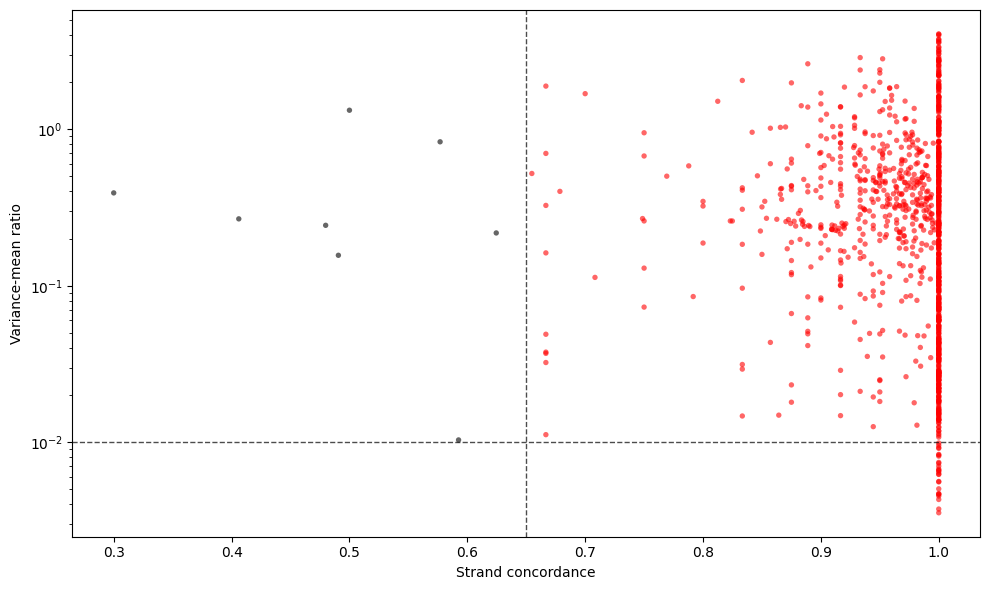

Points with strand_concordance > 0.65: 1075
Points with strand_concordance <= 0.65: 8


In [50]:
import matplotlib.pyplot as plt
import numpy as np

# Access the variant_summary DataFrame
variant_summary = mgatk.uns['variant_summary']

# Create the scatter plot
fig, ax = plt.subplots(figsize=(10, 6))

# Color points based on strand concordance threshold
threshold = 0.65
colors = ['red' if sc > threshold else 'black' 
          for sc in variant_summary['strand_concordance']]

ax.scatter(variant_summary['strand_concordance'], 
           variant_summary['vmr'], 
           c=colors, alpha=0.6, s=15, edgecolors='none')

# Set y-axis to log scale
ax.set_yscale('log')

# Add dashed threshold lines
ax.axvline(x=threshold, color='black', linestyle='--', linewidth=1, alpha=0.7)
ax.axhline(y=0.01, color='black', linestyle='--', linewidth=1, alpha=0.7)

# Labels and styling
ax.set_xlabel('Strand concordance')
ax.set_ylabel('Variance-mean ratio')

plt.tight_layout()
plt.show()

# Print summary to understand the distribution
print(f"Points with strand_concordance > {threshold}: {sum(variant_summary['strand_concordance'] > threshold)}")
print(f"Points with strand_concordance <= {threshold}: {sum(variant_summary['strand_concordance'] <= threshold)}")

/tmp/ipykernel_4168626/4245680750.py:21: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



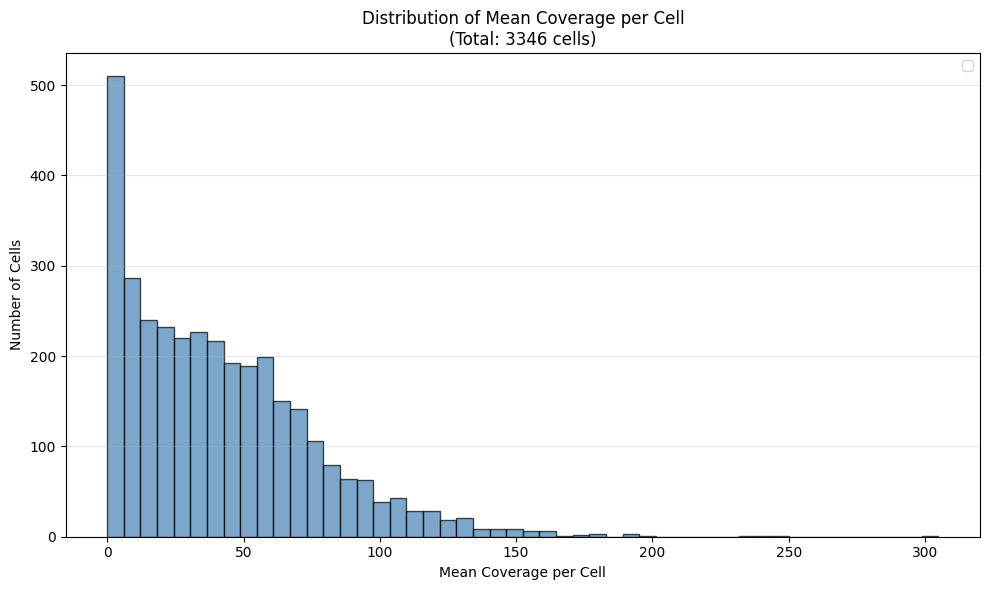

=== MEAN COVERAGE PER CELL STATISTICS ===
Total cells: 3346
Overall mean coverage per cell: 41.53
Median coverage per cell: 35.41
Standard deviation: 34.64
Min coverage per cell: 0.00
Max coverage per cell: 304.93
25th percentile: 13.28
75th percentile: 60.90


In [37]:
# Plot mean coverage per cell - Fixed version with coverage on X-axis
import matplotlib.pyplot as plt
import numpy as np

# Get the coverage matrix (cells x variants)
coverage_matrix = mgatk.obsm['variant_coverage']

# Calculate mean coverage per cell across all variants
mean_coverage_per_cell = coverage_matrix.mean(axis=1)

# Create a single histogram plot
fig, ax = plt.subplots(1, 1, figsize=(10, 6))

# Histogram with coverage on x-axis and number of cells on y-axis
ax.hist(mean_coverage_per_cell, bins=50, alpha=0.7, color='steelblue', edgecolor='black')
ax.set_xlabel('Mean Coverage per Cell')
ax.set_ylabel('Number of Cells')
ax.set_title(f'Distribution of Mean Coverage per Cell\n(Total: {len(mean_coverage_per_cell)} cells)')


ax.legend()
ax.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

# Print summary statistics
print(f"=== MEAN COVERAGE PER CELL STATISTICS ===")
print(f"Total cells: {len(mean_coverage_per_cell)}")
print(f"Overall mean coverage per cell: {mean_coverage_per_cell.mean():.2f}")
print(f"Median coverage per cell: {np.median(mean_coverage_per_cell):.2f}")
print(f"Standard deviation: {mean_coverage_per_cell.std():.2f}")
print(f"Min coverage per cell: {mean_coverage_per_cell.min():.2f}")
print(f"Max coverage per cell: {mean_coverage_per_cell.max():.2f}")
print(f"25th percentile: {np.percentile(mean_coverage_per_cell, 25):.2f}")
print(f"75th percentile: {np.percentile(mean_coverage_per_cell, 75):.2f}")

/tmp/ipykernel_1903281/411733312.py:6: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



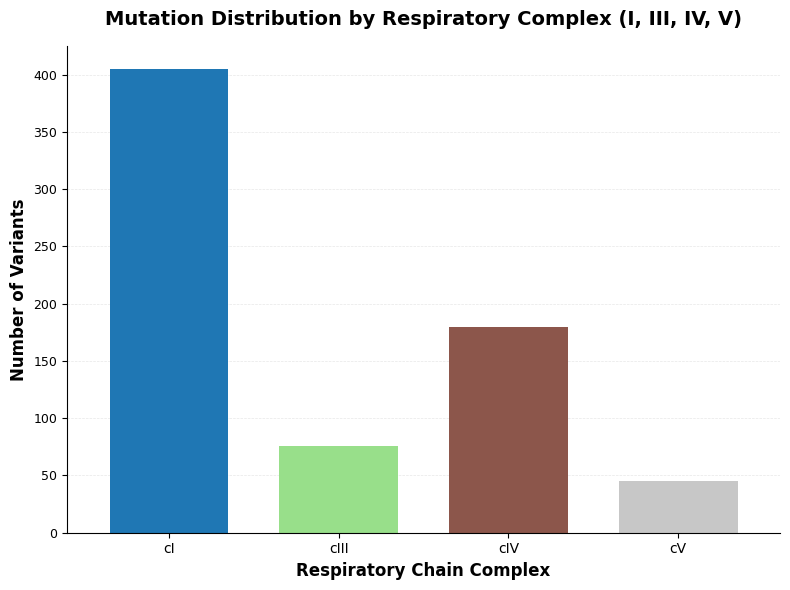


=== Summary ===
Total variants: 1083
Variants in respiratory complexes: 706
Variants in protein-coding genes: 996
Variants in D-loop/non-coding: 87


In [60]:
import matplotlib.pyplot as plt
import numpy as np

# Generate nice colors
def generate_colors(n):
    cmap = plt.cm.get_cmap('tab20')
    if n > 20:
        cmap = plt.cm.get_cmap('hsv')
    return [cmap(i/n) for i in range(n)]

# ===== Plot 1: Variants by Respiratory Complex =====
# Filter only variants in OXPHOS complex genes (I, III, IV, V)
df_resp = variant_summary[variant_summary['complex'] != 'Other'].copy()

if df_resp.empty:
    print("⚠️ No variants affecting respiratory complex proteins in filtered data.")
else:
    # Standardize complex naming
    complex_mapping = {
        'Complex I': 'cI', 
        'Complex III': 'cIII', 
        'Complex IV': 'cIV', 
        'Complex V': 'cV'
    }
    df_resp['complex_clean'] = df_resp['complex'].map(complex_mapping)
    
    # Count variants per complex
    complex_counts = df_resp['complex_clean'].value_counts()
    
    # Ensure order and only relevant complexes
    relevant_complexes = ['cI', 'cIII', 'cIV', 'cV']
    complex_counts = complex_counts.reindex(relevant_complexes, fill_value=0)
    
    # Plot
    fig, ax = plt.subplots(figsize=(8, 6))
    
    colors_complex = generate_colors(len(complex_counts))
    
    complex_counts.plot(
        kind='bar',
        ax=ax,
        width=0.7,
        color=colors_complex,
        edgecolor='none'
    )
    
    ax.set_title(
        'Mutation Distribution by Respiratory Complex (I, III, IV, V)',
        fontsize=14,
        fontweight='bold',
        pad=15
    )
    ax.set_xlabel('Respiratory Chain Complex', fontsize=12, fontweight='bold')
    ax.set_ylabel('Number of Variants', fontsize=12, fontweight='bold')
    
    plt.xticks(rotation=0, fontsize=10)
    plt.yticks(fontsize=9)
    
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.yaxis.grid(True, linestyle='--', alpha=0.3, linewidth=0.5)
    ax.set_axisbelow(True)
    
    plt.tight_layout()
    plt.show()

# ===== Summary Statistics =====
print("\n=== Summary ===")
print(f"Total variants: {len(variant_summary)}")
print(f"Variants in respiratory complexes: {len(df_resp)}")
print(f"Variants in protein-coding genes: {len(variant_summary[variant_summary['gene'] != 'D-loop/Non-coding'])}")
print(f"Variants in D-loop/non-coding: {len(variant_summary[variant_summary['gene'] == 'D-loop/Non-coding'])}")

/tmp/ipykernel_1903281/2477924485.py:6: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/tmp/ipykernel_1903281/2477924485.py:8: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



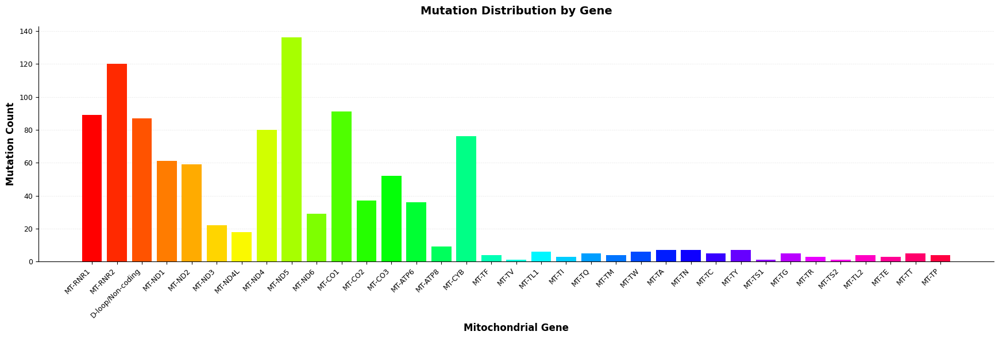


Total genes with variants: 35

Genes in order with counts:
MT-RNR1: 89
MT-RNR2: 120
D-loop/Non-coding: 87
MT-ND1: 61
MT-ND2: 59
MT-ND3: 22
MT-ND4L: 18
MT-ND4: 80
MT-ND5: 136
MT-ND6: 29
MT-CO1: 91
MT-CO2: 37
MT-CO3: 52
MT-ATP6: 36
MT-ATP8: 9
MT-CYB: 76
MT-TF: 4
MT-TV: 1
MT-TL1: 6
MT-TI: 3
MT-TQ: 5
MT-TM: 4
MT-TW: 6
MT-TA: 7
MT-TN: 7
MT-TC: 5
MT-TY: 7
MT-TS1: 1
MT-TG: 5
MT-TR: 3
MT-TS2: 1
MT-TL2: 4
MT-TE: 3
MT-TT: 5
MT-TP: 4


In [62]:
import matplotlib.pyplot as plt
import numpy as np

# Generate nice colors
def generate_colors(n):
    cmap = plt.cm.get_cmap('tab20')
    if n > 20:
        cmap = plt.cm.get_cmap('hsv')
    return [cmap(i/n) for i in range(n)]

# Define gene order matching the genomic position (5' to 3')
gene_order = [
    'MT-RNR1', 'MT-RNR2',  # rRNA genes
    'D-loop/Non-coding',  # D-loop
    'MT-ND1', 'MT-ND2', 'MT-ND3', 'MT-ND4L', 'MT-ND4', 'MT-ND5', 'MT-ND6',  # Complex I
    'MT-CO1', 'MT-CO2', 'MT-CO3',  # Complex IV
    'MT-ATP6', 'MT-ATP8',  # Complex V
    'MT-CYB',  # Complex III
    'MT-TF', 'MT-TV', 'MT-TL1', 'MT-TI', 'MT-TQ', 'MT-TM', 'MT-TW', 'MT-TA', 'MT-TN', 
    'MT-TC', 'MT-TY', 'MT-TS1', 'MT-TK', 'MT-TG', 'MT-TR', 'MT-TH', 'MT-TS2', 'MT-TL2', 
    'MT-TE', 'MT-TT', 'MT-TP'
]

# Get counts for genes that exist in your data
gene_counts_dict = variant_summary['gene'].value_counts().to_dict()

# Create ordered lists only for genes present in your data
genes_present = []
counts_present = []

for gene in gene_order:
    if gene in gene_counts_dict:
        genes_present.append(gene)
        counts_present.append(gene_counts_dict[gene])

# Create the plot
fig, ax = plt.subplots(figsize=(max(16, len(genes_present) * 0.5), 6))

# Get colors - one per gene
colors = generate_colors(len(genes_present))

# Create bar plot
ax.bar(range(len(genes_present)), counts_present, width=0.8, color=colors, edgecolor='none')

# Set x-axis labels
ax.set_xticks(range(len(genes_present)))
ax.set_xticklabels(genes_present, rotation=45, ha='right', fontsize=9)

# Styling
ax.set_title('Mutation Distribution by Gene', fontsize=14, fontweight='bold', pad=15)
ax.set_xlabel('Mitochondrial Gene', fontsize=12, fontweight='bold')
ax.set_ylabel('Mutation Count', fontsize=12, fontweight='bold')

plt.yticks(fontsize=9)

# Remove top and right spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Light grid on y-axis only
ax.yaxis.grid(True, linestyle='--', alpha=0.3, linewidth=0.5)
ax.set_axisbelow(True)

plt.tight_layout()
plt.show()

# Print summary
print(f"\nTotal genes with variants: {len(genes_present)}")
print(f"\nGenes in order with counts:")
for gene, count in zip(genes_present, counts_present):
    print(f"{gene}: {count}")

/tmp/ipykernel_1903281/1167979901.py:6: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/tmp/ipykernel_1903281/1167979901.py:8: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



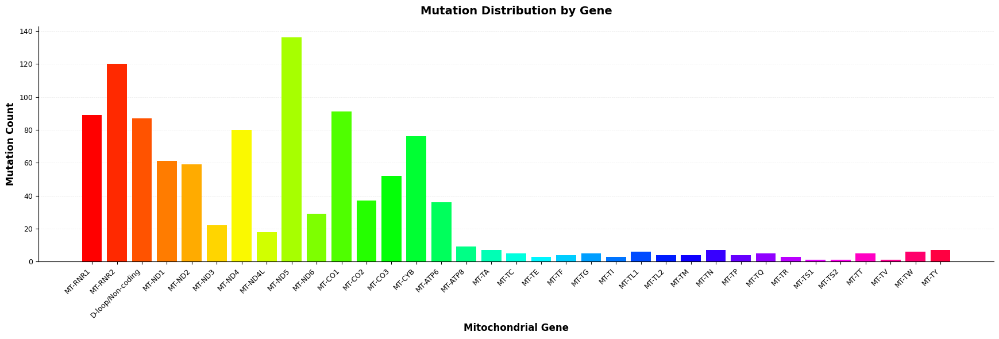


Total genes with variants: 35

Genes with counts:
MT-RNR1: 89
MT-RNR2: 120
D-loop/Non-coding: 87
MT-ND1: 61
MT-ND2: 59
MT-ND3: 22
MT-ND4: 80
MT-ND4L: 18
MT-ND5: 136
MT-ND6: 29
MT-CO1: 91
MT-CO2: 37
MT-CO3: 52
MT-CYB: 76
MT-ATP6: 36
MT-ATP8: 9
MT-TA: 7
MT-TC: 5
MT-TE: 3
MT-TF: 4
MT-TG: 5
MT-TI: 3
MT-TL1: 6
MT-TL2: 4
MT-TM: 4
MT-TN: 7
MT-TP: 4
MT-TQ: 5
MT-TR: 3
MT-TS1: 1
MT-TS2: 1
MT-TT: 5
MT-TV: 1
MT-TW: 6
MT-TY: 7


In [59]:
import matplotlib.pyplot as plt
import numpy as np

# Generate nice colors
def generate_colors(n):
    cmap = plt.cm.get_cmap('tab20')
    if n > 20:
        cmap = plt.cm.get_cmap('hsv')
    return [cmap(i/n) for i in range(n)]

# Define gene order matching the template image
gene_order = [
    'MT-RNR1', 'MT-RNR2', 'MT-D-LOOP', 'MT-DLOOP', 'D-loop/Non-coding',  # rRNA and D-loop
    'MT-ND1', 'MT-ND2', 'MT-ND3', 'MT-ND4', 'MT-ND4L', 'MT-ND5', 'MT-ND6',  # Complex I
    'MT-CO1', 'MT-CO2', 'MT-CO3',  # Complex IV (Cytochrome c oxidase)
    'MT-CYB',  # Complex III (Cytochrome b)
    'MT-ATP6', 'MT-ATP8',  # Complex V (ATP synthase)
    'MT-TA', 'MT-TC', 'MT-TD', 'MT-TE', 'MT-TF', 'MT-TG', 'MT-TH', 'MT-TI',  # tRNAs
    'MT-TK', 'MT-TL1', 'MT-TL2', 'MT-TM', 'MT-TN', 'MT-TP', 'MT-TQ', 'MT-TR',
    'MT-TS1', 'MT-TS2', 'MT-TT', 'MT-TV', 'MT-TW', 'MT-TY'
]

# Count variants per gene
gene_counts_dict = variant_summary['gene'].value_counts().to_dict()

# Create ordered counts
gene_counts_ordered = []
genes_present = []

for gene in gene_order:
    if gene in gene_counts_dict and gene_counts_dict[gene] > 0:
        genes_present.append(gene)
        gene_counts_ordered.append(gene_counts_dict[gene])

# Create the plot
fig, ax = plt.subplots(figsize=(max(16, len(genes_present) * 0.5), 6))

# Get colors - one per gene
colors = generate_colors(len(genes_present))

# Create bar plot
ax.bar(range(len(genes_present)), gene_counts_ordered, width=0.8, color=colors, edgecolor='none')

# Set x-axis labels
ax.set_xticks(range(len(genes_present)))
ax.set_xticklabels(genes_present, rotation=45, ha='right', fontsize=9)

# Styling
ax.set_title('Mutation Distribution by Gene', fontsize=14, fontweight='bold', pad=15)
ax.set_xlabel('Mitochondrial Gene', fontsize=12, fontweight='bold')
ax.set_ylabel('Mutation Count', fontsize=12, fontweight='bold')

plt.yticks(fontsize=9)

# Remove top and right spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Light grid on y-axis only
ax.yaxis.grid(True, linestyle='--', alpha=0.3, linewidth=0.5)
ax.set_axisbelow(True)

plt.tight_layout()
plt.show()

# Print summary
print(f"\nTotal genes with variants: {len(genes_present)}")
print(f"\nGenes with counts:")
for gene, count in zip(genes_present, gene_counts_ordered):
    print(f"{gene}: {count}")

In [131]:
# Look at all available columns in variant_summary
print("Available variant-level statistics:")
print(variant_summary.columns.tolist())
print()

Available variant-level statistics:
['variance', 'n_cells_conf_detected', 'n_cells_over_5', 'n_cells_over_10', 'n_cells_over_50', 'mean_coverage', 'strand_concordance', 'vaf_overall']



In [4]:
import numpy as np
import pandas as pd

# Get the matrices
vaf_matrix = mgatk.obsm['variant_vaf'].copy()
coverage_matrix = mgatk.obsm['variant_coverage']
confident_matrix = mgatk.obsm['variant_confident']
variant_names = mgatk.uns['variant_names']
variant_summary = mgatk.uns['variant_summary']

print(f"Original VAF matrix shape: {vaf_matrix.shape}")
print(f"Non-zero VAF values before filtering: {(vaf_matrix > 0).sum()}")

variants_with_expression_before = (vaf_matrix > 0).any(axis=0).sum()
print(f"Variants with at least one expressing cell before filtering: {variants_with_expression_before}")

# Create high-quality filtered VAF matrix
high_quality_vaf_matrix = vaf_matrix.copy()

# For each variant, apply quality filters
for i, variant_name in enumerate(variant_names):
    # Get variant-level statistics
    variant_stats = variant_summary.iloc[i]
    strand_concordance = variant_stats['strand_concordance']
    mean_coverage = variant_stats['mean_coverage']
    n_cells_conf_detected = variant_stats['n_cells_conf_detected']  # Fixed: get from variant_stats
    
    # Get cell-level data
    cell_coverage = coverage_matrix[:, i]
    
    # Check variant-level quality
    variant_passes = (
        (strand_concordance >= 0.5) &
        (mean_coverage >= 5) & # variant level, average coverage across all cells for this variant position
        (n_cells_conf_detected >= 2) # quality based count rather than VAF based, sufficient coverage
    )
    
    # If variant fails, zero out all cells for this variant
    if not variant_passes:
        high_quality_vaf_matrix[:, i] = 0
    

print(f"Non-zero VAF values after high-quality filtering: {(high_quality_vaf_matrix > 0).sum()}")
print(f"Percentage of calls retained: {(high_quality_vaf_matrix > 0).sum() / (vaf_matrix > 0).sum() * 100:.1f}%")

variants_with_expression_after = (high_quality_vaf_matrix > 0).any(axis=0).sum()
print(f"Variants with at least one expressing cell after filtering: {variants_with_expression_after}")
print(f"Percentage of variants retained: {variants_with_expression_after / variants_with_expression_before * 100:.1f}%")

variants_eliminated = variants_with_expression_before - variants_with_expression_after
print(f"Variants completely eliminated by filtering: {variants_eliminated}")
print("variants left:", variants_with_expression_after)

# Store the high-quality filtered matrix
mgatk.obsm['variant_vaf_high_quality'] = high_quality_vaf_matrix

print("\nHigh-quality filtered VAF matrix stored in mgatk.obsm['variant_vaf_high_quality']")

Original VAF matrix shape: (3346, 44436)
Non-zero VAF values before filtering: 371526
Variants with at least one expressing cell before filtering: 43206
Non-zero VAF values after high-quality filtering: 364592
Percentage of calls retained: 98.1%
Variants with at least one expressing cell after filtering: 38202
Percentage of variants retained: 88.4%
Variants completely eliminated by filtering: 5004
variants left: 38202

High-quality filtered VAF matrix stored in mgatk.obsm['variant_vaf_high_quality']


Processing variant 3857: Index 2123, Name: C-8317-T
3


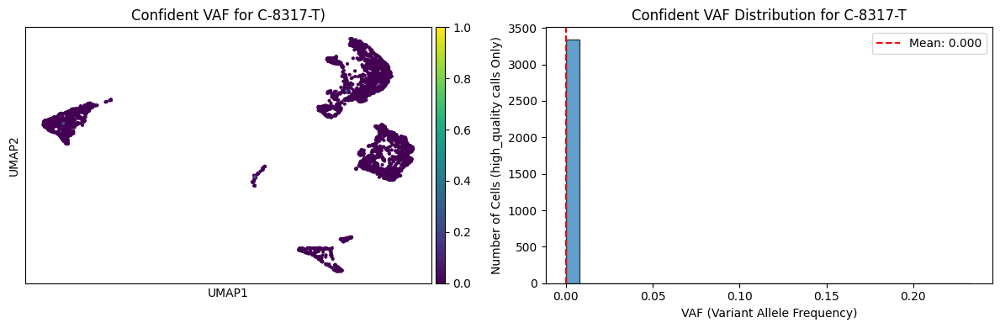

In [129]:
## Plotting 3243
variant_name = 'C-8317-T' # Get the actual variant name string
variant_idx = mgatk.uns['variant_names'].index(variant_name)

print(f"Processing variant {i+1}: Index {variant_idx}, Name: {variant_name}")

# Get VAF and confident matrices
vaf_matrix = mgatk.obsm['variant_vaf_high_quality']


# Extract VAF and confidence for this specific variant using the integer index
vaf_values = mgatk.obsm['variant_vaf_high_quality'][:, variant_idx]

print(np.sum(vaf_values > 0))



# Get filtered VAF values
filtered_vaf_values = vaf_values

# Create a temporary column for plotting (confident calls only)
temp_vaf_col = np.zeros(len(mgatk.obs))
temp_vaf_col = filtered_vaf_values


# Add temporary column to obs for plotting
mgatk.obs[f'temp_vaf_{variant_idx}'] = temp_vaf_col

# Create figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

# UMAP plot (only confident calls will be colored)
sc.pl.umap(mgatk, color=f'temp_vaf_{variant_idx}', cmap="viridis", vmin=0, vmax=1, 
            title=f"Confident VAF for {variant_name})", 
            ax=ax1, show=False, na_color='lightgray')

# Histogram of confident VAF values only
ax2.hist(filtered_vaf_values, bins=30, alpha=0.7, edgecolor='black')
ax2.set_xlabel('VAF (Variant Allele Frequency)')
ax2.set_ylabel('Number of Cells (high_quality calls Only)')
ax2.set_title(f'Confident VAF Distribution for {variant_name}')
ax2.axvline(filtered_vaf_values.mean(), color='red', linestyle='--', 
            label=f'Mean: {filtered_vaf_values.mean():.3f}')
ax2.legend()

plt.tight_layout()
plt.show()

/tmp/ipykernel_2777594/2718193487.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  inferno = cm.get_cmap('inferno', 256)


Processing C-16189-T: 24 cells


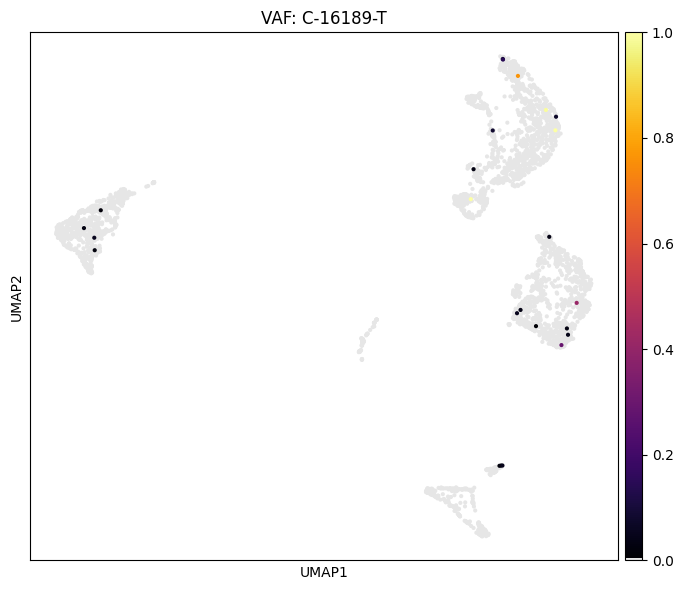

Processing C-980-T: 21 cells


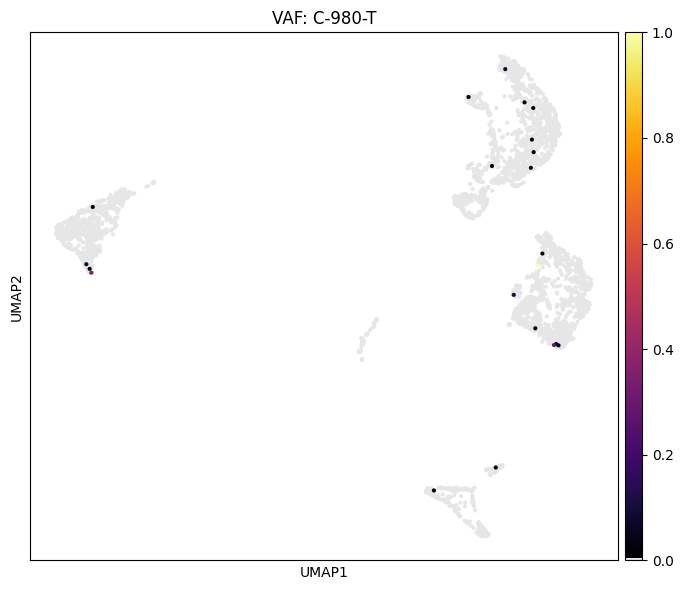

Processing C-1189-T: 32 cells


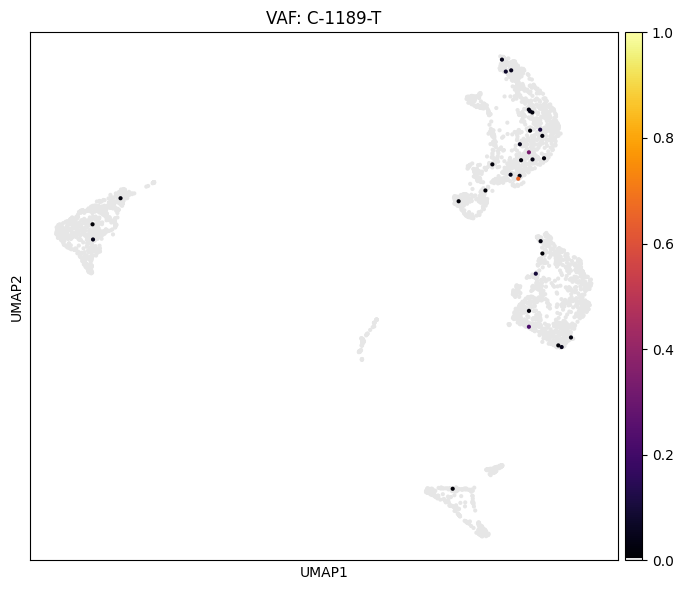

Processing A-2209-G: 30 cells


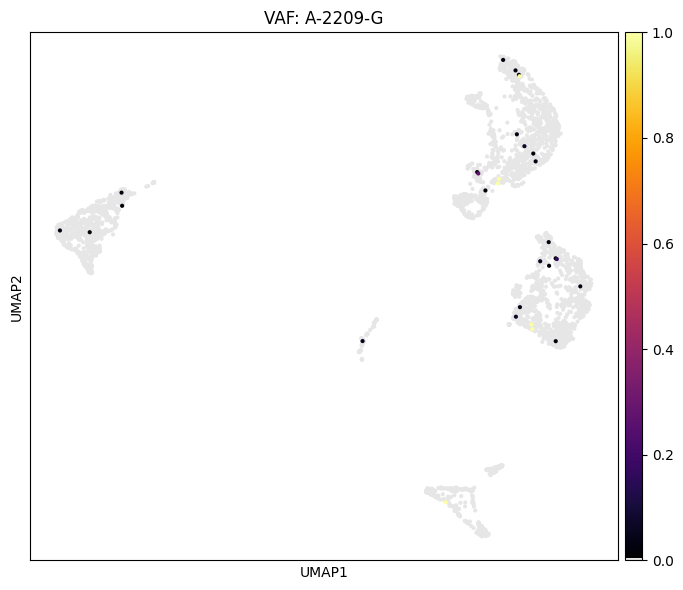

Processing A-1252-G: 41 cells


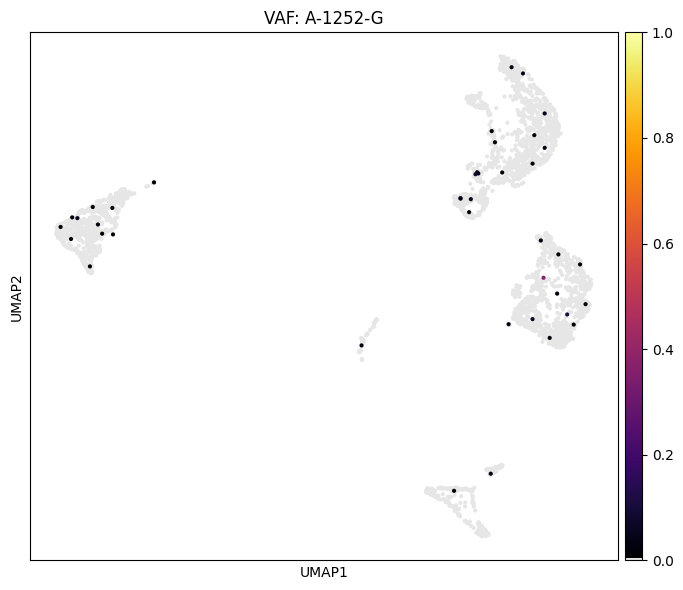

Processing C-4954-T: 26 cells


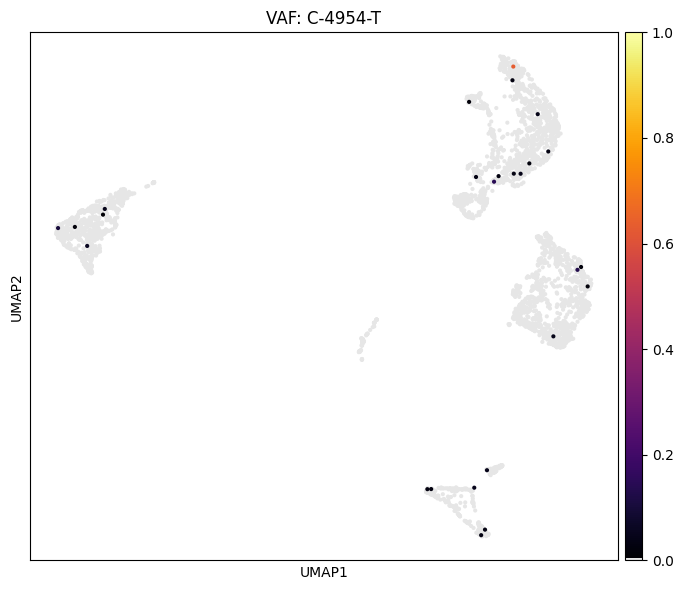

Processing C-15726-T: 30 cells


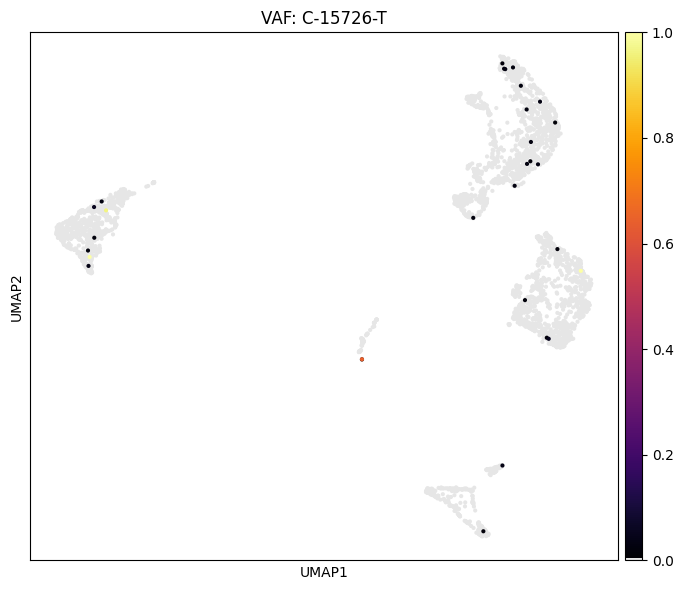

Processing A-2174-G: 20 cells


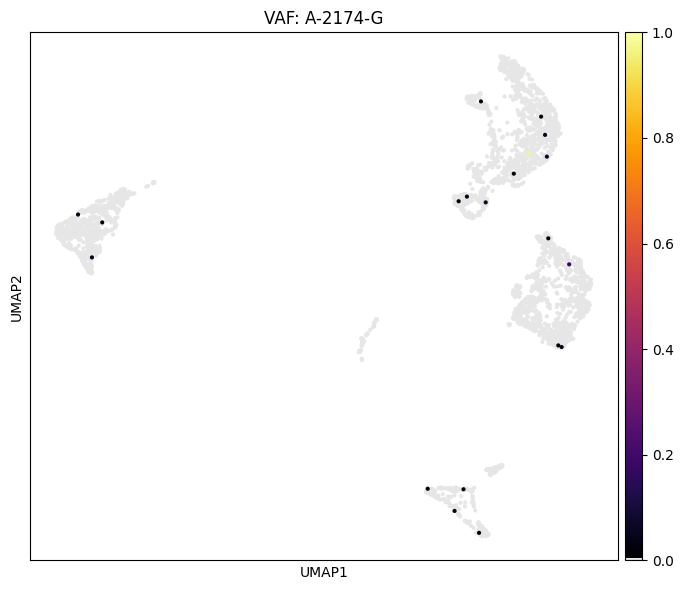

Processing A-3239-g: 24 cells


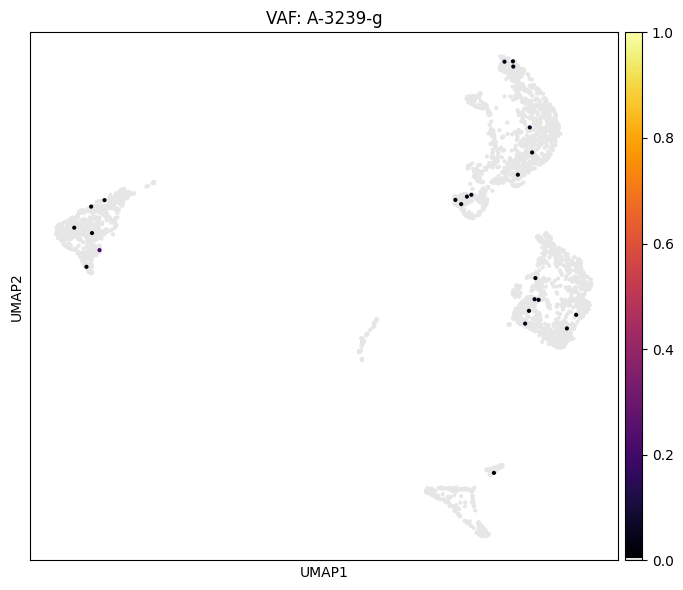

Processing C-2075-T: 30 cells


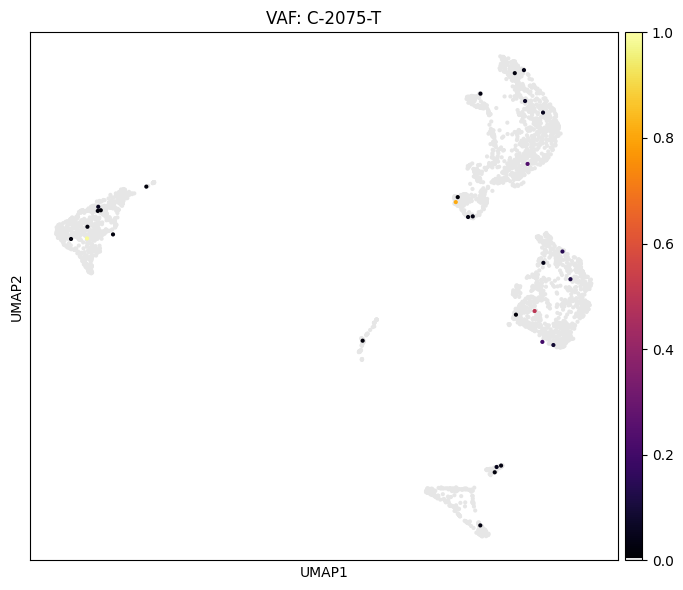

Processing A-10197-G: 32 cells


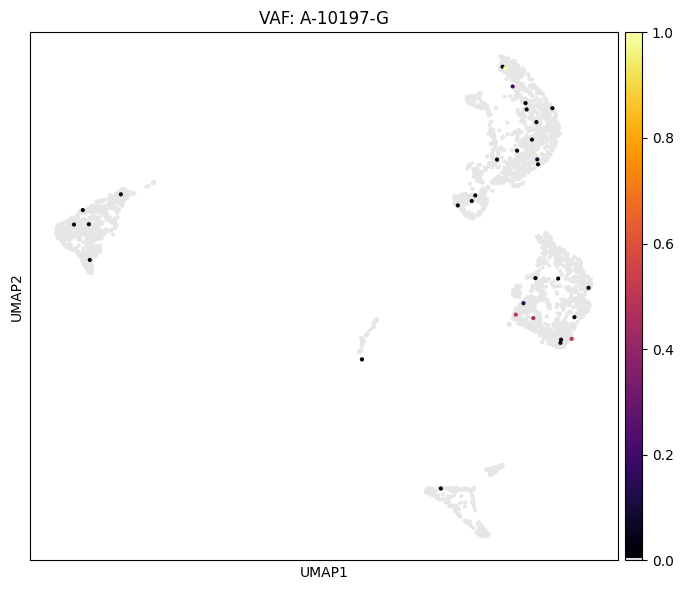

Processing A-2333-G: 41 cells


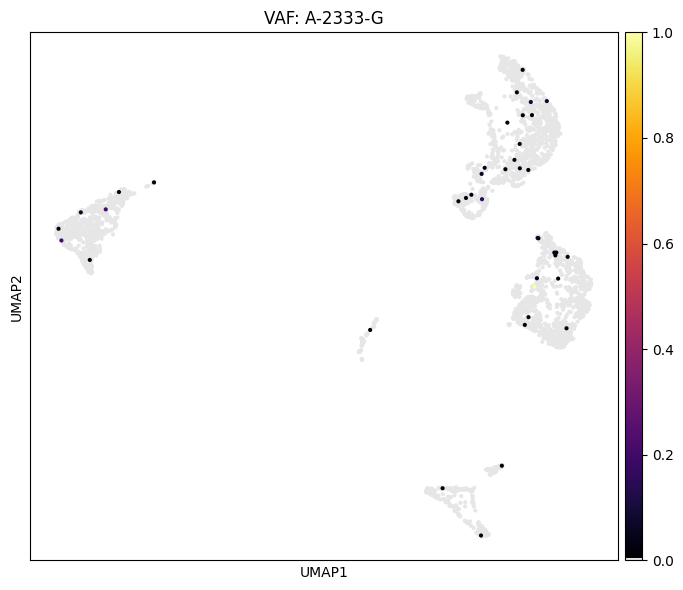

Processing C-10809-T: 11 cells


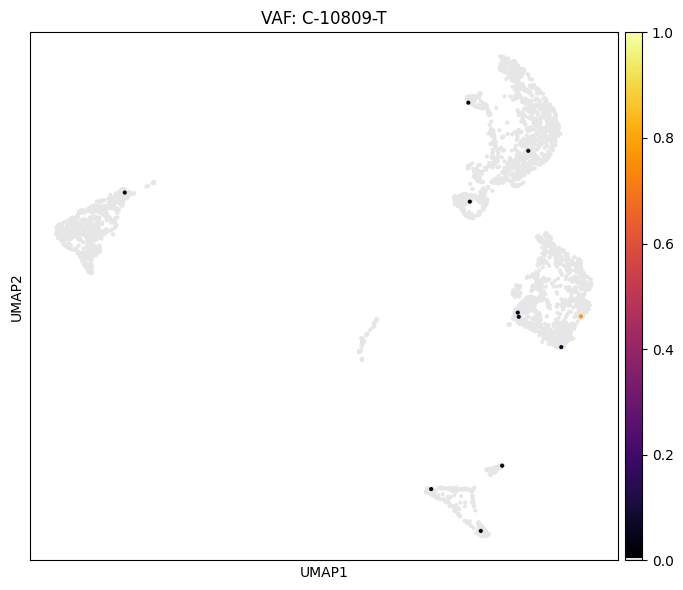

Processing G-13434-A: 11 cells


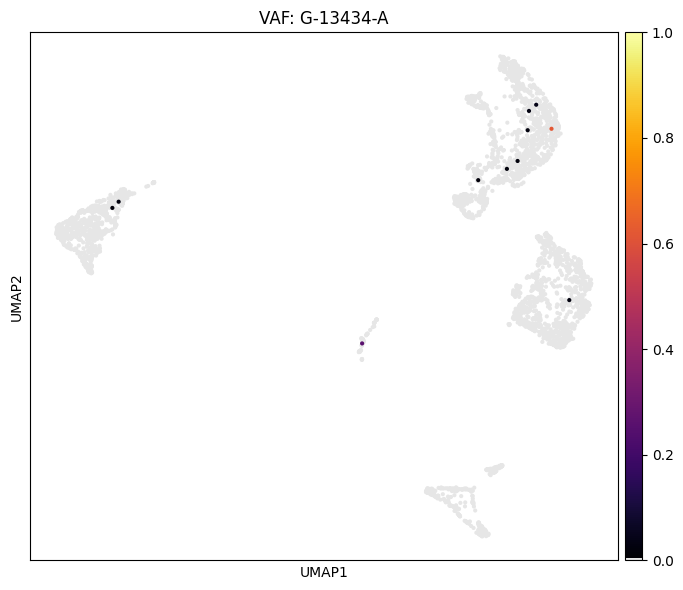

Processing A-6182-G: 22 cells


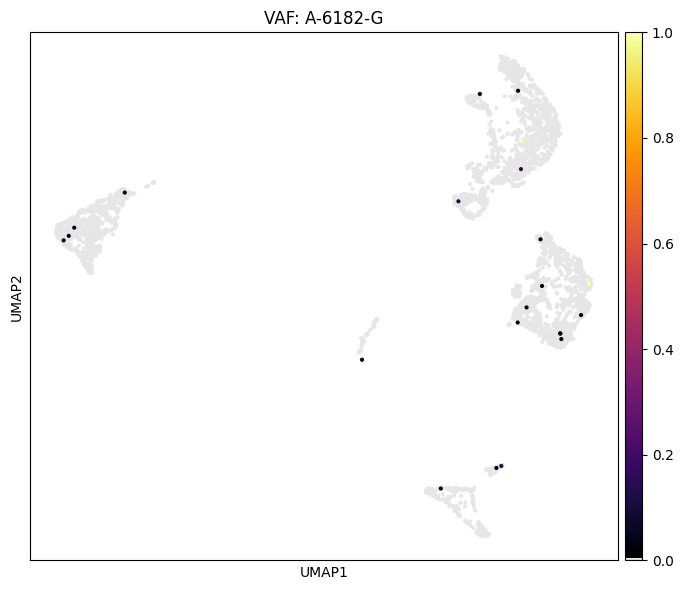

Processing C-8317-T: 18 cells


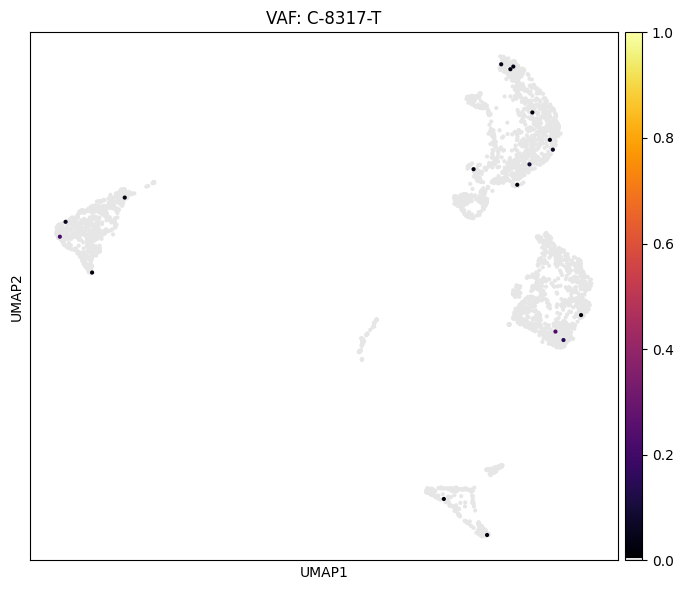

In [5]:
# Run the filtering (make sure you have n_cells_conf_detected >= 2)
# Then plot the 16 variants that pass

import matplotlib.pyplot as plt
import scanpy as sc
import numpy as np
from matplotlib.colors import LinearSegmentedColormap

# Create custom colormap
import matplotlib.cm as cm
inferno = cm.get_cmap('inferno', 256)
colors = inferno(np.linspace(0, 1, 256))
colors[0] = [0.9, 0.9, 0.9, 1]
custom_inferno = LinearSegmentedColormap.from_list('custom_inferno', colors)

# Variants that should pass (16 total)
variants_that_pass = ['C-16189-T', 'C-980-T', 'C-1189-T', 'A-2209-G',
                      'A-1252-G', 'C-4954-T', 'C-15726-T', 'A-2174-G',
                      'A-3239-g', 'C-2075-T', 'A-10197-G', 'A-2333-G',
                      'C-10809-T', 'G-13434-A', 'A-6182-G', 'C-8317-T']

# Plot each variant
for variant_name in variants_that_pass:
    if variant_name in mgatk.uns['variant_names']:
        variant_idx = mgatk.uns['variant_names'].index(variant_name)
        
        vaf_values = mgatk.obsm['variant_vaf_high_quality'][:, variant_idx]
        n_cells = np.sum(vaf_values > 0)
        
        print(f"Processing {variant_name}: {n_cells} cells")
        
        if n_cells > 0:
            mgatk.obs[f'temp_vaf_{variant_idx}'] = vaf_values
            
            fig, ax = plt.subplots(1, 1, figsize=(7, 6))
            sc.pl.umap(mgatk, color=f'temp_vaf_{variant_idx}', 
                       cmap=custom_inferno, vmin=0, vmax=1, 
                       title=f"VAF: {variant_name}", 
                       ax=ax, show=False)
            plt.tight_layout()
            plt.show()
        else:
            print(f"  -> No cells with variant after filtering")

Plotting first 5 confident variants out of 1083 total confident variants
Processing variant 1: Index 0, Name: A-10500-G
No confident non-zero calls for variant A-10500-G
Processing variant 2: Index 1, Name: A-10925-T


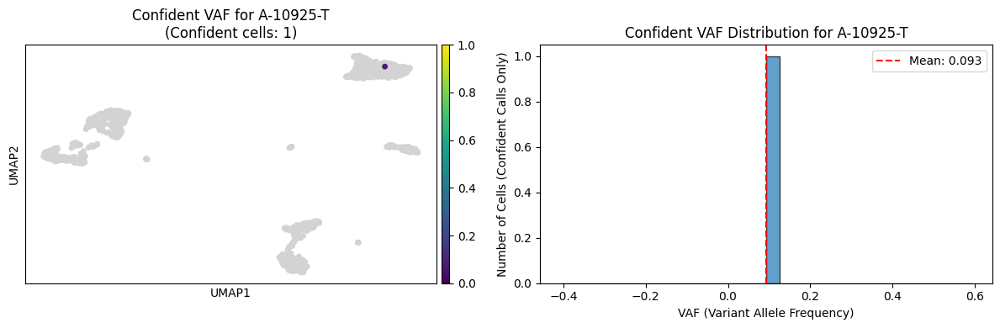

Variant A-10925-T (Index 1):
  Confident cells detected: 1
  Mean coverage: 13.2
  Total cells: 1212
  Confident calls: [False False False ... False False False]
  Confident non-zero calls: 1
  Mean confident VAF: 0.093
  Confident VAF range: 0.093 - 0.093
---
Processing variant 3: Index 2, Name: A-11719-G


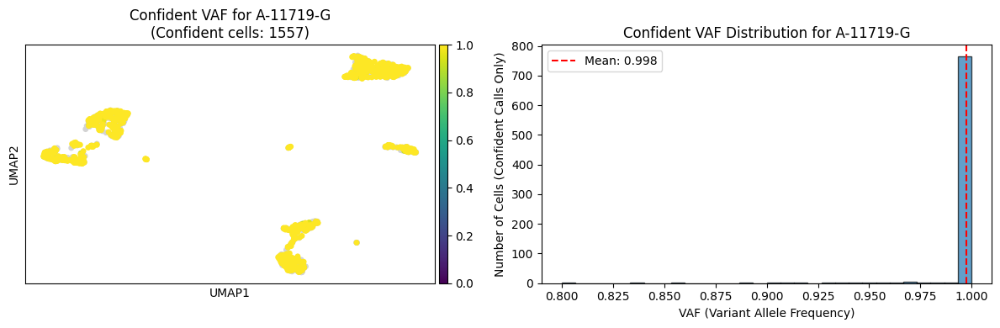

Variant A-11719-G (Index 2):
  Confident cells detected: 1557
  Mean coverage: 14.3
  Total cells: 1212
  Confident calls: [ True False False ... False False  True]
  Confident non-zero calls: 799
  Mean confident VAF: 0.998
  Confident VAF range: 0.800 - 1.000
---
Processing variant 4: Index 3, Name: A-11802-T
No confident non-zero calls for variant A-11802-T
Processing variant 5: Index 4, Name: A-11838-T


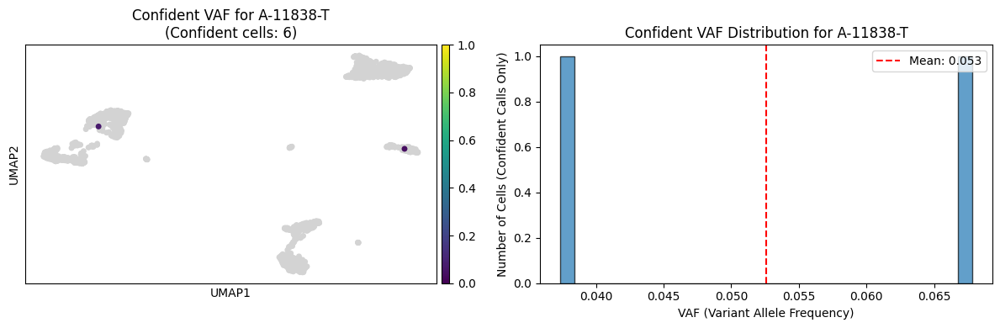

Variant A-11838-T (Index 4):
  Confident cells detected: 6
  Mean coverage: 17.2
  Total cells: 1212
  Confident calls: [False False False ... False False False]
  Confident non-zero calls: 2
  Mean confident VAF: 0.053
  Confident VAF range: 0.037 - 0.068
---


In [ ]:
# Plot confident variants with UMAP and VAF distribution, my code
import matplotlib.pyplot as plt
import numpy as np

# Get confident variants (those with at least one cell having confident detection)
confident_variants = mgatk.uns['variant_summary'][mgatk.uns['variant_summary']['n_cells_conf_detected'] > 0]

print(f"Plotting first 5 confident variants out of {len(confident_variants)} total confident variants")

# Get the variant names list
variant_names = mgatk.uns['variant_names']

for i, variant_idx in enumerate(confident_variants.index[:5]):  # Plot top 5 confident variants
    # variant_idx is already the integer index we need
    variant_name = variant_names[variant_idx]  # Get the actual variant name string
    
    print(f"Processing variant {i+1}: Index {variant_idx}, Name: {variant_name}")
    
    # Get VAF and confident matrices
    vaf_matrix = mgatk.obsm['variant_vaf']
    confident_matrix = mgatk.obsm['variant_confident']
    
    # Extract VAF and confidence for this specific variant using the integer index
    vaf_values = vaf_matrix[:, variant_idx]
    confident_calls = confident_matrix[:, variant_idx]
    
    # Filter for confident calls AND non-zero VAF
    confident_and_nonzero_mask = confident_calls & (vaf_values > 0)
    
    if not confident_and_nonzero_mask.any():
        print(f"No confident non-zero calls for variant {variant_name}")
        continue
    
    # Get filtered VAF values
    filtered_vaf_values = vaf_values[confident_and_nonzero_mask]
    
    # Create a temporary column for plotting (confident calls only)
    temp_vaf_col = np.zeros(len(mgatk.obs))
    temp_vaf_col[confident_and_nonzero_mask] = filtered_vaf_values
    # Set non-confident or zero calls to NaN for proper plotting
    temp_vaf_col[~confident_and_nonzero_mask] = np.nan
    
    # Add temporary column to obs for plotting
    mgatk.obs[f'temp_vaf_{variant_idx}'] = temp_vaf_col
    
    # Create figure with two subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    
    # UMAP plot (only confident calls will be colored)
    sc.pl.umap(mgatk, color=f'temp_vaf_{variant_idx}', cmap="viridis", vmin=0, vmax=1, 
               title=f"Confident VAF for {variant_name}\n(Confident cells: {confident_variants.loc[variant_idx, 'n_cells_conf_detected']})", 
               ax=ax1, show=False, na_color='lightgray')
    
    # Histogram of confident VAF values only
    ax2.hist(filtered_vaf_values, bins=30, alpha=0.7, edgecolor='black')
    ax2.set_xlabel('VAF (Variant Allele Frequency)')
    ax2.set_ylabel('Number of Cells (Confident Calls Only)')
    ax2.set_title(f'Confident VAF Distribution for {variant_name}')
    ax2.axvline(filtered_vaf_values.mean(), color='red', linestyle='--', 
                label=f'Mean: {filtered_vaf_values.mean():.3f}')
    ax2.legend()
    
    plt.tight_layout()
    plt.show()
    
    # Print summary statistics
    total_cells = len(mgatk.obs)
    confident_cells = confident_calls.sum()
    confident_nonzero_cells = len(filtered_vaf_values)
    
    print(f"Variant {variant_name} (Index {variant_idx}):")
    print(f"  Confident cells detected: {confident_variants.loc[variant_idx, 'n_cells_conf_detected']}")
    print(f"  Mean coverage: {confident_variants.loc[variant_idx, 'mean_coverage']:.1f}")
    print(f"  Total cells: {total_cells}")
    print(f"  Confident calls: {confident_calls}")
    print(f"  Confident non-zero calls: {confident_nonzero_cells}")
    print(f"  Mean confident VAF: {filtered_vaf_values.mean():.3f}")
    print(f"  Confident VAF range: {filtered_vaf_values.min():.3f} - {filtered_vaf_values.max():.3f}")
    print("---")
    
    # Clean up temporary column
    mgatk.obs.drop(columns=[f'temp_vaf_{variant_idx}'], inplace=True)

In [ ]:
#save mgatk object 
/mnt/claw-raid/elliot/mgatk_analysis.h5ad

Found 3 enriched variants
   idx       name  in_target  in_other  enrichment
0  264   C-6832-T          4         0         4.0
2  905  G-13676-A          2         0         2.0
1  677  C-16086-T          3         1         1.5


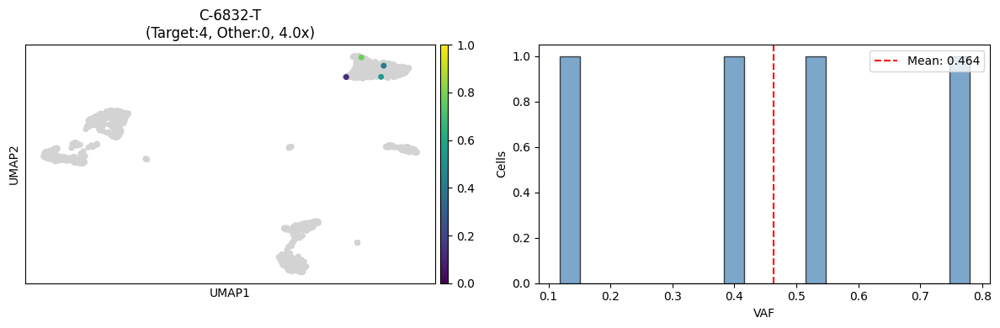

In [80]:
# Find cluster-enriched variants
TARGET_CLUSTERS = ['0']
MIN_CELLS_IN_TARGET = 2
MAX_CELLS_IN_OTHER = 3
MIN_ENRICHMENT = 1.5

import numpy as np
import pandas as pd

_mask = np.isin(mgatk.obs['leiden'].values, TARGET_CLUSTERS)
_enriched = []

for _i in range(len(mgatk.uns['variant_names'])):
    _vaf = mgatk.obsm['variant_vaf'][:, _i]
    _conf = mgatk.obsm['variant_confident'][:, _i]
    _in_target = (_conf & _mask & (_vaf > 0)).sum()
    _in_other = (_conf & ~_mask & (_vaf > 0)).sum()
    _enrich = _in_target / (_in_other + 1)
    
    if _in_target >= MIN_CELLS_IN_TARGET and _in_other <= MAX_CELLS_IN_OTHER and _enrich >= MIN_ENRICHMENT:
        _enriched.append({'idx': _i, 'name': mgatk.uns['variant_names'][_i], 
                         'in_target': _in_target, 'in_other': _in_other, 'enrichment': _enrich})

enriched_df = pd.DataFrame(_enriched).sort_values('enrichment', ascending=False)
print(f"Found {len(enriched_df)} enriched variants")
print(enriched_df)

VARIANT_TO_PLOT = 0

import matplotlib.pyplot as plt
import scanpy as sc

_r = enriched_df.iloc[VARIANT_TO_PLOT]
_m = mgatk.obsm['variant_confident'][:, _r['idx']] & np.isin(mgatk.obs['leiden'].values, TARGET_CLUSTERS) & (mgatk.obsm['variant_vaf'][:, _r['idx']] > 0)
mgatk.obs['_tmp'] = np.where(_m, mgatk.obsm['variant_vaf'][:, _r['idx']], np.nan)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
sc.pl.umap(mgatk, color='_tmp', cmap="viridis", vmin=0, vmax=1,
           title=f"{_r['name']}\n(Target:{int(_r['in_target'])}, Other:{int(_r['in_other'])}, {_r['enrichment']:.1f}x)",
           ax=ax1, show=False, na_color='lightgray')
ax2.hist(mgatk.obs.loc[_m, '_tmp'].dropna(), bins=20, alpha=0.7, edgecolor='black', color='steelblue')
ax2.set_xlabel('VAF')
ax2.set_ylabel('Cells')
ax2.axvline(mgatk.obs.loc[_m, '_tmp'].mean(), color='red', linestyle='--', label=f'Mean: {mgatk.obs.loc[_m, "_tmp"].mean():.3f}')
ax2.legend()
plt.tight_layout()
plt.show()
mgatk.obs.drop(columns=['_tmp'], inplace=True)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Convert to dense array if sparse
coverage_matrix = mgatk.X
if hasattr(coverage_matrix, 'toarray'):
    coverage_matrix = coverage_matrix.toarray()

print(f"Coverage matrix shape: {coverage_matrix.shape}")

# Get cell names
cell_names = mgatk.obs_names

# Create the plot
plt.figure(figsize=(15, 10))

# Plot each cell as a line
for i, cell_name in enumerate(cell_names):
    coverage = coverage_matrix[i, :]
    # Ensure both x and y have same dimensions
    x_positions = range(len(coverage))
    plt.plot(x_positions, coverage, alpha=0.7, linewidth=1, label=cell_name)

plt.xlabel('Position on Mitochondrial Genome')
plt.ylabel('Read Depth')
plt.title('Mitochondrial Genome Coverage for All Cells')
plt.grid(True, alpha=0.3)

# Only show legend if there aren't too many cells
if len(cell_names) <= 20:
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

Coverage matrix shape: (1475, 6062095)


KeyboardInterrupt: 

Variant A-10500-G: Insufficient data points (0)
Variant A-10925-T: Insufficient data points (1)


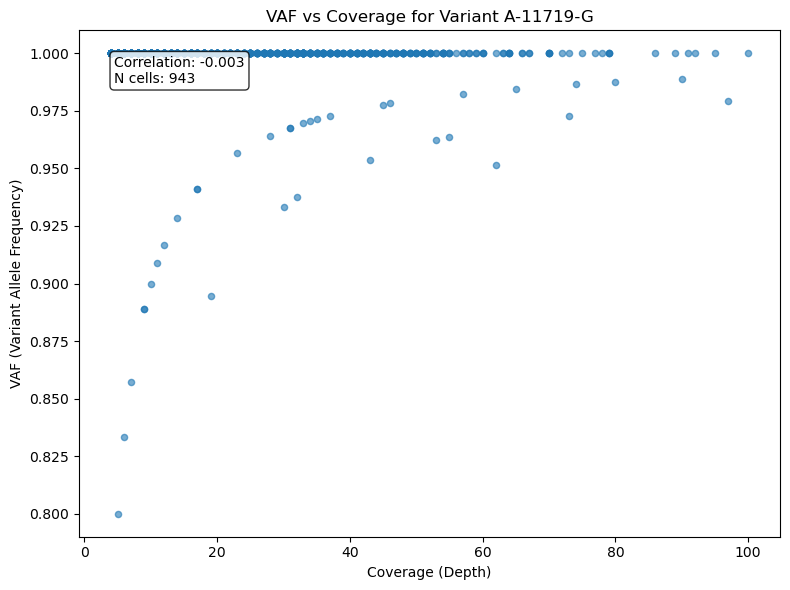

Variant A-11719-G:
  Coverage range: 4.0 - 100.0
  Mean coverage: 21.9
  VAF range: 0.800 - 1.000
  Correlation (VAF vs Coverage): -0.003
---
Variant A-11802-T: Insufficient data points (0)
Variant A-11838-T: Insufficient data points (3)
Variant A-15170-G: Insufficient data points (2)


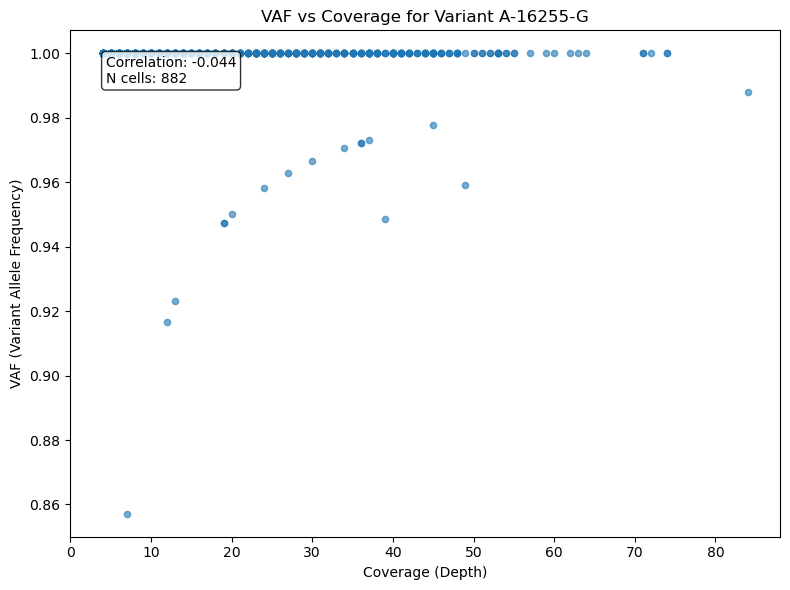

Variant A-16255-G:
  Coverage range: 4.0 - 84.0
  Mean coverage: 18.4
  VAF range: 0.857 - 1.000
  Correlation (VAF vs Coverage): -0.044
---


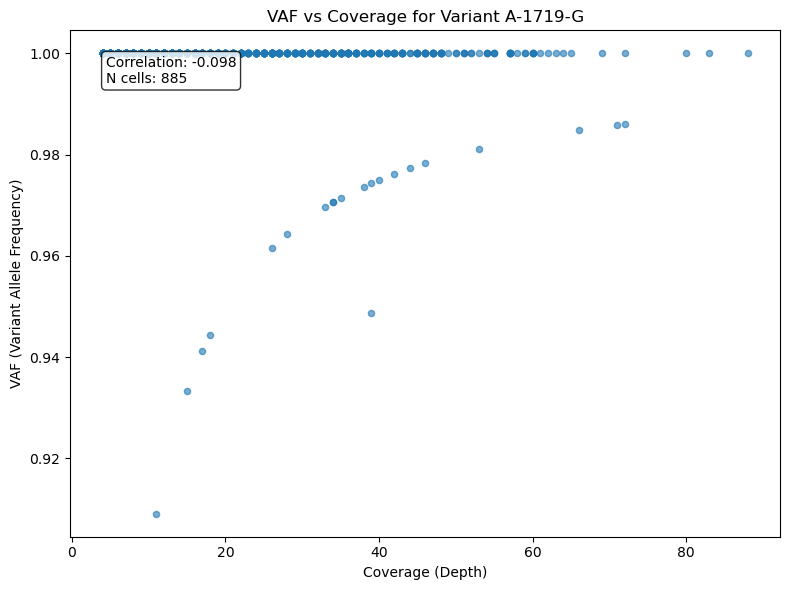

Variant A-1719-G:
  Coverage range: 4.0 - 88.0
  Mean coverage: 19.7
  VAF range: 0.909 - 1.000
  Correlation (VAF vs Coverage): -0.098
---
Variant A-1770-G: Insufficient data points (1)


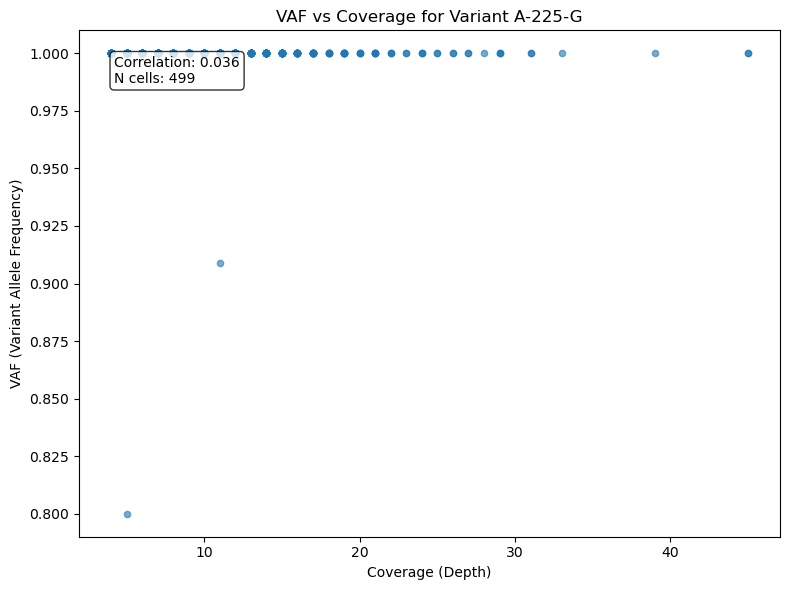

Variant A-225-G:
  Coverage range: 4.0 - 45.0
  Mean coverage: 10.5
  VAF range: 0.800 - 1.000
  Correlation (VAF vs Coverage): 0.036
---
Variant A-2573-G: Insufficient data points (0)
Variant A-2620-g: Insufficient data points (0)
Variant A-4148-G: Insufficient data points (1)
Variant A-5585-G: Insufficient data points (2)
Variant A-64-C: Insufficient data points (0)
Variant A-8206-G: Insufficient data points (0)
Variant A-822-G: Insufficient data points (1)
Variant A-9342-G: Insufficient data points (0)
Variant C-11485-T: Insufficient data points (1)
Variant C-11684-T: Insufficient data points (1)
Variant C-12758-T: Insufficient data points (1)
Variant C-13006-T: Insufficient data points (1)
Variant C-13039-T: Insufficient data points (0)
Variant C-13163-T: Insufficient data points (1)
Variant C-13830-T: Insufficient data points (1)


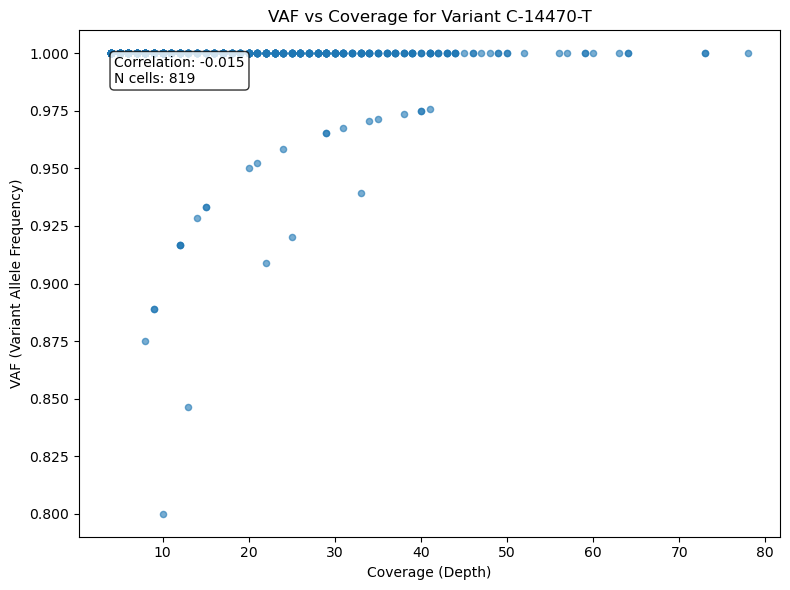

Variant C-14470-T:
  Coverage range: 4.0 - 78.0
  Mean coverage: 16.1
  VAF range: 0.800 - 1.000
  Correlation (VAF vs Coverage): -0.015
---
Variant C-15306-T: Insufficient data points (1)
Variant C-15784-T: Insufficient data points (1)


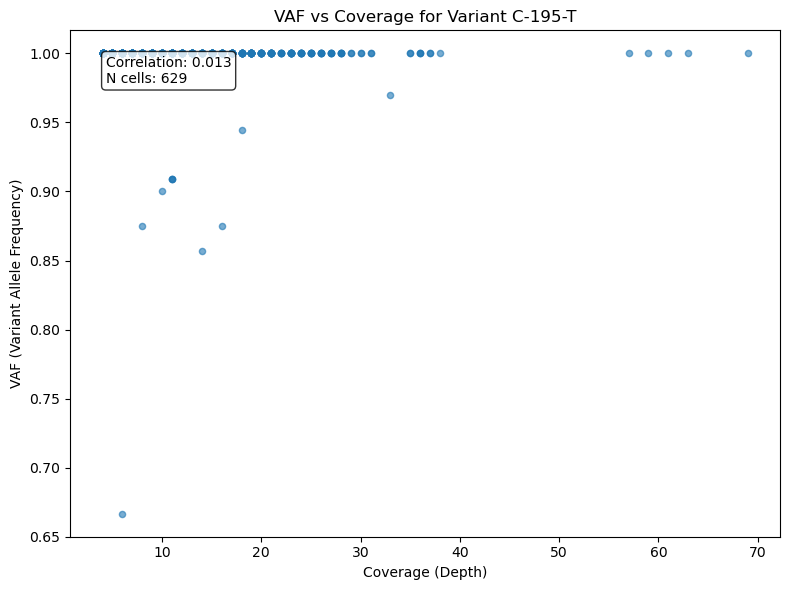

Variant C-195-T:
  Coverage range: 4.0 - 69.0
  Mean coverage: 12.0
  VAF range: 0.667 - 1.000
  Correlation (VAF vs Coverage): 0.013
---
Variant C-3264-t: Insufficient data points (0)


In [9]:
import numpy as np
import matplotlib.pyplot as plt

# Get the matrices and variant info
vaf_matrix = mgatk.obsm['variant_vaf']        # cells x variants
coverage_matrix = mgatk.obsm['variant_coverage']  # cells x variants  
variant_names = mgatk.uns['variant_names']

# For variants in your confident_variants
for i, variant_idx in enumerate(confident_variants.index[:30]):  # Plot top 5 confident variants
    # variant_idx is already the integer index we need
    variant_name = variant_names[variant_idx]  # Get the actual variant name string
    try:
        variant_idx = confident_variants.index[i]  # Get the actual variant index
        # Find the index of this variant in the variant_names list
        variant_idx = variant_names.index(variant_name)
        
        # Get VAF and coverage values for this variant across all cells
        vaf_values = vaf_matrix[:, variant_idx]
        coverage_values = coverage_matrix[:, variant_idx]
        
        # Filter for cells with non-zero VAF and valid coverage
        mask = (vaf_values > 0) & (coverage_values > 0)
        
        if mask.sum() > 5:  # Need at least 5 points for meaningful plot
            filtered_vaf = vaf_values[mask]
            filtered_coverage = coverage_values[mask]
            
            # Create scatter plot
            fig, ax = plt.subplots(1, 1, figsize=(8, 6))
            
            scatter = ax.scatter(filtered_coverage, filtered_vaf, alpha=0.6, s=20)
            ax.set_xlabel('Coverage (Depth)')
            ax.set_ylabel('VAF (Variant Allele Frequency)')
            ax.set_title(f'VAF vs Coverage for Variant {variant_name}')
            
            # Add statistics
            if len(filtered_coverage) > 1 and len(set(filtered_coverage)) > 1:
                correlation = np.corrcoef(filtered_coverage, filtered_vaf)[0, 1]
            else:
                correlation = np.nan
                
            ax.text(0.05, 0.95, f'Correlation: {correlation:.3f}\nN cells: {len(filtered_vaf)}', 
                    transform=ax.transAxes, verticalalignment='top', 
                    bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
            
            plt.tight_layout()
            plt.show()
            
            # Print summary
            print(f"Variant {variant_name}:")
            print(f"  Coverage range: {filtered_coverage.min():.1f} - {filtered_coverage.max():.1f}")
            print(f"  Mean coverage: {filtered_coverage.mean():.1f}")
            print(f"  VAF range: {filtered_vaf.min():.3f} - {filtered_vaf.max():.3f}")
            print(f"  Correlation (VAF vs Coverage): {correlation:.3f}")
            print("---")
        else:
            print(f"Variant {variant_name}: Insufficient data points ({mask.sum()})")
            
    except Exception as e:
        print(f"Error processing variant {variant_name}: {e}")

In [10]:
import numpy as np
import pandas as pd

# Get the matrices
vaf_matrix = mgatk.obsm['variant_vaf'].copy()  # Make a copy to modify
coverage_matrix = mgatk.obsm['variant_coverage']
confident_matrix = mgatk.obsm['variant_confident']
variant_names = mgatk.uns['variant_names']
variant_summary = mgatk.uns['variant_summary']

print(f"Original VAF matrix shape: {vaf_matrix.shape}")
print(f"Non-zero VAF values before filtering: {(vaf_matrix > 0).sum()}")

# Count variants with at least one expressing cell before filtering
variants_with_expression_before = (vaf_matrix > 0).any(axis=0).sum()
print(f"Variants with at least one expressing cell before filtering: {variants_with_expression_before}")

# Create high-quality filtered VAF matrix
high_quality_vaf_matrix = vaf_matrix.copy()
variant_names_list = []
# For each variant, apply cell-level quality filters
for i, variant_name in enumerate(variant_names):
    # Get variant-level statistics
    variant_stats = variant_summary.iloc[i]
    strand_concordance = variant_stats['strand_concordance']
    variance = variant_stats['variance'] 
    mean_coverage = variant_stats['mean_coverage']
    
    # Get cell-level data for this variant
    cell_vaf = vaf_matrix[:, i]
    cell_coverage = coverage_matrix[:, i]
    cell_confident = confident_matrix[:, i]
    
    # Define quality criteria for this variant's cells
    quality_mask = (
        (strand_concordance >= 0.5) &  # Variant-level criterion
        (mean_coverage >= 20) &        # Variant-level criterion
        (cell_vaf >= 0.1)        # Cell-level: VAF > 10%
    )
    
    # Set non-qualifying cells to 0 for this variant
    high_quality_vaf_matrix[~quality_mask, i] = 0

print(f"Non-zero VAF values after high-quality filtering: {(high_quality_vaf_matrix > 0).sum()}")
print(f"Percentage of calls retained: {(high_quality_vaf_matrix > 0).sum() / (vaf_matrix > 0).sum() * 100:.1f}%")

# Count variants with at least one expressing cell after filtering
variants_with_expression_after = (high_quality_vaf_matrix > 0).any(axis=0).sum()
print(f"Variants with at least one expressing cell after filtering: {variants_with_expression_after}")
print(f"Percentage of variants retained: {variants_with_expression_after / variants_with_expression_before * 100:.1f}%")

# Count variants completely eliminated by filtering
variants_eliminated = variants_with_expression_before - variants_with_expression_after
print(f"Variants completely eliminated by filtering: {variants_eliminated}")
print("variants left" , variants_with_expression_after)
# Store the high-quality filtered matrix
mgatk.obsm['variant_vaf_high_quality'] = high_quality_vaf_matrix

# Now you can use this filtered matrix for analysis
print("\nHigh-quality filtered VAF matrix stored in mgatk.obsm['variant_vaf_high_quality']")

Original VAF matrix shape: (1475, 1083)
Non-zero VAF values before filtering: 24046
Variants with at least one expressing cell before filtering: 694
Non-zero VAF values after high-quality filtering: 0
Percentage of calls retained: 0.0%
Variants with at least one expressing cell after filtering: 0
Percentage of variants retained: 0.0%
Variants completely eliminated by filtering: 694
variants left 0

High-quality filtered VAF matrix stored in mgatk.obsm['variant_vaf_high_quality']


In [11]:
# Boolean mask: True for variants with at least one retained (non-zero) cell
high_quality_mask = (high_quality_vaf_matrix > 0).any(axis=0)

# Get corresponding variant names
high_quality_variant_names = np.array(variant_names)[high_quality_mask]
print(high_quality_variant_names)
print(len(high_quality_variant_names))

## Flip variants to match format 
converted = [f"MT-{alt}-{pos}-{ref}" for ref, pos, alt in (v.split('-') for v in high_quality_variant_names)]
print(converted)

required_columns = ["chr", "pos", "ref", "alt"]

genebe_df = pd.DataFrame(
    [v.split('-') for v in converted],
    columns=["chr","ref", "pos", "alt"]
)
genebe_df = genebe_df[required_columns]

print(genebe_df.head())

[]
0
[]
Empty DataFrame
Columns: [chr, pos, ref, alt]
Index: []


In [12]:
import genebe as gnb
annotated_PBMC = gnb.annotate_dataframe_variants(genebe_df,use_ensembl=True,use_refseq=False, genome='hg38', flatten_consequences=False)

ModuleNotFoundError: No module named 'genebe'

In [ ]:
annotated_PBMC.to_csv('PBMC_PostMortem_genebe.csv', index=False)

In [13]:
#Gene classification 
gene_classification = {
    'MT-ND1': 'Complex I',
    'MT-ND2': 'Complex I',
    'MT-ND3': 'Complex I',
    'MT-ND4': 'Complex I',
    'MT-ND4L': 'Complex I',
    'MT-ND5': 'Complex I',
    'MT-ND6': 'Complex I',
    'MT-CO1': 'Complex IV',
    'MT-CO2': 'Complex IV',
    'MT-CO3': 'Complex IV',
    'MT-CYB': 'Complex III',
    'MT-ATP6': 'Complex V',
    'MT-ATP8': 'Complex V',
    'MT-RNR1': 'rRNA',
    'MT-RNR2': 'rRNA',
    'MT-TF': 'tRNA',  
    'MT-TV': 'tRNA',
    'MT-TI': 'tRNA',
    'MT-TL1': 'tRNA',
    'MT-TL2': 'tRNA',
    'MT-TK': 'tRNA',
    'MT-TM': 'tRNA',
    'MT-TP': 'tRNA',
    'MT-TS1': 'tRNA',
    'MT-TS2': 'tRNA',
    'MT-TW': 'tRNA',
    'MT-TA': 'tRNA',
    'MT-TC': 'tRNA',
    'MT-TY': 'tRNA',
    'MT-TH': 'tRNA',
    'MT-TG': 'tRNA',
    'MT-TR': 'tRNA',
    'MT-TN': 'tRNA',
    'MT-TD': 'tRNA',
    'MT-TE': 'tRNA',
    'MT-TQ': 'tRNA'
}

In [14]:
# Create a copy of the dataframe and add the functional classification
annotated_PBMC_classified = annotated_PBMC.copy()
annotated_PBMC_classified['gene_functional_group'] = annotated_PBMC_classified['gene_symbol'].map(gene_classification)

# Handle any genes not in the classification (mark as 'Other')
annotated_PBMC_classified['gene_functional_group'] = annotated_PBMC_classified['gene_functional_group'].fillna('Other')

# Create a 2x2 subplot layout for the pie charts
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(20, 16))  # Increased figure size

# Function to prepare data for pie chart (handle NaN values and limit categories)
def prepare_pie_data(series, max_categories=20):
    # Count values, excluding NaN
    value_counts = series.value_counts(dropna=True)
    
    # If there are more categories than max_categories, group the smallest ones as "Other"
    if len(value_counts) > max_categories:
        top_categories = value_counts.head(max_categories - 1)
        other_count = value_counts.iloc[max_categories - 1:].sum()
        
        # Create new series with "Other" category
        pie_data = top_categories.copy()
        pie_data['Other'] = other_count
    else:
        pie_data = value_counts
    
    return pie_data

# 1. Gene Functional Group pie chart (using your classification)
gene_functional_data = prepare_pie_data(annotated_PBMC_classified['gene_functional_group'])
colors1 = ['#ff9999', '#66b3ff', '#99ff99', '#ffcc99', '#ff99cc', '#c2c2f0']  # Custom colors for complexes

# Option 1: Use pctdistance and labeldistance to control spacing
wedges1, texts1, autotexts1 = ax1.pie(gene_functional_data.values, labels=gene_functional_data.index, 
                                       autopct='%1.1f%%', startangle=90, 
                                       colors=colors1[:len(gene_functional_data)],
                                       pctdistance=0.85,    # Distance of percentage labels from center
                                       labeldistance=1.1)   # Distance of category labels from center

# Adjust text properties to prevent overlap
for autotext in autotexts1:
    autotext.set_fontsize(10)
    autotext.set_fontweight('bold')
    autotext.set_color('white')

for text in texts1:
    text.set_fontsize(11)

ax1.set_title(f'Variants by Mitochondrial Functional Group\n(Total variants: {len(annotated_PBMC)})', 
              fontsize=14, fontweight='bold', pad=20)

# 2. Effect pie chart with adjusted spacing
effect_data = prepare_pie_data(annotated_PBMC['effect'])
wedges2, texts2, autotexts2 = ax2.pie(effect_data.values, labels=effect_data.index, 
                                       autopct='%1.1f%%', startangle=90,
                                       pctdistance=0.85, labeldistance=1.1)

for autotext in autotexts2:
    autotext.set_fontsize(10)
    autotext.set_fontweight('bold')
    autotext.set_color('white')

for text in texts2:
    text.set_fontsize(11)

ax2.set_title(f'Variants by Effect\n(Total variants: {len(annotated_PBMC)})', 
              fontsize=14, fontweight='bold', pad=20)

# 3. ACMG Classification pie chart
acmg_data = prepare_pie_data(annotated_PBMC['acmg_classification'])
if len(acmg_data) > 0:
    wedges3, texts3, autotexts3 = ax3.pie(acmg_data.values, labels=acmg_data.index, 
                                           autopct='%1.1f%%', startangle=90,
                                           pctdistance=0.85, labeldistance=1.1)
    
    for autotext in autotexts3:
        autotext.set_fontsize(10)
        autotext.set_fontweight('bold')
        autotext.set_color('white')
    
    for text in texts3:
        text.set_fontsize(11)
    
    ax3.set_title(f'Variants by ACMG Classification\n(Total classified: {acmg_data.sum()})', 
                  fontsize=14, fontweight='bold', pad=20)
else:
    ax3.text(0.5, 0.5, 'No ACMG Classifications\nAvailable', ha='center', va='center', fontsize=12)
    ax3.set_title('ACMG Classification', fontsize=14, fontweight='bold', pad=20)

# 4. ClinVar Classification pie chart
clinvar_data = prepare_pie_data(annotated_PBMC['clinvar_classification'])
if len(clinvar_data) > 0:
    wedges4, texts4, autotexts4 = ax4.pie(clinvar_data.values, labels=clinvar_data.index, 
                                           autopct='%1.1f%%', startangle=90,
                                           pctdistance=0.85, labeldistance=1.1)
    
    for autotext in autotexts4:
        autotext.set_fontsize(10)
        autotext.set_fontweight('bold')
        autotext.set_color('white')
    
    for text in texts4:
        text.set_fontsize(11)
    
    ax4.set_title(f'Variants by ClinVar Classification\n(Total classified: {clinvar_data.sum()})', 
                  fontsize=14, fontweight='bold', pad=20)
else:
    ax4.text(0.5, 0.5, 'No ClinVar Classifications\nAvailable', ha='center', va='center', fontsize=12)
    ax4.set_title('ClinVar Classification', fontsize=14, fontweight='bold', pad=20)

plt.tight_layout(pad=3.0)  # Add more padding between subplots
plt.show()

# Print summary statistics for each category
print("=== SUMMARY STATISTICS ===")
print(f"\n1. Mitochondrial Functional Group Distribution:")
functional_summary = annotated_PBMC_classified['gene_functional_group'].value_counts(dropna=True)
print(f"   Total functional groups represented: {len(functional_summary)}")
print(f"   Most common functional group: {functional_summary.index[0]} ({functional_summary.iloc[0]} variants)")
print(f"   All functional groups:")
for group, count in functional_summary.items():
    print(f"      {group}: {count} variants ({count/len(annotated_PBMC)*100:.1f}%)")

print(f"\n2. Individual Gene Symbol Distribution:")
gene_summary = annotated_PBMC['gene_symbol'].value_counts(dropna=True)
print(f"   Total genes represented: {len(gene_summary)}")
print(f"   Most common gene: {gene_summary.index[0]} ({gene_summary.iloc[0]} variants)")
print(f"   Top 10 genes:")
for i, (gene, count) in enumerate(gene_summary.head(10).items()):
    functional_group = gene_classification.get(gene, 'Other')
    print(f"      {i+1}. {gene} ({functional_group}): {count} variants ({count/len(annotated_PBMC)*100:.1f}%)")

print(f"\n3. Effect Distribution:")
effect_summary = annotated_PBMC['effect'].value_counts(dropna=True)
print(f"   Total effect types: {len(effect_summary)}")
if len(effect_summary) > 0:
    print(f"   Most common effect: {effect_summary.index[0]} ({effect_summary.iloc[0]} variants)")
    print(f"   All effects:")
    for effect, count in effect_summary.items():
        print(f"      {effect}: {count} variants ({count/len(annotated_PBMC)*100:.1f}%)")

acmg_summary = annotated_PBMC['acmg_classification'].value_counts(dropna=True)
print(f"\n4. ACMG Classification Distribution:")
print(f"   Total ACMG classified variants: {annotated_PBMC['acmg_classification'].notna().sum()}")
print(f"   Unclassified variants: {annotated_PBMC['acmg_classification'].isna().sum()}")
for classification, count in acmg_summary.items():
    print(f"      {classification}: {count} variants")

print(f"\n5. ClinVar Classification Distribution:")
clinvar_summary = annotated_PBMC['clinvar_classification'].value_counts(dropna=True)
print(f"   Total ClinVar classified variants: {annotated_PBMC['clinvar_classification'].notna().sum()}")
print(f"   Unclassified variants: {annotated_PBMC['clinvar_classification'].isna().sum()}")
if len(clinvar_summary) > 0:
    for classification, count in clinvar_summary.items():
        print(f"      {classification}: {count} variants")

NameError: name 'annotated_PBMC' is not defined

In [ ]:
## Import mitoTIP dataframe to look at tRNA variants only 
mitoTIP = pd.read_csv('/Users/lucascortes/Library/CloudStorage/OneDrive-Personal/Documents/Work/Pickett/ATAC-Seq/Usefull_Stuff/mitotip_scores.txt', sep='\t')
mitoTIP.head(20)

,Position,rCRS,Alt,MitoTIP_Score,Quartile,Count,Percentage,Mitomap_Status
0,577,G,:,20.3833,Q1,0,0.0,Absent
1,577,G,A,17.7500,Q1,0,0.0,Absent
2,577,G,C,17.7500,Q1,0,0.0,Absent
3,577,G,T,17.7500,Q1,0,0.0,Absent
4,578,T,:,18.6851,Q1,0,0.0,Absent
5,578,T,A,18.6851,Q1,0,0.0,Absent
6,578,T,C,16.6004,Q1,0,0.0,Absent
7,578,T,G,18.6851,Q1,0,0.0,Absent
8,579,T,:,17.6526,Q1,0,0.0,Absent
9,579,T,A,17.6526,Q1,0,0.0,Absent


In [ ]:
## Dataframe containing tRNA variants likely or poissbly pathogenic as per mitoTIP scoring method 
mitoTIP_filtered = mitoTIP[(mitoTIP['Quartile'] == 'Q2') | (mitoTIP['Quartile'] == 'Q1')]
mitoTIP_filtered.head(20)

Empty DataFrame
Columns: [Position, rCRS, Alt, MitoTIP_Score, Quartile, Count, Percentage, Mitomap_Status]
Index: []


Finding variants enriched in cluster(s): ['1']
Criteria:
  - Min confident cells in target: 2
  - Max confident cells in other clusters: 3
  - Min mean VAF in target: 0.01
  - Min enrichment ratio: 1.5
Cells in target cluster(s): 261
Cells in other clusters: 951

✅ Found 1 enriched variants!

Top variants:
 variant_idx variant_name  confident_in_target  confident_in_other  mean_vaf_target  enrichment
         804     C-7660-T                    2                   0             0.92         2.0

Plotting top 1 enriched variants


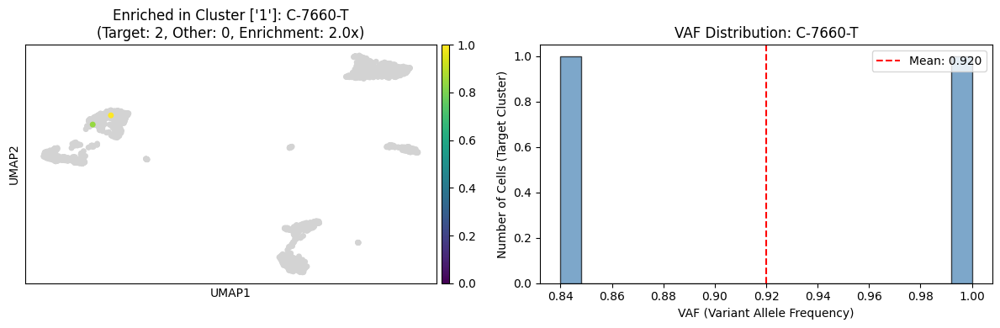


C-7660-T:
  Confident in target: 2
  Confident in other: 0
  Mean VAF in target: 0.920
  Enrichment: 2.00x

Full results stored in variable: enriched_df
You can export with: enriched_df.to_csv('enriched_variants_cluster1.csv', index=False)


In [70]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# ============================================
# EDIT THESE PARAMETERS
# ============================================
TARGET_CLUSTERS = ['1']  # Edit this: clusters to look for unique variants in
MIN_CONFIDENT_CELLS = 2  # Lowered to 2 (most variants are in 1-2 cells)
MAX_CONFIDENT_IN_OTHER = 3  # Allow some presence in other clusters
MIN_MEAN_VAF_IN_TARGET = 0.01  # Minimum mean VAF in target cluster(s)
TOP_N_VARIANTS = 10  # Number of top variants to plot
MIN_ENRICHMENT = 1.5  # Minimum enrichment ratio (target/other)

# ============================================
# ANALYSIS CODE
# ============================================

print(f"Finding variants enriched in cluster(s): {TARGET_CLUSTERS}")
print(f"Criteria:")
print(f"  - Min confident cells in target: {MIN_CONFIDENT_CELLS}")
print(f"  - Max confident cells in other clusters: {MAX_CONFIDENT_IN_OTHER}")
print(f"  - Min mean VAF in target: {MIN_MEAN_VAF_IN_TARGET}")
print(f"  - Min enrichment ratio: {MIN_ENRICHMENT}")
print("="*60)

# Get cluster assignments
cluster_col = 'leiden'
clusters = mgatk.obs[cluster_col].values

# Create masks for target and other clusters
target_mask = np.isin(clusters, TARGET_CLUSTERS)
other_mask = ~target_mask

print(f"Cells in target cluster(s): {target_mask.sum()}")
print(f"Cells in other clusters: {other_mask.sum()}")

# Get matrices
vaf_matrix = mgatk.obsm['variant_vaf']
confident_matrix = mgatk.obsm['variant_confident']
variant_names = mgatk.uns['variant_names']

# Analyze each variant
enriched_variants = []

for variant_idx in range(len(variant_names)):
    variant_name = variant_names[variant_idx]
    
    # Get VAF and confidence for this variant
    vaf_values = vaf_matrix[:, variant_idx]
    confident_calls = confident_matrix[:, variant_idx]
    
    # Count confident cells in target vs other clusters
    confident_in_target = (confident_calls & target_mask & (vaf_values > 0)).sum()
    confident_in_other = (confident_calls & other_mask & (vaf_values > 0)).sum()
    
    # Calculate enrichment
    enrichment = confident_in_target / (confident_in_other + 1)
    
    # Calculate mean VAF in target cluster (only confident, non-zero calls)
    target_confident_nonzero = confident_calls & target_mask & (vaf_values > 0)
    if target_confident_nonzero.any():
        mean_vaf_target = vaf_values[target_confident_nonzero].mean()
    else:
        mean_vaf_target = 0
    
    # Check if variant meets enrichment criteria
    if (confident_in_target >= MIN_CONFIDENT_CELLS and 
        confident_in_other <= MAX_CONFIDENT_IN_OTHER and
        mean_vaf_target >= MIN_MEAN_VAF_IN_TARGET and
        enrichment >= MIN_ENRICHMENT):
        
        enriched_variants.append({
            'variant_idx': variant_idx,
            'variant_name': variant_name,
            'confident_in_target': confident_in_target,
            'confident_in_other': confident_in_other,
            'mean_vaf_target': mean_vaf_target,
            'enrichment': enrichment
        })

# Convert to DataFrame and sort
enriched_df = pd.DataFrame(enriched_variants)

if len(enriched_df) == 0:
    print("\n❌ No variants found matching the criteria!")
    print("Try relaxing the parameters (e.g., lower MIN_CONFIDENT_CELLS, increase MAX_CONFIDENT_IN_OTHER, or lower MIN_ENRICHMENT)")
else:
    # Sort by enrichment
    enriched_df = enriched_df.sort_values('enrichment', ascending=False)
    
    print(f"\n✅ Found {len(enriched_df)} enriched variants!")
    print("\nTop variants:")
    print(enriched_df.head(TOP_N_VARIANTS).to_string(index=False))
    
    # ============================================
    # PLOT TOP VARIANTS
    # ============================================
    
    n_to_plot = min(TOP_N_VARIANTS, len(enriched_df))
    print(f"\n{'='*60}")
    print(f"Plotting top {n_to_plot} enriched variants")
    print('='*60)
    
    for i, row in enriched_df.head(n_to_plot).iterrows():
        variant_idx = row['variant_idx']
        variant_name = row['variant_name']
        
        # Get VAF and confidence
        vaf_values = vaf_matrix[:, variant_idx]
        confident_calls = confident_matrix[:, variant_idx]
        
        # Filter for confident non-zero calls in TARGET cluster
        target_confident_mask = confident_calls & target_mask & (vaf_values > 0)
        filtered_vaf_values = vaf_values[target_confident_mask]
        
        if not target_confident_mask.any():
            continue
        
        # Create temporary column for plotting
        temp_vaf_col = np.full(len(mgatk.obs), np.nan)
        temp_vaf_col[target_confident_mask] = filtered_vaf_values
        mgatk.obs[f'temp_vaf_{variant_idx}'] = temp_vaf_col
        
        # Create figure
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
        
        # UMAP plot
        import scanpy as sc
        sc.pl.umap(mgatk, color=f'temp_vaf_{variant_idx}', cmap="viridis", vmin=0, vmax=1,
                   title=f"Enriched in Cluster {TARGET_CLUSTERS}: {variant_name}\n" + 
                         f"(Target: {int(row['confident_in_target'])}, Other: {int(row['confident_in_other'])}, Enrichment: {row['enrichment']:.1f}x)",
                   ax=ax1, show=False, na_color='lightgray')
        
        # Histogram
        ax2.hist(filtered_vaf_values, bins=20, alpha=0.7, edgecolor='black', color='steelblue')
        ax2.set_xlabel('VAF (Variant Allele Frequency)')
        ax2.set_ylabel('Number of Cells (Target Cluster)')
        ax2.set_title(f'VAF Distribution: {variant_name}')
        ax2.axvline(filtered_vaf_values.mean(), color='red', linestyle='--',
                    label=f'Mean: {filtered_vaf_values.mean():.3f}')
        ax2.legend()
        
        plt.tight_layout()
        plt.show()
        
        print(f"\n{variant_name}:")
        print(f"  Confident in target: {int(row['confident_in_target'])}")
        print(f"  Confident in other: {int(row['confident_in_other'])}")
        print(f"  Mean VAF in target: {row['mean_vaf_target']:.3f}")
        print(f"  Enrichment: {row['enrichment']:.2f}x")
        
        # Clean up
        mgatk.obs.drop(columns=[f'temp_vaf_{variant_idx}'], inplace=True)
    
    # ============================================
    # EXPORT RESULTS
    # ============================================
    print(f"\n{'='*60}")
    print("Full results stored in variable: enriched_df")
    print("You can export with: enriched_df.to_csv('enriched_variants_cluster1.csv', index=False)")